# Современные методы анализа данных и машинного обучения, БИ

## НИУ ВШЭ, 2025-26 учебный год

### Домашнее задание №5. Анализ и прогнозирование временных рядов

Задание выполнил(а):
Романцов Александр

### Общая информация

__Дата выдачи:__ 21.05.2026

__Дедлайн:__ 04:00 07.06.2026

### Оценивание и штрафы

Количество баллов за каждую задачу данного домашнего задания указано рядом с условием задачи.

Общая максимальная сумма баллов по всем задачам составляет: 138 баллов и 73 бонусных балла.

Оценка за домашнее задание вычисляется по следующей формуле:

$$
s_{\text{ts}} \times 10/138 ,
$$

где $s_{\text{ts}}$  — количество баллов, которое вы набрали в сумме по всем задачам.

За сдачу задания позже срока на итоговую оценку за задание накладывается штраф в размере 1 **вторичный** балл в день, но  задержка не может быть больше **трех дней**.

**Важно:** В этом домашнем задании предусмотрено множество заданий, за которые можно получить бонусные баллы. Бонусные баллы прибавляются к обычным баллам, и может выйти так, что ваша итоговая оценка станет больше 10. В таком случае именно это и будет являться вашей оценкой. То есть за это ДЗ **можно** получить больше 10.

Итого, исходя из общей суммы баллов, максимальная оценка за ДЗ составляет **15,28** (!!)

*Примечание. Домашнее задание из-за своего объема весит как три домашних задания в итоговой формуле оценки.*

__Внимание!__ Домашнее задание выполняется самостоятельно. Не допускается помощь в решении домашнего задания от однокурсников или третьих лиц. «Похожие» решения считаются плагиатом, и все задействованные студенты — в том числе и те, у кого списали, — не могут получить за него больше 0 баллов.

Использование в решении домашнего задания генеративных моделей (ChatGPT и так далее) допускается исключительно в рамках справочной и образовательной информации. Любые другие случаи применения средств ИИ — например, для автоматической генерации кода по заданию — считаются плагиатом, и такое домашнее задание оценивается в 0 баллов.

В случае если в решении используются подходы, функции или формулы, не разбиравшиеся на лекциях и семинарах, — необходимо обязательное указание источника: ссылка на документацию, статью, другой ресурс. При отсутствии оформления источников задание может быть полностью обнулено.

### Формат сдачи

Загрузка файлов с решениями происходит в системе [Anytask](https://anytask.org/). Необходимо загружать файл с расширением .ipynb (питоновский ноутбук)

Инвайт для подключения к странице курса в системе — указан для каждой группы в нашем телеграмм-канале.

### О задании

Проблемой коронавируса COVID-19, беспокоившего весь мир на протяжении нескольких лет, занимались ученые по всему миру. В стороне не осталось и комьюнити Data scientist-ов, которые не только пытались в момент пандемии предсказать ее развитие, но также старались помочь определить наиболее значимые факторы, влияющие на распространение заразы. Например, на небезызвестном [Kaggle](https://www.kaggle.com/tags/covid19).

В данном домашнем задании вы попрактикуетесь в анализе и прогнозировании временных рядов, работая с ежедневно обновлявшимися во время пандемии данными из [репозитория](https://github.com/datasets/covid-19), а конкретно [time-series-19-covid-combined.csv](https://github.com/datasets/covid-19/blob/master/data/time-series-19-covid-combined.csv).

Вам предстоит изучить имеющиеся данные, попробовать найти некоторые закономерности и ответить на вопросы. Ниже представлены задания как исследовательского характера, где приветствуется инициативность, так и чисто тренировочного характера — где необходимо использовать изученные на семинаре инструменты для работы с временными рядами. Не забывайте сопровождать ваш код развернутыми комментариями и выводами. Чем их больше и чем они качественнее, тем лучше и тем выше вероятность получения максимальной оценки за домашнее задание.

In [2]:
!pip install sktime
!pip install orbit-ml
!pip install prophet

  Using cached orbit_ml-1.1.5.1.tar.gz (448 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached arviz-1.1.0-py3-none-any.whl.metadata (7.6 kB)
  Using cached pyro_ppl-1.9.1-py3-none-any.whl.metadata (7.8 kB)
  Using cached torch-2.12.0-cp312-cp312-manylinux_2_28_x86_64.whl.metadata (31 kB)
  Using cached opt_einsum-3.4.0-py3-none-any.whl.metadata (6.3 kB)
  Using cached pyro_api-0.1.2-py3-none-any.whl.metadata (2.5 kB)
  Using cached setuptools-81.0.0-py3-none-any.whl.metadata (6.6 kB)
  Using cached sympy-1.14.0-py3-none-any.whl.metadata (12 kB)
  Using cached networkx-3.6.1-py3-none-any.whl.metadata (6.8 kB)
  Using cached fsspec-2026.4.0-py3-none-any.whl.metadata (10 kB)
  Using cached cuda_toolkit-13.0.2-py2.py3-none-any.whl.metadata (9.4 kB)
  Using cached nvidia_cublas-13.1.1.3-py3-none-manylinux_2_27_x86_64.whl.metadata (1.8 kB)
  Using cached cuda_bindings-13.3.1-cp312-cp312-ma

In [3]:
import os
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import statsmodels.api as sma
import statsmodels.formula.api as smfa
import statsmodels.tsa.stattools as smstt
%matplotlib inline

pd.options.display.float_format = '{:.2f}'.format

plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (15, 15)

In [4]:
df = pd.read_csv('time-series-19-covid-combined.csv')
df.tail()

,Date,Country/Region,Province/State,Confirmed,Recovered,Deaths
231739,2022-04-12,Zimbabwe,NaN,247094,0.00,5460
231740,2022-04-13,Zimbabwe,NaN,247160,0.00,5460
231741,2022-04-14,Zimbabwe,NaN,247208,0.00,5462
231742,2022-04-15,Zimbabwe,NaN,247237,0.00,5462
231743,2022-04-16,Zimbabwe,NaN,247237,0.00,5462


## Раздел 1. Первичный анализ временных рядов (45 баллов и 15 бонусных баллов)

#### 1.1. (5 баллов)

Определите границы исследуемого периода, количество заболевших, погибших, выздоровевших. Отобразите на карте распространение болезни. Что вы видите? Какие выводы можно сделать?

In [5]:
min_date = df['Date'].min()
max_date = df['Date'].max()

print(f'данные лежит в периоде с {min_date} по {max_date}')

данные лежит в периоде с 2020-01-22 по 2022-04-16


In [6]:
last = df.sort_values('Date').groupby('Country/Region').last()
count_desiase = last['Confirmed'].sum()
count_death = last['Deaths'].sum()
count_recovered = last['Recovered'].sum()

print(f'Всего заболевших на конец периода: {int(count_desiase)}')
print(f'Всего погибших на конец периода: {int(count_death)}')
print(f'Всего выздоровевших на конец периода: {int(count_recovered)}')

Всего заболевших на конец периода: 435805490
Всего погибших на конец периода: 5799495
Всего выздоровевших на конец периода: 0


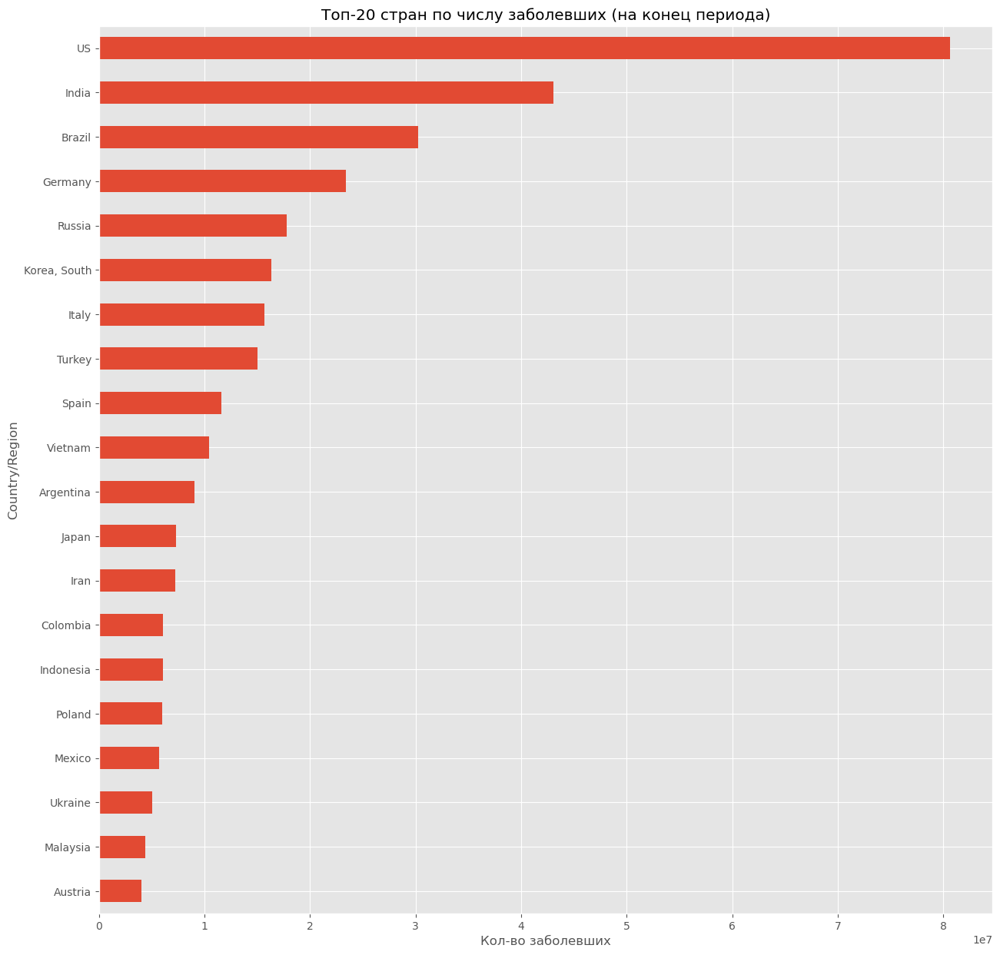

In [7]:
top = last.sort_values('Confirmed', ascending=False).head(20)
top['Confirmed'].sort_values().plot(kind='barh')
plt.title('Топ-20 стран по числу заболевших (на конец периода)')
plt.xlabel('Кол-во заболевших')
plt.show()

Мы видим, что данные дляться почти 2 года и число заболевших гораздо меньше, чем число погибших. Едиснвтенное, что на последнюю дату в датасете у нас стоит 0 выздоровевших. По странам пандемия охватила почти все страны (это мы и так из опыта понимаем), но удивительно, что США на 1 месте, а Китая в топ-20 нет)

#### 1.2. (5 баллов)

Определите количество стран, которые подтвердили случаи заражения
- на 1 марта 2020 года
- на 1 июня 2020 года
- на 1 октября 2020 года
- на 1 января 2021 года
- на 1 января 2022 года
- на момент окончания исследуемого периода.

Визуализируйте рост количества стран, подтвердивших случаи заражения
- по дням
- по неделям
- по месяцам.


Какие выводы можно сделать из этих графиков?

  *Примечание. В анализе временных рядов иногда необходимо изменить частоту дискретизации (Resampling). Такая операция может понадобиться, когда исходных данных недостаточно или их, наоборот, слишком много; когда может не устраивать имеющаяся частота или просто хочется посмотреть на данные с более общего ракурса.*

  *Различают два вида изменения частоты: повышение (Upsampling) и понижение (Downsampling). При повышении временной ряд пересчитывается с низкой частоты на более высокую (например, от годовой до месячной). В таком случае процесс включает в себя заполнение или интерполяцию появившихся пропусков в данных. При понижении временной ряд передискретизируется с высокой частоты на низкую (например, с еженедельной на месячную). Это включает в себя агрегацию существующих данных.*

In [8]:
date1 = df[(df['Date'] == '2020-03-01') & (df['Confirmed'] > 0)]['Country/Region'].nunique()
date2 = df[(df['Date'] == '2020-06-01') & (df['Confirmed'] > 0)]['Country/Region'].nunique()
date3 = df[(df['Date'] == '2020-10-01') & (df['Confirmed'] > 0)]['Country/Region'].nunique()
date4 = df[(df['Date'] == '2021-01-01') & (df['Confirmed'] > 0)]['Country/Region'].nunique()
date5 = df[(df['Date'] == '2022-01-01') & (df['Confirmed'] > 0)]['Country/Region'].nunique()
date6 = df[(df['Date'] == '2022-04-16') & (df['Confirmed'] > 0)]['Country/Region'].nunique()

print(f'На дату 2020-03-01: {date1}')
print(f'На дату 2020-06-01: {date2}')
print(f'На дату 2020-10-01: {date3}')
print(f'На дату 2021-01-01: {date4}')
print(f'На дату 2022-01-01: {date5}')
print(f'На дату 2022-04-16: {date6}')

На дату 2020-03-01: 67
На дату 2020-06-01: 187
На дату 2020-10-01: 187
На дату 2021-01-01: 191
На дату 2022-01-01: 197
На дату 2022-04-16: 198


https://docs-python.ru/packages/modul-pandas-analiz-dannykh-python/resample-series-dataframe/ 

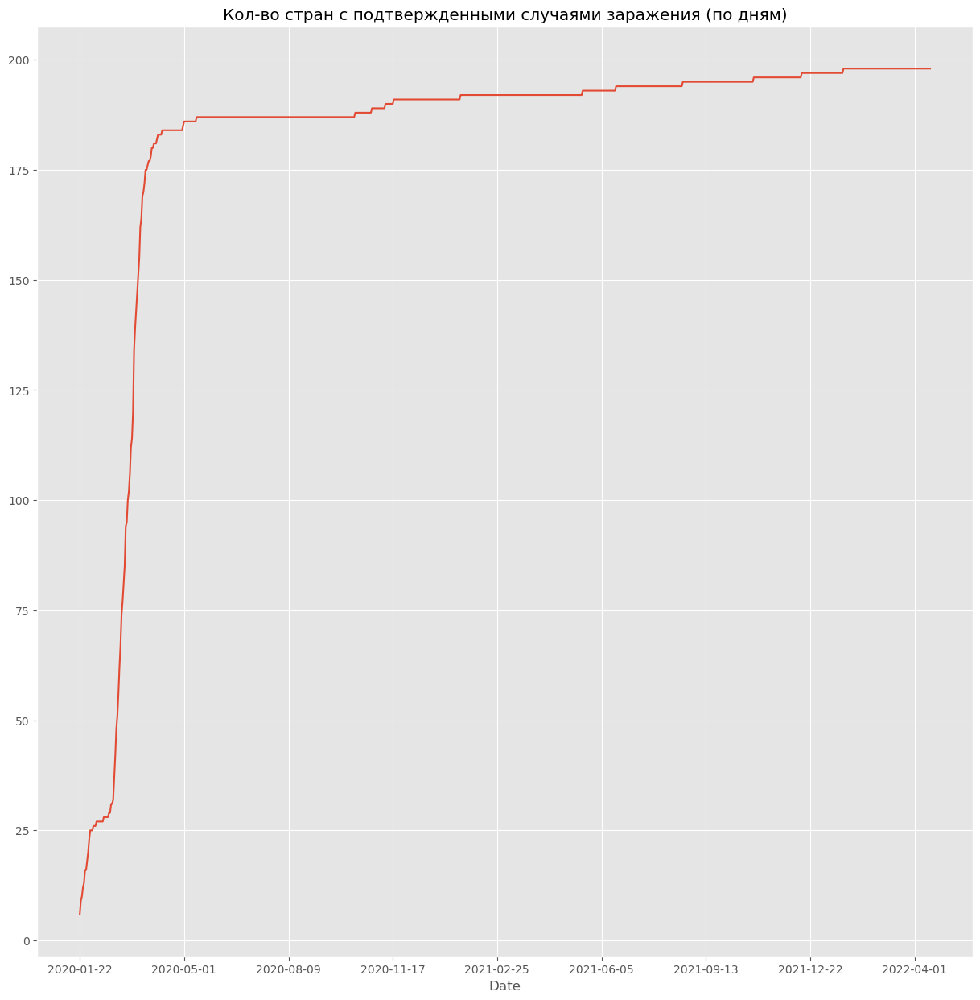

In [9]:
grp_by_date = df[df['Confirmed'] > 0].groupby('Date')['Country/Region'].nunique()

grp_by_date.plot()
plt.title('Кол-во стран с подтвержденными случаями заражения (по дням)')
plt.show()

In [10]:
grp_by_date.reset_index()

,Date,Country/Region
0,2020-01-22,6
1,2020-01-23,9
2,2020-01-24,10
3,2020-01-25,12
4,2020-01-26,13
...,...,...
811,2022-04-12,198
812,2022-04-13,198
813,2022-04-14,198
814,2022-04-15,198


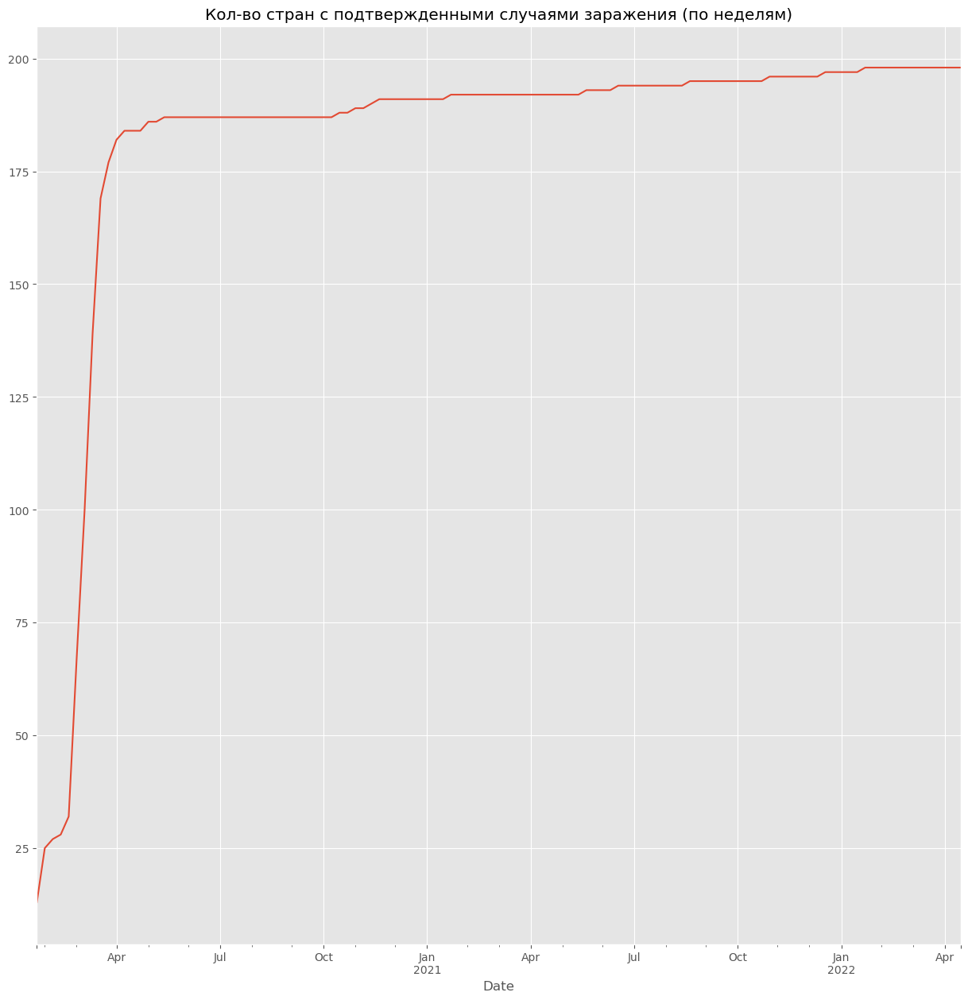

In [11]:
grp_by_date.index = pd.to_datetime(grp_by_date.index)
grp_by_week = grp_by_date.resample('W').last()
grp_by_week.plot()
plt.title('Кол-во стран с подтвержденными случаями заражения (по неделям)')
plt.show()

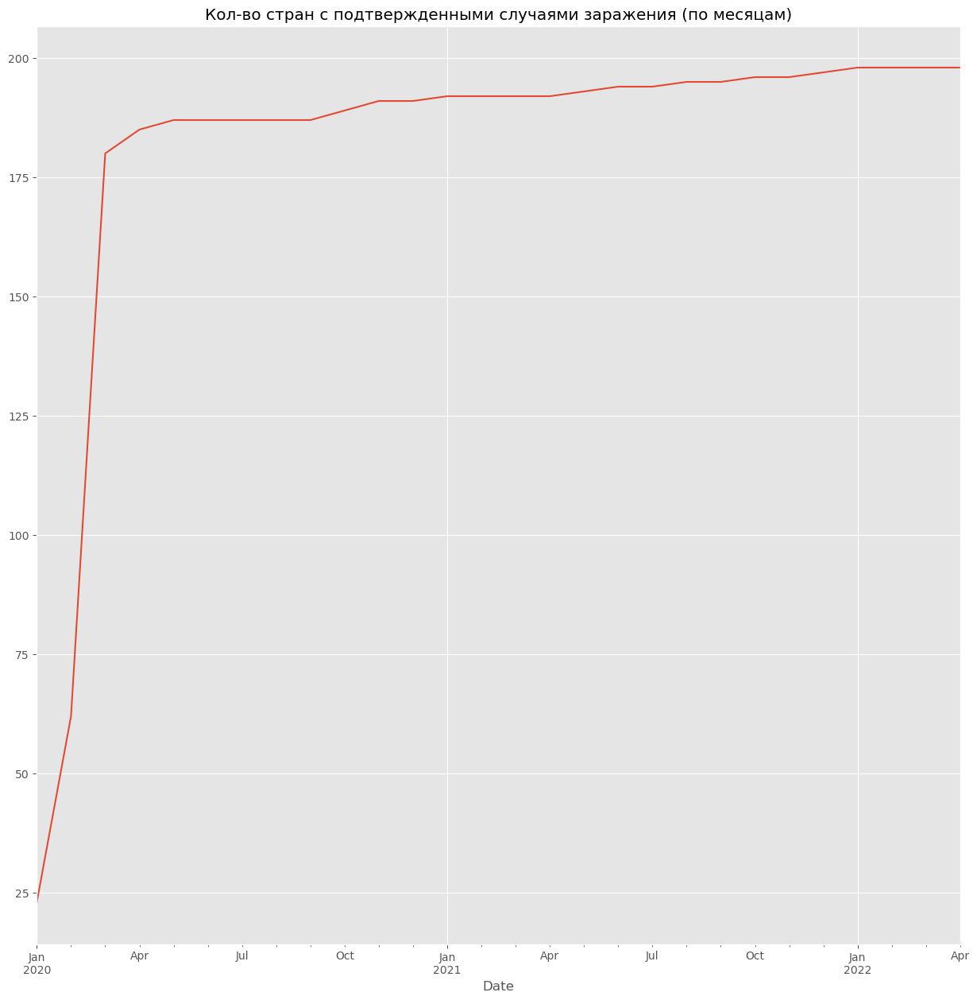

In [12]:
grp_by_month = grp_by_date.resample('M').last()
grp_by_month.plot()
plt.title('Кол-во стран с подтвержденными случаями заражения (по месяцам)')
plt.show()

**Выводы:** Во-первых, когда мы вывели число стран подтвердивших заражение, мы видим динамику и пик стран, которые подтвердили свое заражение пришлось на самую последнюю дату в датасете. Из интересного можно посмотреть как с 1 марта 2020 года у нас резко подскочило число стран, которые подтвердили заболевание + почти 4 месяца число стран подтвердивших заражение не мелялось, то есть произошла некоторая стабилизация распостронения, но потом снова выросло. По графикам, которые мы построили по дням, месяцам и неделям, мы видим, что болезнь довольно быстро распространилась, то есть за первые 2-3 месяца число стран резко увеличилась и потом постепенно мы выходили на стабильный уровень заражения.

#### 1.3. (5 баллов)

Визуализируйте мировые тренды по числу

- заболевших
- погибших
- выздоровевших.

Постройте графики, которые отражают летальность от вируса

- в разных странах
- на разных континентах.

Какие выводы можно сделать?

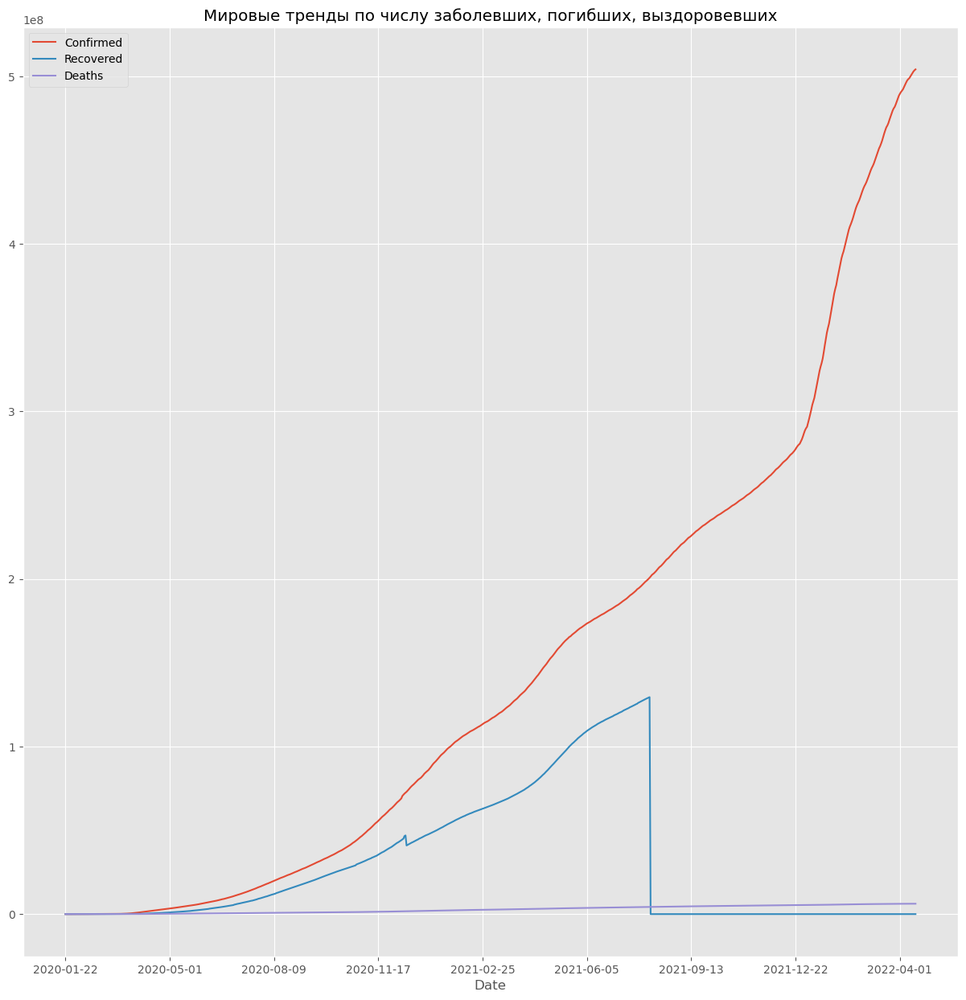

In [13]:
trends = df.groupby('Date')[['Confirmed', 'Recovered', 'Deaths']].sum() #просто суумируем все страны и будет как раз мировой тренд
trends.plot()
plt.title('Мировые тренды по числу заболевших, погибших, выздоровевших')
plt.show()

Летальность от вируса я считал как кол-во смертей деленное на кол-во подтвердивших заболевание

In [14]:
df_last_date = df[df['Date'] == '2022-04-16'].groupby('Country/Region')[['Confirmed', 'Deaths', 'Recovered']].sum()
df_last_date['Deth/conf'] = df_last_date['Deaths'] / df_last_date['Confirmed']
df_last_date.head()

,Confirmed,Deaths,Recovered,Deth/conf
Country/Region,,,,
Afghanistan,178387,7676,0.00,0.04
Albania,274462,3496,0.00,0.01
Algeria,265739,6874,0.00,0.03
Andorra,40709,153,0.00,0.00
Angola,99194,1900,0.00,0.02


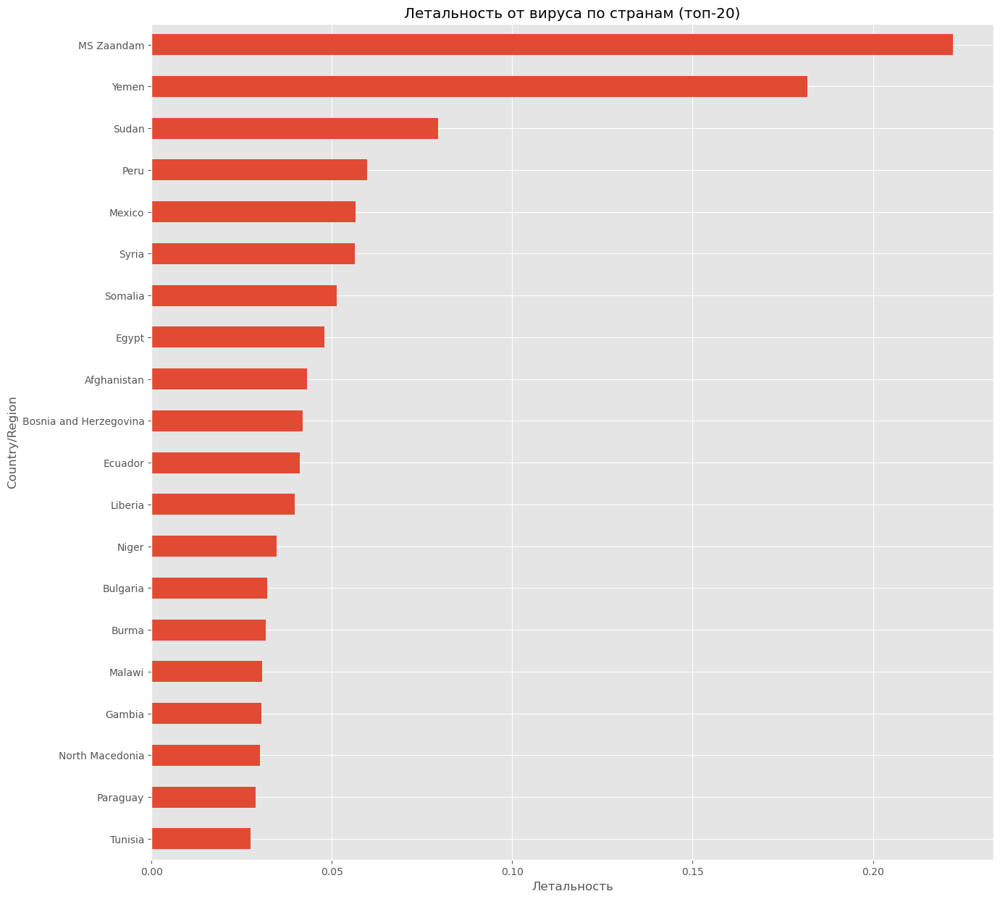

In [15]:
country = df_last_date.sort_values('Deth/conf', ascending=False)['Deth/conf'].head(20)
country.sort_values().plot(kind='barh')
plt.title('Летальность от вируса по странам (топ-20)')
plt.xlabel('Летальность')
plt.show()

In [16]:
df['Country/Region'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antarctica', 'Antigua and Barbuda', 'Argentina', 'Armenia',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana',
       'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia', 'Denmark',
       'Diamond Princess', 'Djibouti', 'Dominica', 'Dominican Republic',
       'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
       'Grenada', 'Gua

Я не нашел открытых данных для сопоставления названия столбца `Country/Region`, но нашел библиотеку pycountry-convert (https://stackoverflow.com/questions/55910004/get-continent-name-from-country-using-pycountry) и там можно получить континенты, но поскольку у нас в названиях иногда проскакивают такие данные: Winter Olympics 2022 или West Bank and Gaza, то их мы не сможем обработать, поэтому я решил применить эту библиотеку чтобы сопоставить, но туда попадают не все данные, к сожалению, можно посмотреть что сможет обработаться и потом ручками дополнить.

In [17]:
pip install pycountry_convert

Note: you may need to restart the kernel to use updated packages.


In [18]:
import pycountry_convert as pcc

continents = {}
for name in df['Country/Region'].unique():
    try:
        code = pcc.country_name_to_country_alpha2(name)
        continents[name] = pcc.country_alpha2_to_continent_code(code)
    except Exception:
        continents[name] = None

In [19]:
df_last_date['Continent'] = df_last_date.index.map(continents)

In [20]:
dont_find = []
for w, continent in continents.items():
    if continent == None:
        dont_find.append(w)

In [21]:
dont_find

['Antarctica',
 'Burma',
 'Congo (Brazzaville)',
 'Congo (Kinshasa)',
 "Cote d'Ivoire",
 'Diamond Princess',
 'Holy See',
 'Korea, South',
 'Kosovo',
 'MS Zaandam',
 'Summer Olympics 2020',
 'Taiwan*',
 'Timor-Leste',
 'US',
 'West Bank and Gaza',
 'Winter Olympics 2022']

16 штук у нас не смэтчилось, что странно туда попало США, Южная Корея и т.д. Но я просто сотавил руками словарь страна - континент, а непонятные вещи просто убрал (например, `Summer Olympics 2020`)

In [22]:
continent_more = {'US': 'NA', 'Korea, South': 'AS', 'Burma': 'AS', 'Timor-Leste': 'AS', 'West Bank and Gaza': 'AS', 'Taiwan*': 'AS', 'Kosovo': 'EU', 'Holy See': 'EU',
             "Cote d'Ivoire": 'AF', 'Congo (Brazzaville)': 'AF', 'Congo (Kinshasa)': 'AF'}

In [23]:
df_last_date

,Confirmed,Deaths,Recovered,Deth/conf,Continent
Country/Region,,,,,
Afghanistan,178387,7676,0.00,0.04,AS
Albania,274462,3496,0.00,0.01,EU
Algeria,265739,6874,0.00,0.03,AF
Andorra,40709,153,0.00,0.00,EU
Angola,99194,1900,0.00,0.02,AF
...,...,...,...,...,...
West Bank and Gaza,656617,5656,0.00,0.01,None
Winter Olympics 2022,535,0,0.00,0.00,None
Yemen,11817,2148,0.00,0.18,AS


In [24]:
continents_new = {}
for name in df['Country/Region'].unique():
    if name in continent_more:  
        continents_new[name] = continent_more[name]
    else:
        try:
            code = pcc.country_name_to_country_alpha2(name)
            continents_new[name] = pcc.country_alpha2_to_continent_code(code)
        except Exception:
            continents_new[name] = None

In [25]:
df_last_date['Continent'] = df_last_date.index.map(continents_new)

In [26]:
df_last_date

,Confirmed,Deaths,Recovered,Deth/conf,Continent
Country/Region,,,,,
Afghanistan,178387,7676,0.00,0.04,AS
Albania,274462,3496,0.00,0.01,EU
Algeria,265739,6874,0.00,0.03,AF
Andorra,40709,153,0.00,0.00,EU
Angola,99194,1900,0.00,0.02,AF
...,...,...,...,...,...
West Bank and Gaza,656617,5656,0.00,0.01,AS
Winter Olympics 2022,535,0,0.00,0.00,None
Yemen,11817,2148,0.00,0.18,AS


Получается, что для определения Континента я брал сначала встроенную библиотеку, потом если она выдавала None, то я уже руками смотрел, что туда попало и обрабатывал, это получилось трудозатратно, так как пришлось каждую штучку руками просматривать и искать ей континент, но оставлять `US` - в качестве `None` континента вообще не хотелось 

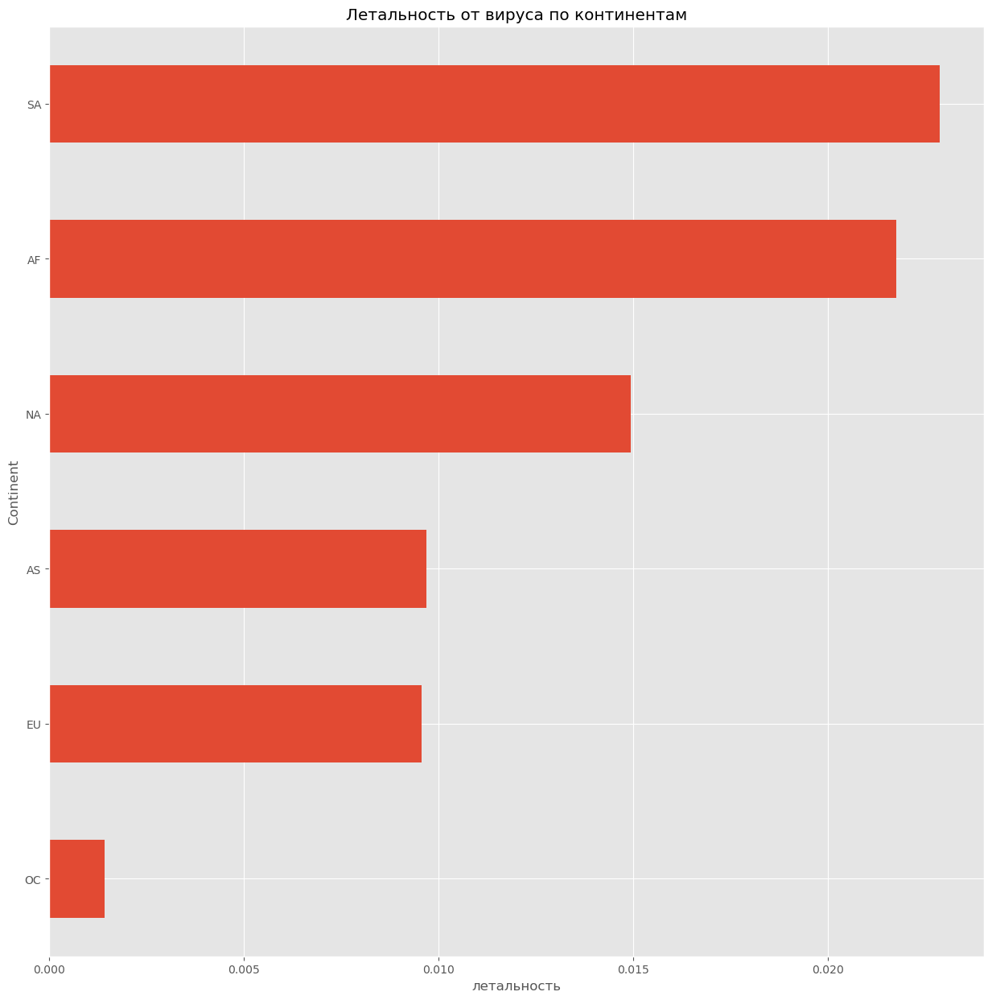

In [27]:
df_last_date = df_last_date.reset_index()

continent = df_last_date.dropna(subset=['Continent']).groupby('Continent')[['Confirmed', 'Deaths']].sum()
continent['Depth/Confirmed'] = continent['Deaths'] / continent['Confirmed']
continent['Depth/Confirmed'].sort_values().plot(kind='barh')
plt.title('Летальность от вируса по континентам')
plt.xlabel('летальность')
plt.show()

**Общий вывод по пункту:** По графику с мировым трендом мы видим, что число заболевших плавно поднимается наверх, и число погибших тоже идет с трендом на увеличение, а вот число выздоровевших имеет сильную просадку и становиться с примерно 2021-08-05 ниже, чем число погибших. Вот этот факт довольно неожиданный, то есть число погибших в какой-то момент времени перебило число выздоровевших. По графикам с странами и континентами, летальность сильно различается, даже например, в Южной и Северной Америке (если смотреть по континентам), возможно это зависит от того, насколько страна/континент имееют уровень контроля за заболевшими и вообще систему здравоохранения, России в этом топе нет. Тут я могу предположить, что так как у нас в целом медицина бесплатная и довольно развита, то уровень летальности от вируса действительно был ниже, чем в Америке, так как там она платная и очень дорогая и скорее всего люди не могли себе позволить оперативно лечиться

#### 1.4. (5 баллов)

Визуализируйте и сравните, как распространялась болезнь в разных странах и на разных континентах по дням с первого зарегистрированного случая заболевания. Определите количество дней для каждой страны со дня первого зарегестрированного случая. Какие тенденции вы видите?

Чтобы определить как болезнь распространялась, я во первых взял все строки, у которых были подтверждены заболевания, потом взял минимальную первую дату фиксации заболевания и конец периода данных и посмотрел на топ-странн

In [28]:
df = df.sort_values(['Country/Region', 'Date'])
df['Date'] = pd.to_datetime(df['Date'])
first = df[df['Confirmed'] > 0].groupby('Country/Region')['Date'].min()
duration = (df['Date'].max() - first).dt.days
print('Топ-5', duration.sort_values(ascending=False).head(5))

Топ-5 Country/Region
China       815
Taiwan*     815
Thailand    815
US          815
Japan       815
Name: Date, dtype: int64


Если брать все страны в датасете, то очень долго грузиться картинка, поэтому я просто выбрал случайно некоторые страны, на которые было интересно посмотреть

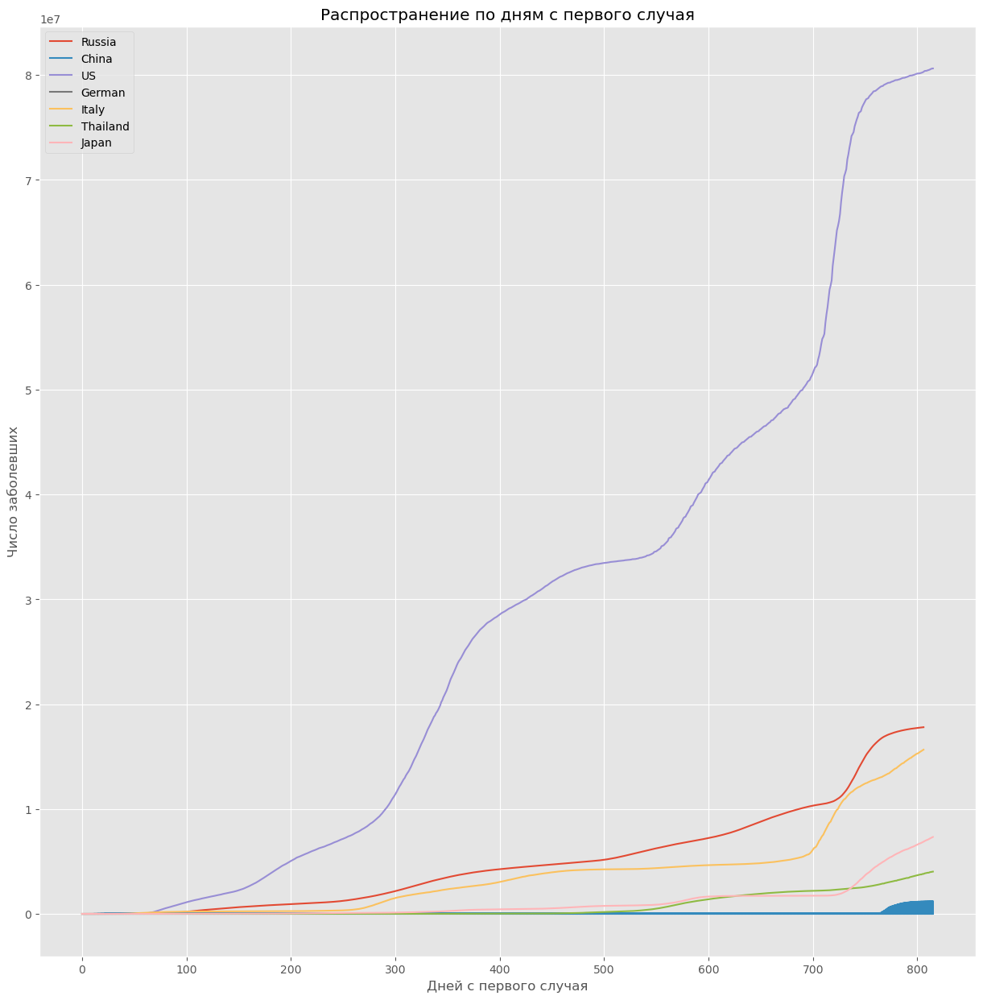

In [29]:
plt.figure()
for name in ['Russia', 'China', 'US', 'German', 'Italy', 'Thailand', 'Japan']:
    s = df[(df['Country/Region'] == name) & (df['Confirmed'] > 0)]
    x = (s['Date'] - s['Date'].min()).dt.days
    plt.plot(x.values, s['Confirmed'].values, label=name)
plt.legend()
plt.xlabel('Дней с первого случая')
plt.ylabel('Число заболевших')
plt.title('Распространение по дням с первого случая')
plt.show()

In [30]:
df['Continent'] = df['Country/Region'].map(continents_new)

In [31]:
df = df.sort_values(['Continent', 'Date'])
df['Date'] = pd.to_datetime(df['Date'])
first = df[df['Confirmed'] > 0].groupby('Continent')['Date'].min()
duration = (df['Date'].max() - first).dt.days
print('Топ-5', duration.sort_values(ascending=False).head(5))

Топ-5 Continent
AS    815
NA    815
EU    813
OC    811
AF    792
Name: Date, dtype: int64


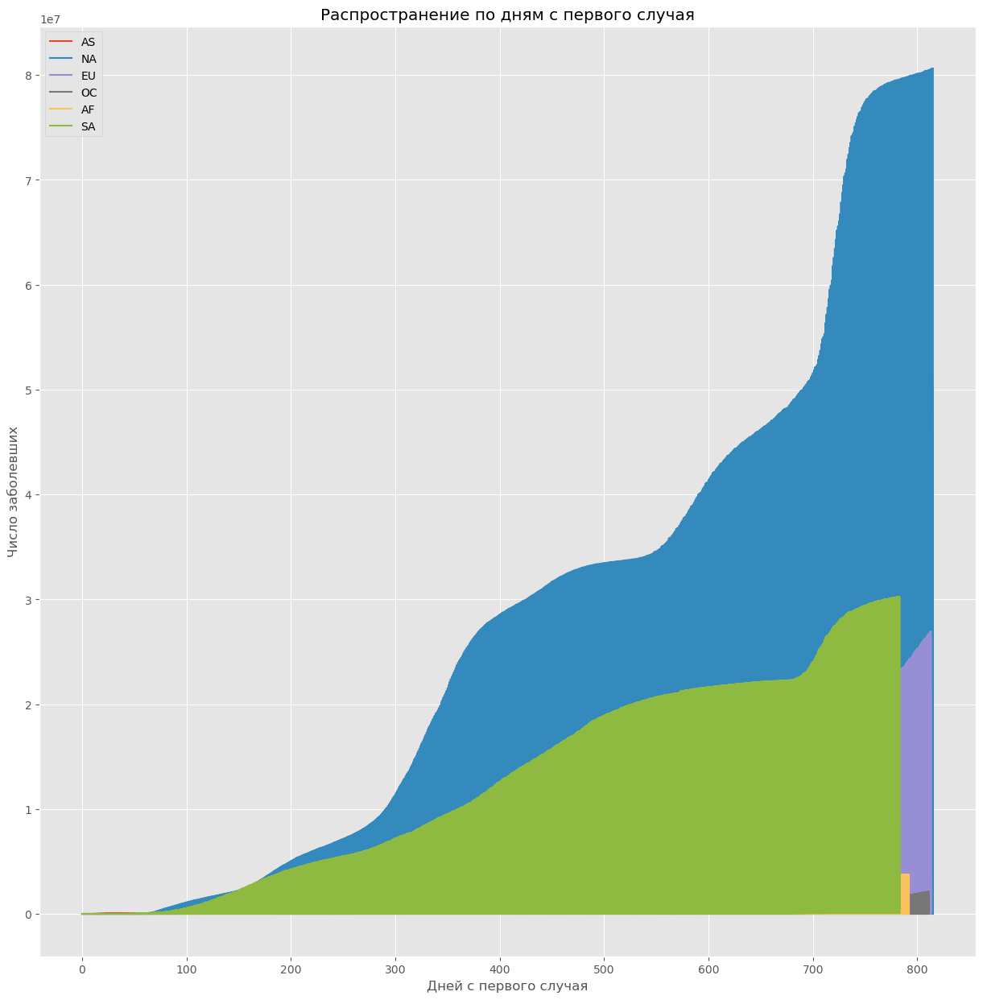

In [32]:
plt.figure()
for name in ['AS', 'NA', 'EU', 'OC', 'AF', 'SA']:
    s = df[(df['Continent'] == name) & (df['Confirmed'] > 0)]
    x = (s['Date'] - s['Date'].min()).dt.days
    plt.plot(x.values, s['Confirmed'].values, label=name)
plt.legend()
plt.xlabel('Дней с первого случая')
plt.ylabel('Число заболевших')
plt.title('Распространение по дням с первого случая')
plt.show()

Если примерно выровнять страны/континенты по дню первого случая, видно, что динамика распространения у них разная где-то рост очень резкий (США), а где-то более плавный (россия). По континентам ситуация аналогичная на графике хорошо видно, как распространялась болезнь в северной и южной америке, в северной виден взрывной скачок, а вот южная более плавно увеличивала число заболевших.

#### 1.5. (5 баллов)

Визуализируйте и оцените, как развивалась ситуация в России по сравнению с остальными миром. Как вы будете осуществлять сравнение? Почему? Какие выводы можно сделать?

Для того, чтобы сравнить как развивалась ситуация в России и в мире, я решил взять заболевших в России и заболевших во всем мире и просто оценить долю России в мировом пространстве. Если мы хотим понять насколько Россия отстает/растет относительно мира, то мы не можем просто сравнивать значения заболевших, потому что мир и одна страна это не сравнимые единицы, а вот ее доля да. 

In [33]:
world = df.groupby('Date')['Confirmed'].sum()
russia = df[df['Country/Region'] == 'Russia'].set_index('Date')['Confirmed']

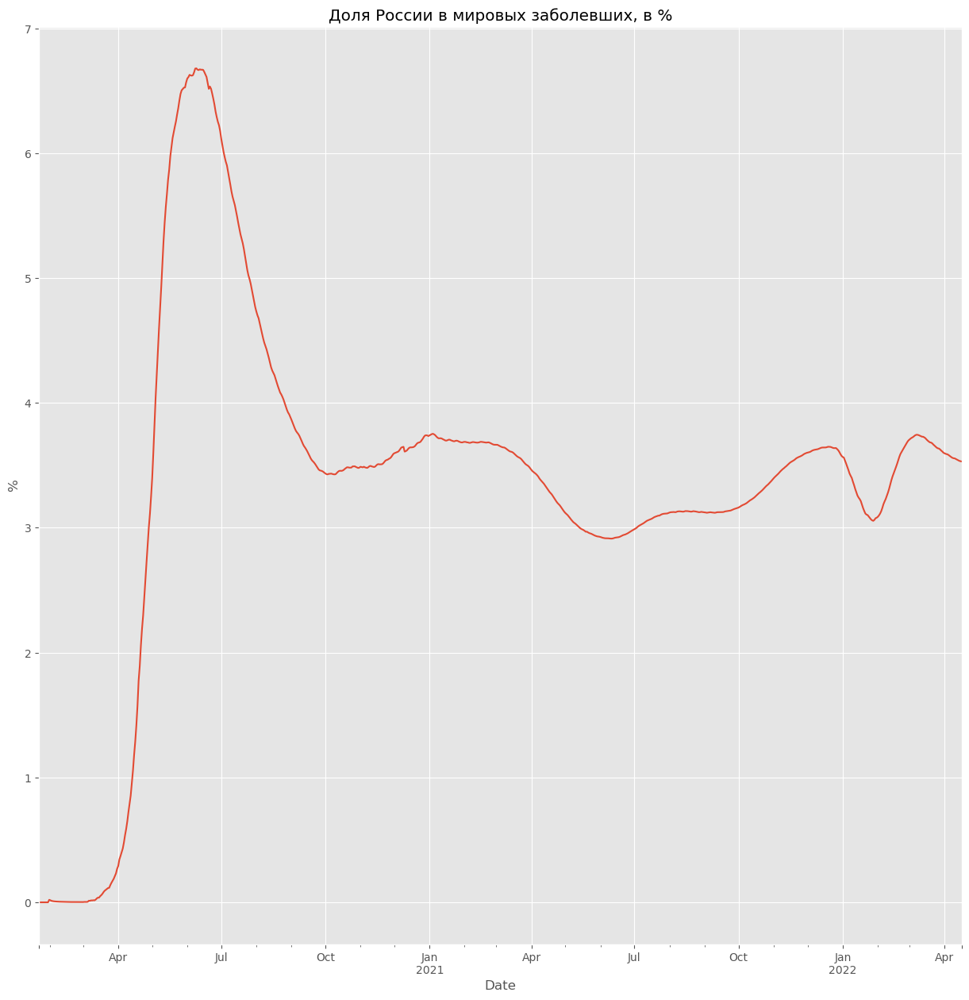

In [34]:
parts = russia / world * 100
parts.plot()

plt.title('Доля России в мировых заболевших, в %')
plt.ylabel('%')
plt.show()

По графику мы можем сказать, что доля России в мировых заболеваниях не очень большая не более 8%. А еще видно, что доля со временем не растет, сначала был скачок а потом постпенно доля держиться около уровнять 3-4%. 

#### 1.6. (5 баллов)

Определите топ-10 стран, которые лидируют по имеющимся в датасете показателям. Постоянны ли эти лидеры? За какой временной промежуток было бы наиболее правильно брать лидеров, на ваш взгляд? Почему? Сравните, насколько быстро развивается ситуация в этих странах. Определите корреляцию.

In [35]:
df_last = df.sort_values('Date').groupby('Country/Region').last()
top_10_conf = df_last.sort_values('Confirmed', ascending=False).head(10)

print('Топ-10 по заболевшим:', top_10_conf['Confirmed'])

Топ-10 по заболевшим: Country/Region
US              80625120
India           43042097
Brazil          30250077
Germany         23416663
Russia          17801103
Korea, South    16305752
Italy           15659835
Turkey          14991669
Spain           11627487
Vietnam         10417887
Name: Confirmed, dtype: int64


In [36]:
top_10_deth = df_last.sort_values('Deaths', ascending=False).head(10)
print('Топ-10 по погибшим:', top_10_deth['Deaths'])

Топ-10 по погибшим: Country/Region
US           988609
Brazil       662185
India        521751
Russia       365774
Mexico       323938
Peru         212619
Italy        161602
Indonesia    155844
Iran         140800
Colombia     139745
Name: Deaths, dtype: int64


In [37]:
date1 = df[df['Date'] == '2020-03-22'].sort_values('Confirmed', ascending=False).head(10)
date2 = df[df['Date'] == '2021-01-01'].sort_values('Confirmed', ascending=False).head(10)
date3 = df[df['Date'] == '2022-01-01'].sort_values('Confirmed', ascending=False).head(10)

print('На дату 2020-06-01 лидеры:\n', date1['Country/Region'])
print('\nНа дату 2021-01-01 лидеры:\n', date2['Country/Region'])
print('На дату 2022-01-01 лидеры:\n', date3['Country/Region'])

На дату 2020-06-01 лидеры:
 58812              China
125724             Italy
208956                US
194268             Spain
122460              Iran
110220           Germany
106956            France
222828    United Kingdom
131436      Korea, South
199164       Switzerland
Name: Country/Region, dtype: object

На дату 2021-01-01 лидеры:
 209241                US
121113             India
25641             Brazil
178233            Russia
107241            France
223113    United Kingdom
208425            Turkey
126009             Italy
194553             Spain
110505           Germany
Name: Country/Region, dtype: object
На дату 2022-01-01 лидеры:
 209606                US
121478             India
26006             Brazil
223478    United Kingdom
178598            Russia
107606            France
208790            Turkey
110870           Germany
194918             Spain
126374             Italy
Name: Country/Region, dtype: object


Я выбрал по одной дате в год и посмотрел лидеров по заболеванию, получается, что топ-10 лидеров не совсем стабильные, так например Китай был в топе в 2020 году, а потом уже его не было в топ-10. Но довольно много стран, где они стабильно находятся в топ-10 (например США, они всегда были топ-10)

In [38]:
top_10_conf.index

Index(['US', 'India', 'Brazil', 'Germany', 'Russia', 'Korea, South', 'Italy',
       'Turkey', 'Spain', 'Vietnam'],
      dtype='object', name='Country/Region')

In [39]:
df['Date'].min()

Timestamp('2020-01-22 00:00:00')

In [40]:
pivot = df[df['Country/Region'].isin(top_10_conf.index)].pivot_table(index='Date', columns='Country/Region', values='Confirmed')

In [41]:
pivot.corr().round(2)

Country/Region,Brazil,Germany,India,Italy,"Korea, South",Russia,Spain,Turkey,US,Vietnam
Country/Region,,,,,,,,,,
Brazil,1.00,0.83,0.99,0.90,0.50,0.95,0.94,0.96,0.97,0.63
Germany,0.83,1.00,0.80,0.97,0.85,0.95,0.94,0.93,0.90,0.94
India,0.99,0.80,1.00,0.88,0.45,0.92,0.92,0.95,0.95,0.59
Italy,0.90,0.97,0.88,1.00,0.73,0.98,0.99,0.97,0.97,0.84
"Korea, South",0.50,0.85,0.45,0.73,1.00,0.68,0.65,0.62,0.57,0.97
Russia,0.95,0.95,0.92,0.98,0.68,1.00,0.99,0.99,0.98,0.81
Spain,0.94,0.94,0.92,0.99,0.65,0.99,1.00,0.98,0.99,0.78
Turkey,0.96,0.93,0.95,0.97,0.62,0.99,0.98,1.00,0.99,0.76
US,0.97,0.90,0.95,0.97,0.57,0.98,0.99,0.99,1.00,0.72


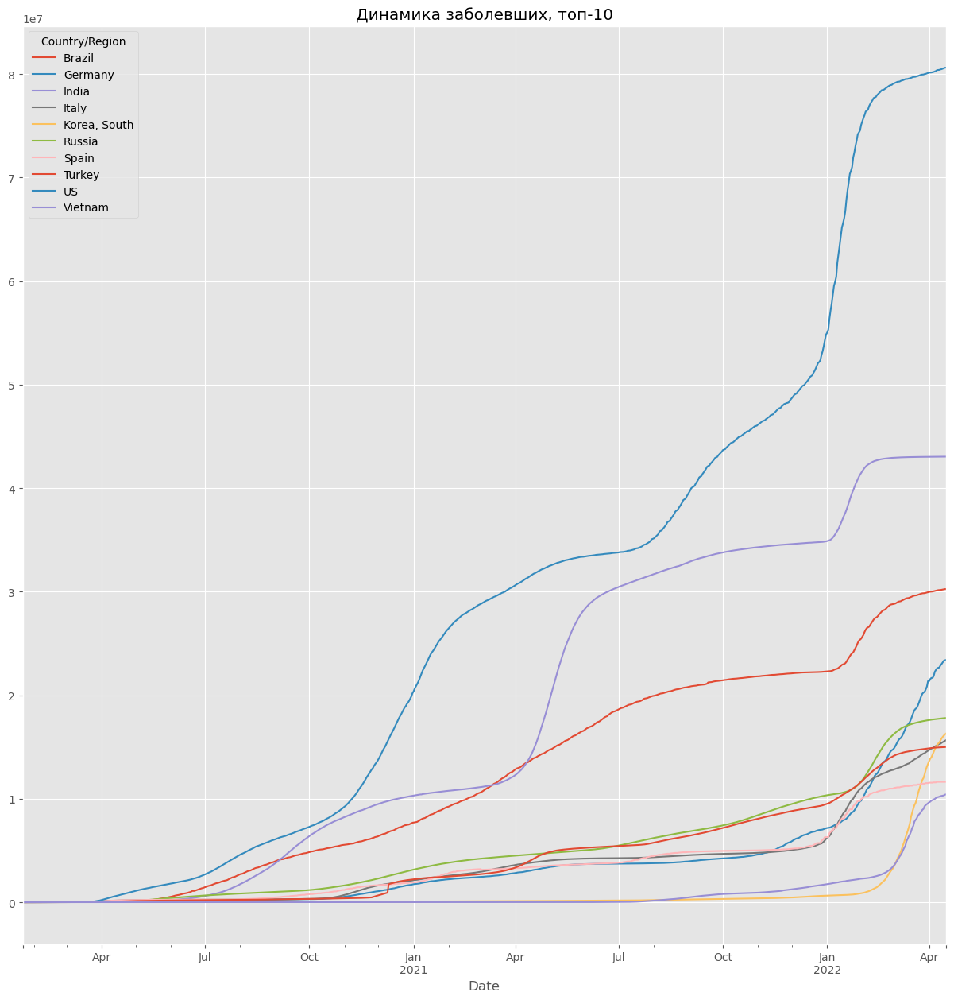

In [42]:
pivot.plot()
plt.title('Динамика заболевших, топ-10')
plt.show()

**Основной вывод:** Если посмотреть на динамику в течение времени топ-10 по заболеваниям немного менялся, но крупные лидеры все равно оставались в топе, например, в начале года лидерами по заболеванию был Китай, Италия и США, а через год уже Китай ушел из топ-10 и в топе остались США, Индия и Бразилия. Вообщем лидеры в целом менялись периодически. За какой временной промежуток было бы наиболее правильно брать лидеров, на ваш взгляд? Тут наверное зависит от того, что мы хотим понять6 если хотим посмотреть кто больше всего в начале пандемии был заражен, то тут начало периода, если хотим просто общее количество с странами, где было больше всего заболевших то на конец периода, но тут есть момент, что в США, России довольно большое население и сравнивать их с перу как-то не очень6 там население меньше и поэтому случаев в США и России будет больше, и если США один раз наберет 10000000 случаев заболевших и например в течение года туда добавиться 1-2 человека6 а другая страна например Перу за год наберет 10000 человек заболевших, то как-то не супер сравнивать между собой, потому что у нас суммы идут куммулятивные и если однажды ты набрал безумно много заболевших, то тебя будет трудно догнать6 если ты уже остановился с распространением болезни. Если нам такие вещи важны, то тут наверное правильнее брать темпы роста или что-то такое (например помесячно) и смотреть. 

Если мы посмотрим на таблицу с корреляцией, то увидим, что довольно много пар сильно скоррелированы, в целом это ожидаемо, потому что у нас ряды с накоплением во времени и получается, что общий тренд заболевания положительный. Единственное, что немного выбиваются пара Южная Корея и Индия (0.45 корреляция) и как раз на графике мы видим, что резкий рост у них начался совсем по размному. 

#### 1.7. (5 баллов)

Для первых 5 стран из топ-10 из прошлого задания и России (суммарно 5 или 6 стран, в зависимости от того, входит ли Россия в топ) постройте сравнительные графики. Изучите, как изменялись значения отношений
- погибших/выздоровевших
- погибших/заболевших
- заболевших/общее число жителей
- еще один ваш вариант (что будет осмысленно здесь взять?)

Какие выводы можно сделать из подобного сравнения?

In [43]:
top5 = list(df_last.sort_values('Confirmed', ascending=False).head(5).index) #беру на последнюю дату
print('Страны в топ-5 по заболеваниям:', top5)

Страны в топ-5 по заболеваниям: ['US', 'India', 'Brazil', 'Germany', 'Russia']


In [44]:
df_top = df[df['Country/Region'].isin(['US', 'India', 'Brazil', 'Germany', 'Russia'])].set_index('Date')

In [45]:
df_top['Deth/Recov'] = (df_top['Deaths'] / df_top['Recovered']).replace(np.inf, np.nan)
df_top['Deth/Confirmed'] = df_top['Deaths'] / df_top['Confirmed']

Я нашел сайт (https://www.worldometers.info/world-population/russia-population/) с населением по годам и просто руками собрал данные за 2021 год, я посчитал, что так будет правильнее взять примерно середину датасета (то есть 2021 год) и просто добавил туда численность, чтобы построить колонку `заболевших/общее число жителей` и как еще одну колонку я подумал, что нужно взять `погибших/общее число жителей`.

In [46]:
pop_on_2021 = {'US': 340, 'India': 1414, 'Brazil': 210, 'Germany': 84, 'Russia': 146}
df_top['pop'] = df_top['Country/Region'].map(pop_on_2021) * 1e6

In [47]:
df_top

,Country/Region,Province/State,Confirmed,Recovered,Deaths,Continent,Deth/Recov,Deth/Confirmed,pop
Date,,,,,,,,,
2020-01-22,India,NaN,0,0.00,0,AS,NaN,NaN,1414000000.00
2020-01-23,India,NaN,0,0.00,0,AS,NaN,NaN,1414000000.00
2020-01-24,India,NaN,0,0.00,0,AS,NaN,NaN,1414000000.00
2020-01-25,India,NaN,0,0.00,0,AS,NaN,NaN,1414000000.00
2020-01-26,India,NaN,0,0.00,0,AS,NaN,NaN,1414000000.00
...,...,...,...,...,...,...,...,...,...
2022-04-12,Brazil,NaN,30184286,0.00,661741,SA,NaN,0.02,210000000.00
2022-04-13,Brazil,NaN,30210934,0.00,661904,SA,NaN,0.02,210000000.00
2022-04-14,Brazil,NaN,30234024,0.00,662043,SA,NaN,0.02,210000000.00


In [48]:
df_top['Conf/pop'] = df_top['Confirmed'] / df_top['pop']
df_top['Deth/pop']  = df_top['Deaths'] / df_top['pop'] 

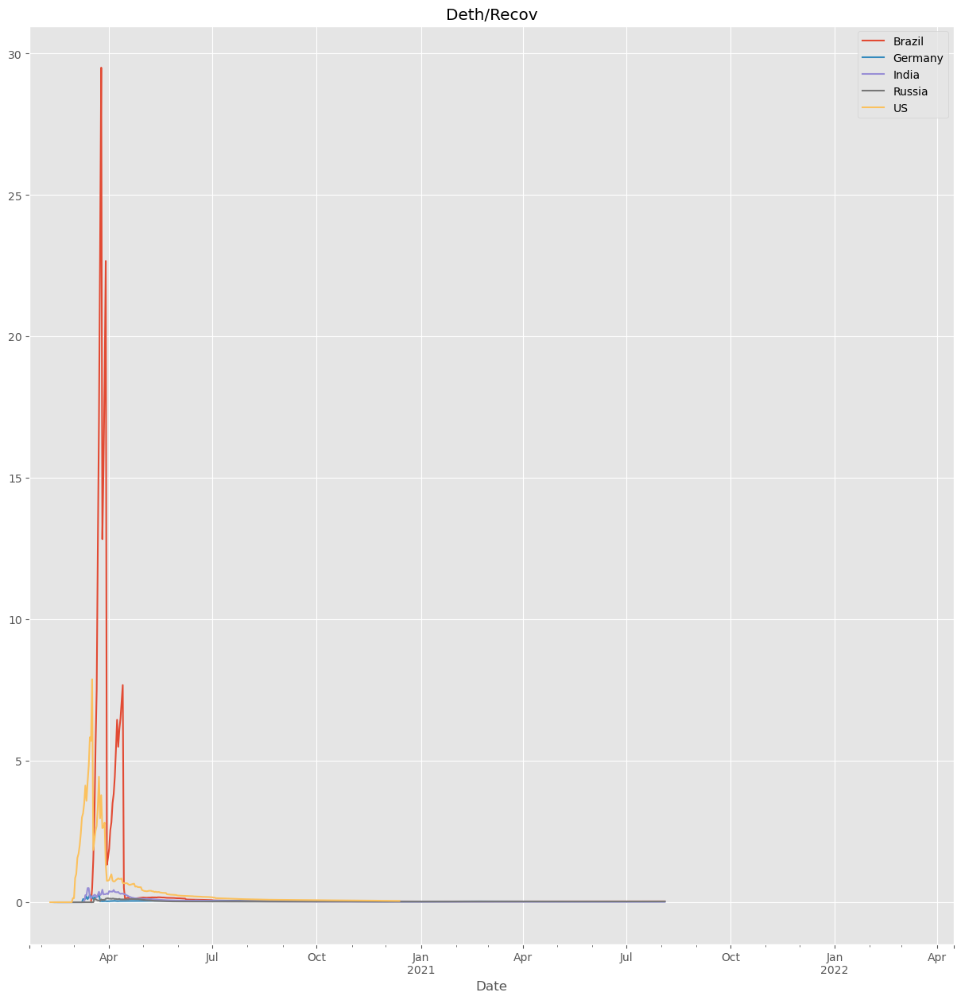

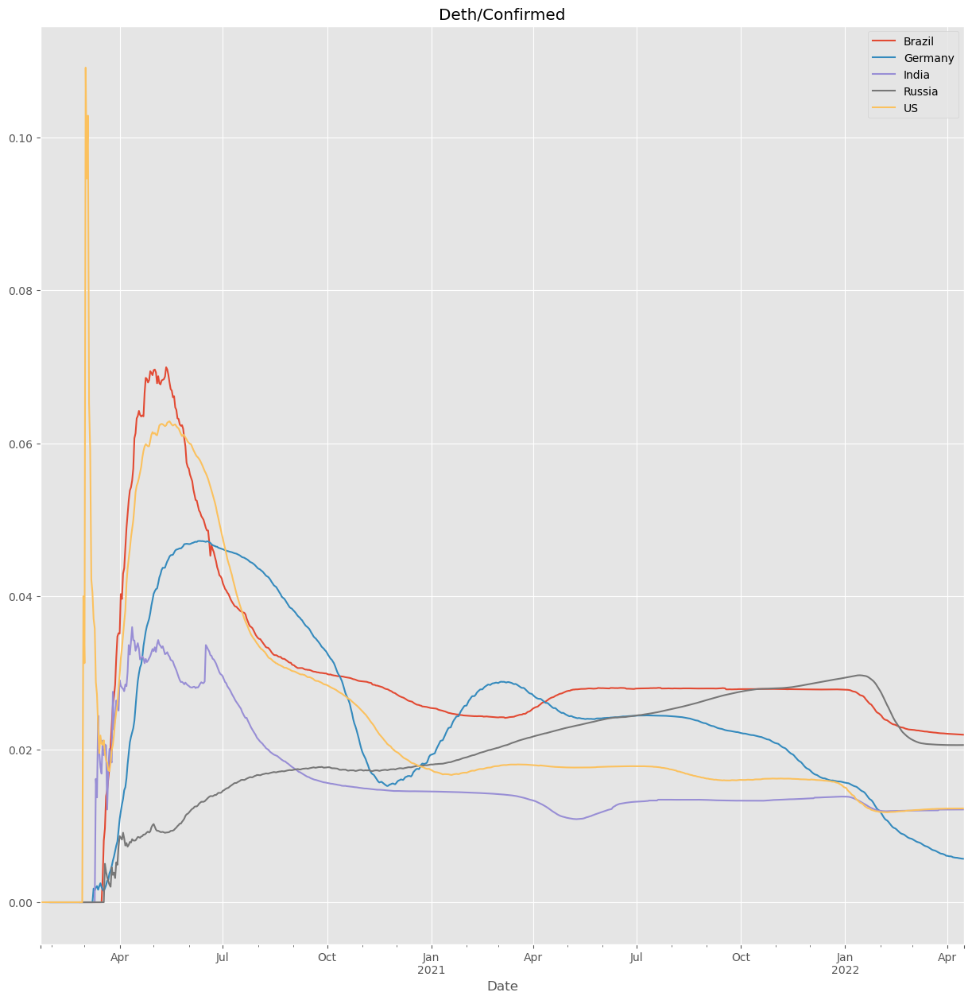

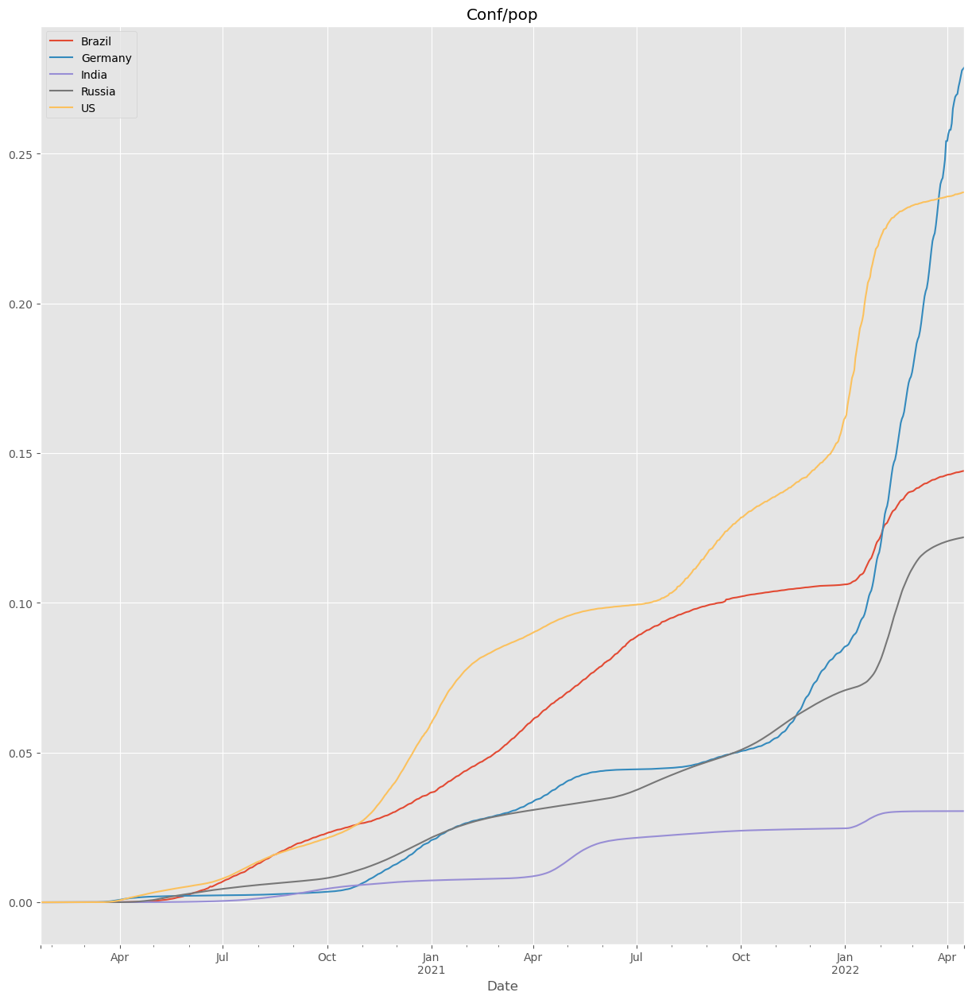

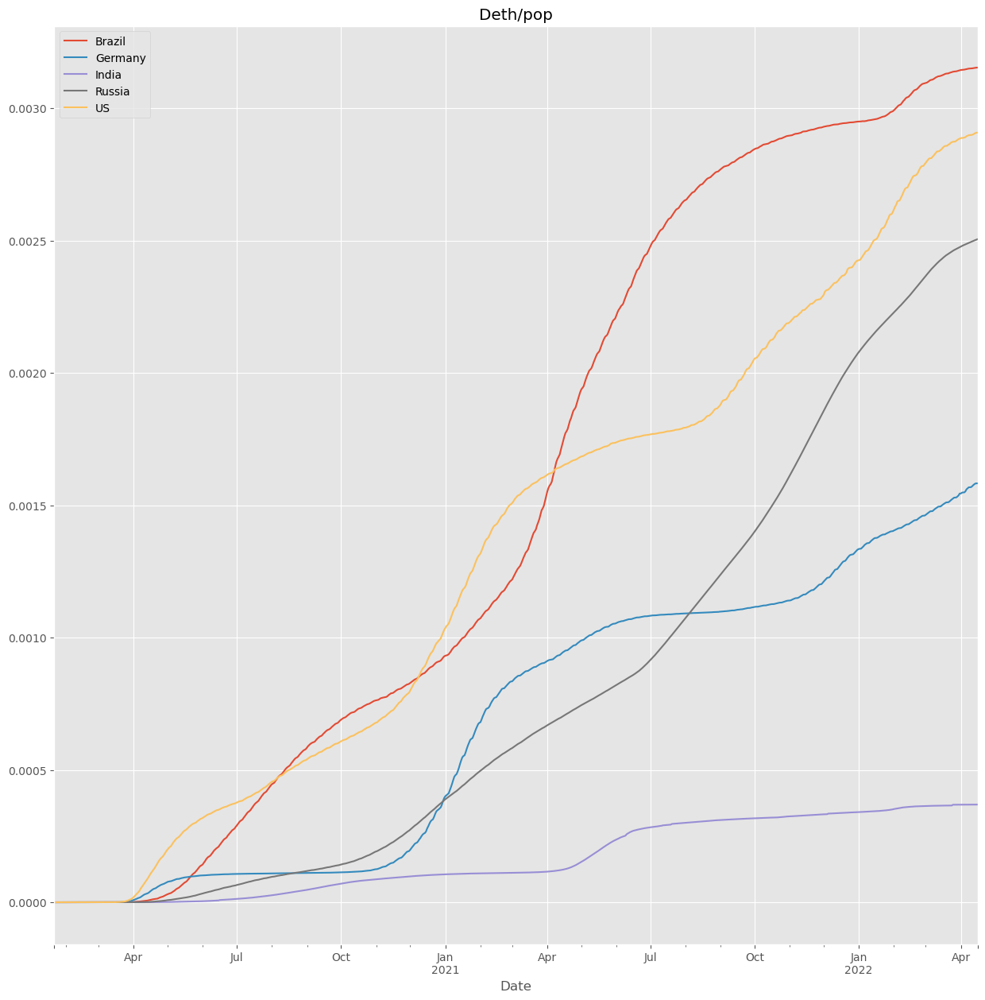

In [49]:
for col in ['Deth/Recov', 'Deth/Confirmed', 'Conf/pop', 'Deth/pop']:
    plt.figure()
    for c, g in df_top.groupby('Country/Region'):
        g[col].plot(label=c)
    plt.legend()
    plt.title(col)
    plt.show()

Выводы: Deaths/Confirmed (летальность) у большинства стран со временем снижается, скорее всего это из-за предпринимаемых мер органами здравоохранения, например, улучшение лечения, вакцинация, рост выявляемости лёгких случаев. Confirmed/Pop показывает охват населения, которое заразилось, а вот отношение Deaths/Recovered выглядит нестабильно, мы видим, что данные о выздоровевших перестали обновляться (нулевые значения примерно с середины временного ряда).

#### 1.8. (5 баллов и 15 бонусных баллов)

Изучаемый вами датасет отражает мировую статистику распространения болезни. Однако эти данные не дают нам возможности сделать предположения о возможных факторах, которые влияют на скорость распространения, летальность, заразность и тд. Поэтому в наш датасет можно добавить новые признаки из других наборов данных, которые могут не только помочь при прогнозировании временного ряда, но и определить наиболее значимые факторы.

- Добавьте новый признак "количество дней со дня первого случая заражения".
- Добавьте еще не менее 5 новых признаков в датасет, которые могут быть значимым фактором распространения вируса. Сохраните полученный датасет. Вы можете его использовать в третьей части домашнего задания (за это вы сможете получить там дополнительные бонусные баллы).
- Исследуйте, как добавленные признаки соотносятся с трендами распространения коронавируса в некоторых странах. Сделайте выводы.

*Подсказка: некоторые примеры признаков (список далеко не исчерпывающий и лучше хотя бы несколько придумать своих): количество дней с начала карантина; континент; плотность населения; количество употребляемого алкоголя; распространенность летучих мышей; количество крокодилов на душу населения; количество туристов в год; уровень безработицы; температура; количество игроков в Plague Inc.; средний возраст или продолжительность жизни; и так далее. Вы можете использовать любой найденный датасет. Главное, чтобы у вас получилось скомбинировать данные.*

  Примеры датасетов для вас:
  1. [500 Cities: Local Data for Better Health (2019)](https://www.kaggle.com/jaimeblasco/500-cities-local-data-for-better-health-2019)
  2. [Daily global surface summary from over 9000 weather stations from 1929 to now](https://www.kaggle.com/noaa/gsod)
  3. [Population by Country - 2020](https://www.kaggle.com/tanuprabhu/population-by-country-2020)



In [50]:
df

,Date,Country/Region,Province/State,Confirmed,Recovered,Deaths,Continent
1632,2020-01-22,Algeria,NaN,0,0.00,0,AF
3264,2020-01-22,Angola,NaN,0,0.00,0,AF
21216,2020-01-22,Benin,NaN,0,0.00,0,AF
24480,2020-01-22,Botswana,NaN,0,0.00,0,AF
27744,2020-01-22,Burkina Faso,NaN,0,0.00,0,AF
...,...,...,...,...,...,...,...
4895,2022-04-16,Antarctica,NaN,11,0.00,0,None
87311,2022-04-16,Diamond Princess,NaN,712,0.00,13,None
142799,2022-04-16,MS Zaandam,NaN,9,0.00,2,None
197471,2022-04-16,Summer Olympics 2020,NaN,865,0.00,0,None


In [51]:
df = df.sort_values(['Country/Region', 'Date'])
first = df[df['Confirmed'] > 0].groupby('Country/Region')['Date'].transform('min')

In [52]:
#Добавляем признаки разные
df['days_since_first'] = np.maximum((df['Date'] - first).dt.days, 0)
df['new_cases']  = df.groupby('Country/Region')['Confirmed'].diff().fillna(0) #тут прирост смотрим по дням по заболеваниям
df['new_deaths'] = df.groupby('Country/Region')['Deaths'].diff().fillna(0) #тут прирост смотрим по дням по смерти
df['Deth/Conf'] = df['Deaths'] / df['Confirmed']
df['day_of_week'] = df['Date'].dt.dayofweek # может быть влияет день недели когда больше всего регистрируют

In [53]:
df.to_csv('covid_features.csv', index=False)
df.head()

,Date,Country/Region,Province/State,Confirmed,Recovered,Deaths,Continent,days_since_first,new_cases,new_deaths,Deth/Conf,day_of_week
0,2020-01-22,Afghanistan,NaN,0,0.00,0,AS,NaN,0.00,0.00,NaN,2
1,2020-01-23,Afghanistan,NaN,0,0.00,0,AS,NaN,0.00,0.00,NaN,3
2,2020-01-24,Afghanistan,NaN,0,0.00,0,AS,NaN,0.00,0.00,NaN,4
3,2020-01-25,Afghanistan,NaN,0,0.00,0,AS,NaN,0.00,0.00,NaN,5
4,2020-01-26,Afghanistan,NaN,0,0.00,0,AS,NaN,0.00,0.00,NaN,6


Я хочу добавить еще население в наш датасет, поэтому я взял датасет, который был предложен в задании (https://www.kaggle.com/datasets/tanuprabhu/population-by-country-2020/data) и присоединил его к нашему датасету

In [54]:
df_pop = pd.read_csv('population_by_country_2020.csv.xls')
df_pop.head()

,Country (or dependency),Population (2020),Yearly Change,Net Change,Density (P/Km²),Land Area (Km²),Migrants (net),Fert. Rate,Med. Age,Urban Pop %,World Share
0,China,1440297825,0.39 %,5540090,153,9388211,-348399.00,1.7,38,61 %,18.47 %
1,India,1382345085,0.99 %,13586631,464,2973190,-532687.00,2.2,28,35 %,17.70 %
2,United States,331341050,0.59 %,1937734,36,9147420,954806.00,1.8,38,83 %,4.25 %
3,Indonesia,274021604,1.07 %,2898047,151,1811570,-98955.00,2.3,30,56 %,3.51 %
4,Pakistan,221612785,2.00 %,4327022,287,770880,-233379.00,3.6,23,35 %,2.83 %


In [55]:
df_pop = df_pop.rename(columns={'Country (or dependency)': 'Country/Region', 'Density (P/Km²)': 'density', 'Med. Age': 'median_age'})
df_pop['Country/Region'] = df_pop['Country/Region'].replace({'United States': 'US', 'South Korea': 'Korea, South', 
                                                             'Czech Republic (Czechia)': 'Czechia','Taiwan': 'Taiwan*',
                                                            'Congo': 'Congo (Brazzaville)', 'DR Congo': 'Congo (Kinshasa)'})

In [56]:
df = df.merge(df_pop[['Country/Region', 'density', 'median_age']], on='Country/Region', how='left')

In [57]:
df[df['density'].isna()]['Country/Region'].unique()

array(['Antarctica', 'Burma', "Cote d'Ivoire", 'Diamond Princess',
       'Kosovo', 'MS Zaandam', 'Saint Kitts and Nevis',
       'Saint Vincent and the Grenadines', 'Sao Tome and Principe',
       'Summer Olympics 2020', 'West Bank and Gaza',
       'Winter Olympics 2022'], dtype=object)

Какие-то названия стран я посмотрел руками в 2 датасетах, не все удалось найти, но большинство я сопоставил, а вот такие вещи: 'Summer Olympics 2020' это вообще можно не искать это какое-то другое название не связанное с страной

In [58]:
df.to_csv('covid_features.csv', index=False)
df.head()

,Date,Country/Region,Province/State,Confirmed,Recovered,Deaths,Continent,days_since_first,new_cases,new_deaths,Deth/Conf,day_of_week,density,median_age
0,2020-01-22,Afghanistan,NaN,0,0.00,0,AS,NaN,0.00,0.00,NaN,2,60.00,18
1,2020-01-23,Afghanistan,NaN,0,0.00,0,AS,NaN,0.00,0.00,NaN,3,60.00,18
2,2020-01-24,Afghanistan,NaN,0,0.00,0,AS,NaN,0.00,0.00,NaN,4,60.00,18
3,2020-01-25,Afghanistan,NaN,0,0.00,0,AS,NaN,0.00,0.00,NaN,5,60.00,18
4,2020-01-26,Afghanistan,NaN,0,0.00,0,AS,NaN,0.00,0.00,NaN,6,60.00,18


После добавления нового датасета, мы можем теперь посмотреть как связана летальность от вируса и средний возраст, предположение, что чем младше возраст в стране, тем ниже летальность.

In [59]:
df_last_new = df.sort_values('Date').groupby('Country/Region').last()
df_last_new['median_age'] = pd.to_numeric(df_last_new['median_age'], errors='coerce')
df_last_new['density'] = pd.to_numeric(df_last_new['density'], errors='coerce')

In [60]:
df_last_new

,Date,Province/State,Confirmed,Recovered,Deaths,Continent,days_since_first,new_cases,new_deaths,Deth/Conf,day_of_week,density,median_age
Country/Region,,,,,,,,,,,,,
Afghanistan,2022-04-16,None,178387,0.00,7676,AS,782.00,14.00,0.00,0.04,5,60.00,18.00
Albania,2022-04-16,None,274462,0.00,3496,EU,768.00,33.00,1.00,0.01,5,105.00,36.00
Algeria,2022-04-16,None,265739,0.00,6874,AF,781.00,1.00,0.00,0.03,5,18.00,29.00
Andorra,2022-04-16,None,40709,0.00,153,EU,775.00,0.00,0.00,0.00,5,164.00,NaN
Angola,2022-04-16,None,99194,0.00,1900,AF,757.00,0.00,0.00,0.02,5,26.00,17.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
West Bank and Gaza,2022-04-16,None,656617,0.00,5656,AS,772.00,0.00,0.00,0.01,5,NaN,NaN
Winter Olympics 2022,2022-04-16,None,535,0.00,0,None,83.00,0.00,0.00,0.00,5,NaN,NaN
Yemen,2022-04-16,None,11817,0.00,2148,AS,736.00,0.00,0.00,0.18,5,56.00,20.00


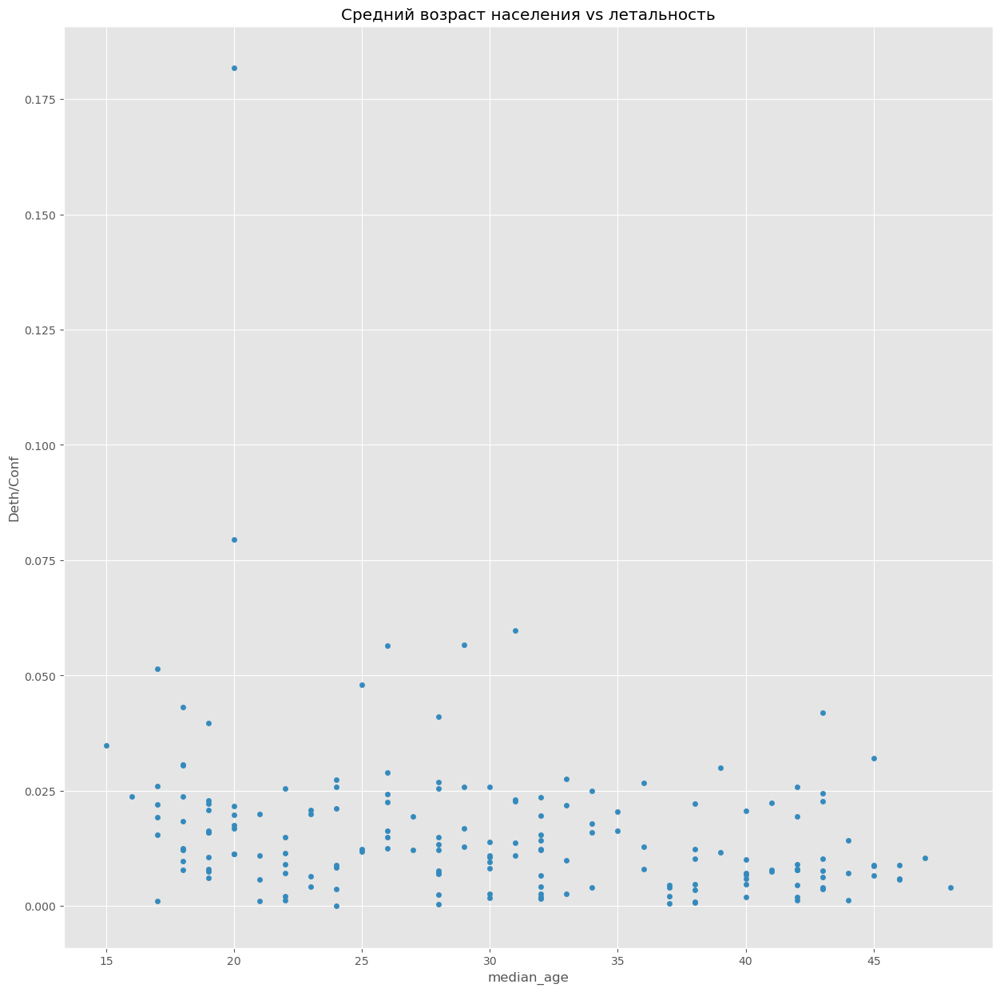

In [61]:
df_last_new.plot(kind='scatter', x='median_age', y='Deth/Conf')
plt.title('Средний возраст населения vs летальность')
plt.show()

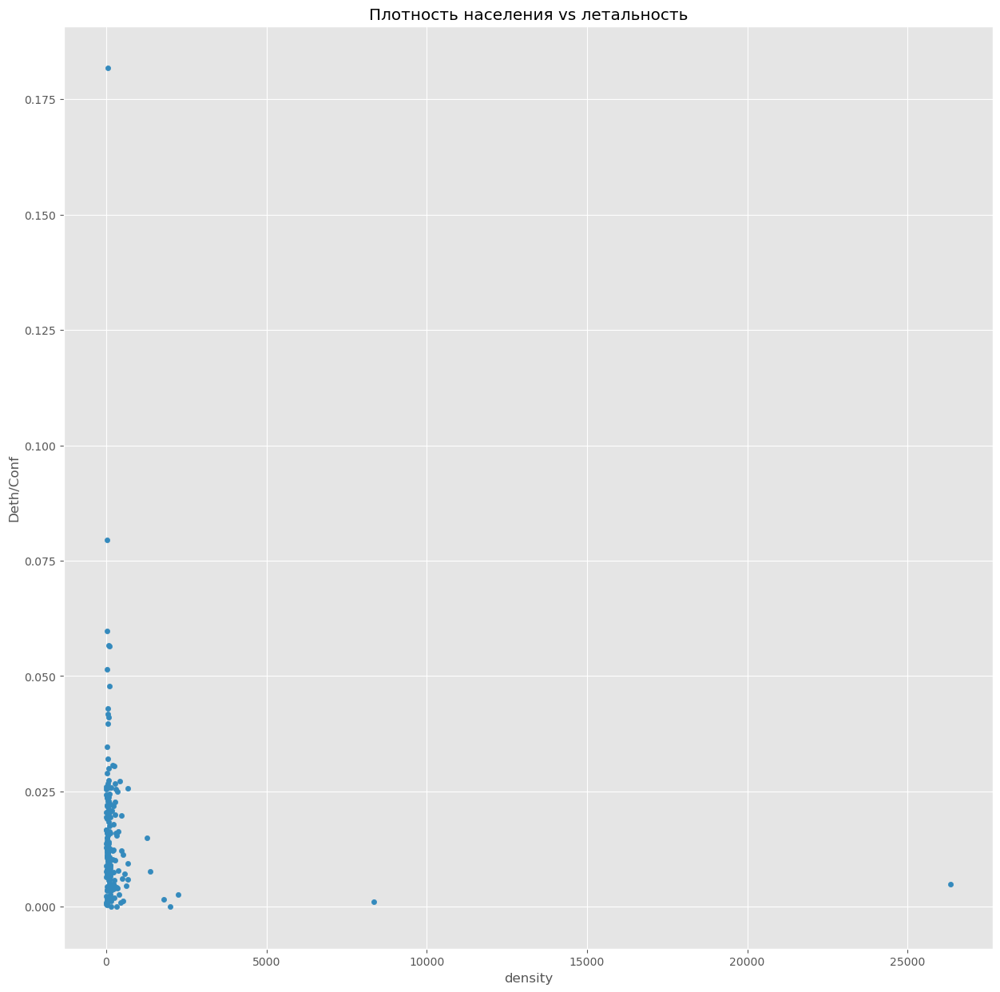

In [62]:
df_last_new.plot(kind='scatter', x='density', y='Deth/Conf')
plt.title('Плотность населения vs летальность')
plt.show()

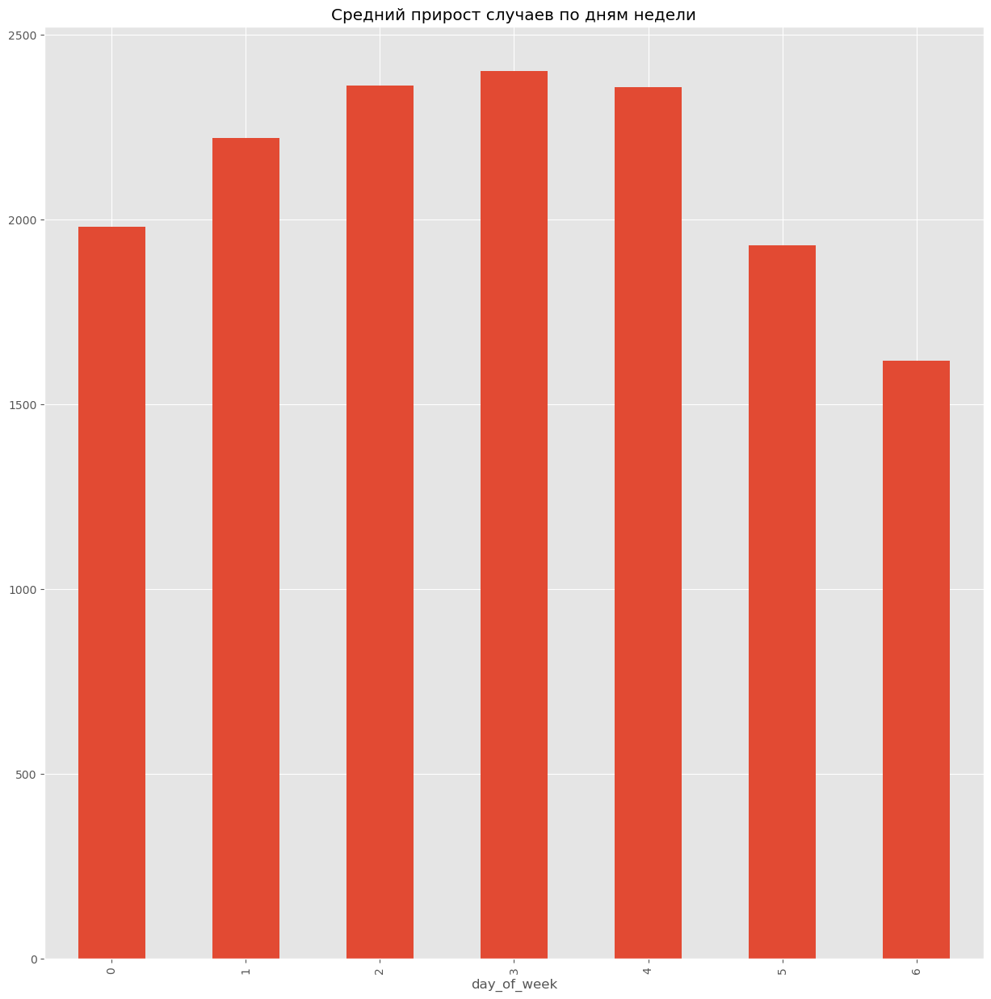

In [63]:
df.groupby('day_of_week')['new_cases'].mean().plot(kind='bar')
plt.title('Средний прирост случаев по дням недели')
plt.show()

#### 1.9. (5 баллов)

Какие закономерности и тенденции бросились вам в глаза в ходе проделанного в разделе 1 анализа? Что оказалось неожиданным, а что, наоборот, ожидаемым? Почему? Напишите итоговые выводы по проделанному вами разведочному анализу данных в рамках данного раздела.

    { В датасете был период с 22.01.2020 по 16.04.2022 по заболеваниям в пандемию, с самого начала было ожидаемо увидеть, что вирус распространился по миру очень быстро, то есть по данным буквально за первые 2–3 месяца 2020 года число стран с подтвержденными случаями вышло на плато, но все равно впечатляет скорость распространения, мне казалось, что она будет ниже. Из того, что я ожидал, тот факт что летальность от вируса со временем у большинства стран снижается, как раз из-за мер карантина, улучшением лечения, появлением вакцин и т.д.  Из неожиданного - это как раз был состав лидеров стран, как раз из-за накопленных данных страна, которая резко набрала много заболевших все также остается наверху навсегда, поэтому логичнее смотреть по срезу времени, а не по итоговым значениям (то есть сходу было на самом деле не понятно насколько может это играть роль). Еще из неожиданного, пока мы не построили графики, особо пробле с данными не было видно, но как только поевились графики с метрикой `Recovery`, то видно, что есть серьезный пробел с ней, половины данных по признаку тупо нет. }

## Раздел 2. Статистический анализ и подготовка данных (28 баллов)


#### 2.1. (5 баллов)

В рамках задачи исследования и прогнозирования тенденций развития пандемии коронавируса, не очень интересно предсказывать количество заболевших/умерших к моменту окончания исследуемого периода данного датасета, поскольку все изменения значений будут близки к нулю — пандемия фактически уже окончилась. Какой в таком случае конец "известного" периода имело бы смысл взять?

Также, с другой стороны: все ли данные от начала пандемии нам необходимы и полезны для анализа и прогнозирования? Почему? Обрежьте наш датасет с конца и (если необходимо) с начала, выделив тем самым интересующий нас рабочий период для анализа. Обязательно аргументируйте, почему вы решили взять период именно таким. Обрезку, на всякий случай, осуществляйте в копии датасета и сохраните исходный датасет на случай необходимости дополнительного анализа/анализа на других временных интервалах.

In [64]:
data = pd.read_csv('covid_features.csv')

С точки зрения информативности рядов, наверное лучше обрезать их и с начала и с конца, в начале у нас единичные случаи заболевания и поэтому это не сильно интересно рассматривать и предсказывать, то есть мы спокойно можем обрезать с 2020-04-01, то есть первые 4 месяца пропустить, так как там динамики особой нет. Конец тоже стоит обрезать так как нам интересно предсказывать в основном смерти, заболевания и восстановления,  то нужно смотреть по их динамике, так как выше мы уже строили, то исходя из графиков можно понять, что данные после конца 2021 года не совсем информативные, так как там уже страны перестали адекватно вести отчетность и фиксировать случаи восстановления, поэтому исходя из этого факта лучше обрезать по 31-12-2021, то есть взять чуть больше года данных и попробовать спрогнозировать на них.

In [65]:
data_c = data.copy()

In [66]:
data_c = data_c[(data_c['Date'] >= '2020-04-01') & (data_c['Date'] <= '2021-12-31')]

#### 2.2. (10 баллов)

Выделите временной ряд по одному из имеющихся у нас целевых признаков на ваш выбор. Для выделенного временного ряда проведите простой статистический анализ:

- Рассчитайте несколько первых лагов для временного ряда, выведите их на графике.
- Представьте временной ряд в виде последовательности разниц между значениями и визуализируйте его. Представьте его также в виде последовательности разниц разниц. Визуализируйте и это.
- Перейдите от временного ряда к логарифму временного ряда. Визуализируйте полученный ряд. Что можно сказать об изменениях?
- Осуществите декомпозицию временного ряда (тренд, сезонность, резидуалс). Постройте график тренда отдельно и график тренда на тех же осях, что и исходный временной ряд. Повторите проделанные действия для логарифма временного ряда. Имеется ли разница?
- Что вы можете сказать о стационарности временного ряда? Почему? Осуществите проверку на стационарность (желательно, с использованием методов математической статистики). Что можно сказать о стационарности последовательности разниц и последовательности разниц разниц? Также осуществите проверку на стационарность для этих рядов.

Какие выводы вы можете сделать из проделанного анализа?

In [67]:
ts = data_c[data_c['Country/Region'] == 'Russia'].set_index('Date')['Confirmed']
ts.head()

Date
2020-04-01    2777
2020-04-02    3548
2020-04-03    4149
2020-04-04    4731
2020-04-05    5389
Name: Confirmed, dtype: int64

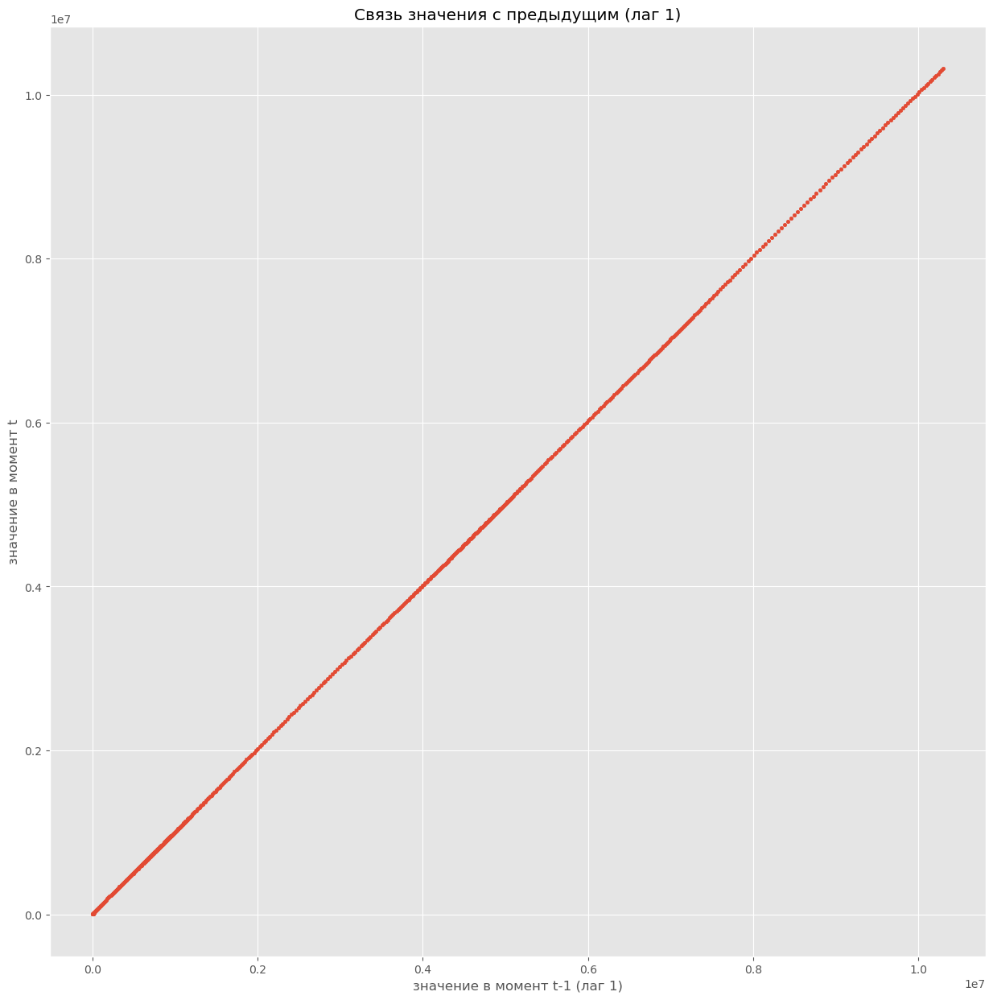

In [68]:
ts_shift1 = ts.shift(1)

plt.figure()
plt.scatter(ts_shift1, ts, s=10)
plt.xlabel('значение в момент t-1 (лаг 1)')
plt.ylabel('значение в момент t')
plt.title('Связь значения с предыдущим (лаг 1)')
plt.show()

По лагу 1 мы видим, что у нас идет прямая линия возрастающая, то есть у нас значения ряда между собой значительно связаны и в целом это ожидаемо, потому что у нас ряды накопительные, то есть у нас копяться суммы.

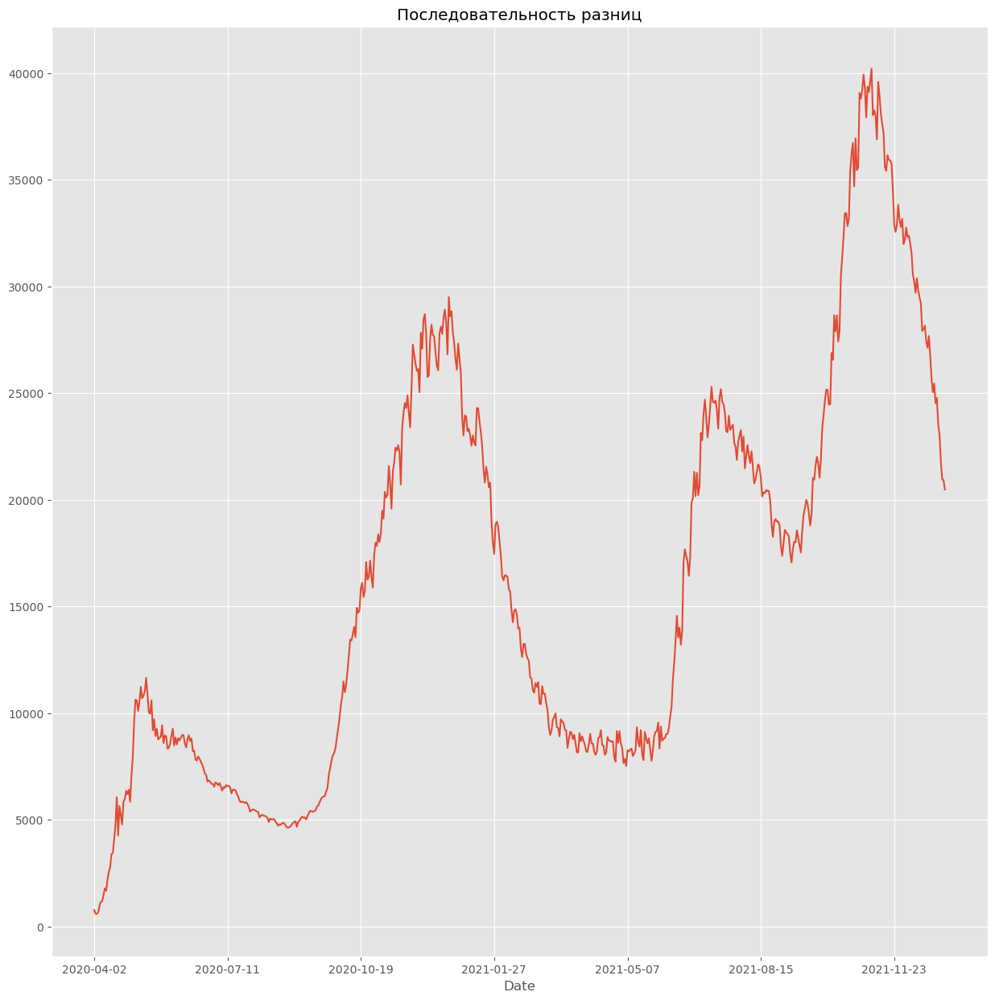

In [69]:
diff1 = ts.diff().dropna()

diff1.plot()
plt.title('Последовательность разниц')
plt.show()

После первой разности мы уже смотрим не на накопленный ряд, а изменение за день, то есть суточный прирост заболевания.

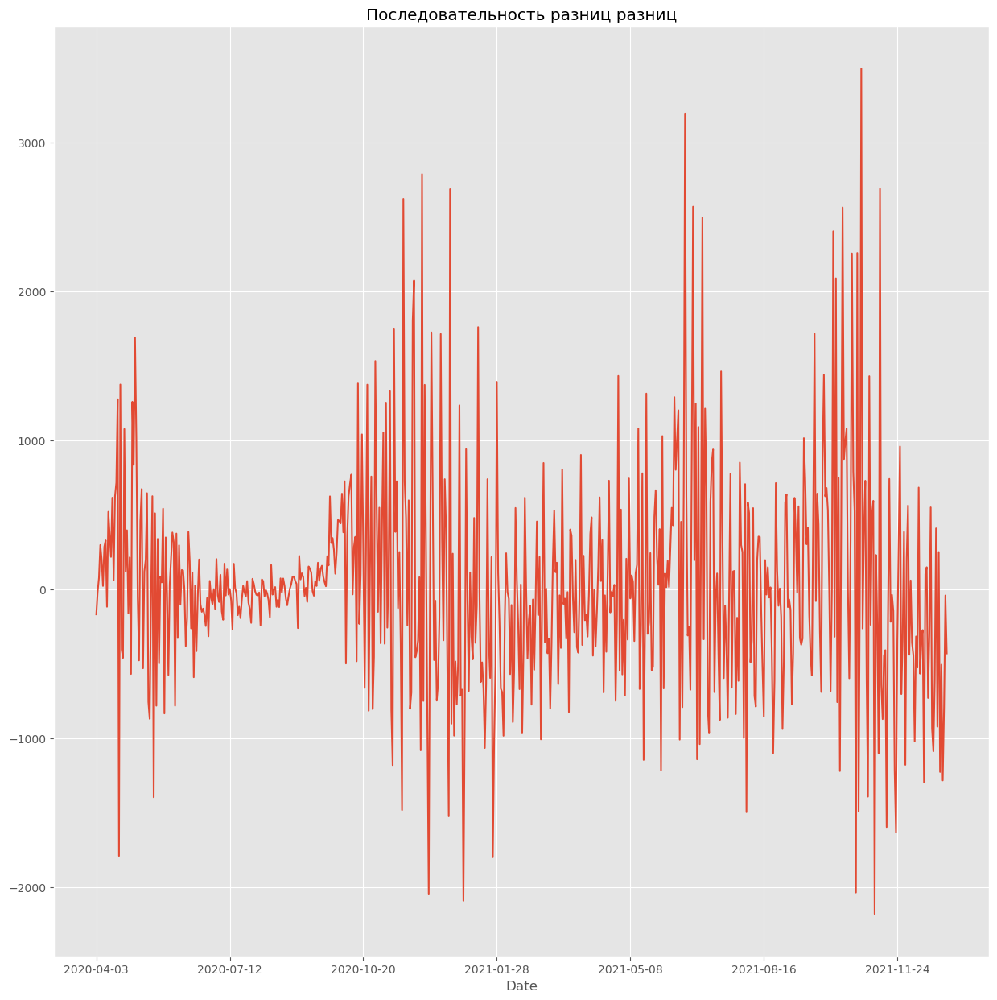

In [70]:
diff2 = ts.diff().diff().dropna()
diff2.plot()
plt.title('Последовательность разниц разниц')
plt.show()

После разности разностей ряд уже показывает изменение прироста суточного, то есть мы либо ускоряемся либо замедляемся, на графике это интерпритируется как: если мы выше 0 по y то у нас идет ускорение прироста заболевания, если ниже 0, то идет замедление.

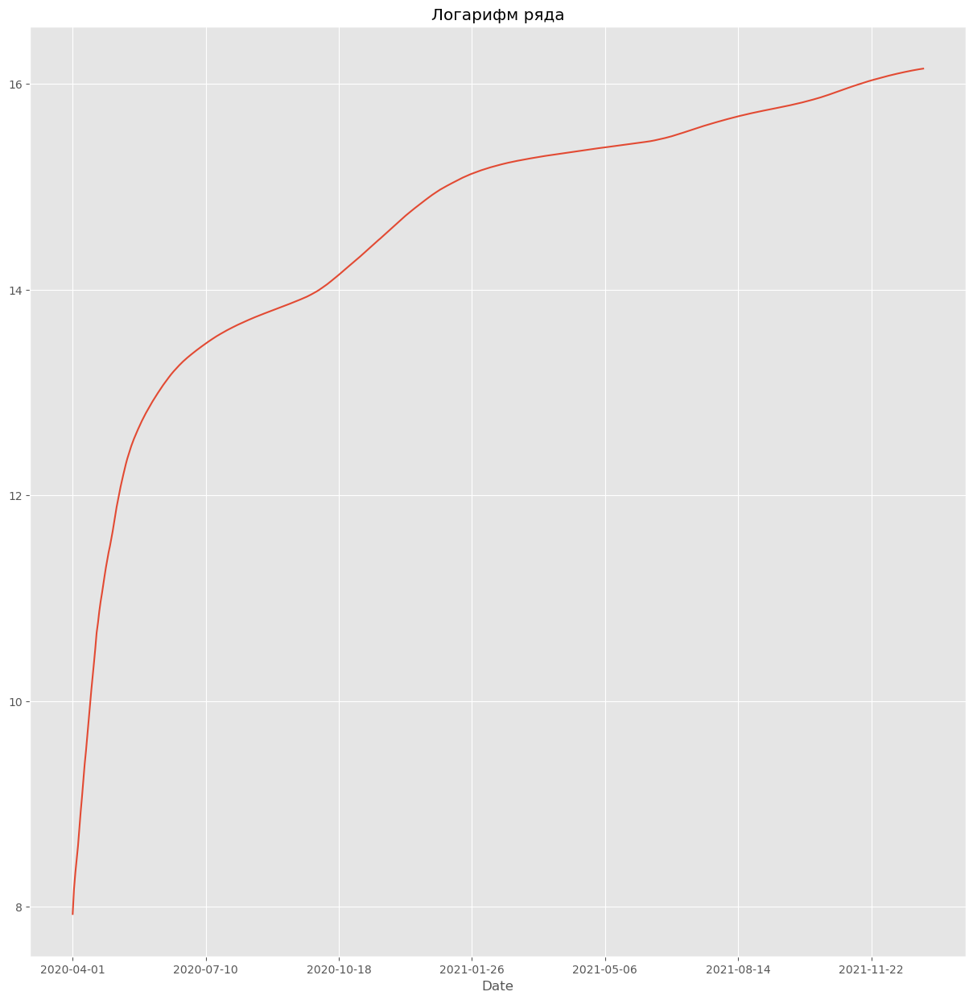

In [71]:
ts_log = np.log(ts)

ts_log.plot()
plt.title('Логарифм ряда')
plt.show()

График с логарифмическим рядом как раз дает нам посмотреть на ряд в выровненном масштабе, то есть когда у нас были в самом начале маленькие значения, мы их особо не замечаем на фоне огромных, а логарифм как раз сглаживает эти различия. То есть опять таки в самом начале логарифм ряда резко вырос, то есть у нас темп роста заболевания оооооочень сильно рос, а потом уже наклон изменился и темп роста падал, то есть после логарифмирования ряд у нас также не стационарен потому что тренд остается

In [72]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [73]:
ts.index = pd.to_datetime(ts.index)

In [74]:
dec = seasonal_decompose(ts, model='additive')

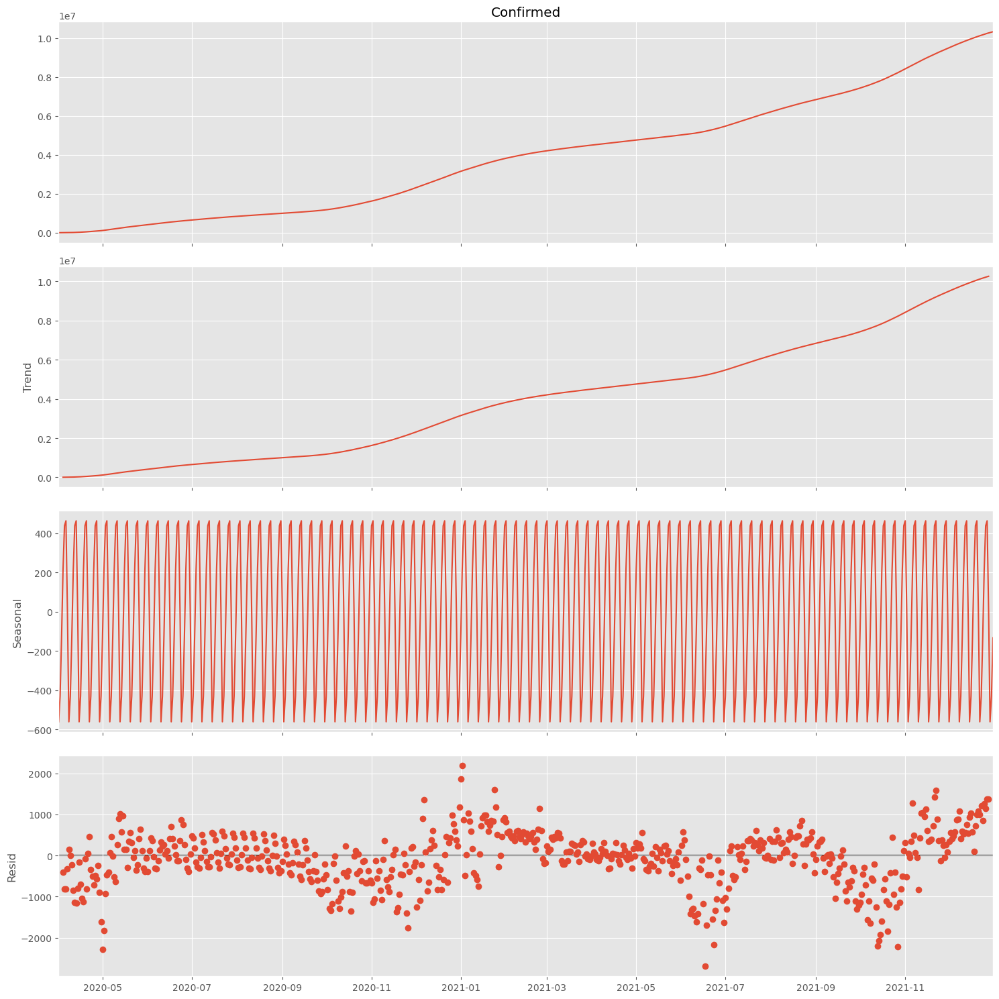

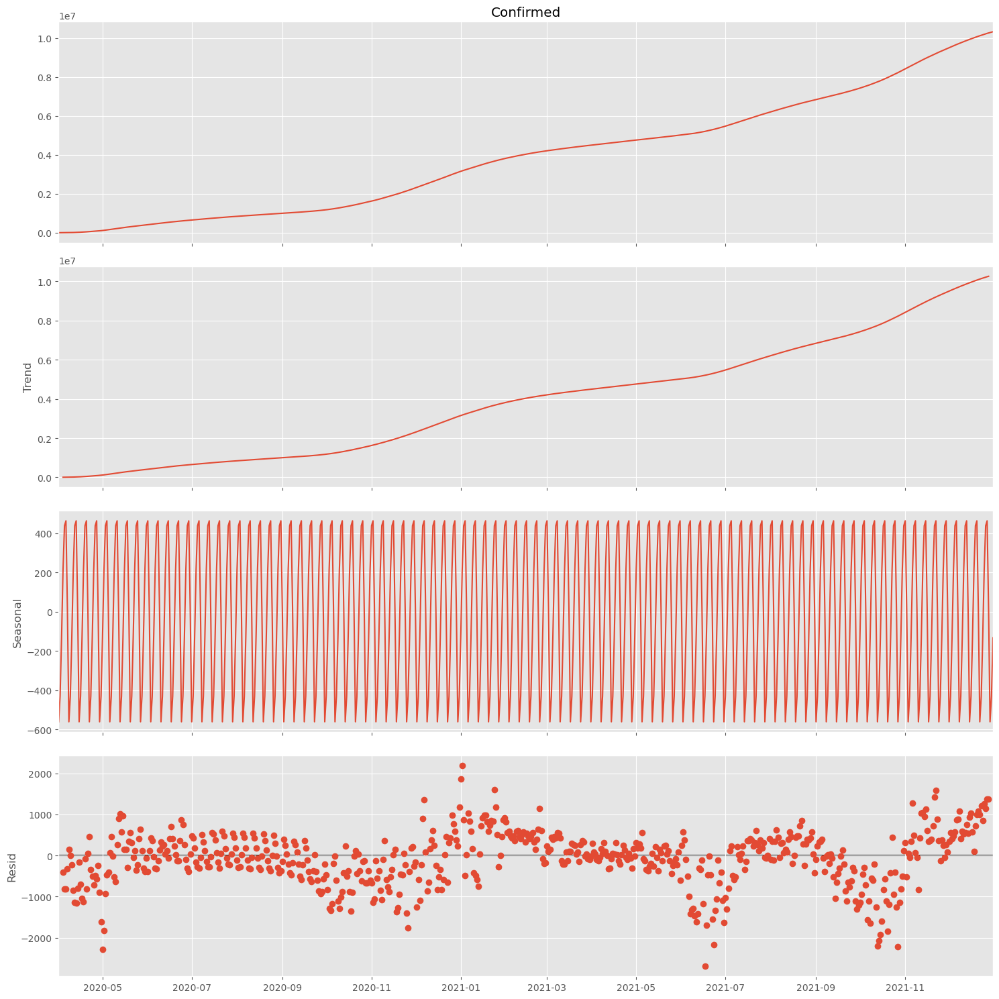

In [75]:
dec.plot()

In [76]:
trend = dec.trend
seasonal = dec.seasonal
residual = dec.resid

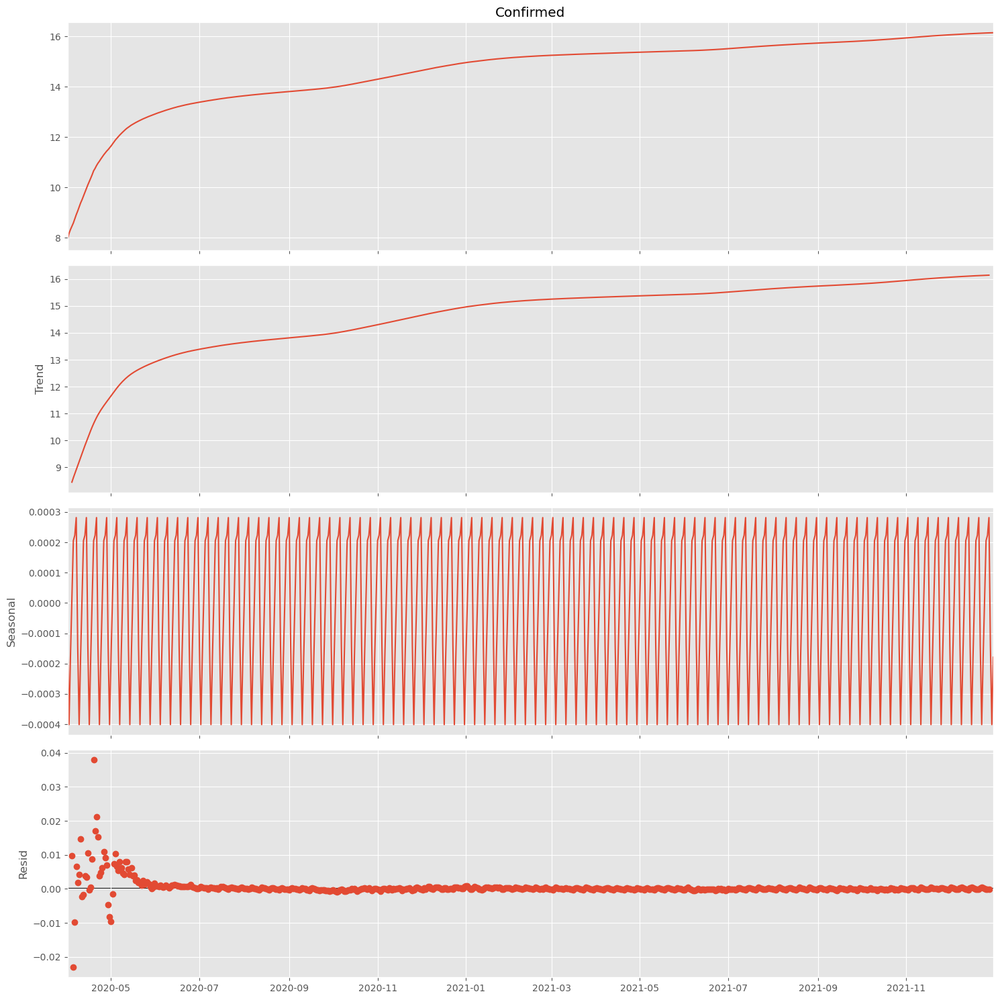

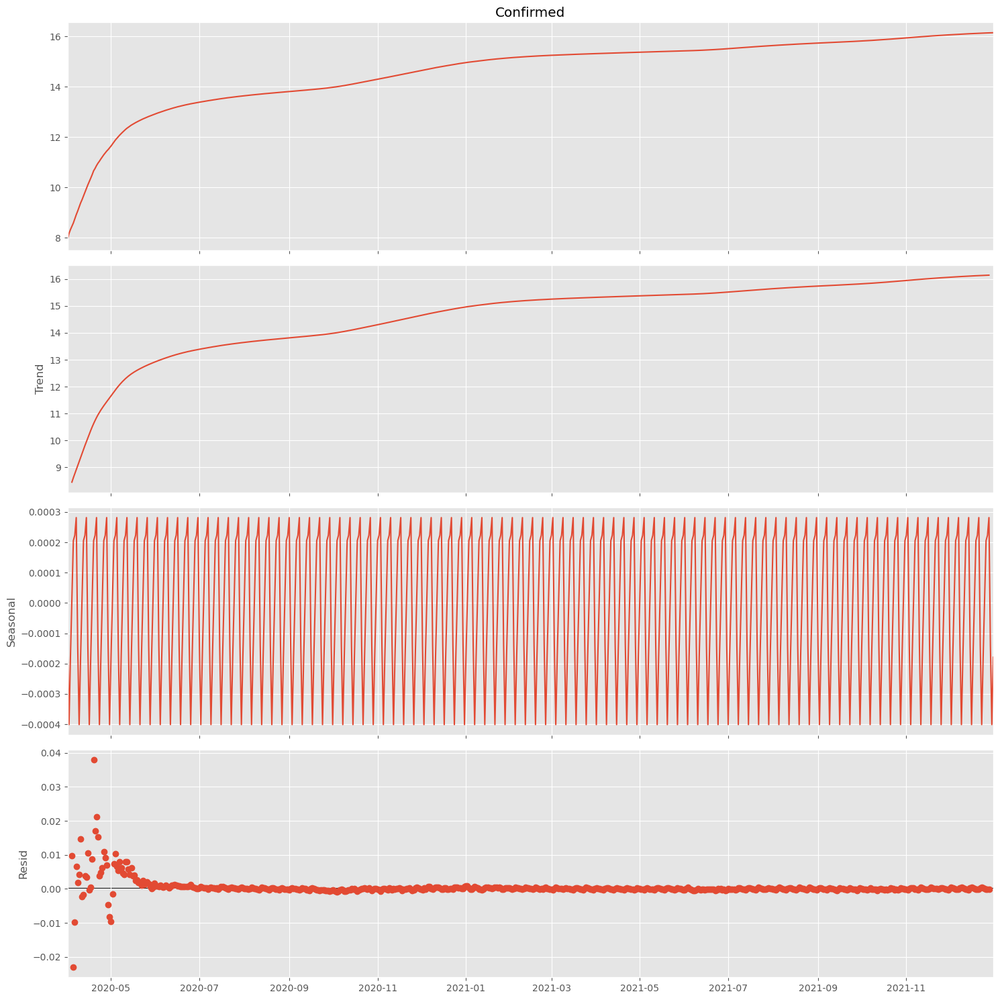

In [77]:
dec_log = seasonal_decompose(np.log(ts), model='additive')
dec_log.plot()

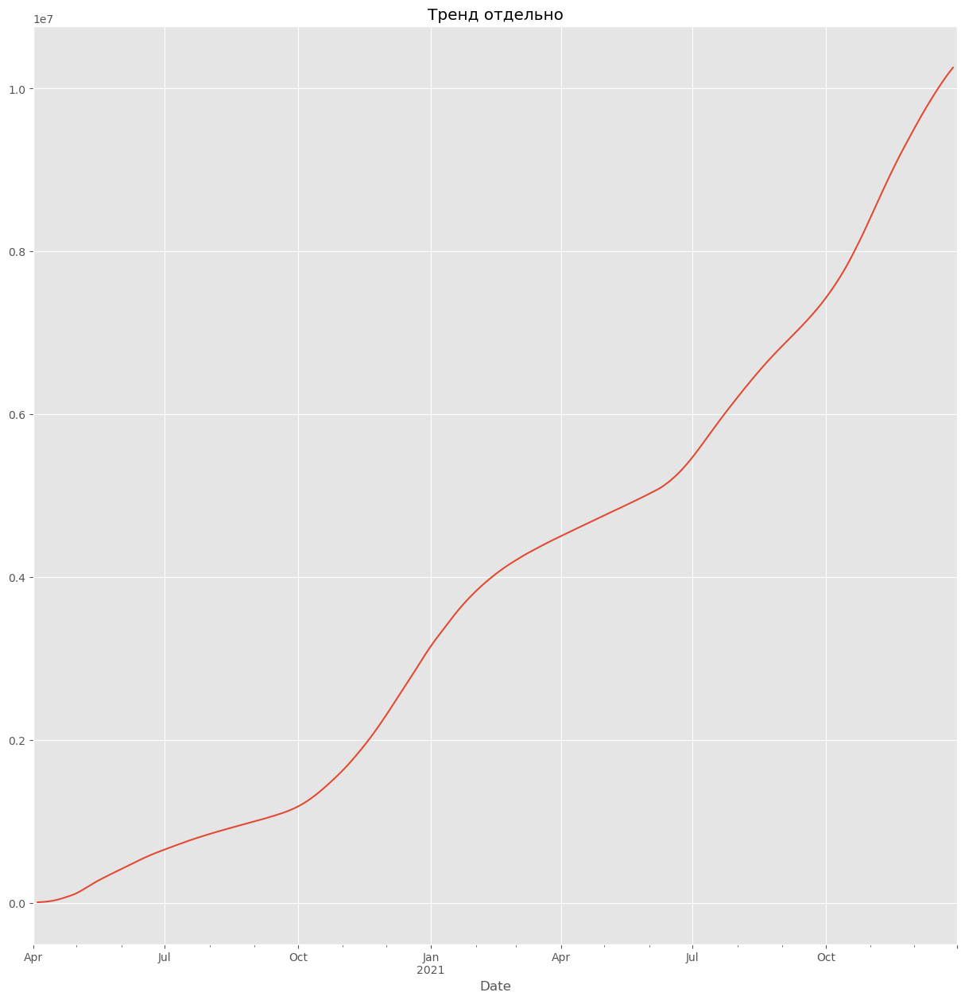

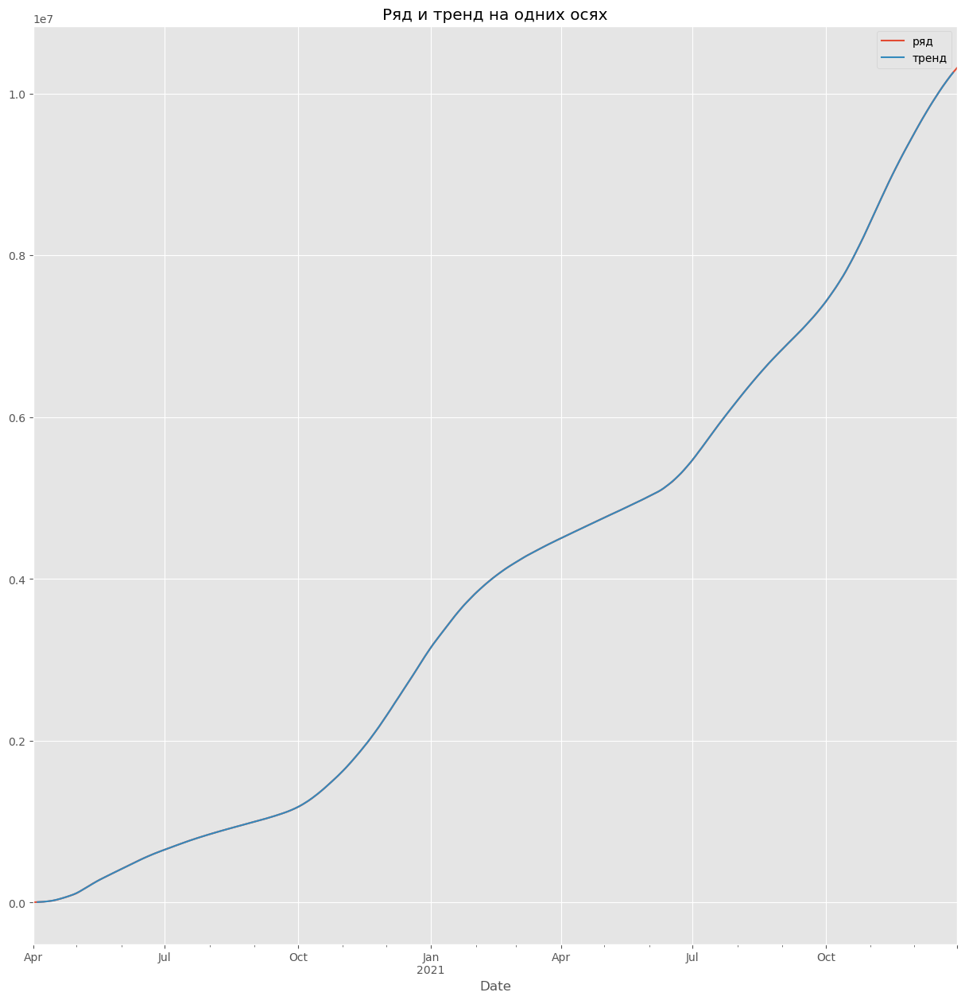

In [78]:
dec.trend.plot()
plt.title('Тренд отдельно')
plt.show()

plt.figure()
ts.plot(label='ряд')
dec.trend.plot(label='тренд')
plt.legend()
plt.title('Ряд и тренд на одних осях')
plt.show()

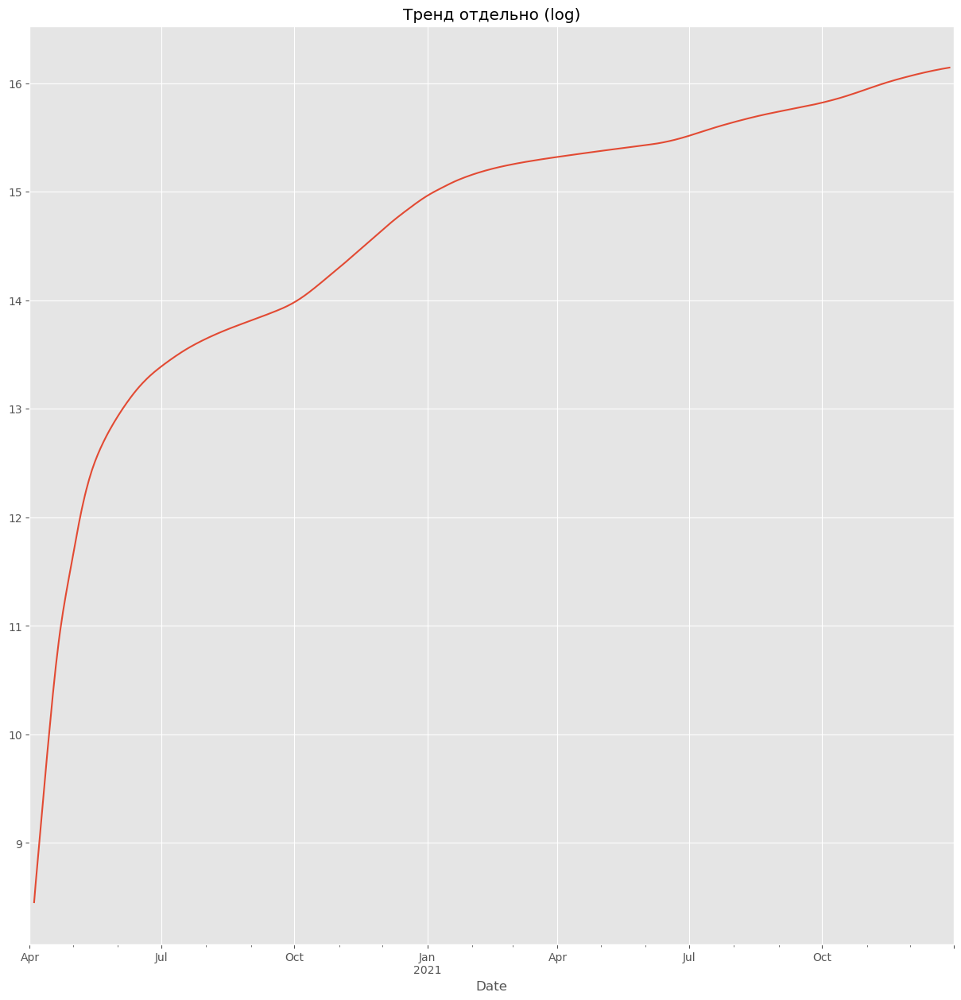

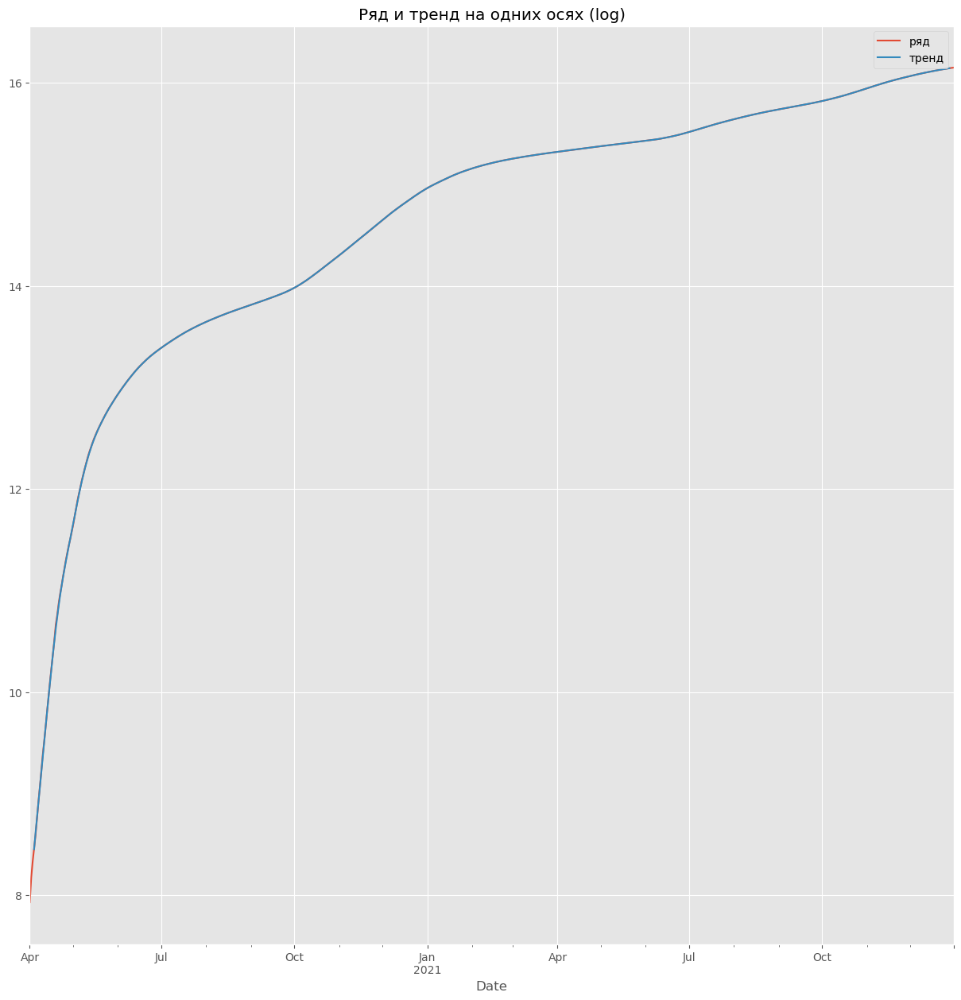

In [79]:
dec_log.trend.plot()
plt.title('Тренд отдельно (log)')
plt.show()

ts_log = np.log(ts)
plt.figure()
ts_log.plot(label='ряд')
dec_log.trend.plot(label='тренд')
plt.legend()
plt.title('Ряд и тренд на одних осях (log)')
plt.show()

По графикам тренда и ряда, получается так, что и для логарифмического временного ряда и для обычного ряда исходного тренд полностью повторяет сам ряд, я предполагаю, что тут причина в том, что исходный ряд у нас состоит из накопленных значений и изменения не сильно видны, то есть нам нужно точно сделать разницу, чтобы смотреть на суточный прирост. 

In [80]:
from statsmodels.tsa.stattools import adfuller

In [81]:
adfuller(ts)

(np.float64(1.7775514594128354),
 np.float64(0.9983034391938675),
 17,
 622,
 {'1%': np.float64(-3.4409070618215996),
  '5%': np.float64(-2.8661978948030686),
  '10%': np.float64(-2.569250572471335)},
 np.float64(9639.675067422526))

In [82]:
adfuller(ts_log)

(np.float64(-2.6905532352210684),
 np.float64(0.07568728623508773),
 20,
 619,
 {'1%': np.float64(-3.440958441424668),
  '5%': np.float64(-2.86622052433566),
  '10%': np.float64(-2.569262629991048)},
 np.float64(-7288.833283411808))

In [83]:
adfuller(diff1)

(np.float64(-2.9879062356251644),
 np.float64(0.03603934500473994),
 16,
 622,
 {'1%': np.float64(-3.4409070618215996),
  '5%': np.float64(-2.8661978948030686),
  '10%': np.float64(-2.569250572471335)},
 np.float64(9625.000894857272))

In [84]:
adfuller(diff2)

(np.float64(-2.307101571306943),
 np.float64(0.1696878022215204),
 20,
 617,
 {'1%': np.float64(-3.440992973242412),
  '5%': np.float64(-2.8662357332485353),
  '10%': np.float64(-2.569270733669741)},
 np.float64(9606.567975655043))

По тесту adfuller у нас только 1 ряд является стационырным - это как раз ряд из разности, у остальных значение p_value > 0.05 и значит, что они не стационарны, то есть нам нужно рассматривать разность ряда. В семинаре мы обсуждали стационарность ряда и его стационарность нам важна, потому что по стационарному ряду просто строить прогноз, так как мы полагаем, что его будущие статистические характеристики не будут отличаться от наблюдаемых текущих. И вот как раз тест adfuller помогает понять стационарен ли ряд, так как он проверяет нулевую гипотезу о том, что у ряда есть единичный корень, то есть ряд не стационарен

#### 2.3. (8 баллов)

Для выбранного вами в предыдущем задании временного ряда и еще одного любого постройте графики ACF и PACF. Что показывают эти функции и что можно увидеть на графиках? Прокомментируйте полученные результаты: являются ли временные ряды сезонными? Видна ли на графиках длина сезонной составляющей ряда? В случае присутствия сезонности, разбейте временной ряд на повторяющиеся фрагменты и нарисуйте их наложенными для иллюстрации этой сезонности.


In [85]:
from statsmodels.tsa.stattools import acf, pacf

In [86]:
ts2 = data_c[data_c['Country/Region'] == 'US'].set_index('Date')['Confirmed']
ts2.index = pd.to_datetime(ts2.index)

In [87]:
d_ru = ts.diff().dropna()
d_us = ts2.diff().dropna()

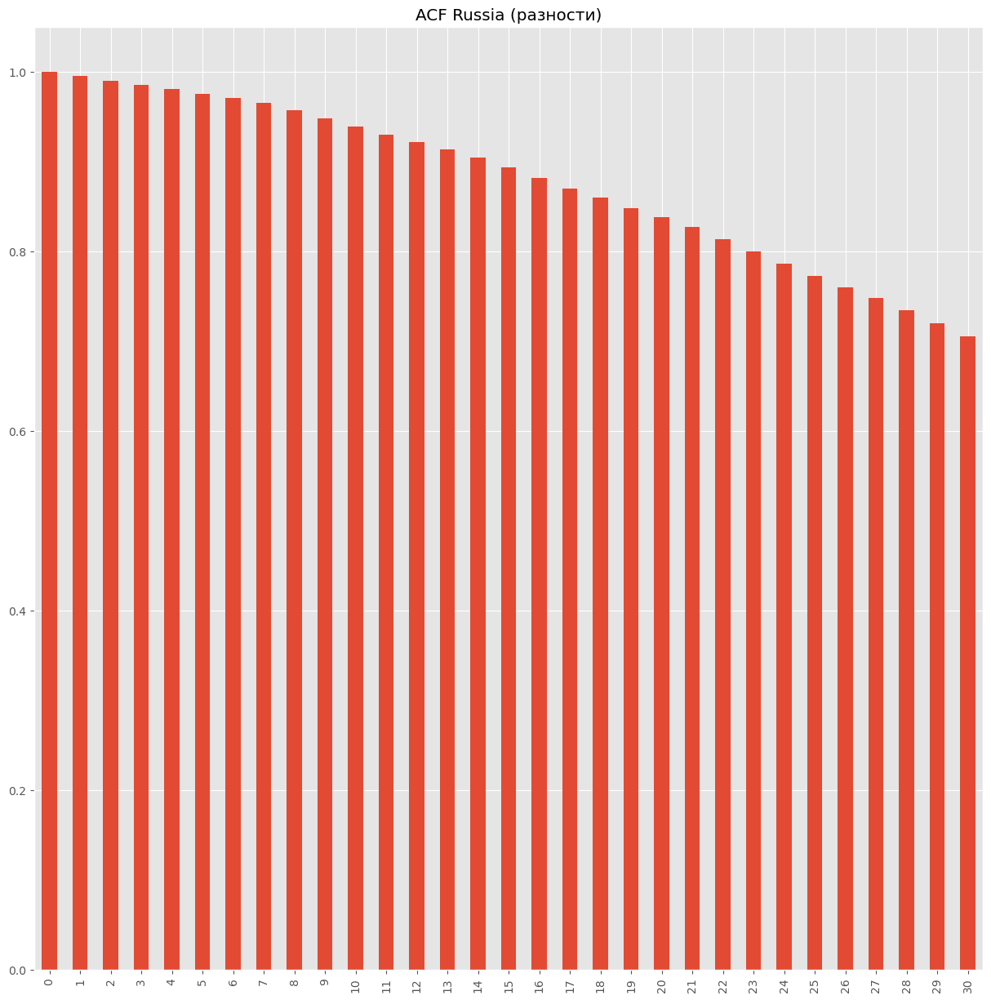

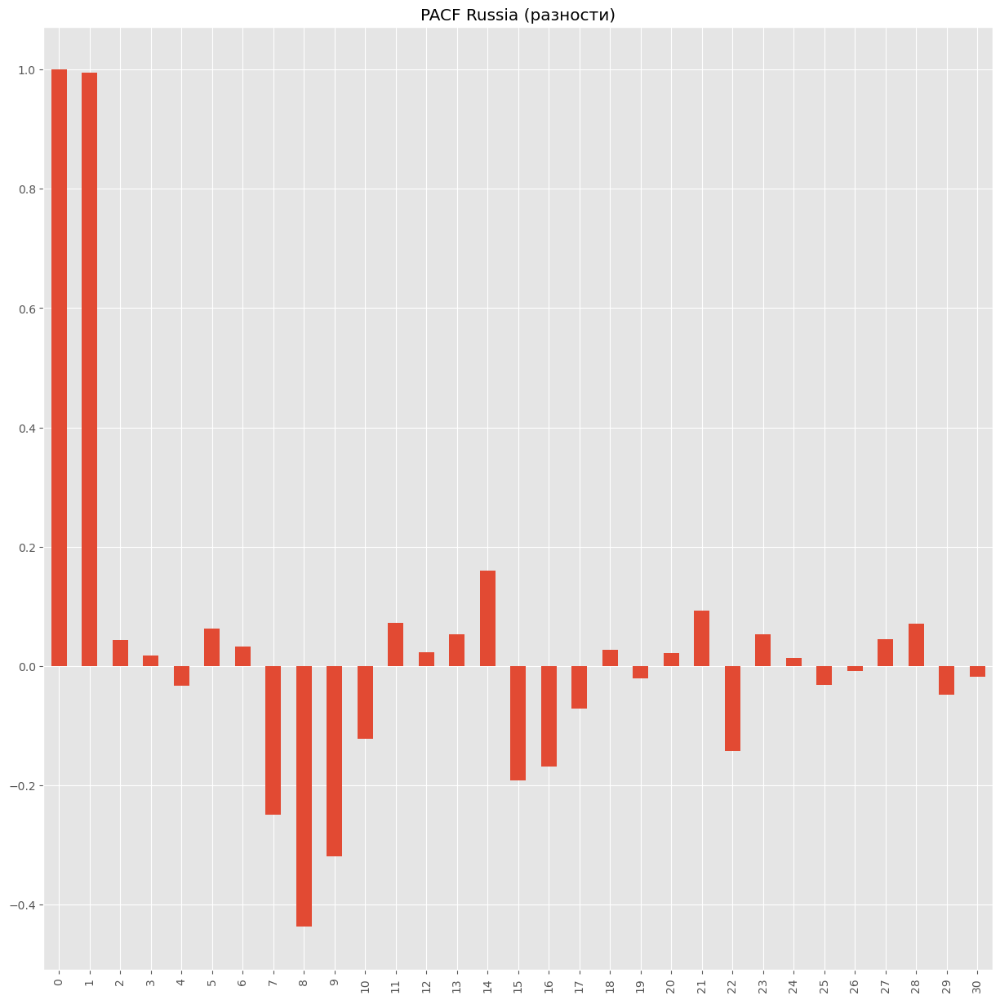

In [88]:
pd.Series(acf(d_ru, nlags=30)).plot(kind='bar')
plt.title('ACF Russia (разности)')
plt.show()

pd.Series(pacf(d_ru, nlags=30, method='ols')).plot(kind='bar')
plt.title('PACF Russia (разности)')
plt.show()

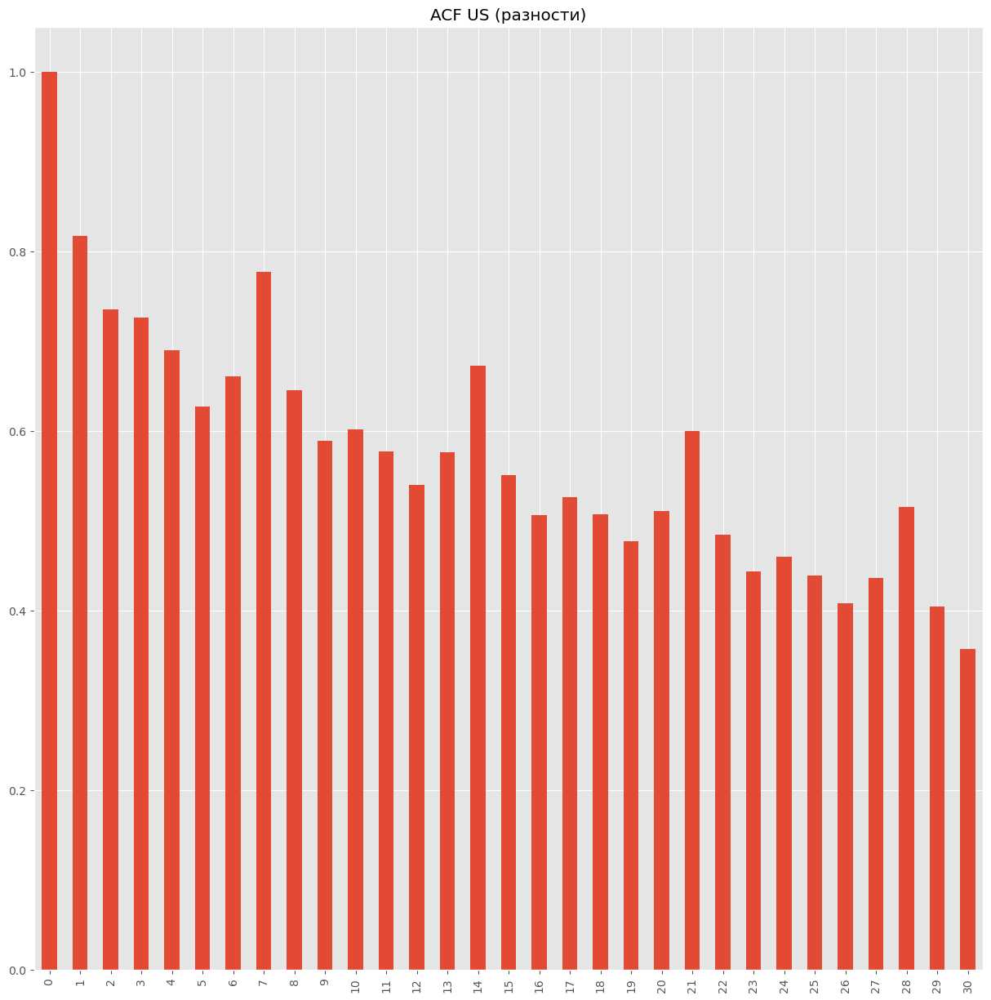

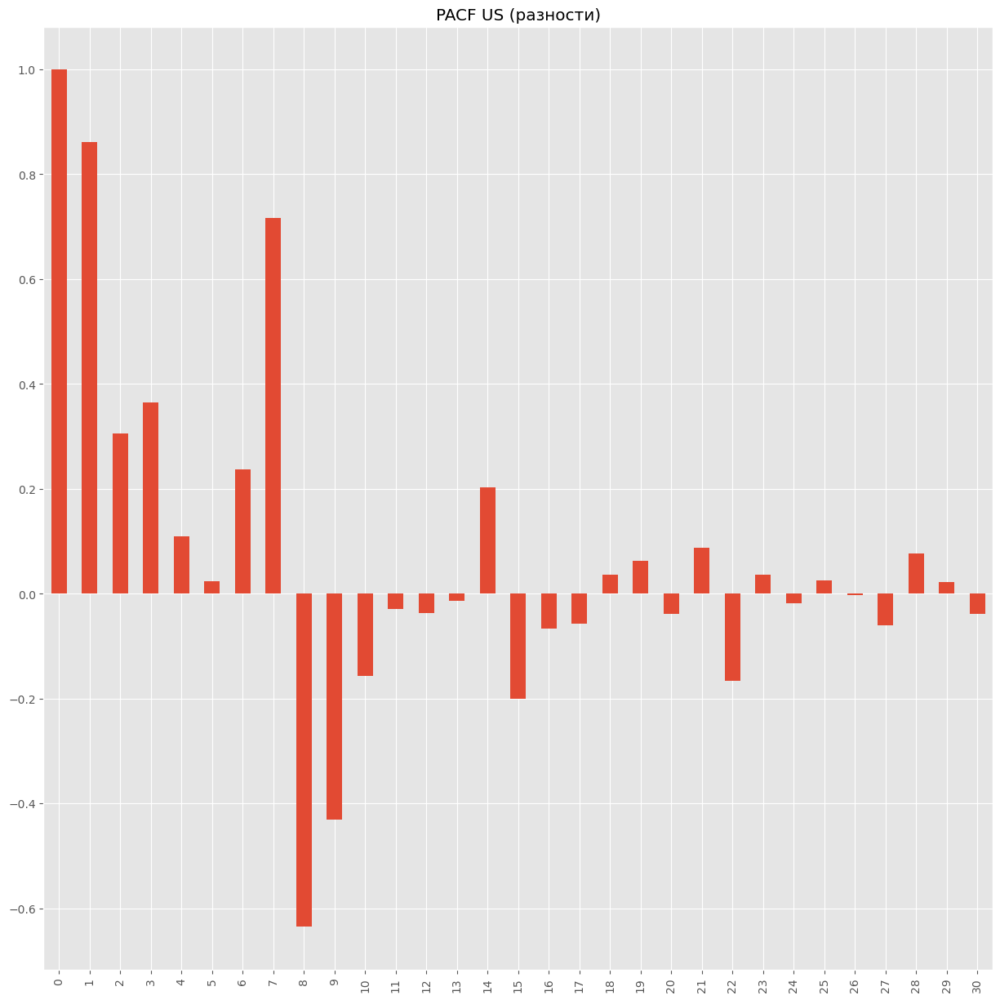

In [89]:
pd.Series(acf(d_us, nlags=30)).plot(kind='bar')
plt.title('ACF US (разности)')
plt.show()

pd.Series(pacf(d_us, nlags=30, method='ols')).plot(kind='bar')
plt.title('PACF US (разности)')
plt.show()

Я взял в качестве второго ряда страну США и построил для России и для США ACF и PACF графики, то есть ACF график помогает нам посмотреть на автокорреляцию ряда, то есть с какой переодичностью наш ряд повторяется и вот у первого временного ряда я не увидел сезонности, а вот у США она явна видна, на ACF графике на лагах 7,14 и 21 есть явные всплески (то есть недельная сезонность). 

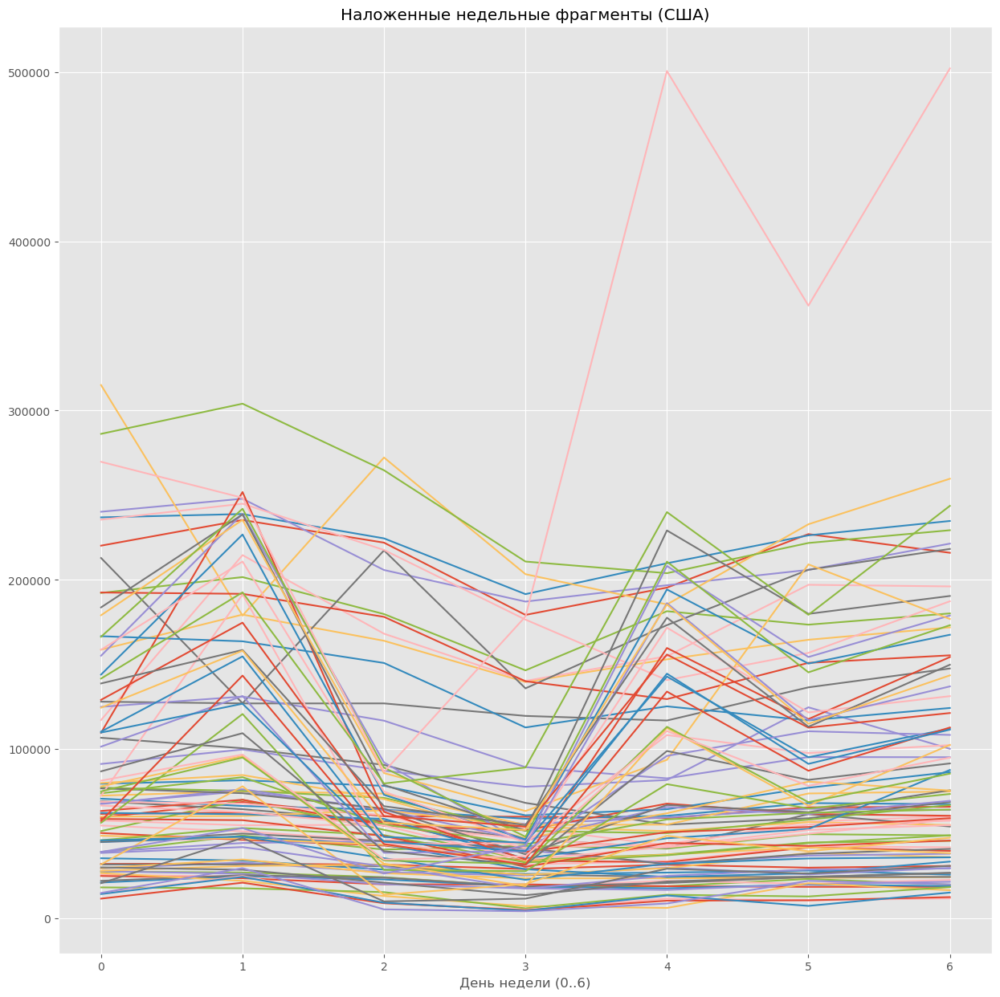

In [90]:
for i in range(0, len(d_us) - 7, 7):
    week = d_us[i:i+7]
    plt.plot(range(7), week.values)

plt.xlabel('День недели (0..6)')
plt.title('Наложенные недельные фрагменты (США)')
plt.show()

Россию я не строил, так как в ней нет сезонности, я взял ряд с США и построил для него график с помощью разбиения временного ряда на повторяющиеся фрагменты (длинной 7 дней) и нарисовал их наложенными для иллюстрации этой сезонности. По самому графику видно, что как раз длинна в 7 дней хорошо отражает сезонность у нас почти все линии имеют схожую повторяющуюся форму, то есть внутри каждой недели прирост падает и растёт примерно в одни и те же дни

#### 2.4. (5 баллов)

Вспомним, что для прогнозирования временного ряда необходимо разделить выборку на две составляющие (train и test). На составляющей train наша модель обучается и настраивает свои параметры, на составляющей test модель осуществляет предсказание (а затем мы можем это предсказание сравнить с реальными данными)

Осуществите разбиение датасета на выборку train и test. Соотношение размеров train/test на ваше усмотрение, но мы советуем вам выбрать 85% на 15% или 80% на 20% (при условии, что при этом в test остаётся не менее 20-25 наблюдений).

Отрисуйте не менее 3 разных временных рядов и визуально сделайте различимым разбиение на выборки — либо вертикальной чертой, либо разными цветами.

*Подсказка. Вам может помочь раздел "Прогнозирование в будущее" в соответствующем семинаре.*

Я взял как третий ряд Италию и выделил эти ряды в отдельный датасет. Временные ряды нельзя делить обычным train_test_split, так как он перемешивает наблюдения случайным образом, а в рядах важен порядок во времени и делить нужно обязательно по времени, тест не может быть раньше трейна, так как это временной ряд и это важное замечание, поэтому тут я разбиваю вручную в зависимости от длинны ряда, учитывая во времени

In [91]:
data_c = data_c.sort_values(['Country/Region', 'Date'])

In [92]:
data_3_count = data_c[data_c['Country/Region'].isin(['Russia', 'US', 'Italy'])]
data_3_count['Country/Region'].unique()

array(['Italy', 'Russia', 'US'], dtype=object)

In [93]:
data_3_count

,Date,Country/Region,Province/State,Confirmed,Recovered,Deaths,Continent,days_since_first,new_cases,new_deaths,Deth/Conf,day_of_week,density,median_age
125734,2020-04-01,Italy,NaN,110574,16847.00,13155,EU,61.00,4782.00,727.00,0.12,2,206.00,47
125735,2020-04-02,Italy,NaN,115242,18278.00,13915,EU,62.00,4668.00,760.00,0.12,3,206.00,47
125736,2020-04-03,Italy,NaN,119827,19758.00,14681,EU,63.00,4585.00,766.00,0.12,4,206.00,47
125737,2020-04-04,Italy,NaN,124632,20996.00,15362,EU,64.00,4805.00,681.00,0.12,5,206.00,47
125738,2020-04-05,Italy,NaN,128948,21815.00,15887,EU,65.00,4316.00,525.00,0.12,6,206.00,47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209601,2021-12-27,US,NaN,52867054,0.00,817438,NaN,705.00,500547.00,1793.00,0.02,0,36.00,38.00
209602,2021-12-28,US,NaN,53229051,0.00,819753,NaN,706.00,361997.00,2315.00,0.02,1,36.00,38.00
209603,2021-12-29,US,NaN,53731144,0.00,822108,NaN,707.00,502093.00,2355.00,0.02,2,36.00,38.00
209604,2021-12-30,US,NaN,54321804,0.00,823603,NaN,708.00,590660.00,1495.00,0.02,3,36.00,38.00


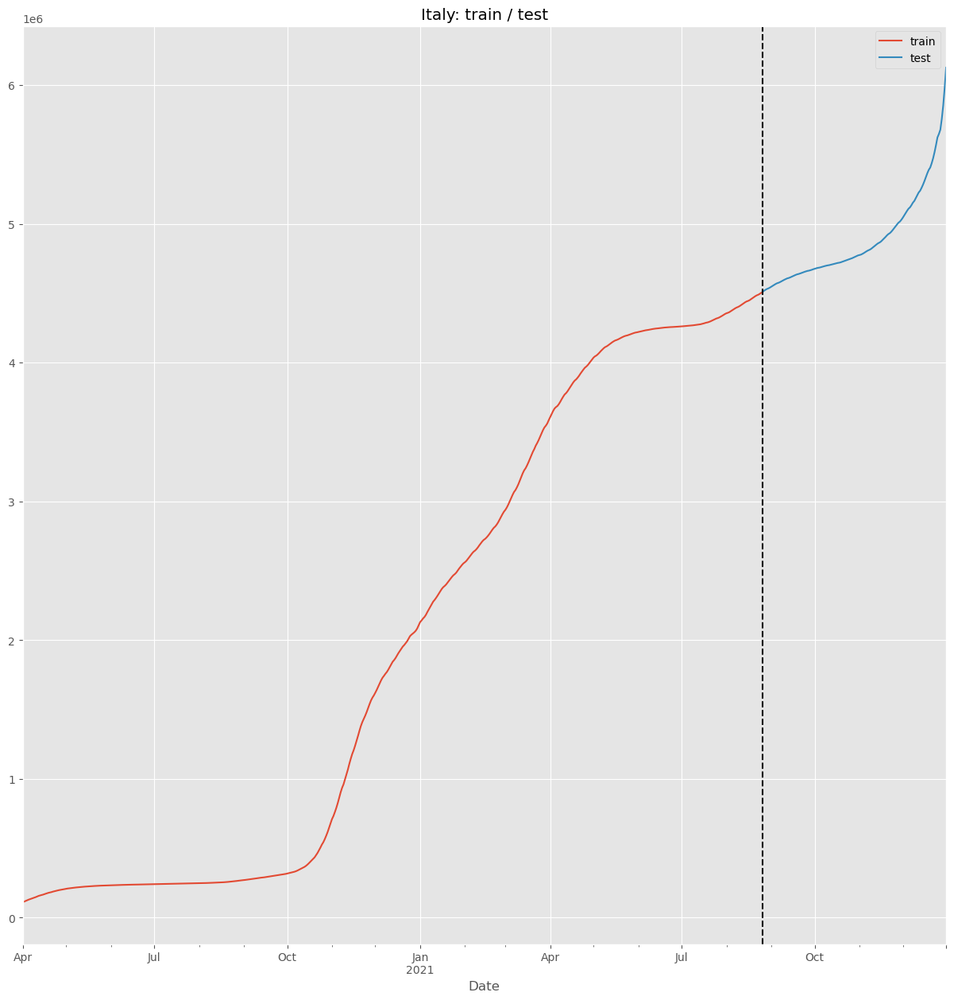

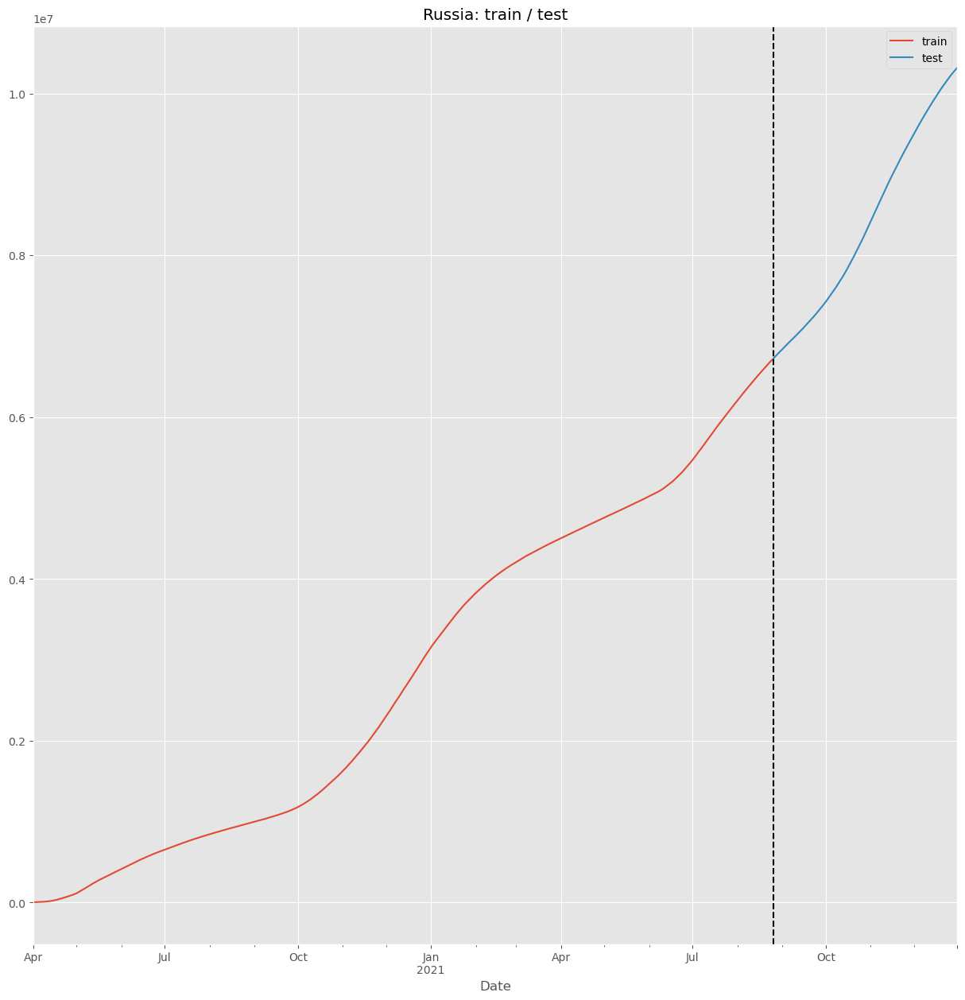

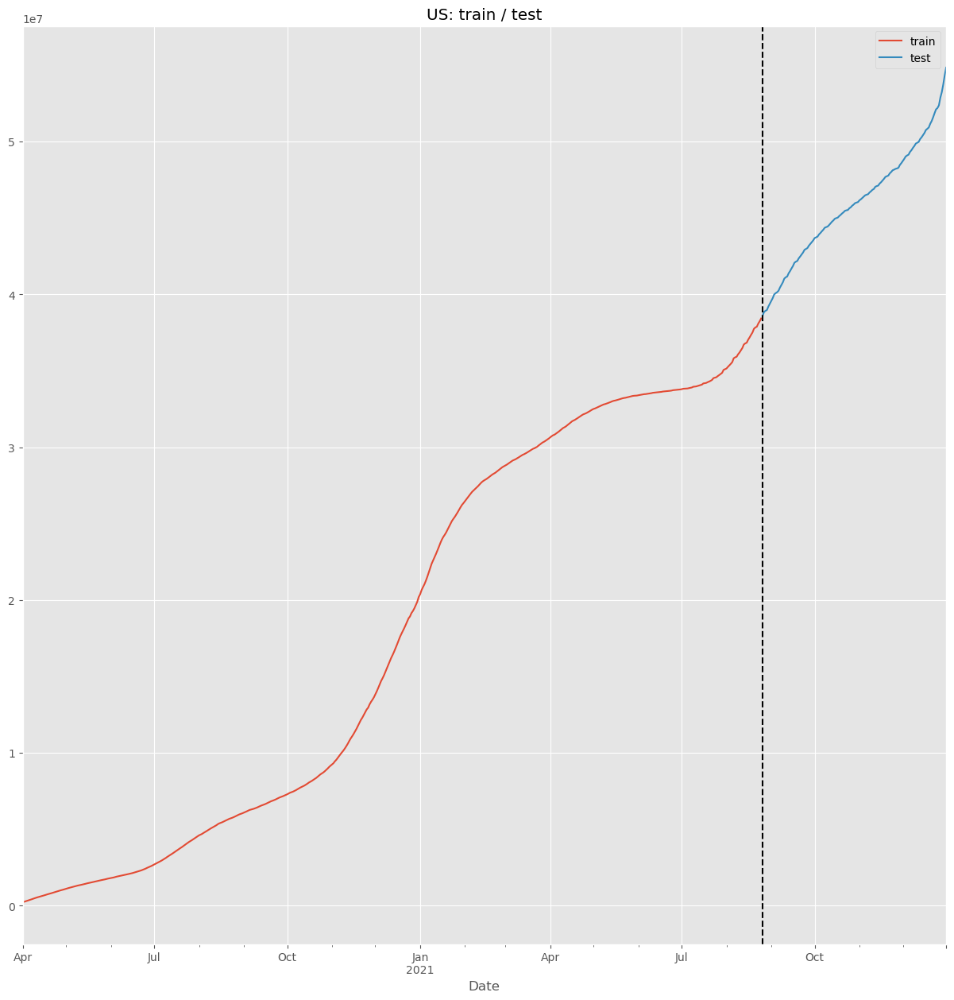

In [94]:
for c in data_3_count['Country/Region'].unique():
    s = data_3_count[data_3_count['Country/Region'] == c]
    s['Date'] = pd.to_datetime(s['Date'])
    s = s.sort_values('Date').set_index('Date')['Confirmed']

    n = int(len(s) * 0.8)
    tr, te = s.iloc[:n], s.iloc[n:]

    tr.plot(label='train')
    te.plot(label='test')
    plt.axvline(te.index[0], color='black', linestyle='--')
    plt.legend()
    plt.title(f'{c}: train / test')
    plt.show()

## Раздел 3. Модели. Прогнозирование временных рядов (60 баллов и 58 бонусных баллов)


В этой третьей и последней части домашнего задания вам предстоит построить несколько моделей и осуществить прогнозирование для временных рядов. Прогнозирование будем делать для такого показателя как летальность от вируса. Летальность можно рассчитывать по формуле:

$$ CFR = \frac{Deaths}{Confirmed} $$

Для каждого типа модели сделайте несколько прогнозов для не менее 3 разных стран/регионов/другое (на ваш обоснованный выбор). Главное, чтобы каждый из типов моделей прознозировал одинаковый набор данных, чтобы в конце можно было сделать выводы о качестве работы той или иной модели.

В качестве метрики качества взять RMSE.

Таким образом, по итогу построения и применения **каждой из моделей** должно быть следующее:
- Вывести массив прогнозов значений (массив имеет размер test-выборки)
- Визуализировать на графике значения ряда из train-выборки одним цветом и прогнозные значения модели (из массива прогнозов) другим цветом, на одних осях
- Визуализировать на графике значения всего ряда (и из train, и из test-выборок) одним цветом и прогнозные значения модели другим цветом, на одних осях (то есть по прогнозным значениям идет наложение двух графиков — подробнее см. в соотв. семинаре)
- Подсчитать метрику качества по test-выборке
- Добавить результаты метрики качества в общую сводную табличку (по строкам — название модели, по столбцам — RMSE для каждого из рядов — подробнее см. в соотв. семинаре)

*Примечание. Данный алгоритм необходимо повторять для каждой модели, учитывая разные параметры. Иными словами ARIMA(1,0,1) и ARIMA(2,0,1) — это разные модели*

Не забывайте обязательно сопровождать ваш код комментариями, графиками и выводами.

#### 3.1. Прогнозирование средним (Mean Constant Model)  (5 баллов)

Осуществите простое прогнозирование средним значением

In [95]:
def RMSE(predicted, actual): #из семинара
    mse = (predicted - actual)**2
    rmse = np.sqrt(mse.sum()/mse.count())
    return rmse

In [96]:
cfr = {}
for c in ['Russia', 'US', 'Italy']:
    s = data_3_count[data_3_count['Country/Region'] == c].copy()
    s['Date'] = pd.to_datetime(s['Date'])
    s = s.sort_values('Date').set_index('Date')
    cfr[c] = s['Deth/Conf']

In [97]:
# Делим на трейн и тест трейн у нас 80, тест 20 (как в задании выше)
train, test = {}, {}
for c in ['Russia', 'US', 'Italy']:
    n = int(len(cfr[c]) * 0.8)
    train[c], test[c] = cfr[c].iloc[:n], cfr[c].iloc[n:]

In [98]:
results = pd.DataFrame(columns=['Russia', 'US', 'Italy'])

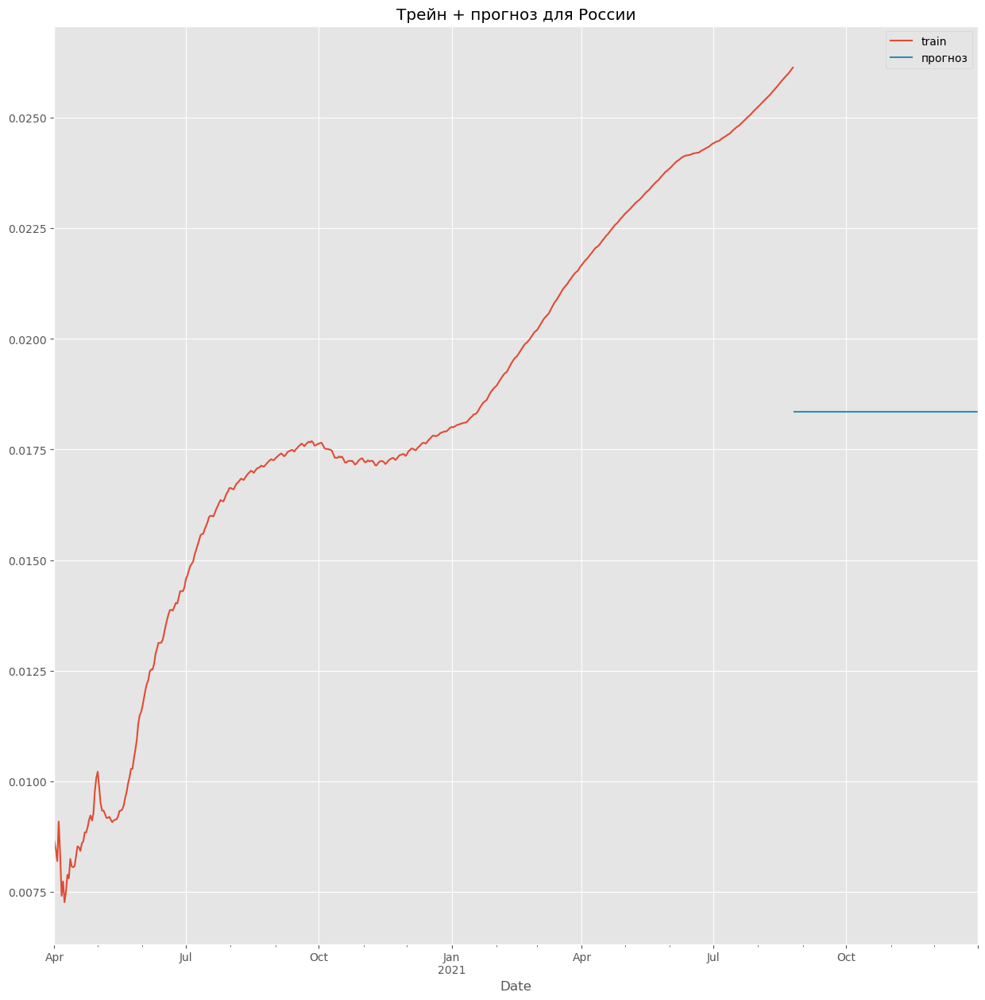

In [99]:
# теперь можем посчитать среднее для ряда и сделать предсказание
mean_value = train['Russia'].mean()
forecast = pd.Series(mean_value, index=test['Russia'].index)

train['Russia'].plot(label='train')
forecast.plot(label='прогноз')
plt.legend()
plt.title('Трейн + прогноз для России')
plt.show()

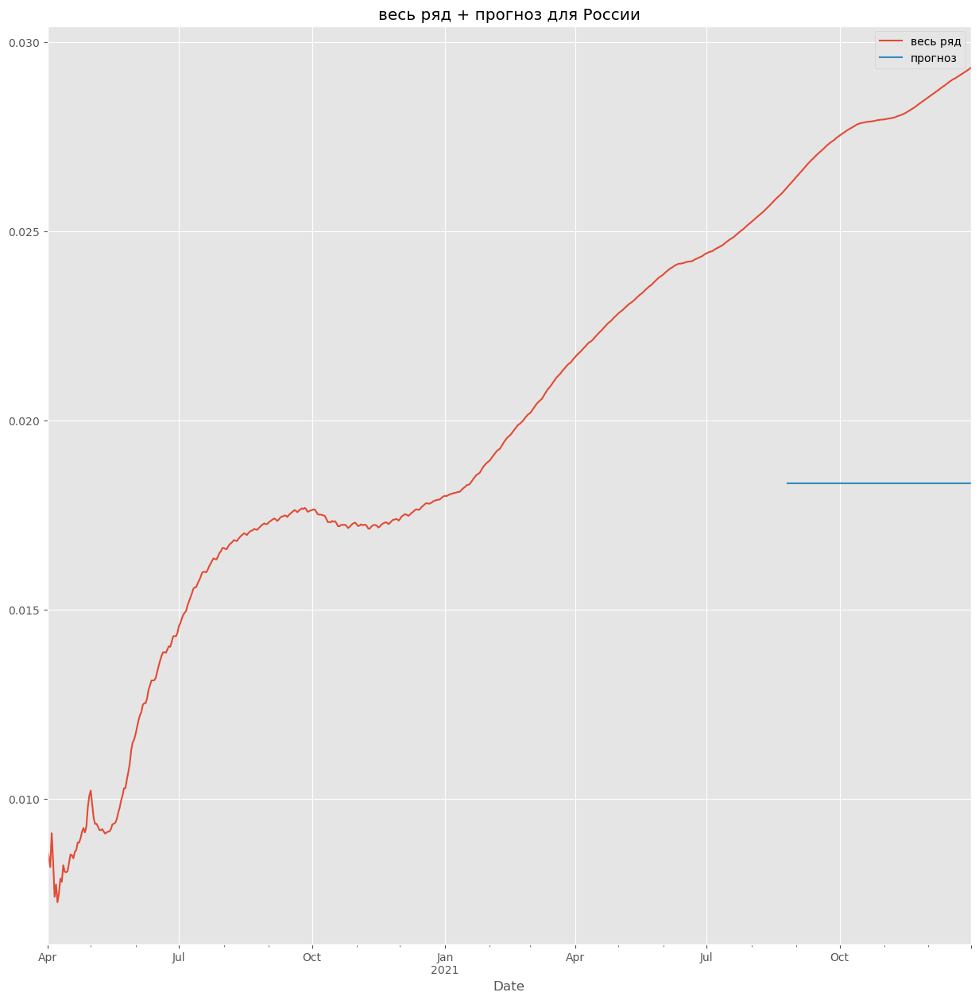

In [100]:
cfr['Russia'].plot(label='весь ряд')
forecast.plot(label='прогноз')
plt.legend()
plt.title('весь ряд + прогноз для России')
plt.show()

In [101]:
rmse = RMSE(forecast, test['Russia'])
results.loc['Mean', 'Russia'] = rmse
print('Russia RMSE =', round(rmse, 5))

Russia RMSE = 0.0096


По первому ряду (для России) видно, что прогнозирование средним, очень слабое получилось, надо посмотреть как будет на США и Италии

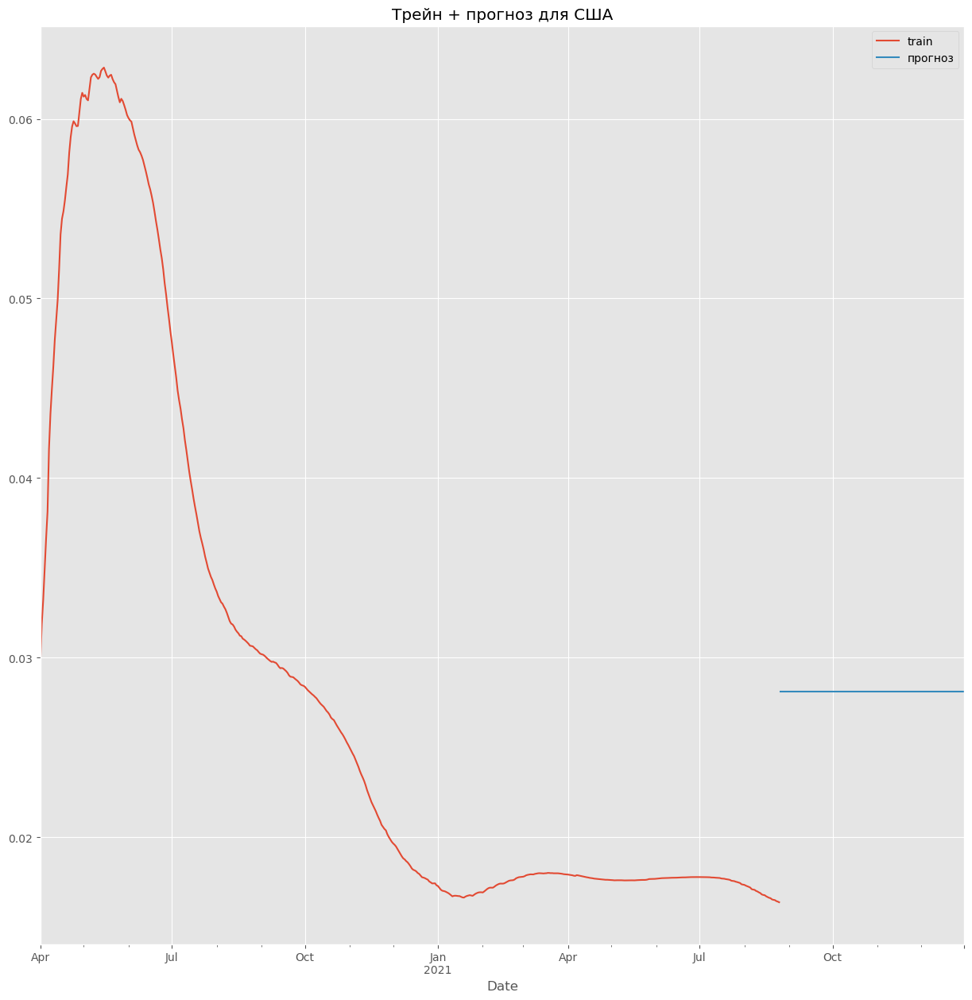

In [102]:
mean_value = train['US'].mean()
forecast = pd.Series(mean_value, index=test['US'].index)

train['US'].plot(label='train')
forecast.plot(label='прогноз')
plt.legend()
plt.title('Трейн + прогноз для США')
plt.show()

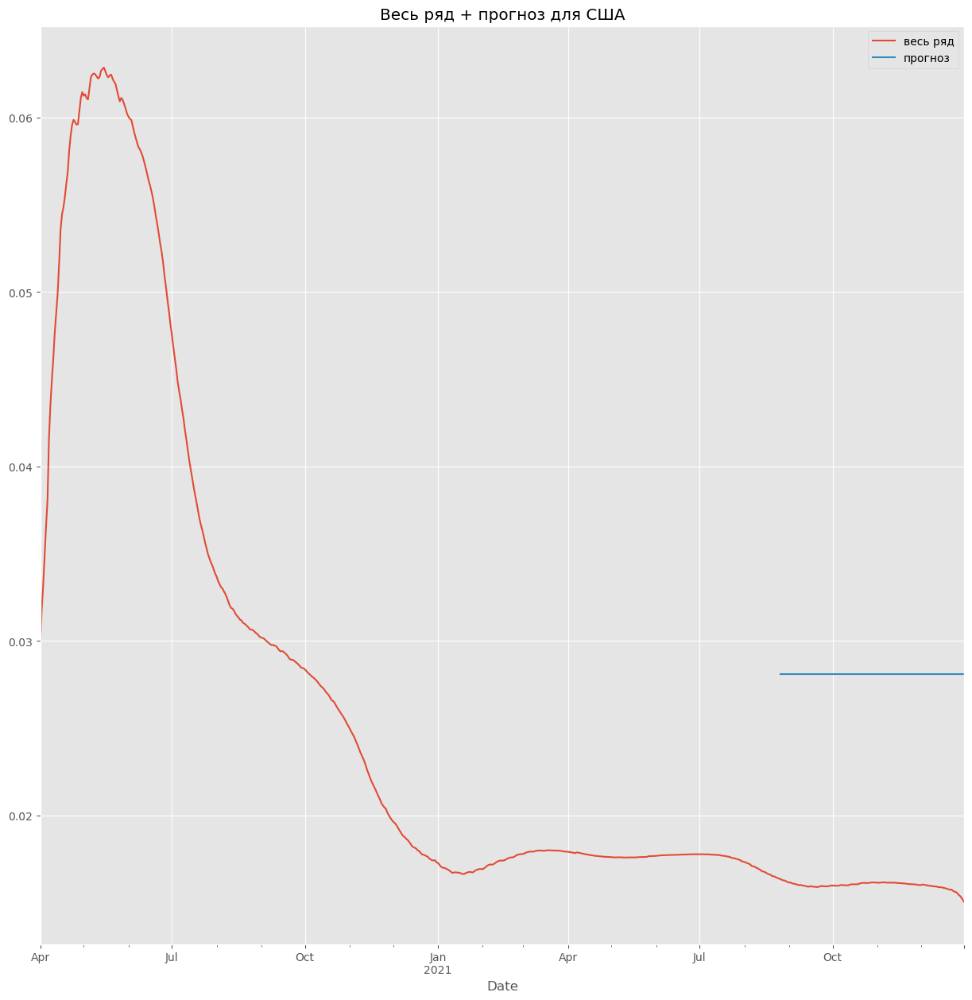

In [103]:
cfr['US'].plot(label='весь ряд')
forecast.plot(label='прогноз')
plt.legend()
plt.title('Весь ряд + прогноз для США')
plt.show()

In [104]:
rmse = RMSE(forecast, test['US'])
results.loc['Mean', 'US'] = rmse
print('US RMSE =', round(rmse, 5))

US RMSE = 0.01211


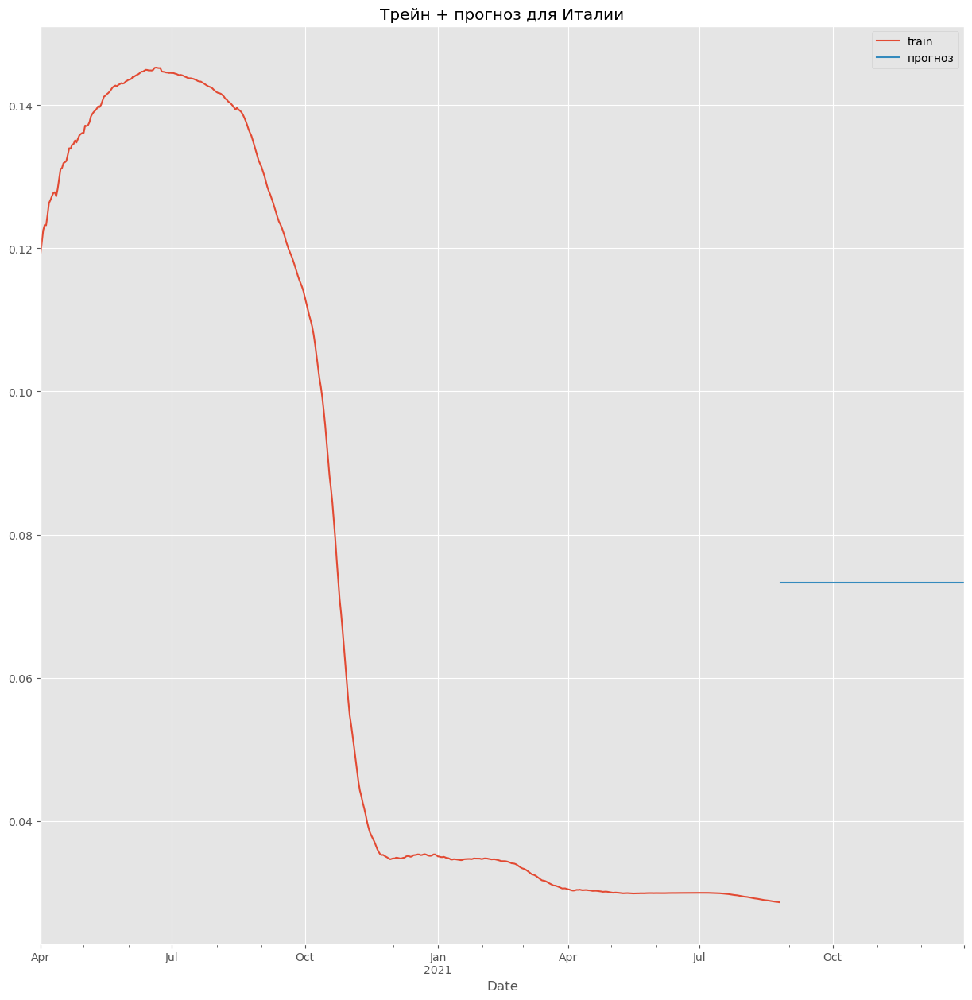

In [105]:
mean_value = train['Italy'].mean()
forecast = pd.Series(mean_value, index=test['Italy'].index)

train['Italy'].plot(label='train')
forecast.plot(label='прогноз')
plt.legend()
plt.title('Трейн + прогноз для Италии')
plt.show()

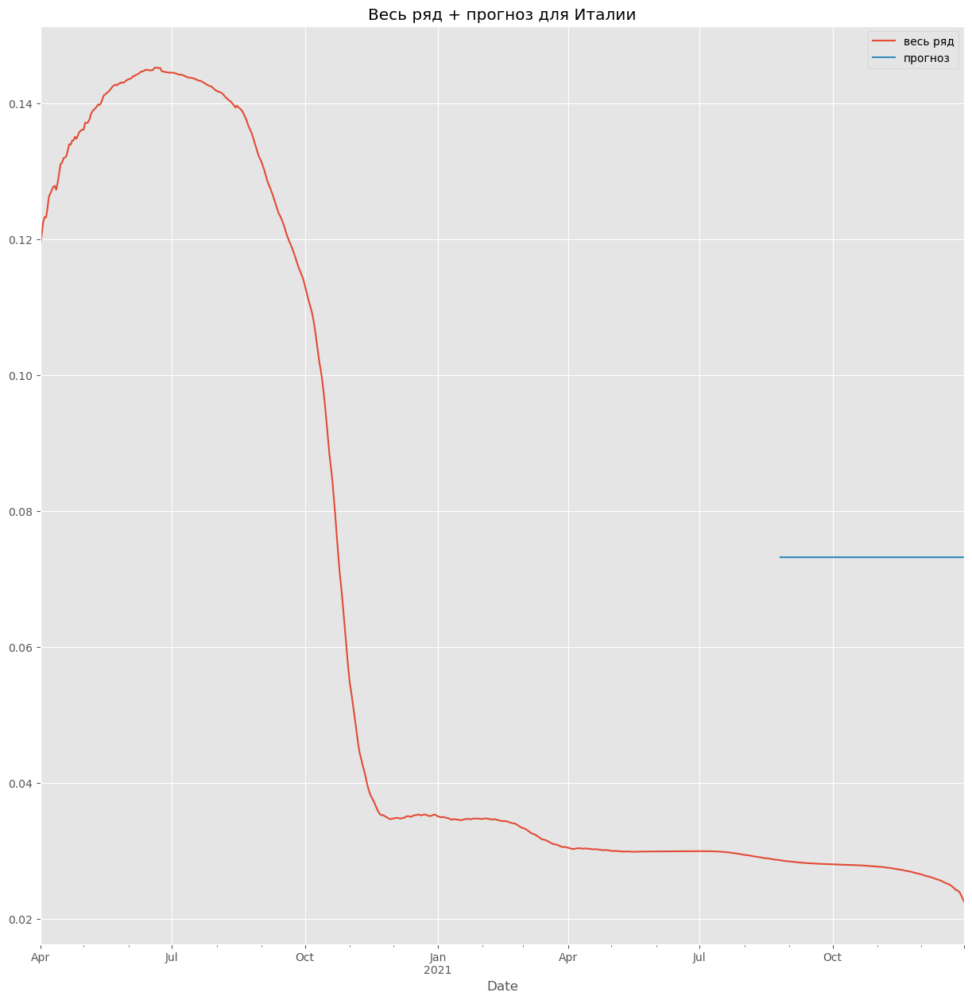

In [106]:
cfr['Italy'].plot(label='весь ряд')
forecast.plot(label='прогноз')
plt.legend()
plt.title('Весь ряд + прогноз для Италии')
plt.show()

In [107]:
rmse = RMSE(forecast, test['Italy'])
results.loc['Mean', 'Italy'] = rmse
print('Italy RMSE =', round(rmse, 5))

Italy RMSE = 0.04608


В итоге мы получаем что для наших трех рядов метрика RMSE будет бейзлайном, прежде чем мы будем применять другие модели, и кстати для России это метрика оказалось меньше всего, что говорит о том, что прогнозирование средним было наиболее удачным именно для России, для Италии у нас была самая большая ошибка она в 4 раза больше. Видимо динамика изменения летальности у нее была активнее и поэтому прогнозирование средним дало довольно большую ошибку. 

#### 3.2. Линейная модель (Linear Trend Model) (5 баллов)

Осуществите предсказание с помощью линейного тренда

Как в семинаре будем использовать smf.ols для предсказания с помощью линейного тренда, по идее он должен давать меньше ошибку чем среднее.

In [108]:
import statsmodels.formula.api as smf

В семинаре мы создавали точки month_since_min, тут я делаю тоже самое для каждого ряда отдельно только days_since_min, это объясняется тем, что модель может видеть только числовой признак и как раз с помощью перменной days_since_min она и может построить тренд 

In [109]:
start = cfr['Russia'].index.min()
tr = pd.DataFrame({'cfr': train['Russia'].values, 'days_since_min': (train['Russia'].index - start).days})
te = pd.DataFrame({'days_since_min': (test['Russia'].index - start).days})

In [110]:
model = smf.ols('cfr ~ days_since_min', data=tr).fit()
forecast = pd.Series(model.predict(te).values, index=test['Russia'].index)

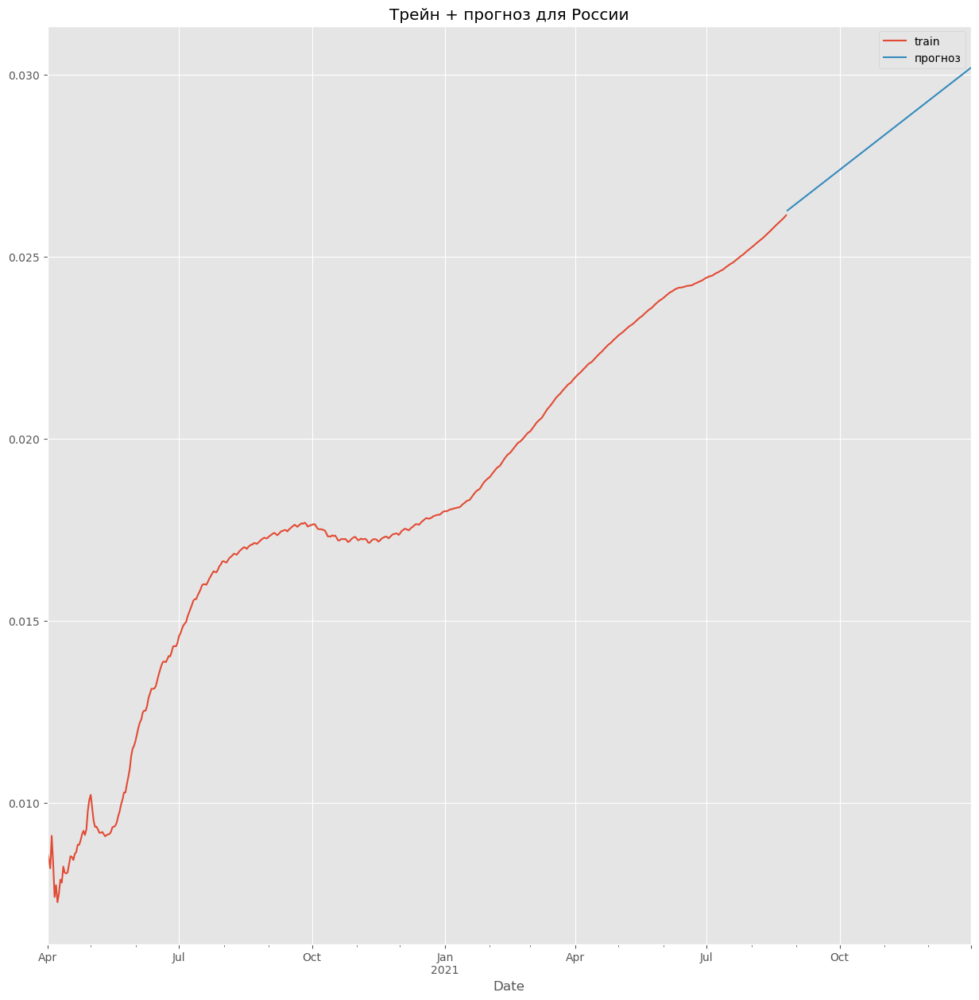

In [111]:
train['Russia'].plot(label='train')
forecast.plot(label='прогноз')
plt.legend()
plt.title('Трейн + прогноз для России')
plt.show()

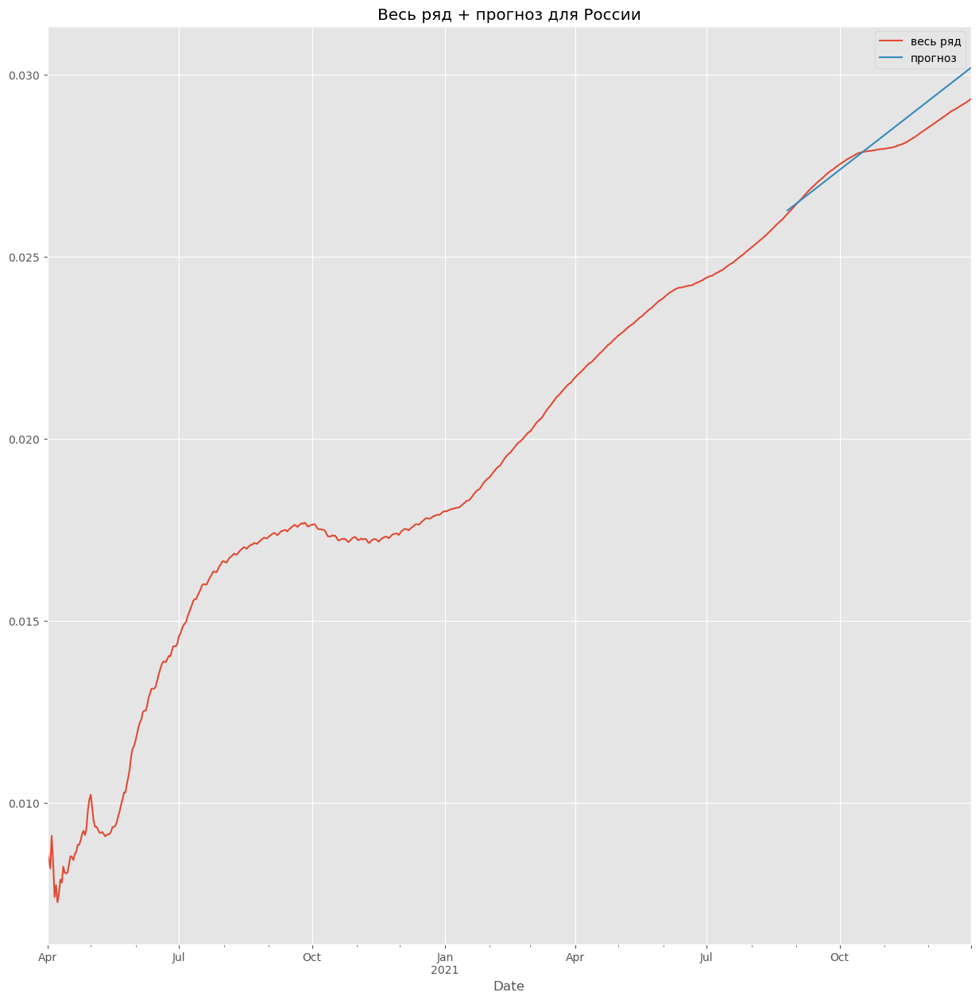

In [112]:
cfr['Russia'].plot(label='весь ряд')
forecast.plot(label='прогноз')
plt.legend()
plt.title('Весь ряд + прогноз для России')
plt.show()

In [113]:
rmse = RMSE(forecast, test['Russia'])
results.loc['Linear', 'Russia'] = rmse
print('Russia RMSE =', round(rmse, 5))

Russia RMSE = 0.0005


In [114]:
#Теперь тоже самое делаем для США и для Италии
start2 = cfr['US'].index.min()
tr2 = pd.DataFrame({'cfr': train['US'].values, 'days_since_min': (train['US'].index - start2).days})
te2 = pd.DataFrame({'days_since_min': (test['US'].index - start2).days})

In [115]:
model2 = smf.ols('cfr ~ days_since_min', data=tr2).fit()
forecast2 = pd.Series(model2.predict(te2).values, index=test['US'].index)

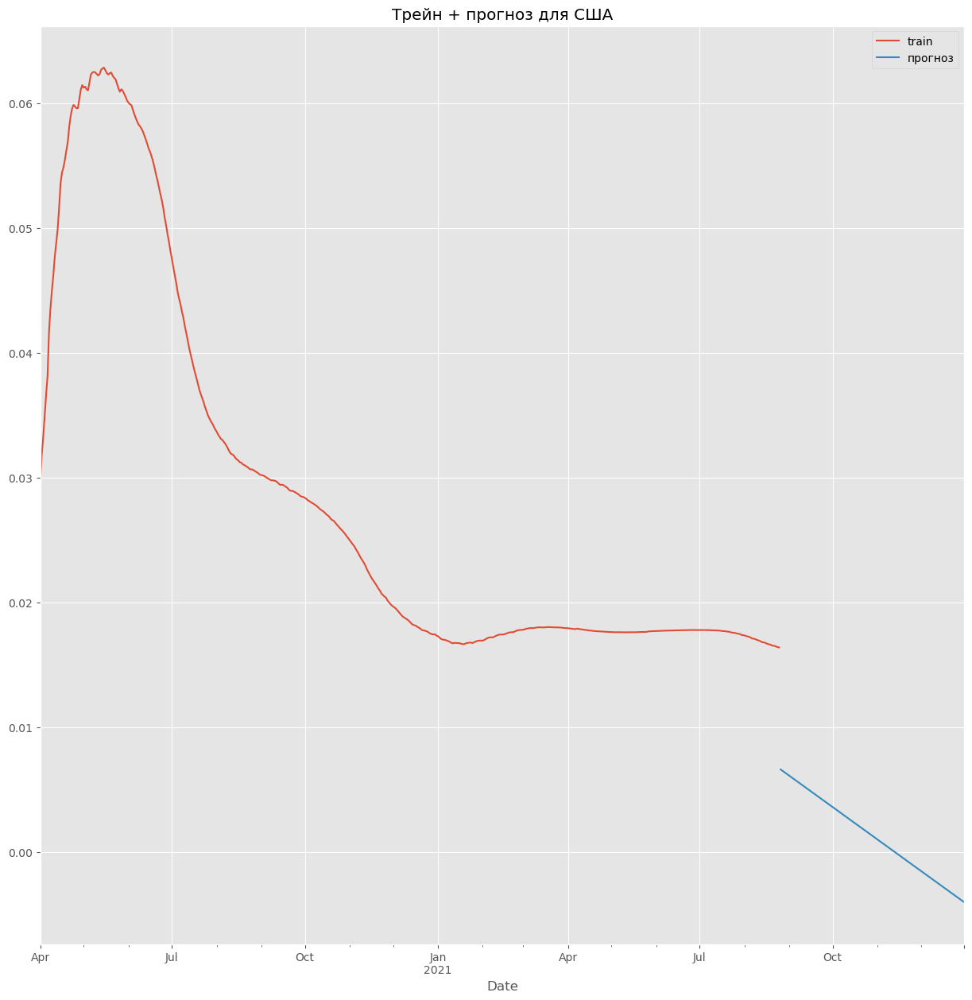

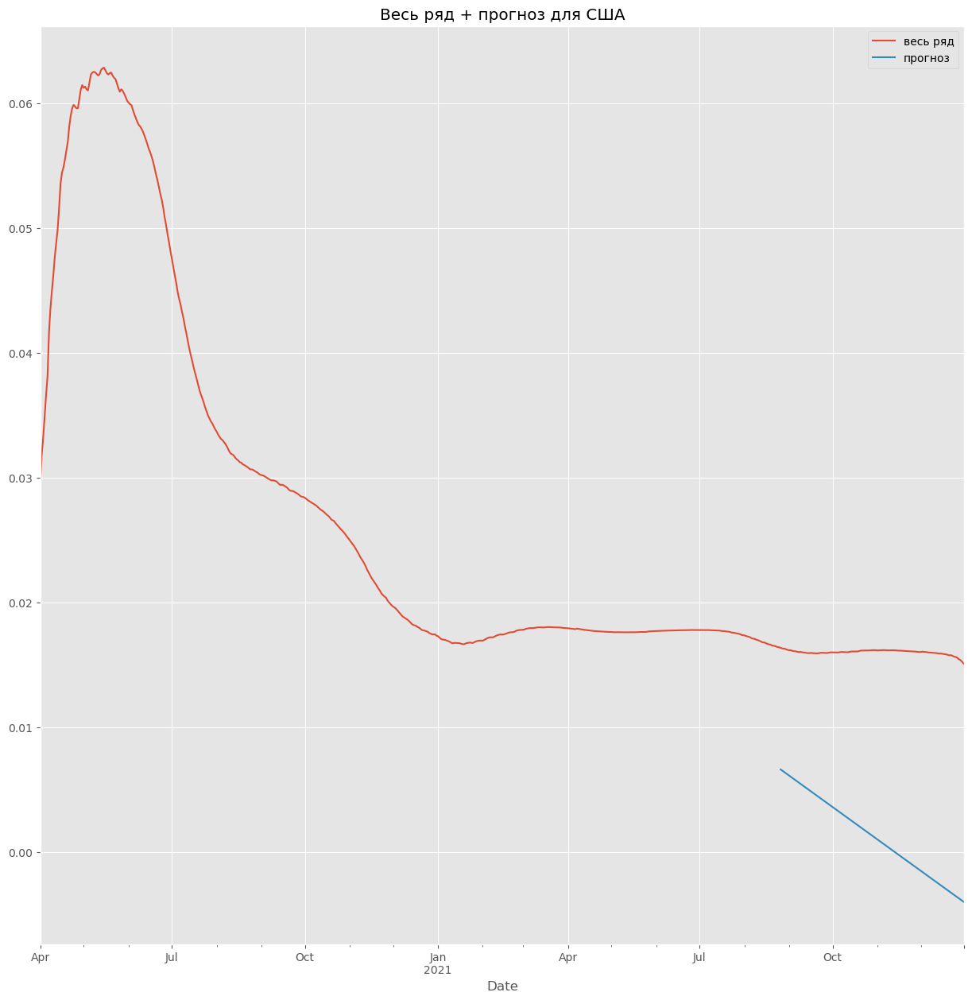

In [116]:
train['US'].plot(label='train')
forecast2.plot(label='прогноз')
plt.legend()
plt.title('Трейн + прогноз для США')
plt.show()

cfr['US'].plot(label='весь ряд')
forecast2.plot(label='прогноз')
plt.legend()
plt.title('Весь ряд + прогноз для США')
plt.show()

In [117]:
rmse = RMSE(forecast2, test['US'])
results.loc['Linear', 'US'] = rmse
print('US RMSE =', round(rmse, 5))

US RMSE = 0.01502


In [118]:
start3 = cfr['Italy'].index.min()
tr3 = pd.DataFrame({'cfr': train['Italy'].values, 'days_since_min': (train['Italy'].index - start3).days})
te3 = pd.DataFrame({'days_since_min': (test['Italy'].index - start3).days})

In [119]:
model3 = smf.ols('cfr ~ days_since_min', data=tr3).fit()
forecast3 = pd.Series(model3.predict(te3).values, index=test['Italy'].index)

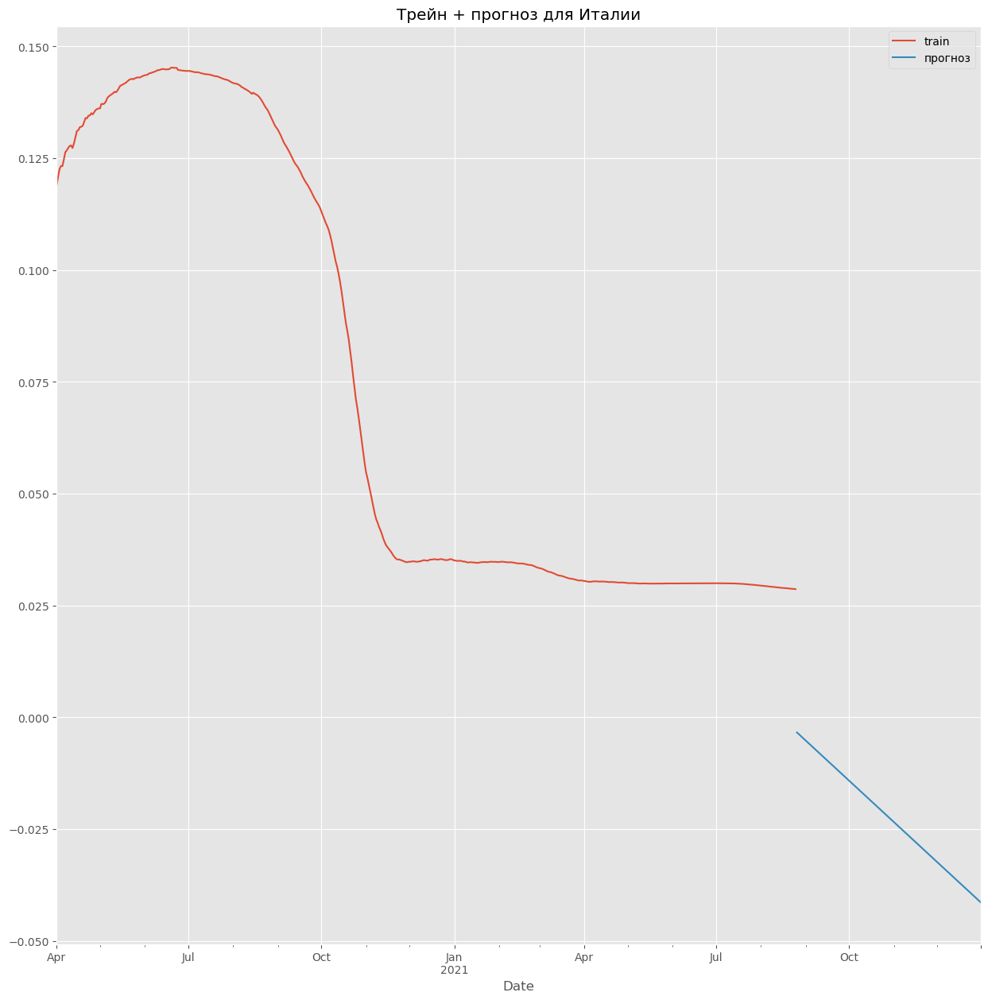

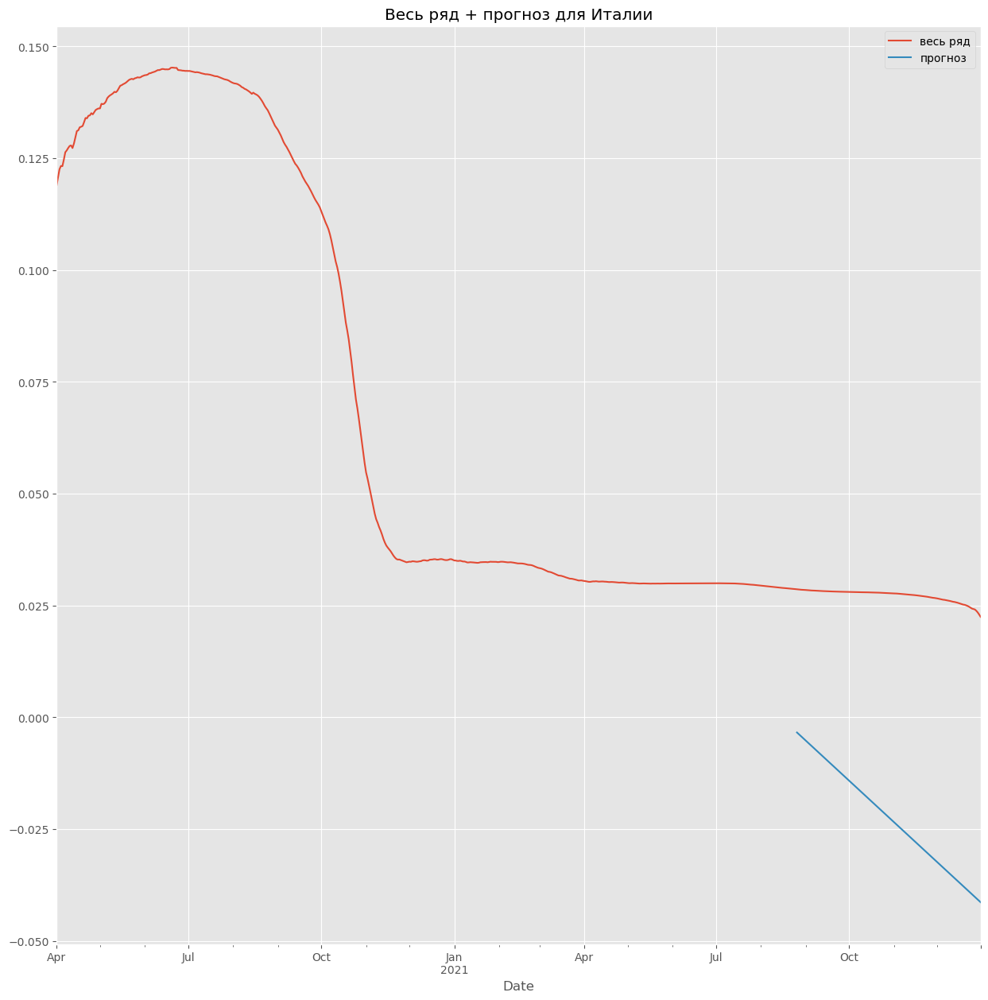

In [120]:
train['Italy'].plot(label='train')
forecast3.plot(label='прогноз')
plt.legend()
plt.title('Трейн + прогноз для Италии')
plt.show()

cfr['Italy'].plot(label='весь ряд')
forecast3.plot(label='прогноз')
plt.legend()
plt.title('Весь ряд + прогноз для Италии')
plt.show()

In [121]:
rmse = RMSE(forecast3, test['Italy'])
results.loc['Linear', 'Italy'] = rmse
print('Italy RMSE =', round(rmse, 5))

Italy RMSE = 0.05057


**Вывод:** Мое предположение в самом начале, что линейная модель должна сработать получше, чем просто среднее, подтвержилась частично, то есть линейная модель обогнала среднее только там, где тренд на тесте сохранил направление (а это было только у ряда Россия). А вот у США и Италии летальность на трейне снижалась и мы получили прямую с отрицательным наклоном, а вот на тесте летальность выходила на плато, поэтому я получил ошибку для США и Италии выше, чем при предсказаниях на среднем

#### 3.3. Скользящее среднее (MA — Moving average) (5 баллов)

Постройте предсказание с помощью модели MA. Обязательно поэкспериментируйте с гиперпараметрами модели (и опишите, что вы делаете)

По идее у нас модель MA - это как раз ARIMA модель только с параметрами (0,0,q), где q как раз у нас будет отвечать за скользящее среднее,а остальные параметры авторегрессия (AR) и интегрирование (I) будут 0. 

In [122]:
from statsmodels.tsa.arima.model import ARIMA

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


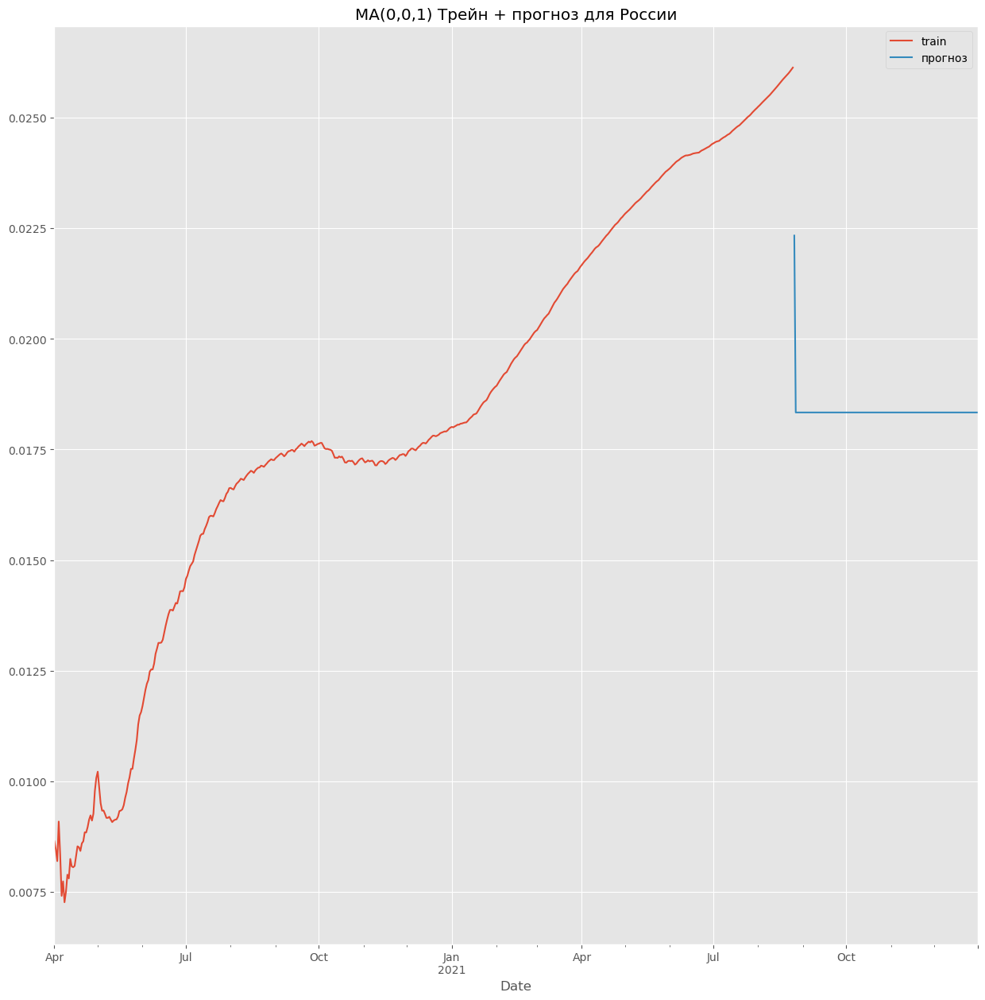

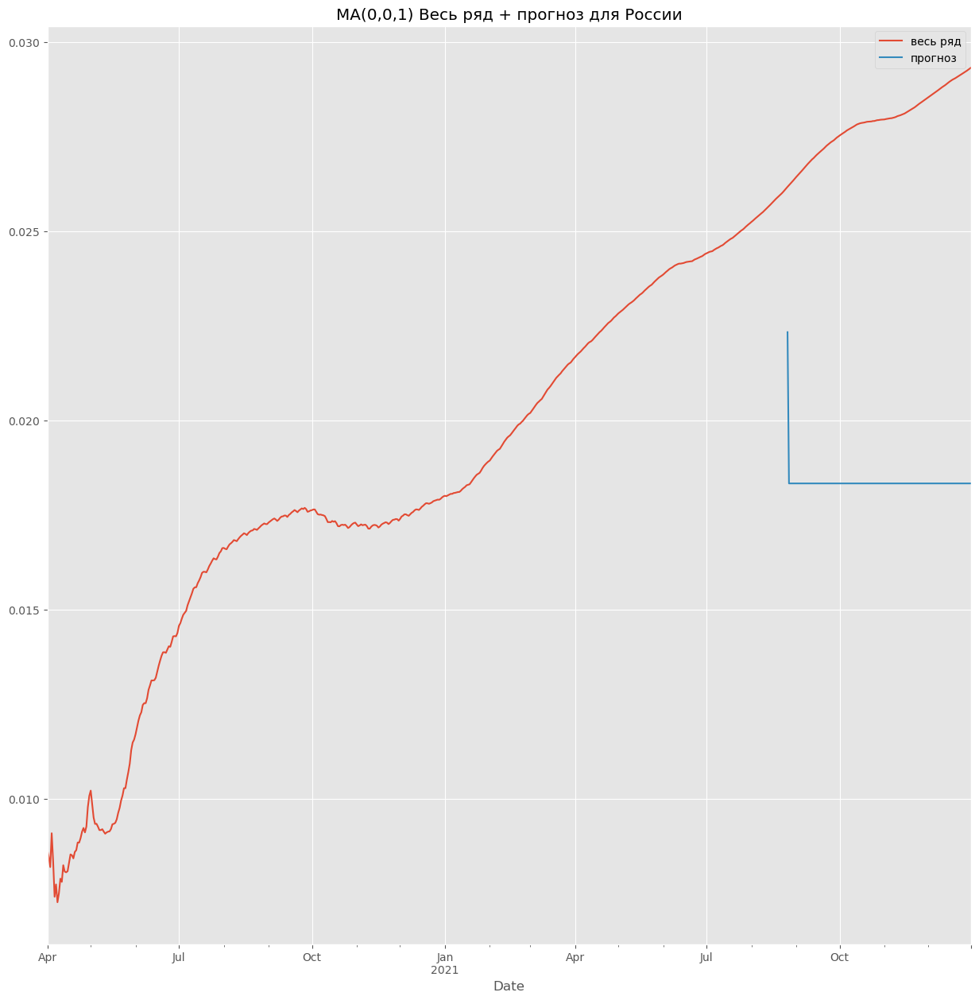

Russia MA q=1 RMSE = 0.00959


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


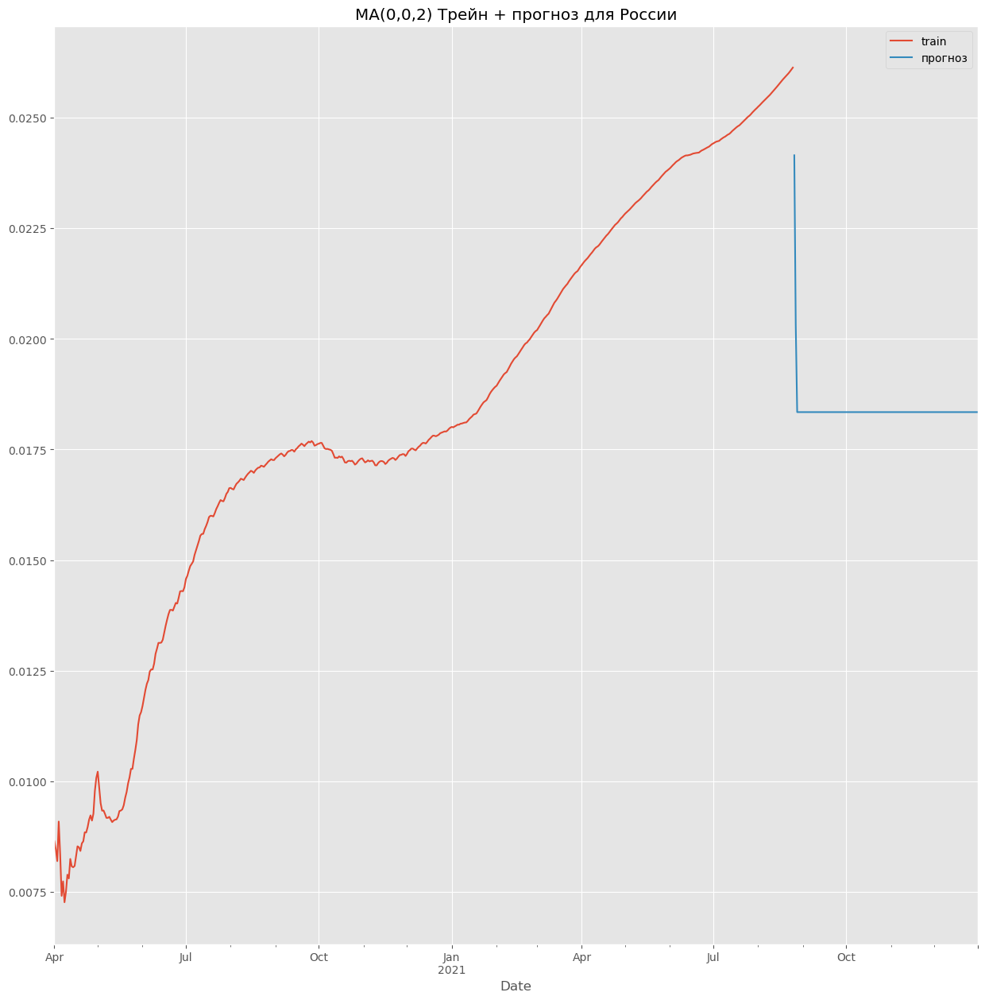

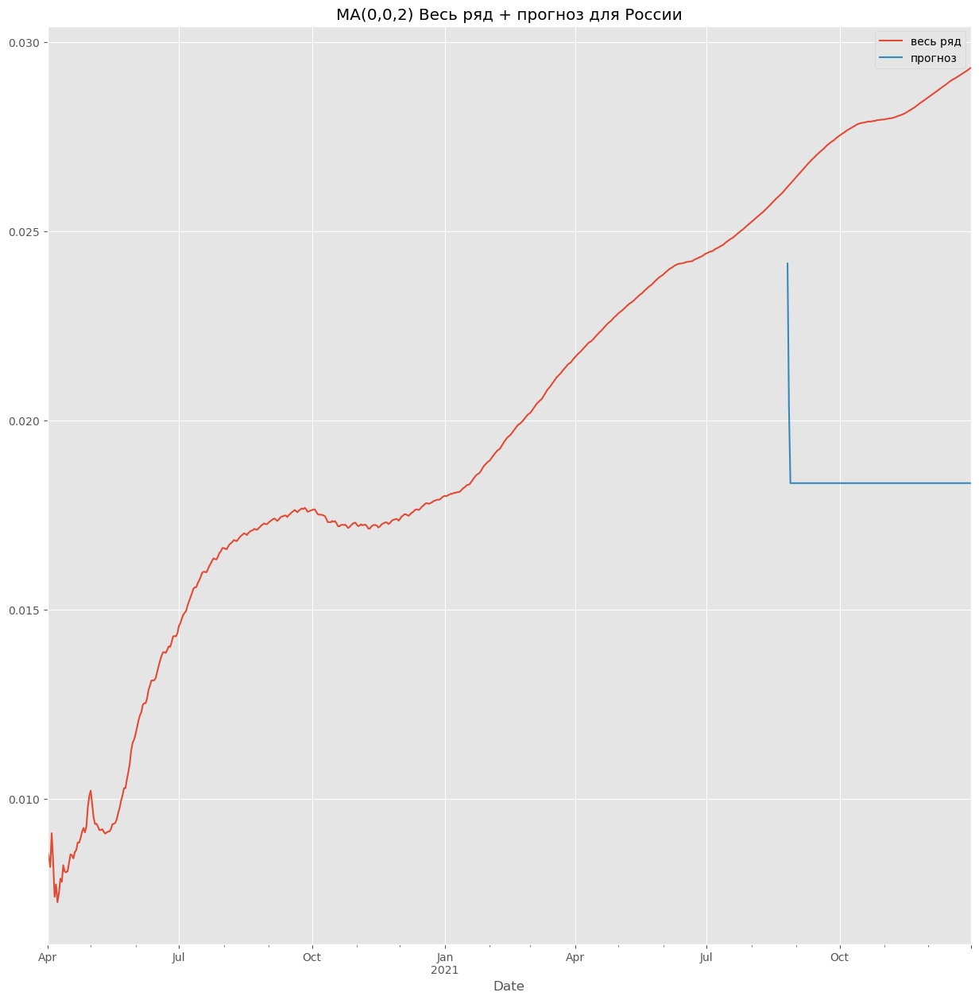

Russia MA q=2 RMSE = 0.00956


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


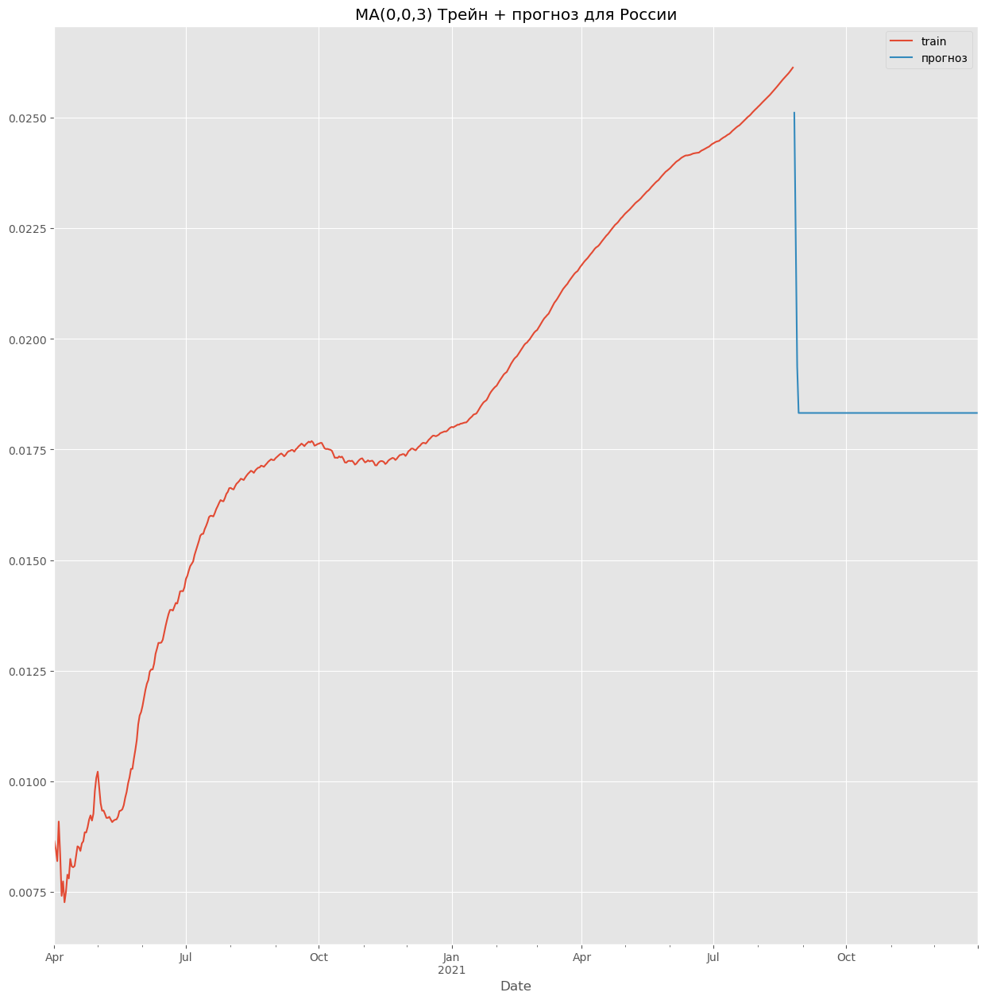

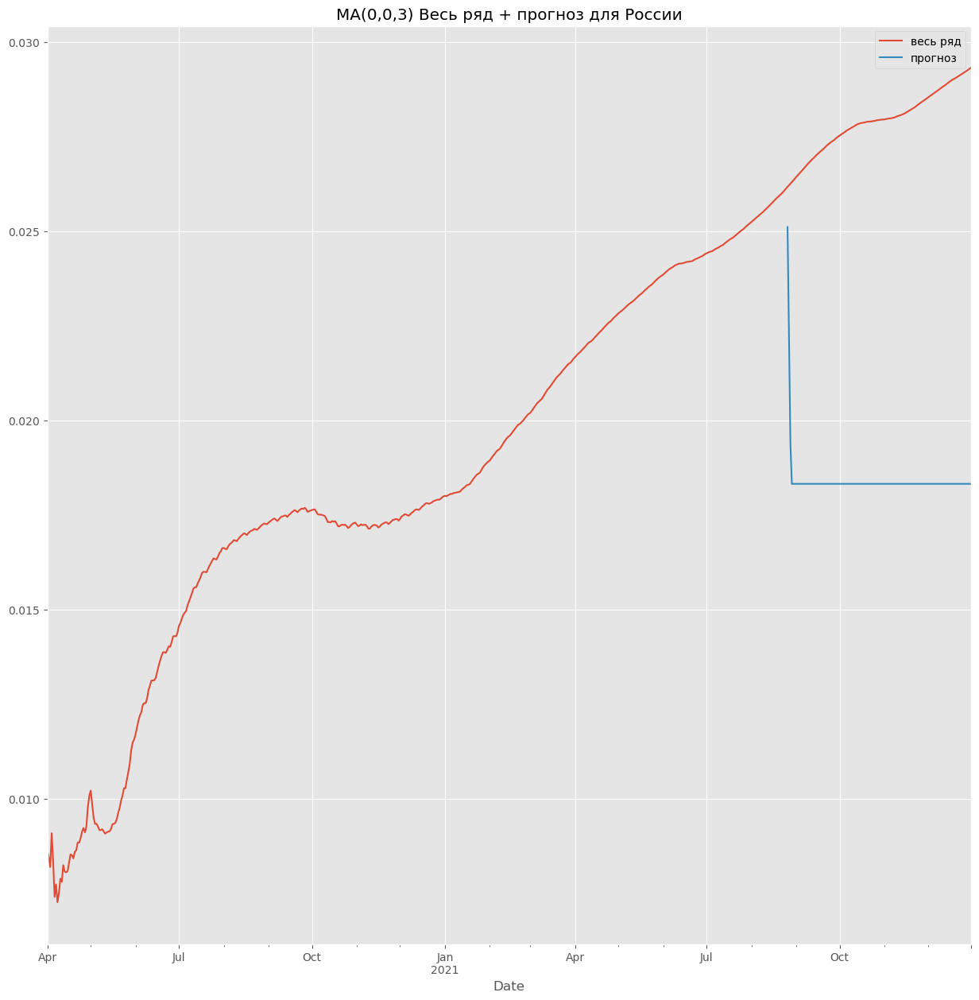

Russia MA q=3 RMSE = 0.00957


In [123]:
# для гиперпараметров возьмем q = 1, 2, 3 и построим для каждой график
# Пока что строим для ряда Россия
q_all = [1,2,3]
for q in q_all:
    model = ARIMA(train['Russia'], order=(0, 0, q)).fit()
    forecast = pd.Series(model.get_forecast(len(test['Russia'])).predicted_mean.values, index=test['Russia'].index)

    train['Russia'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'MA(0,0,{q}) Трейн + прогноз для России')
    plt.show()

    cfr['Russia'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'MA(0,0,{q}) Весь ряд + прогноз для России')
    plt.show()

    rmse = RMSE(forecast, test['Russia'])
    results.loc[f'MA(0,0,{q})', 'Russia'] = rmse
    print(f'Russia MA q={q} RMSE = {round(rmse, 5)}')

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


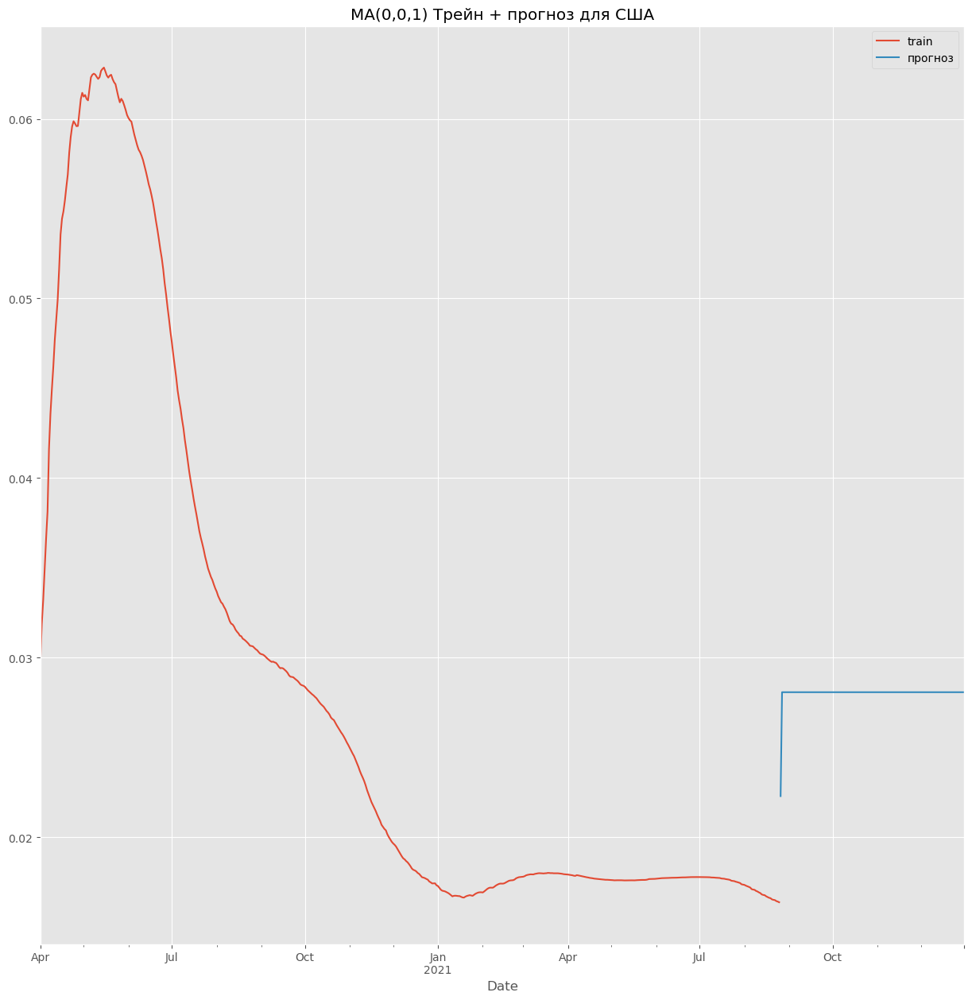

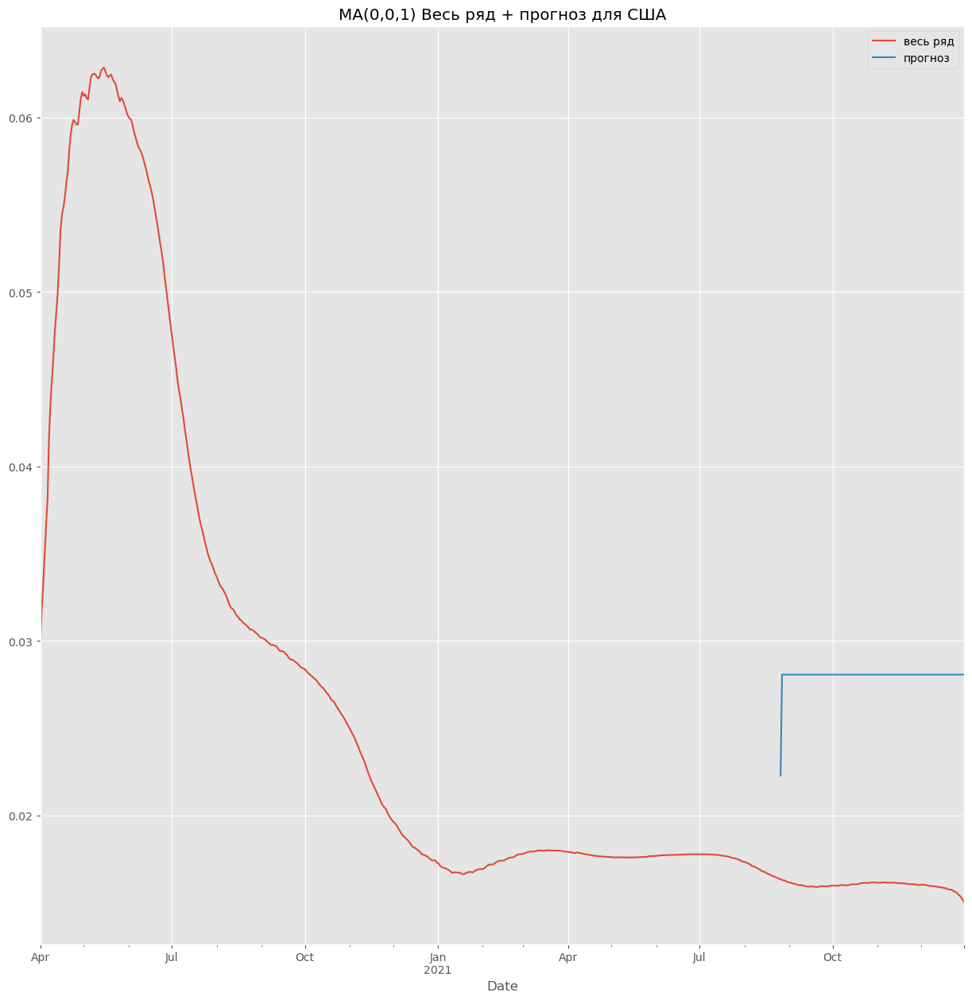

US MA q=1 RMSE = 0.01205


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


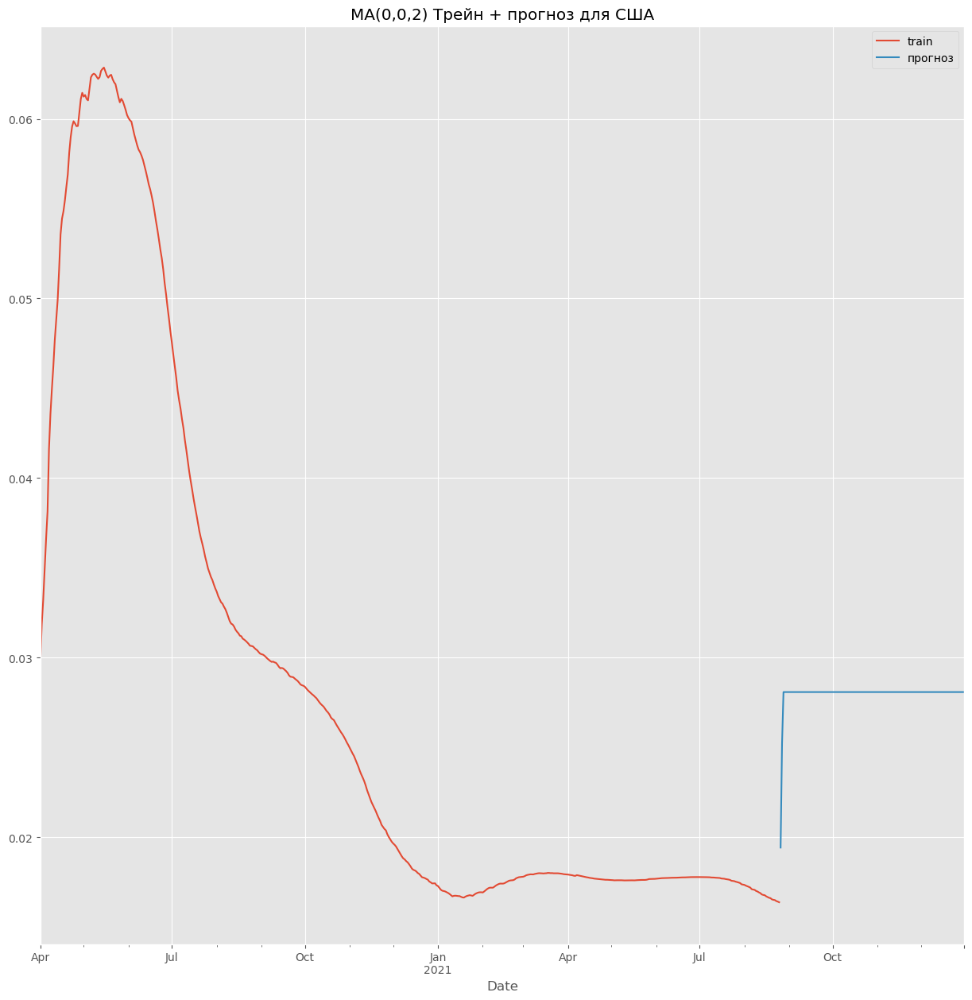

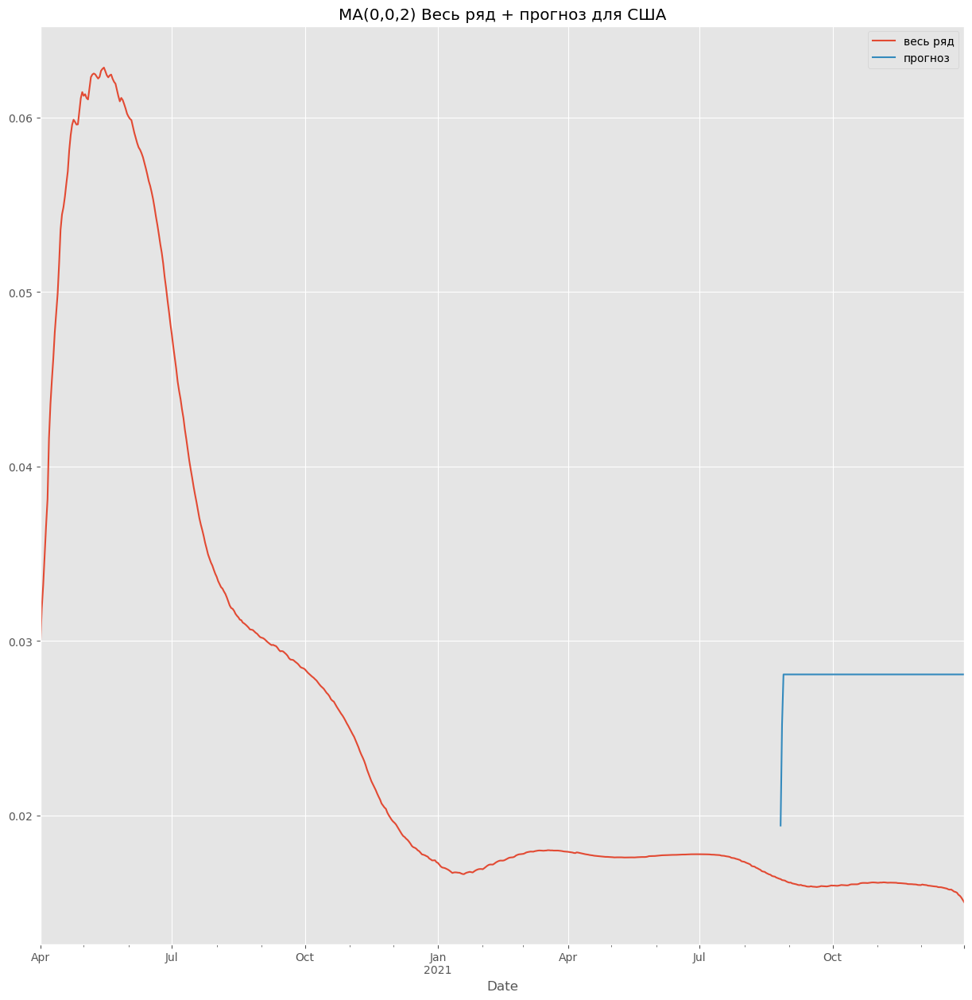

US MA q=2 RMSE = 0.01203


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


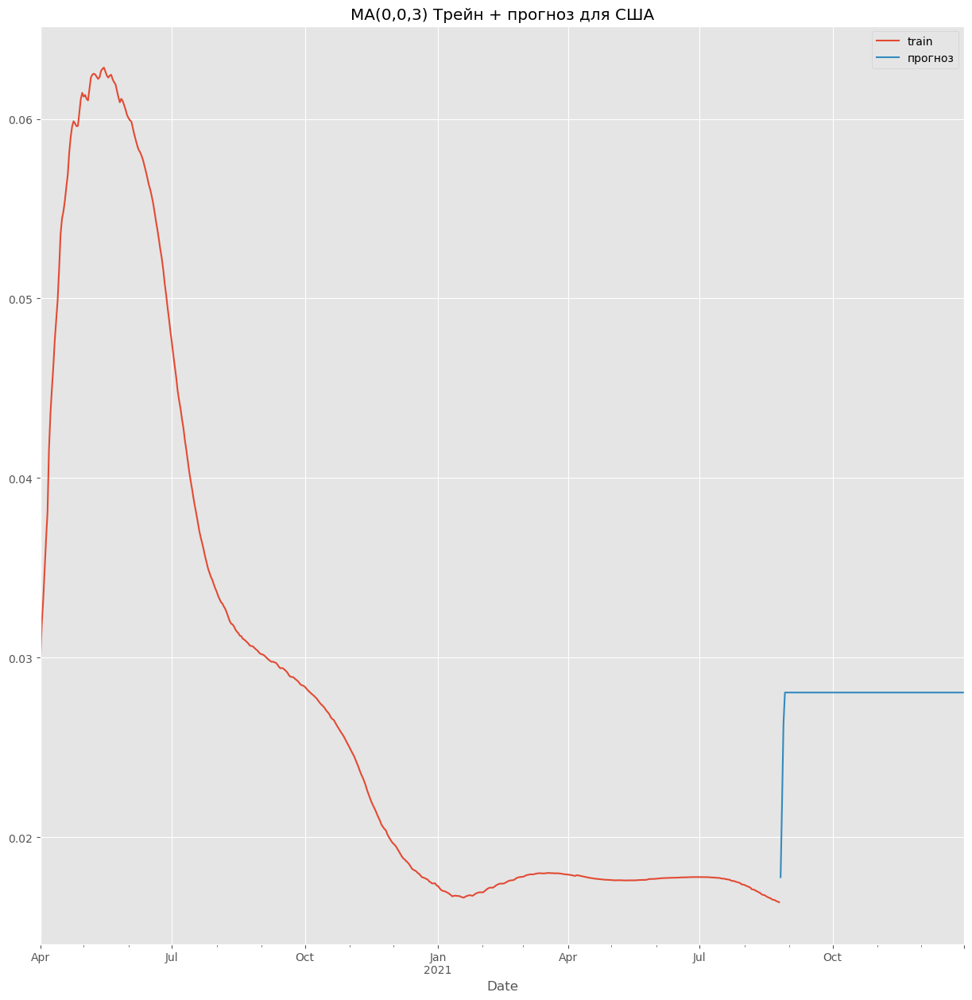

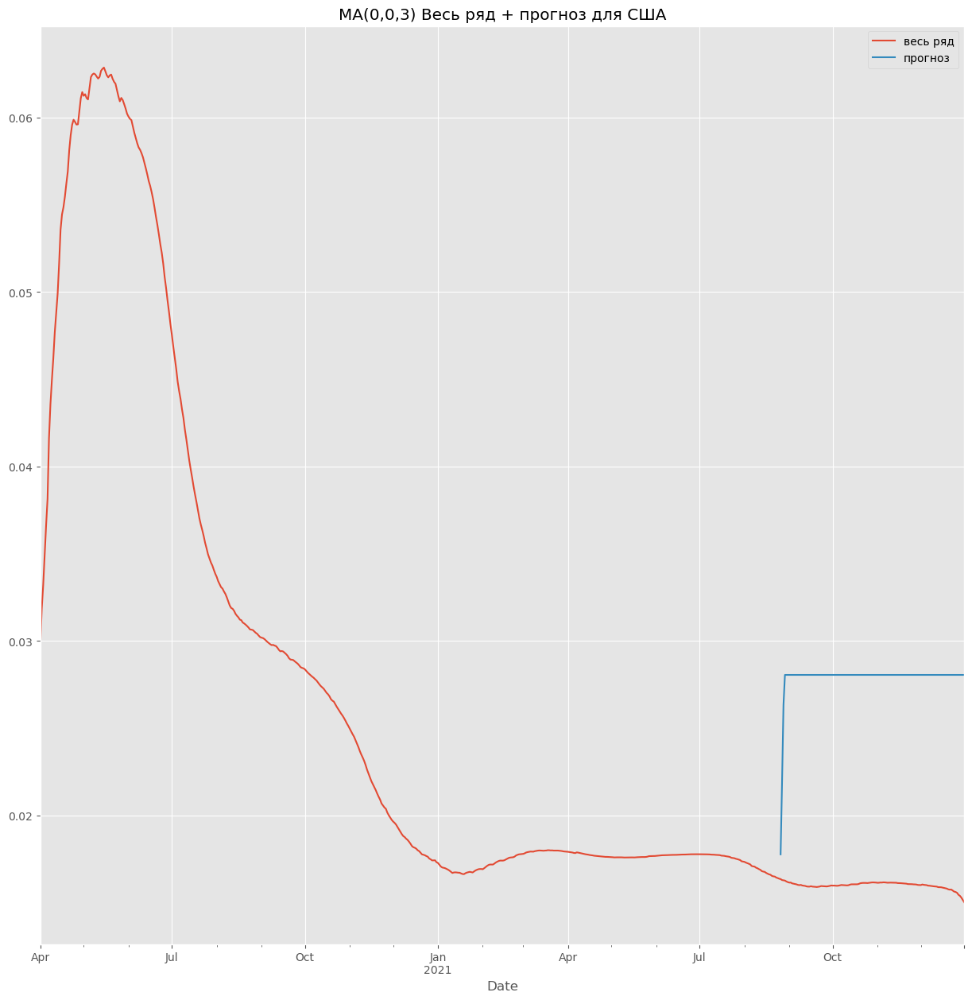

US MA q=3 RMSE = 0.01197


In [124]:
# для гиперпараметров возьмем q = 1, 2, 3 и построим для каждой график
# строим для ряда США
q_all = [1,2,3]
for q in q_all:
    model = ARIMA(train['US'], order=(0, 0, q)).fit()
    forecast = pd.Series(model.get_forecast(len(test['US'])).predicted_mean.values, index=test['US'].index)

    train['US'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'MA(0,0,{q}) Трейн + прогноз для США')
    plt.show()

    cfr['US'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'MA(0,0,{q}) Весь ряд + прогноз для США')
    plt.show()

    rmse = RMSE(forecast, test['US'])
    results.loc[f'MA(0,0,{q})', 'US'] = rmse
    print(f'US MA q={q} RMSE = {round(rmse, 5)}')

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


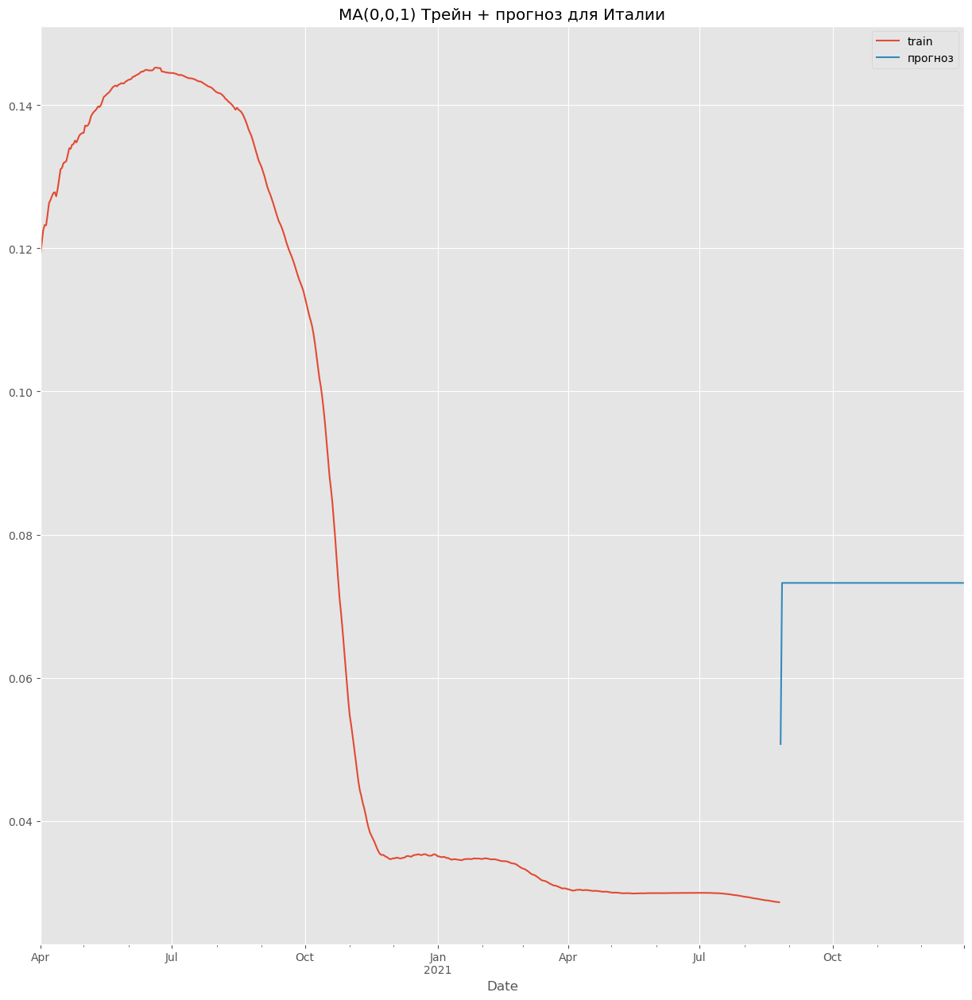

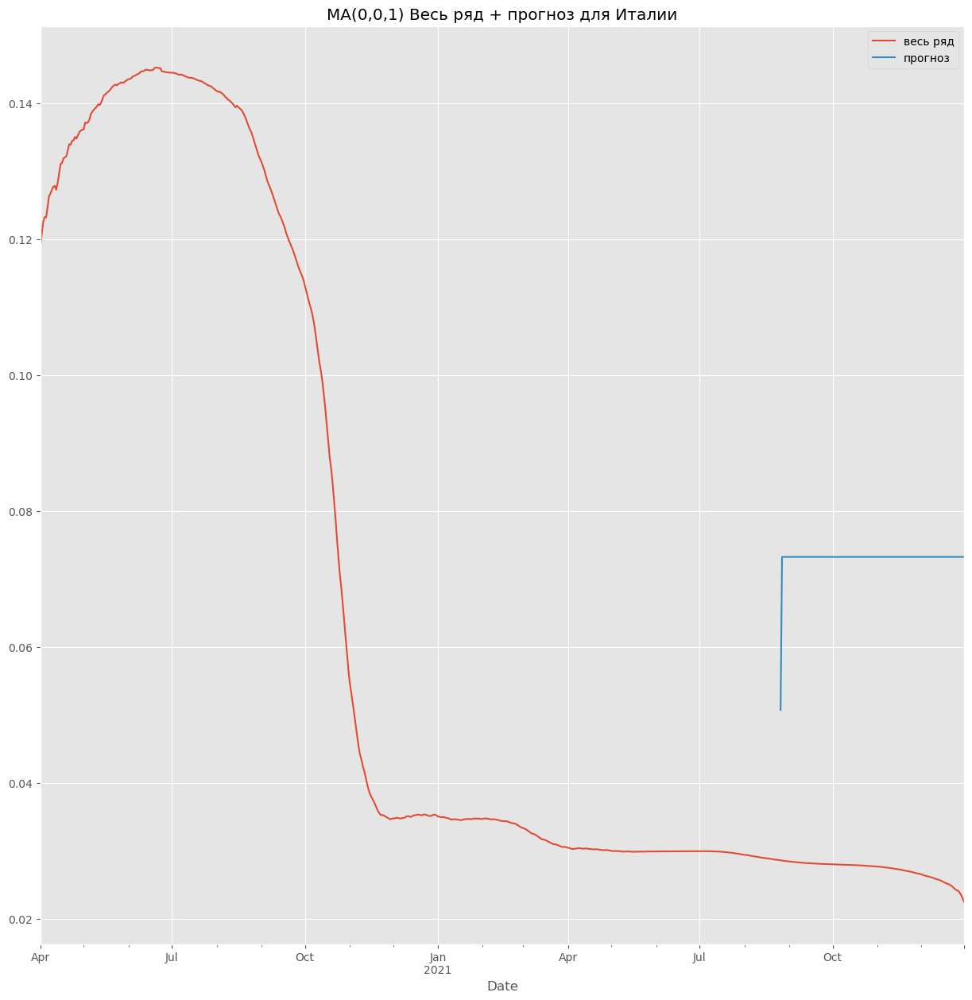

Italy MA q=1 RMSE = 0.04595


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


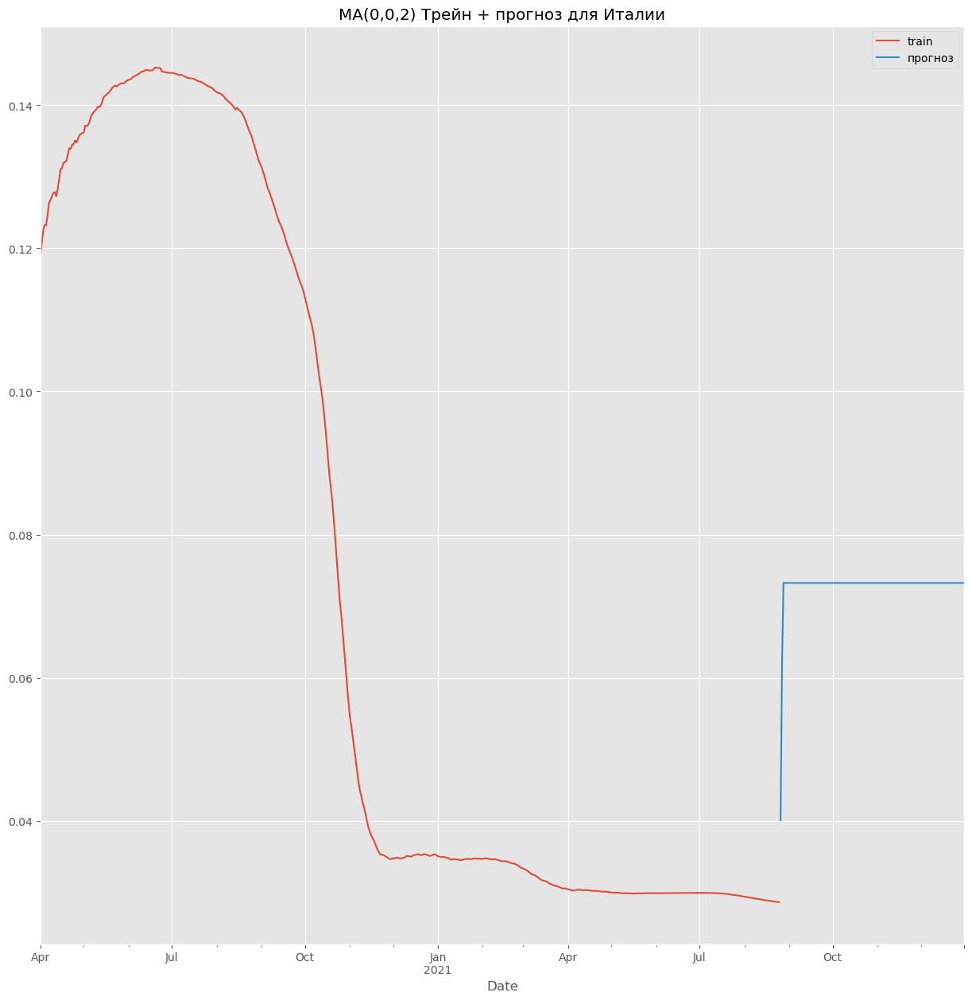

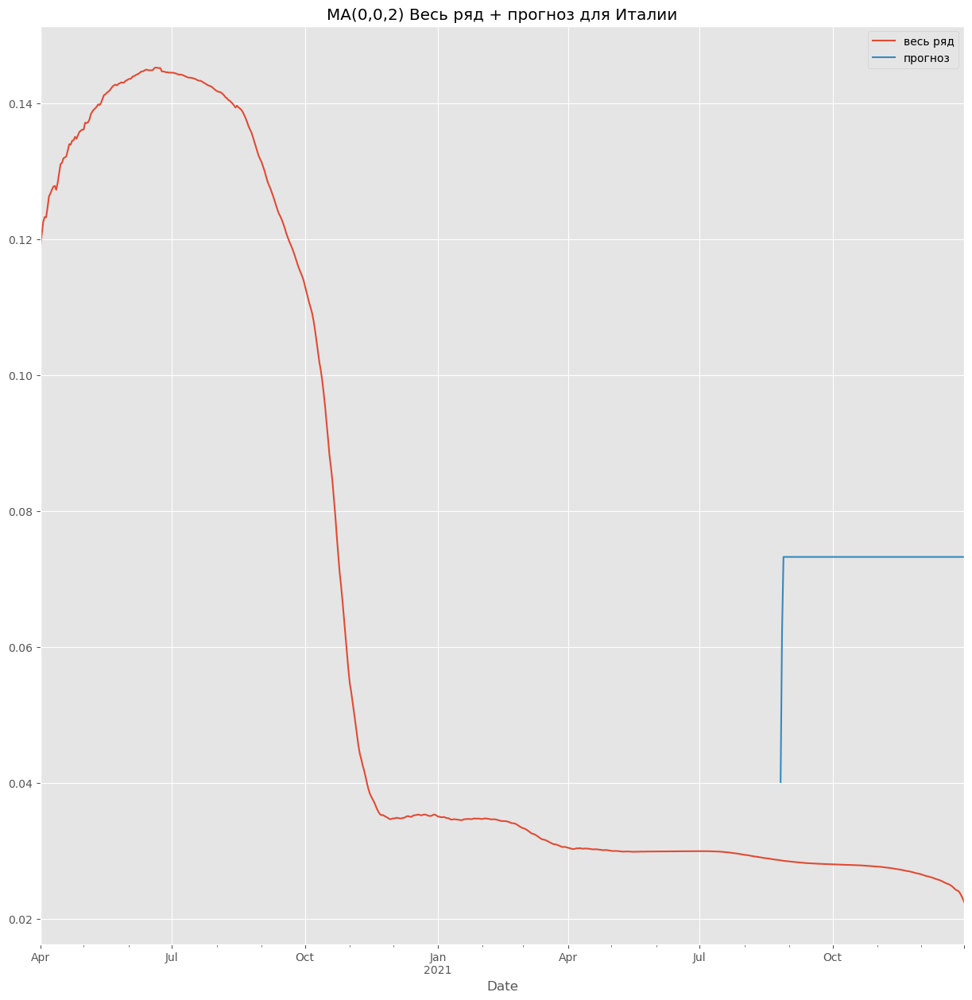

Italy MA q=2 RMSE = 0.04585


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


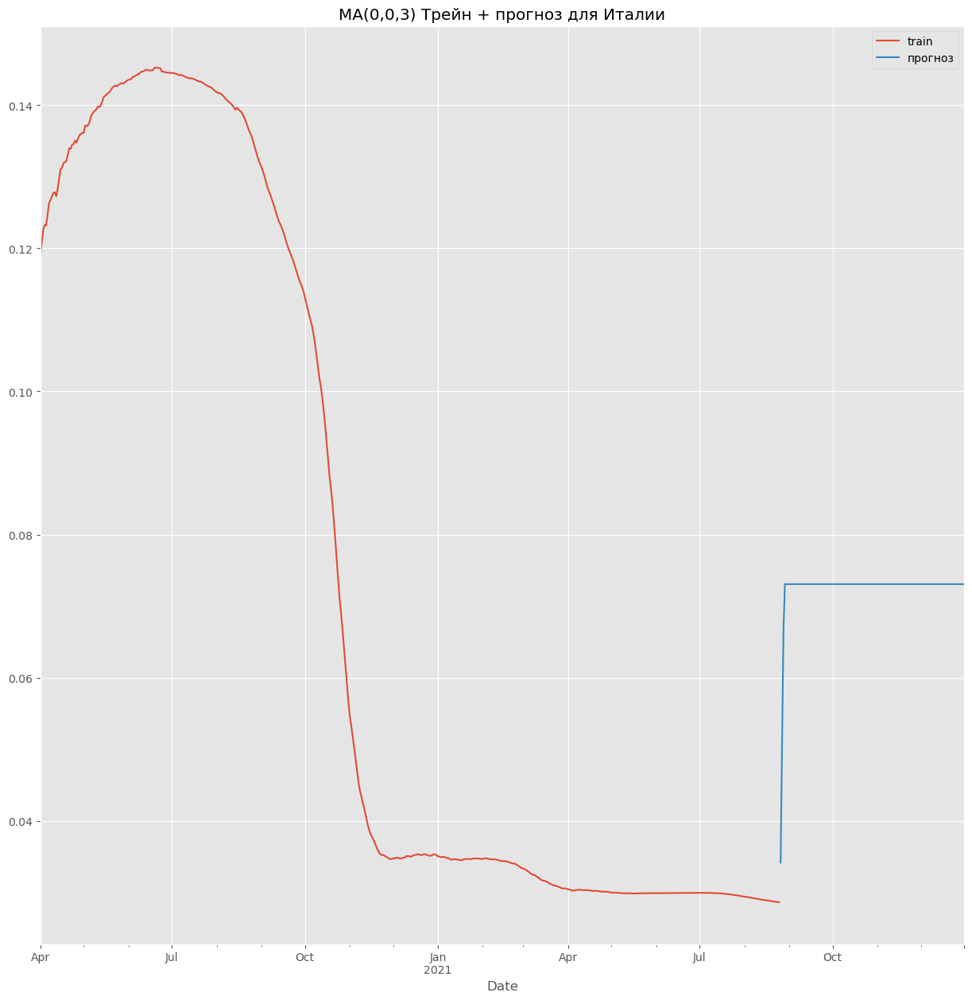

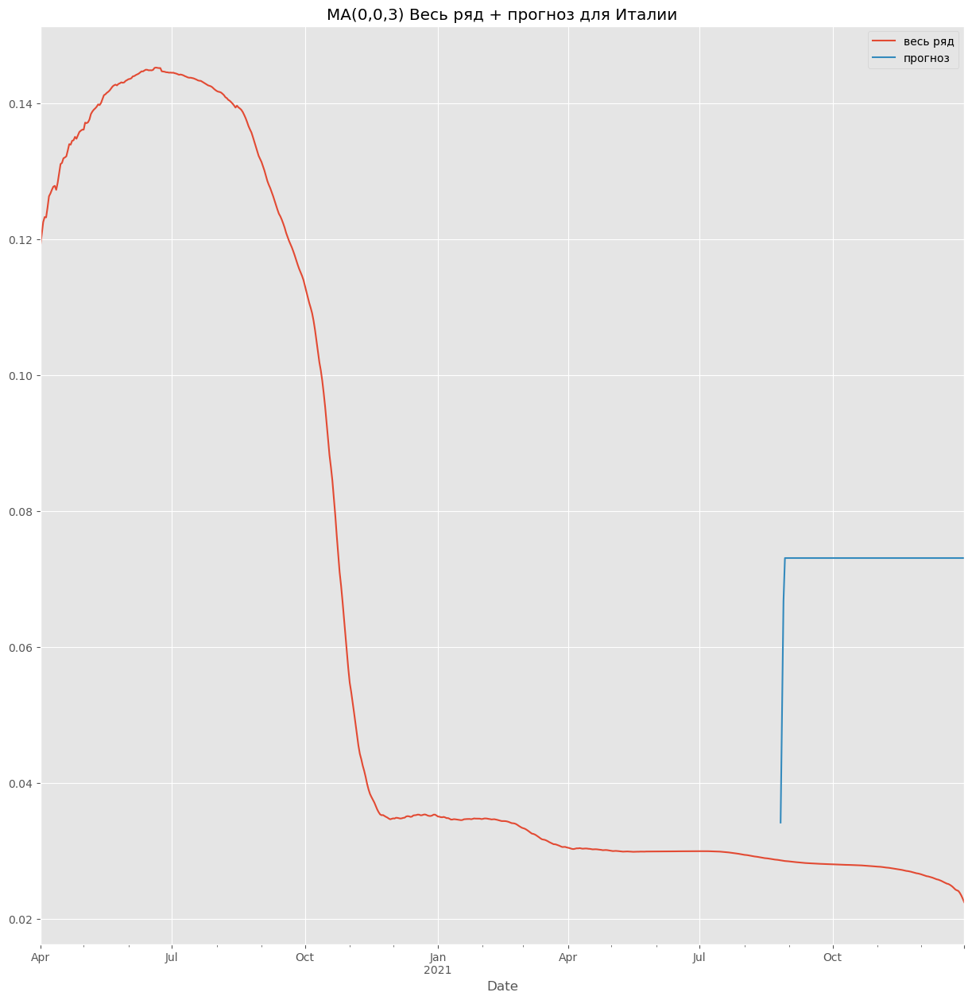

Italy MA q=3 RMSE = 0.04557


In [125]:
# для гиперпараметров возьмем q = 1, 2, 3 и построим для каждой график
# строим для ряда Италия
q_all = [1,2,3]
for q in q_all:
    model = ARIMA(train['Italy'], order=(0, 0, q)).fit()
    forecast = pd.Series(model.get_forecast(len(test['Italy'])).predicted_mean.values, index=test['Italy'].index)

    train['Italy'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'MA(0,0,{q}) Трейн + прогноз для Италии')
    plt.show()

    cfr['Italy'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'MA(0,0,{q}) Весь ряд + прогноз для Италии')
    plt.show()

    rmse = RMSE(forecast, test['Italy'])
    results.loc[f'MA(0,0,{q})', 'Italy'] = rmse
    print(f'Italy MA q={q} RMSE = {round(rmse, 5)}')

**Вывод:** Основной вывод по этой модели можено сделать такой, что результаты мы получили практически такие же как и с моделью среднего, наверное, такое поведение очевидно в какой-то степени, у нас все таки есть тренд в данных, и чисто MA не справляется на таких данных и не может простроить дальше ряд. То есть мы поняли, что модель с MA прироста в качестве по сравнению с средним не дает. По гиперпараметру q (длина памяти модели на случайные отклонения, то есть сколько мы еще будем помнить про резкий скачок или спад и учитывать его) тут тоже как-то не радостно, у нас с увеличением q картина не сильно меняется, и то, что мы ее увеличивали нам не дало никакого прироста в качестве для всех 3 рядов

#### 3.4. Авторегрессионная модель (AR — Autoregressive model) (5 баллов)

Постройте предсказание с помощью модели AR. Обязательно поэкспериментируйте с гиперпараметрами модели (и опишите, что вы делаете)

Тут мы тоже используем модель ARIMA но с гиперпараметрами (p,0,0), то есть в этот раз без скользящего среднего и интегрирования. И тут мы будем подбирать гиперпараметр p , он как раз отвечает за то, сколько дней назад мы смотрим, то есть если p=1 , то завтра у нас будет зависеть только от сегодня, а если p=2, то завтра будет зависеть от сегодня и от вчера и так далее 

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


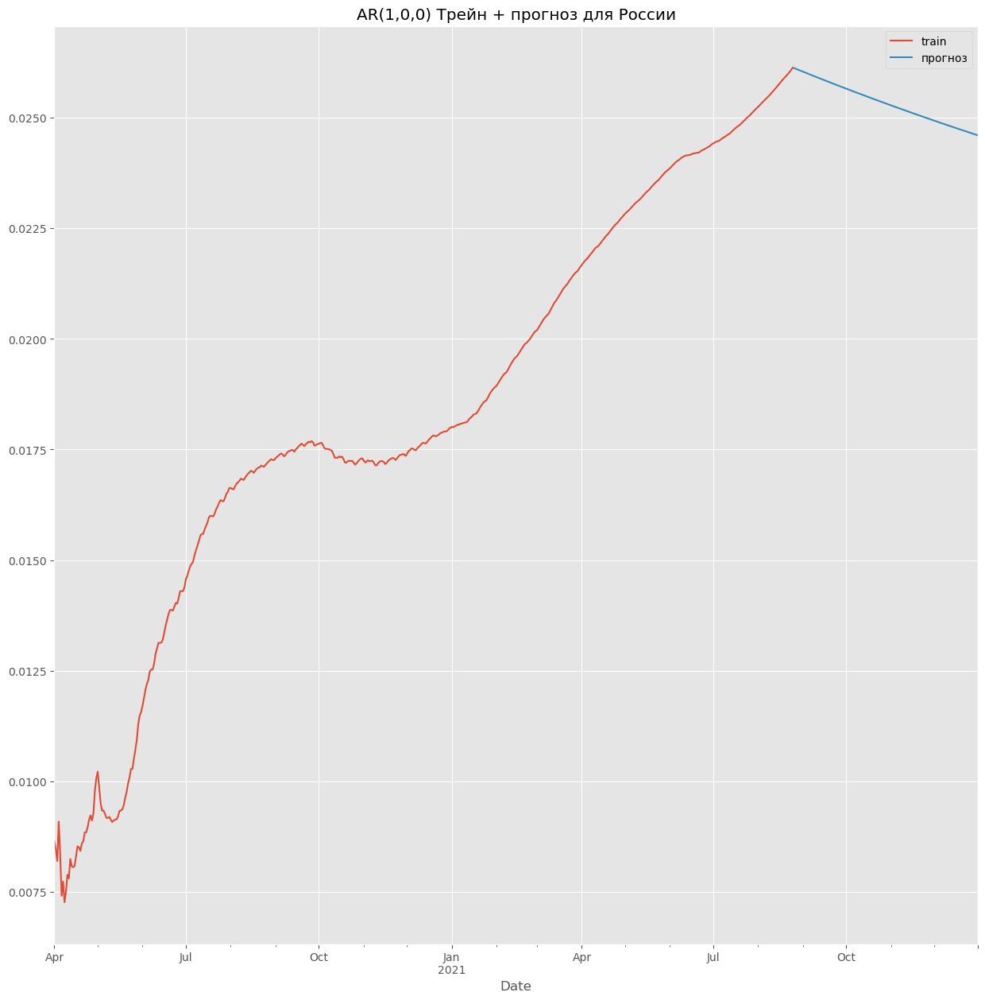

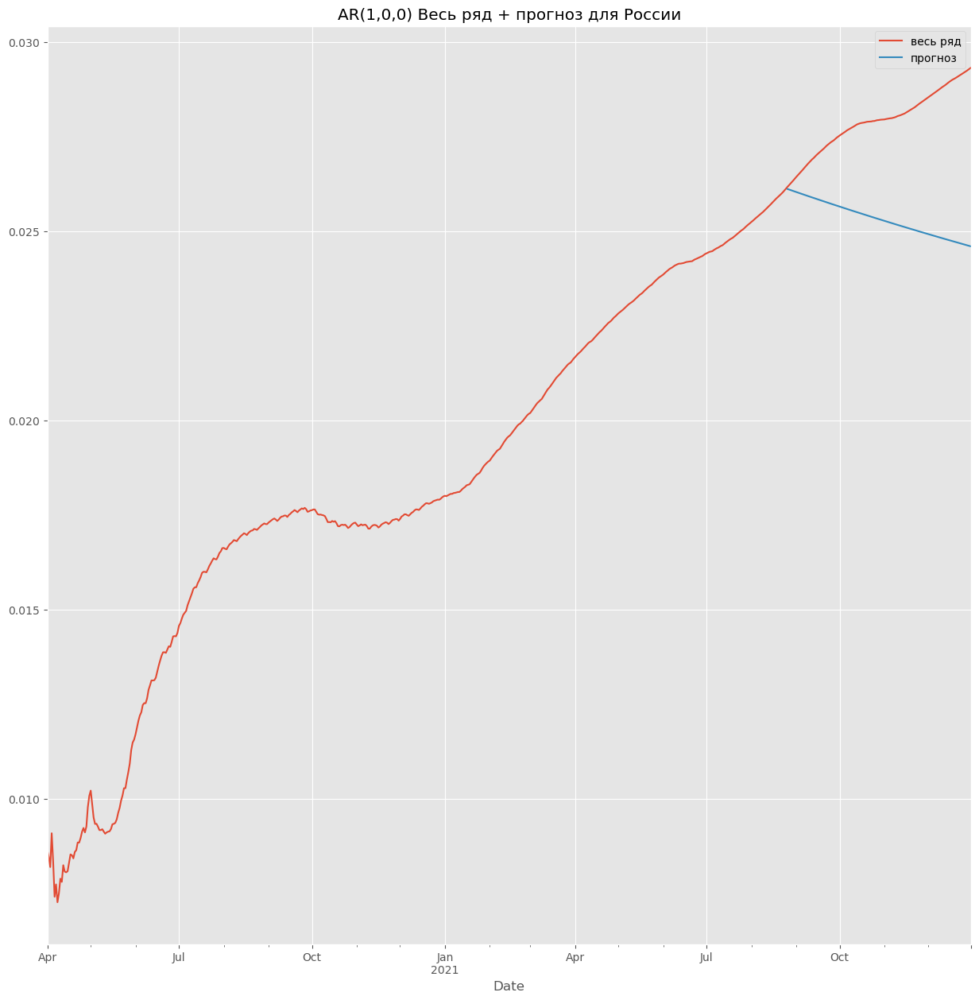

Russia AR p=1 RMSE = 0.00286


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


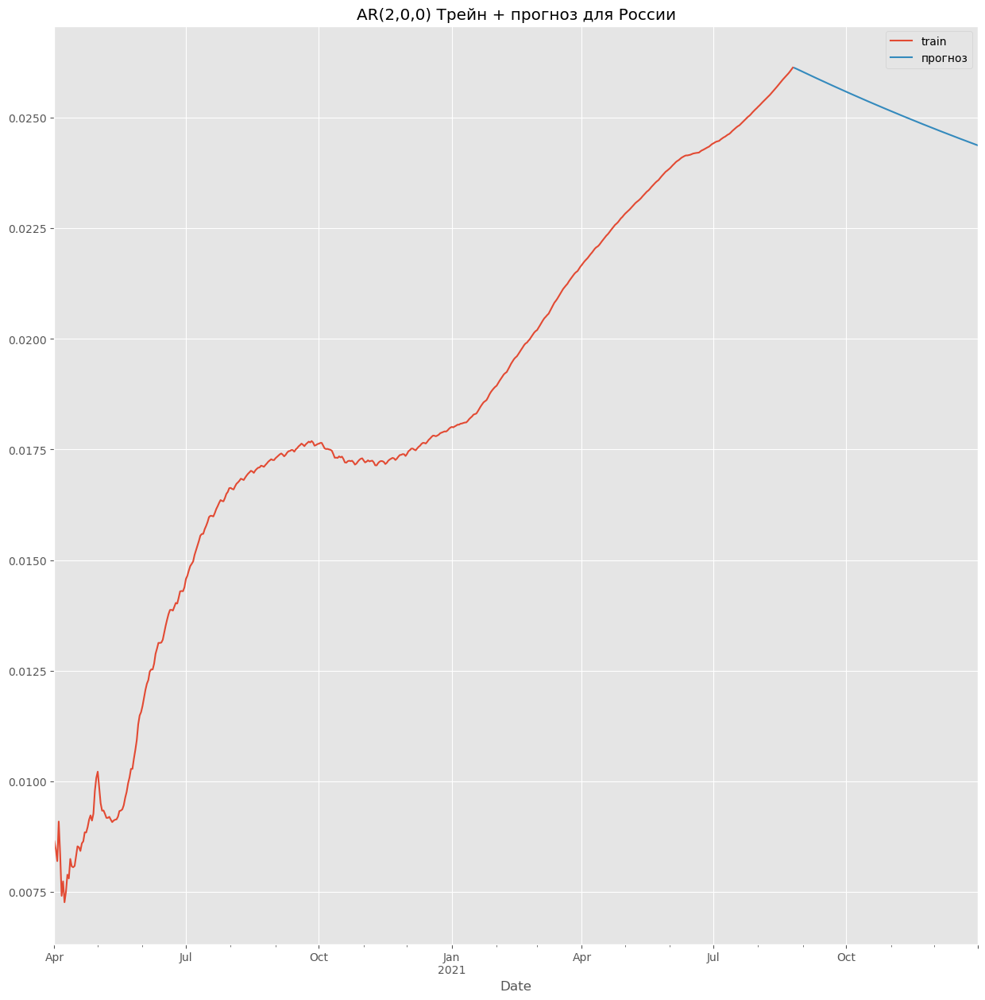

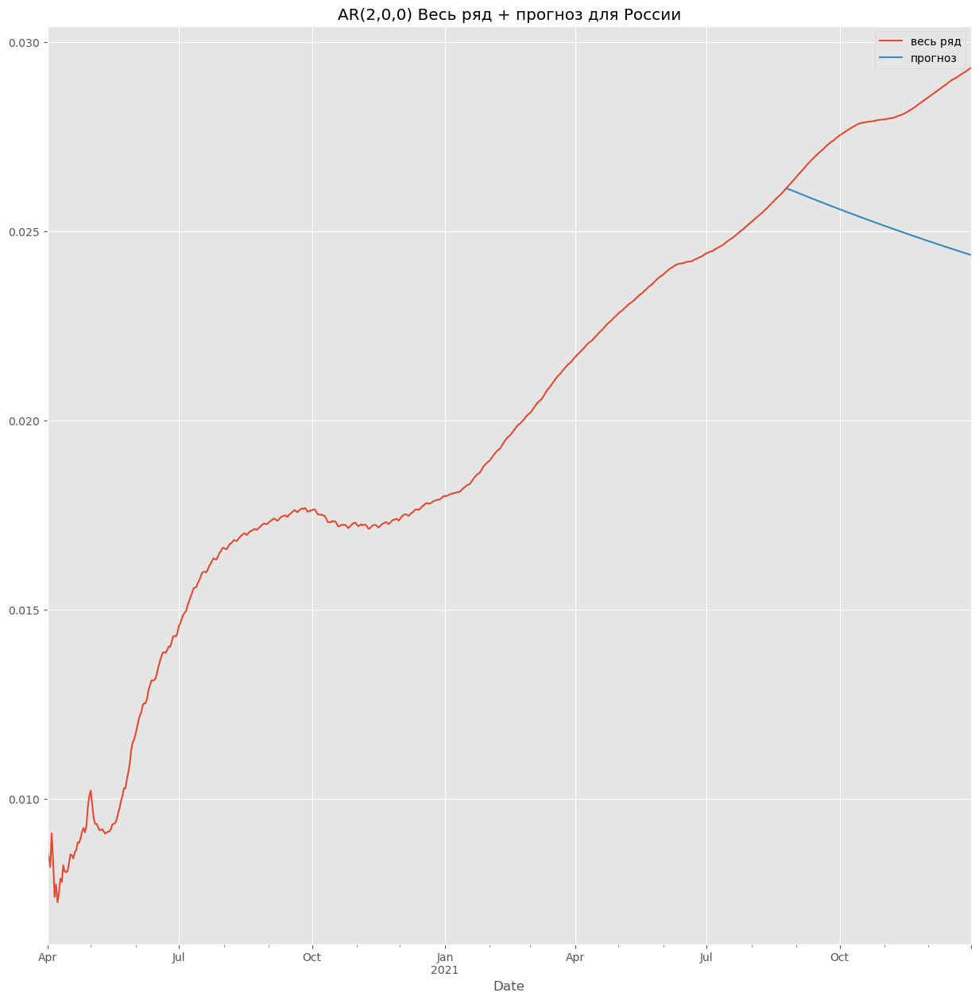

Russia AR p=2 RMSE = 0.00299


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


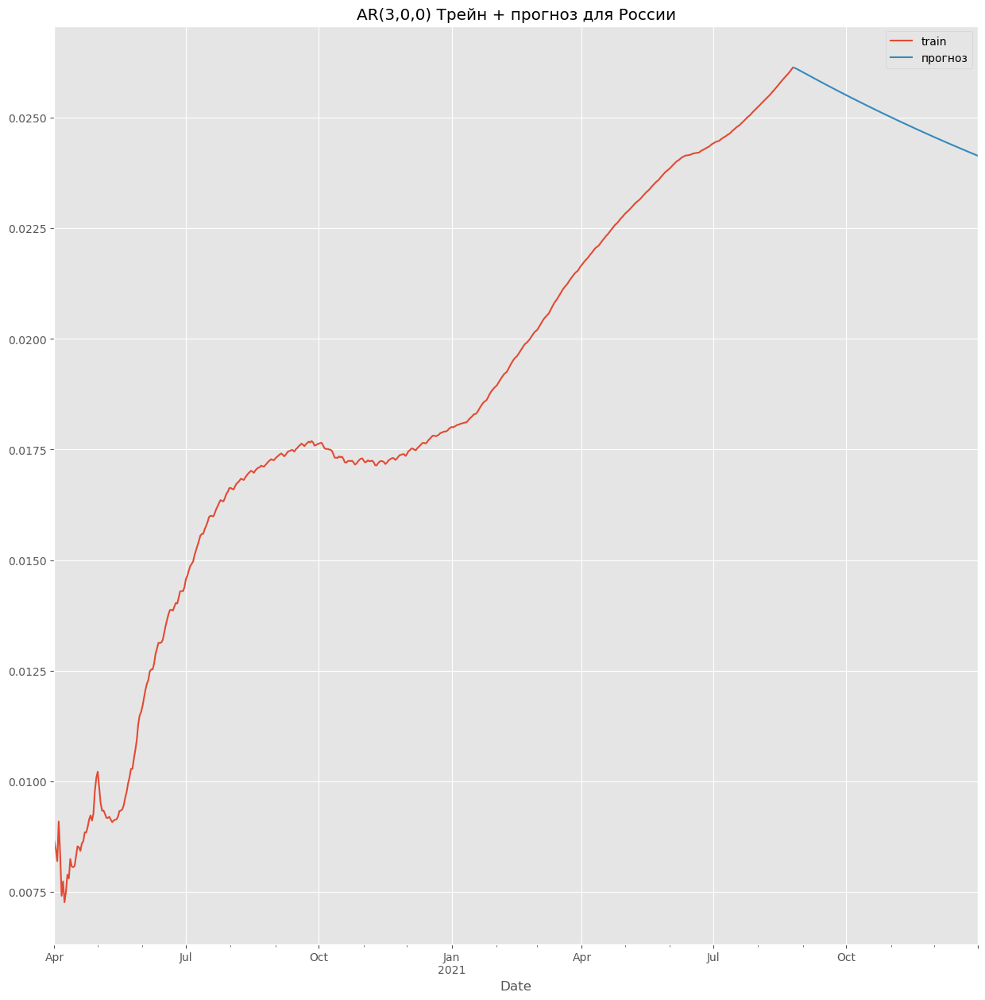

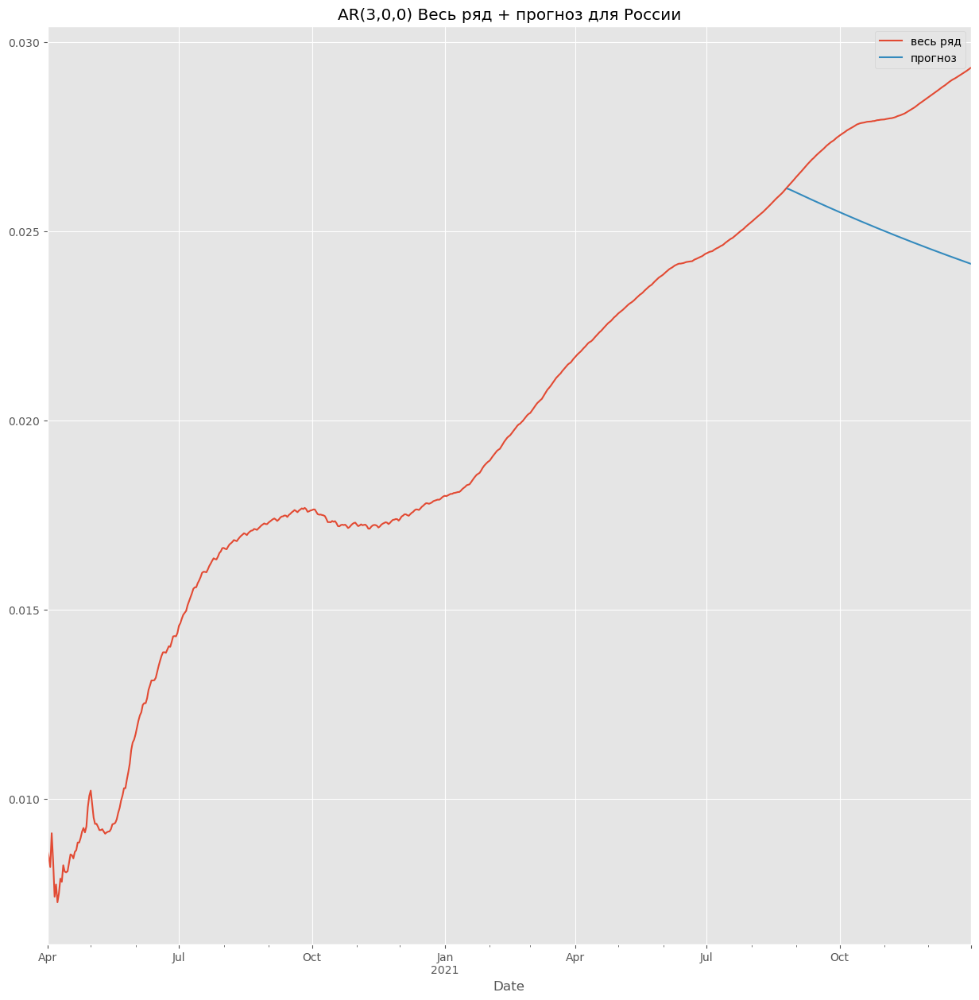

Russia AR p=3 RMSE = 0.00314


In [126]:
for p in [1, 2, 3]:
    model = ARIMA(train['Russia'], order=(p, 0, 0)).fit()
    forecast = pd.Series(model.get_forecast(len(test['Russia'])).predicted_mean.values, index=test['Russia'].index)

    train['Russia'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'AR({p},0,0) Трейн + прогноз для России')
    plt.show()

    cfr['Russia'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'AR({p},0,0) Весь ряд + прогноз для России')
    plt.show()

    rmse = RMSE(forecast, test['Russia'])
    results.loc[f'AR({p},0,0)', 'Russia'] = rmse
    print(f'Russia AR p={p} RMSE = {round(rmse, 5)}')

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


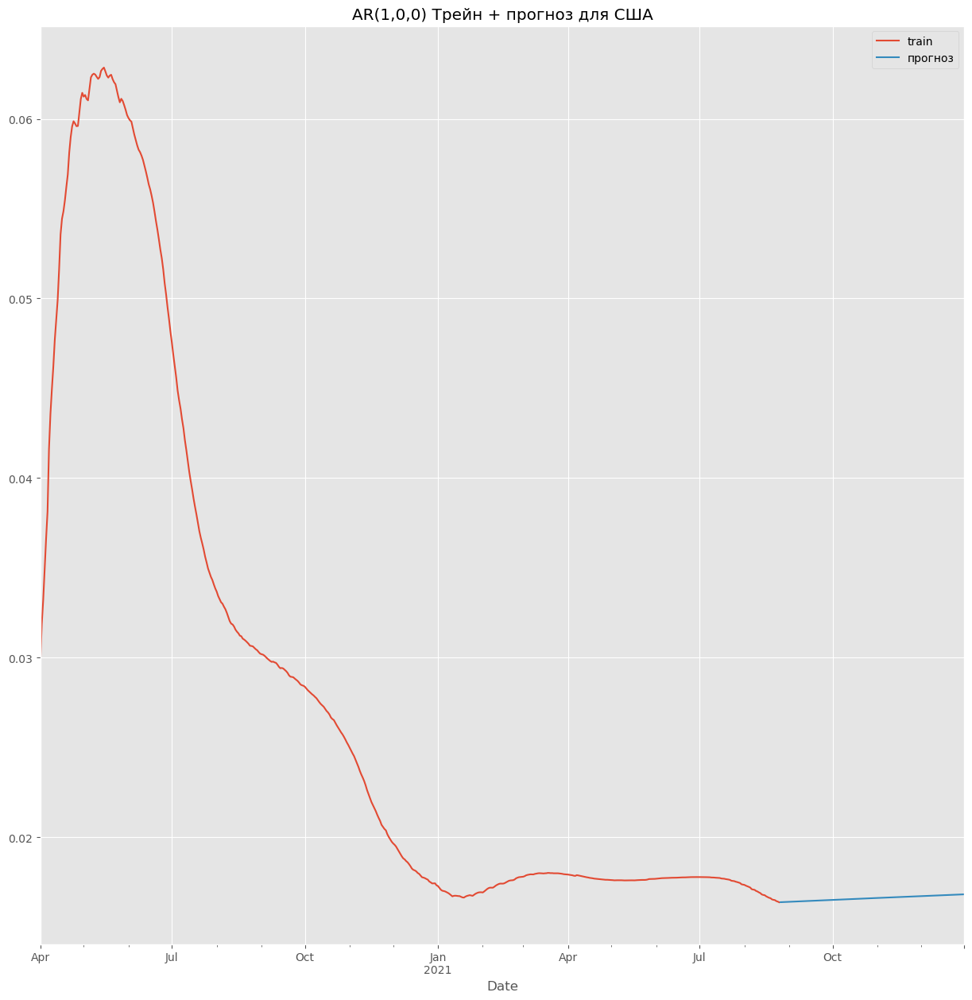

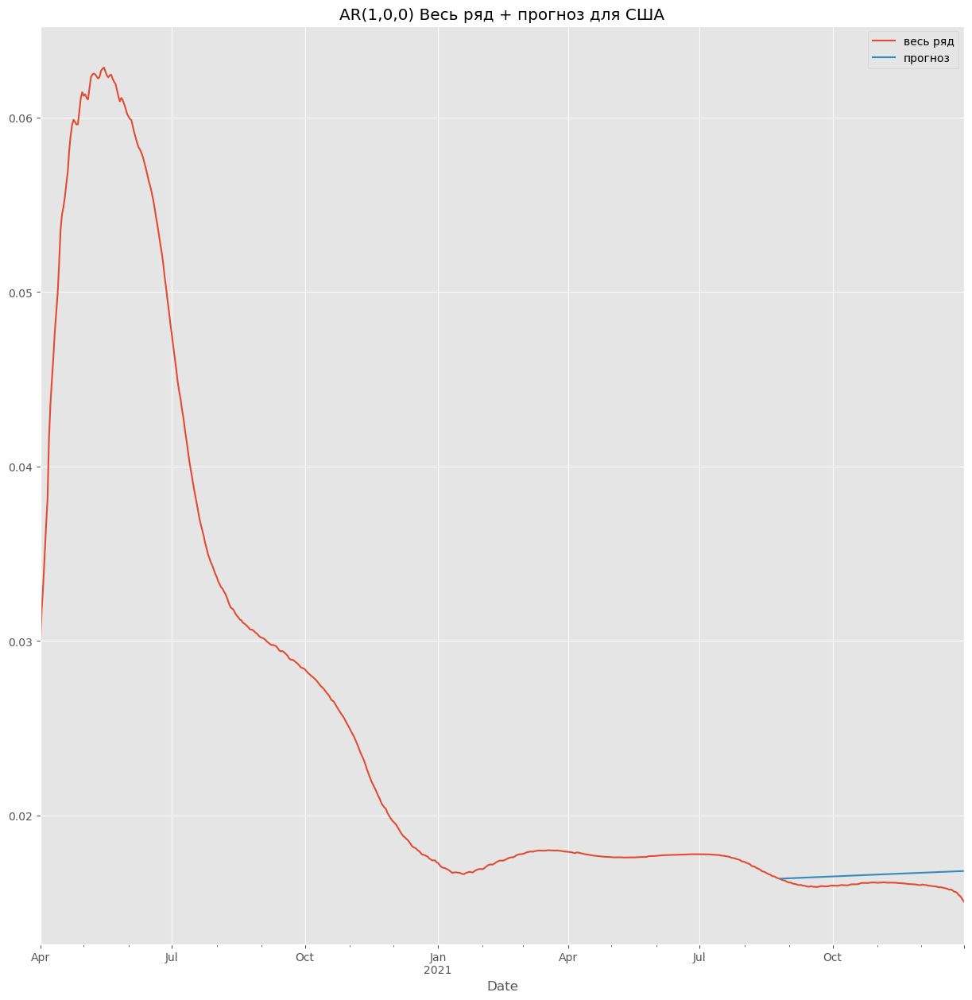

US AR p=1 RMSE = 0.00067


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


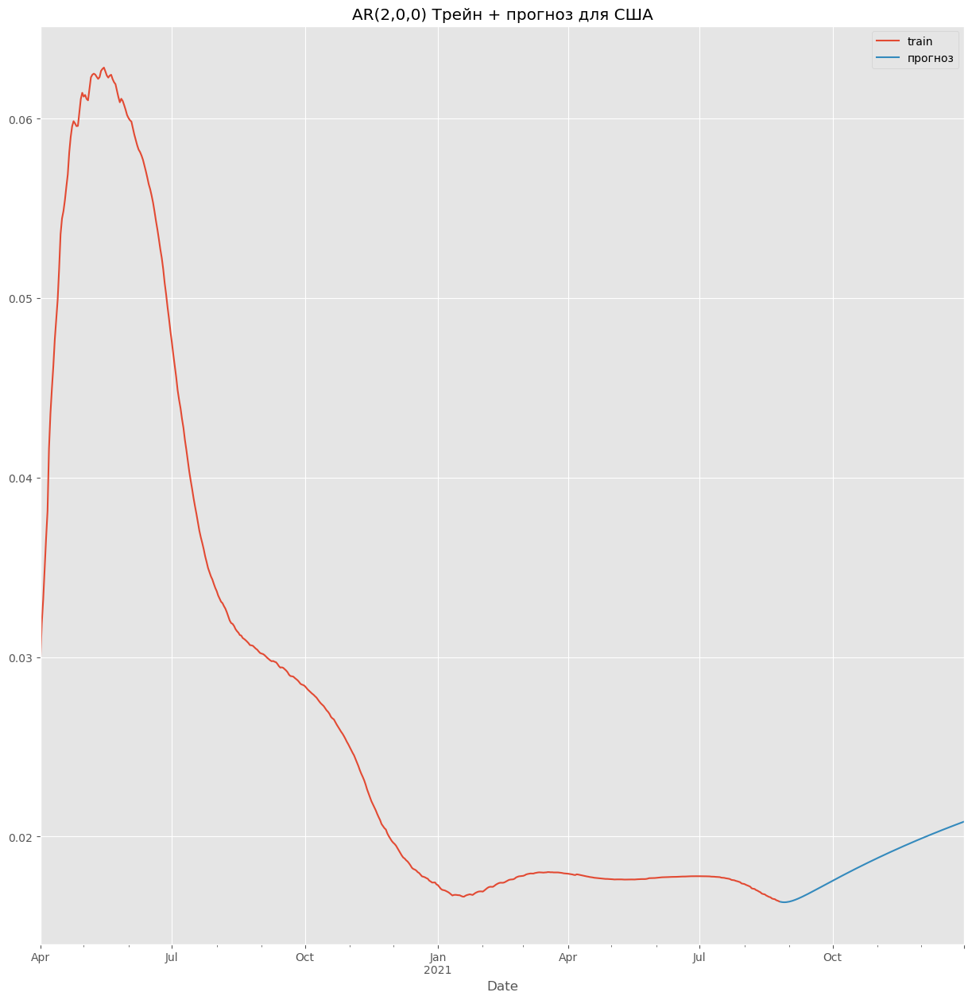

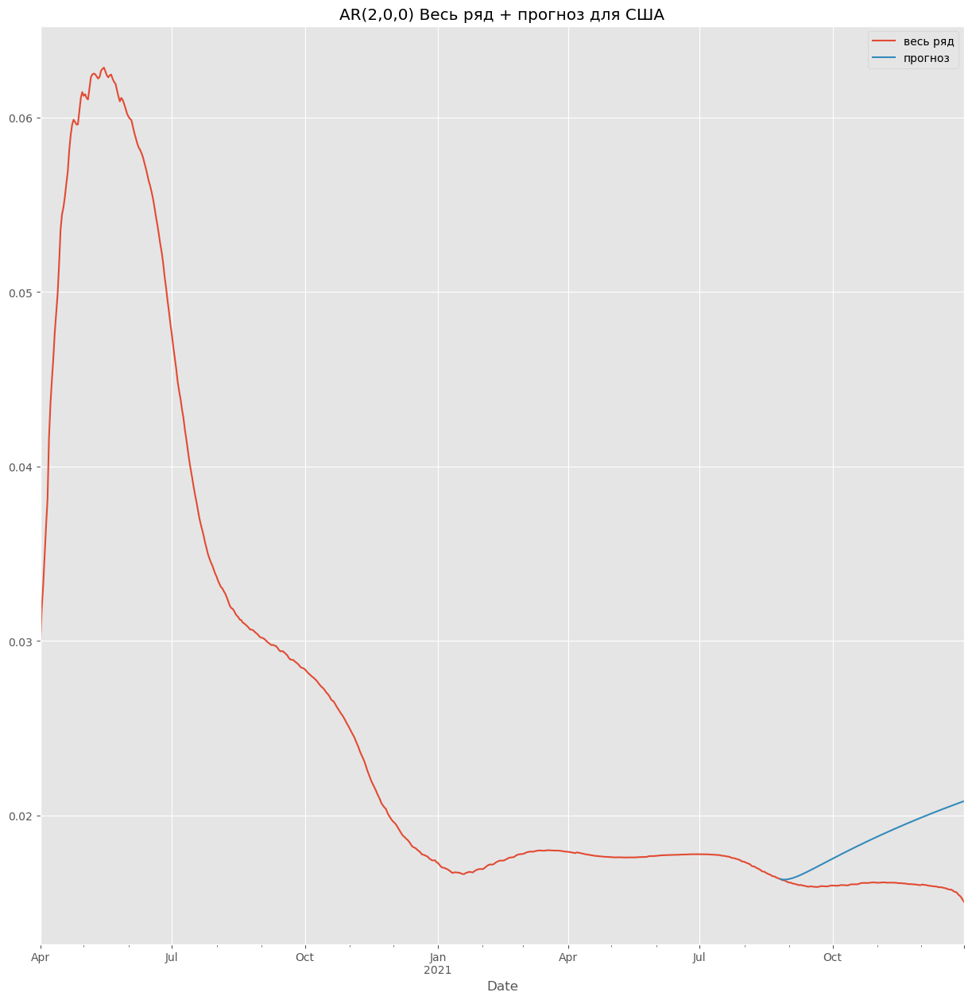

US AR p=2 RMSE = 0.00298


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


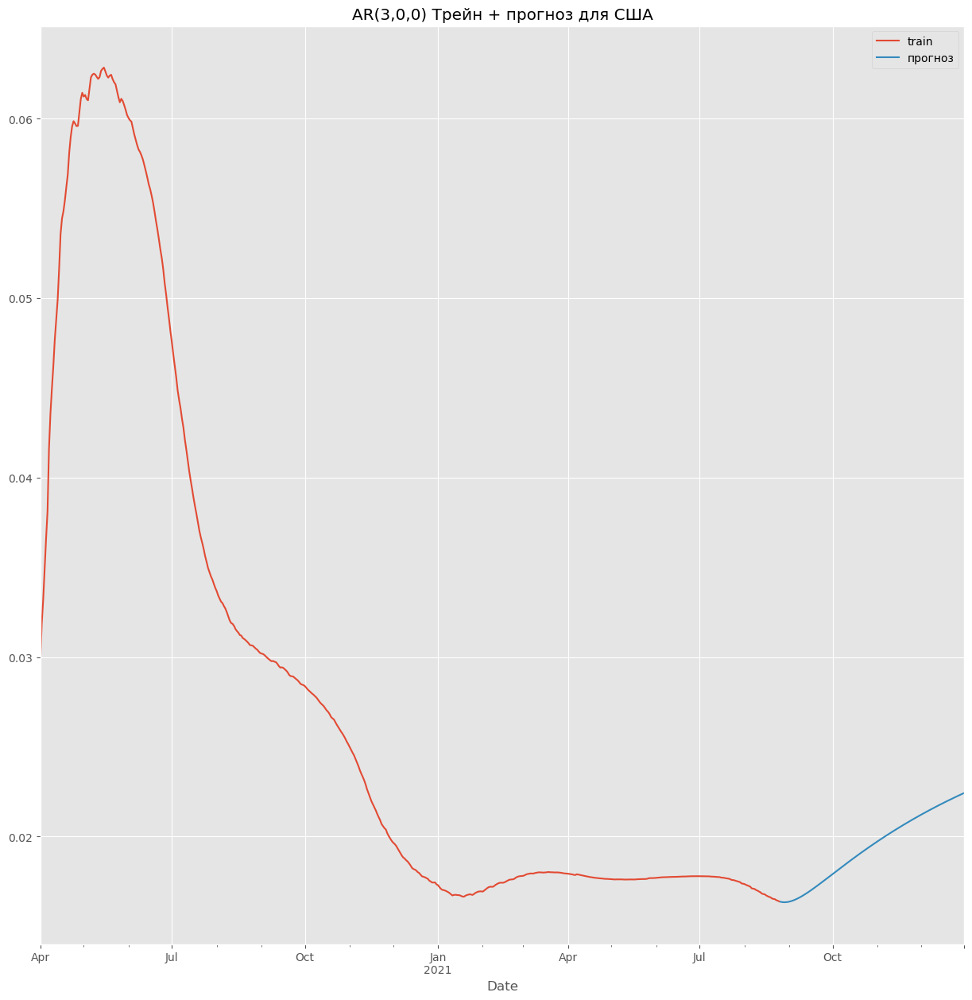

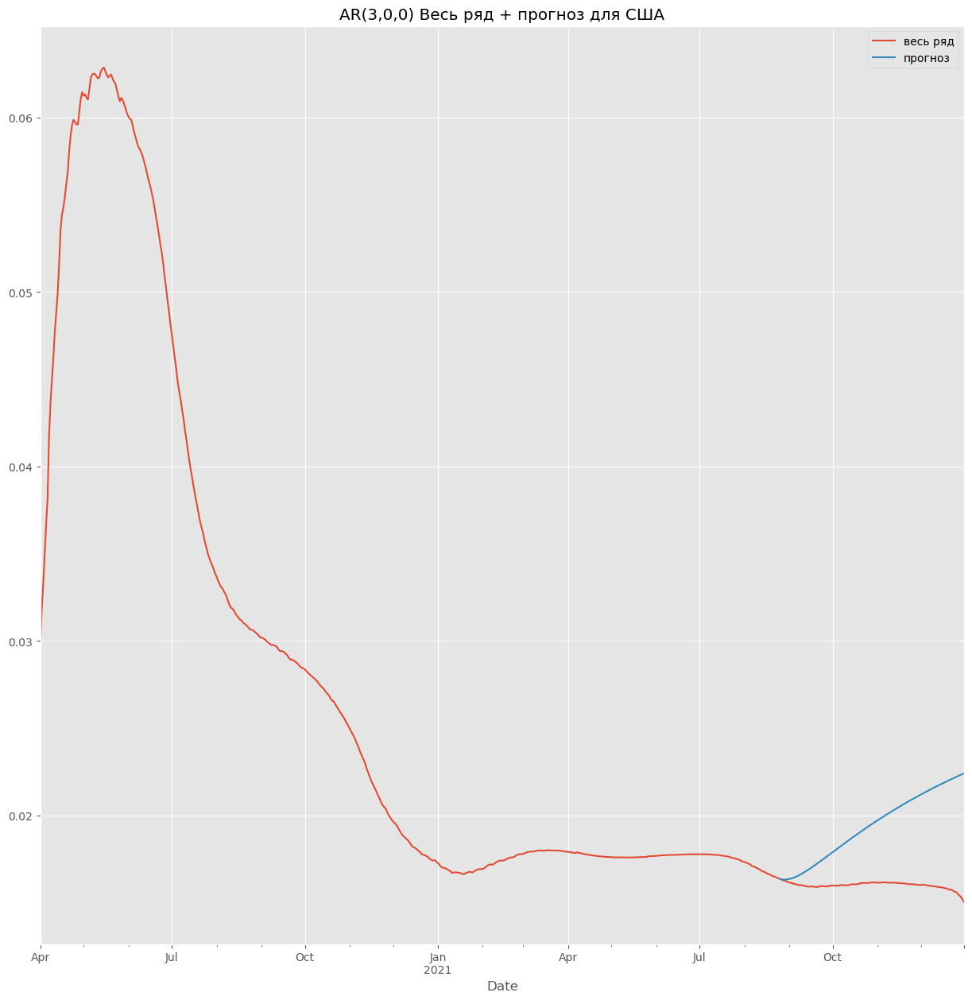

US AR p=3 RMSE = 0.00395


In [127]:
for p in [1, 2, 3]:
    model = ARIMA(train['US'], order=(p, 0, 0)).fit()
    forecast = pd.Series(model.get_forecast(len(test['US'])).predicted_mean.values, index=test['US'].index)

    train['US'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'AR({p},0,0) Трейн + прогноз для США')
    plt.show()

    cfr['US'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'AR({p},0,0) Весь ряд + прогноз для США')
    plt.show()

    rmse = RMSE(forecast, test['US'])
    results.loc[f'AR({p},0,0)', 'US'] = rmse
    print(f'US AR p={p} RMSE = {round(rmse, 5)}')

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


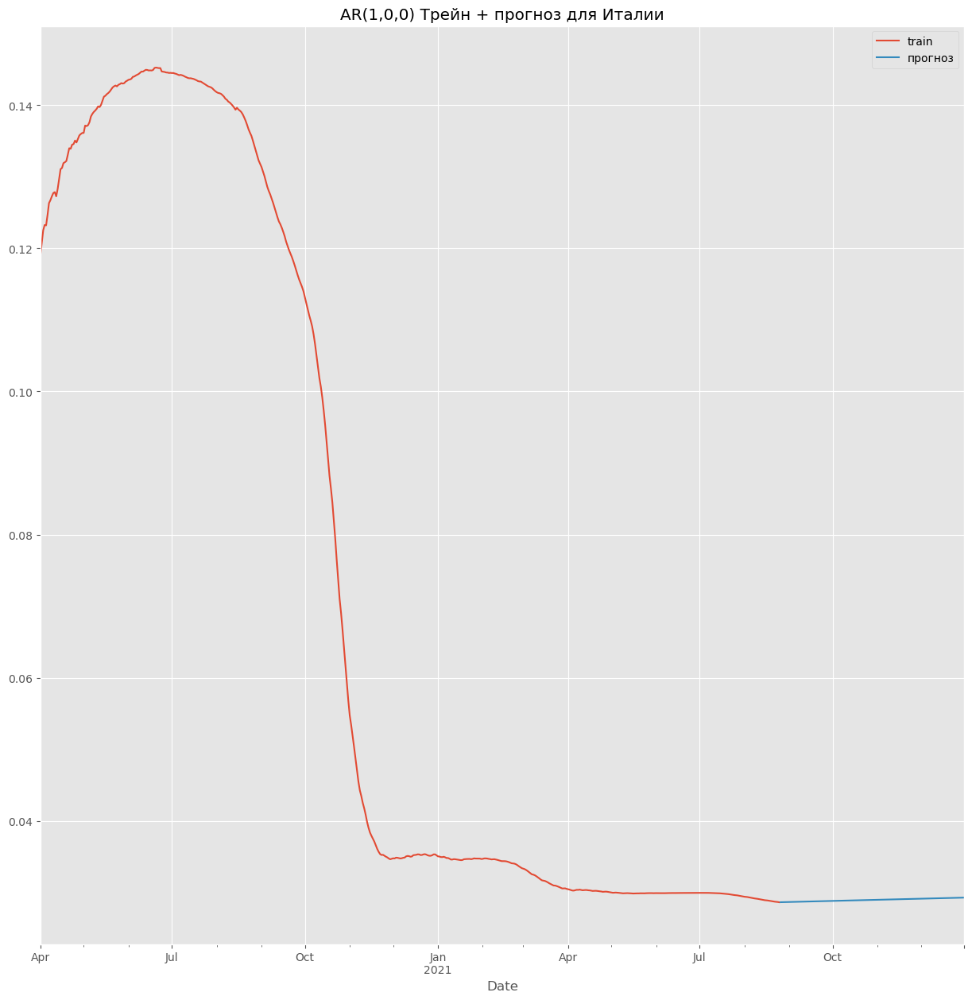

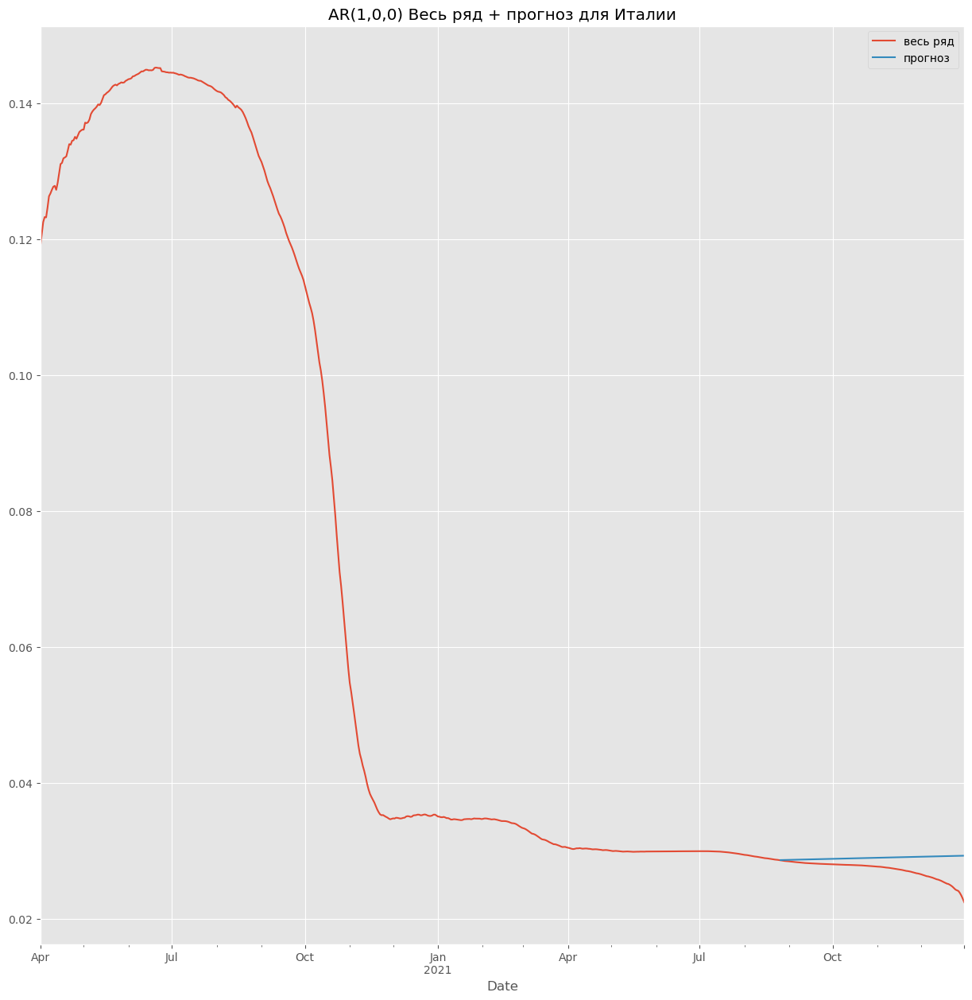

Italy AR p=1 RMSE = 0.0023


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


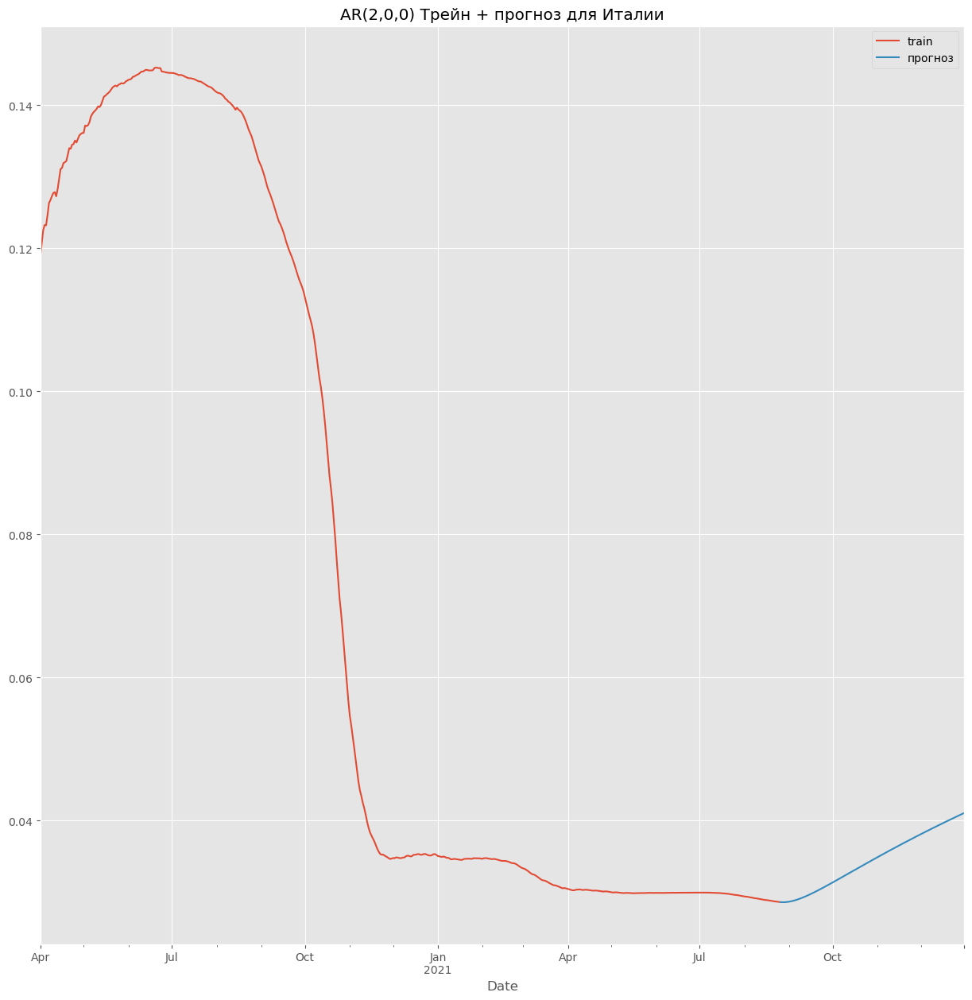

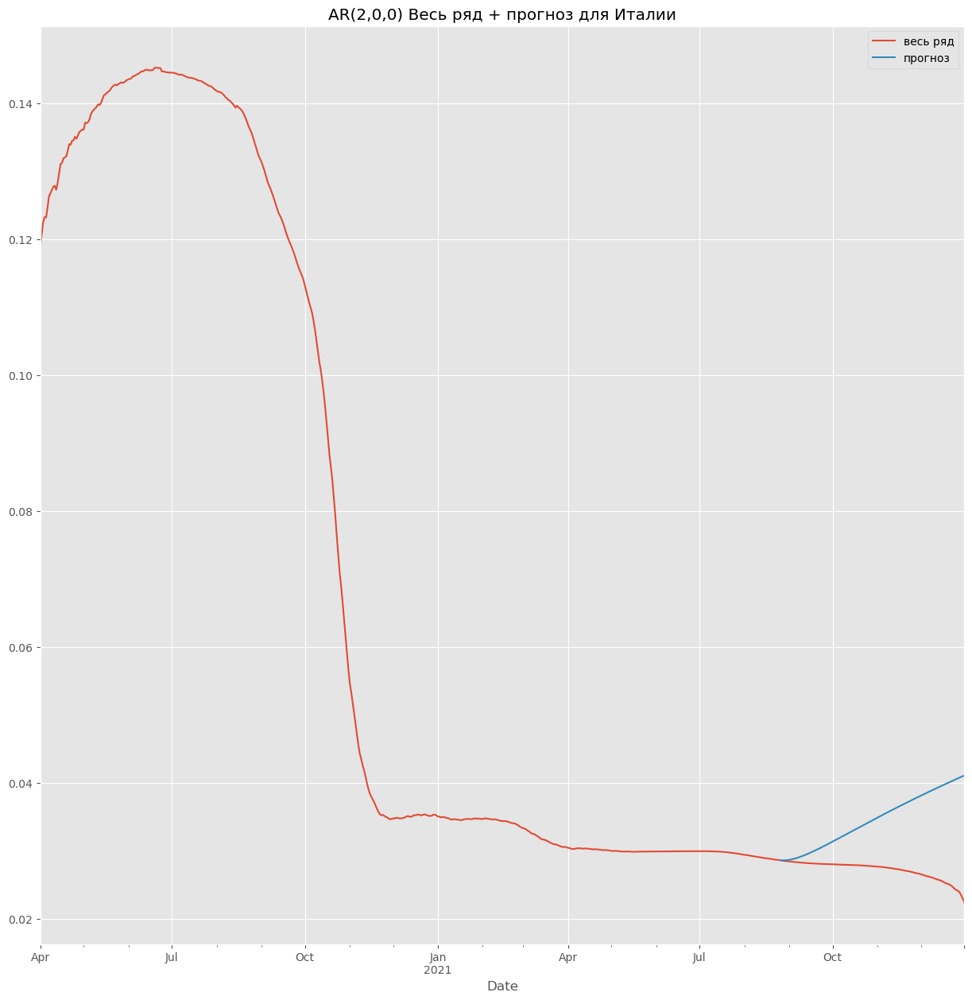

Italy AR p=2 RMSE = 0.00889


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


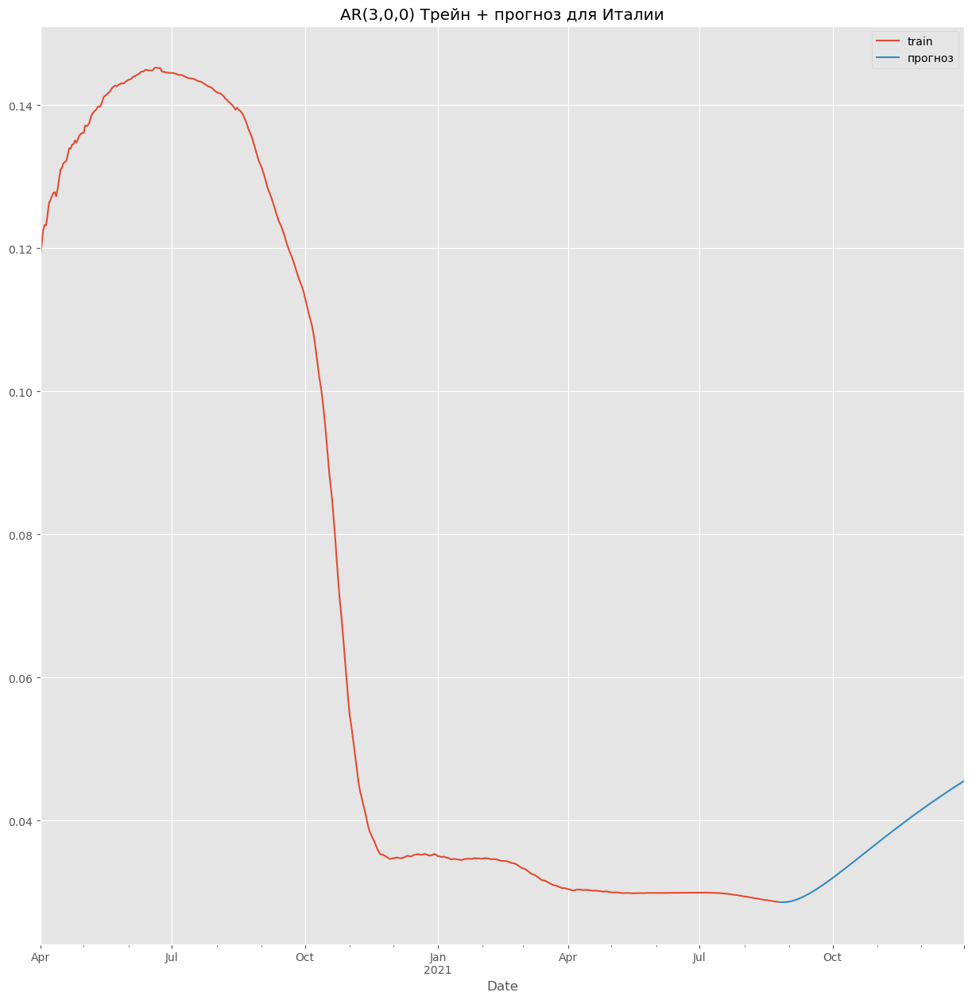

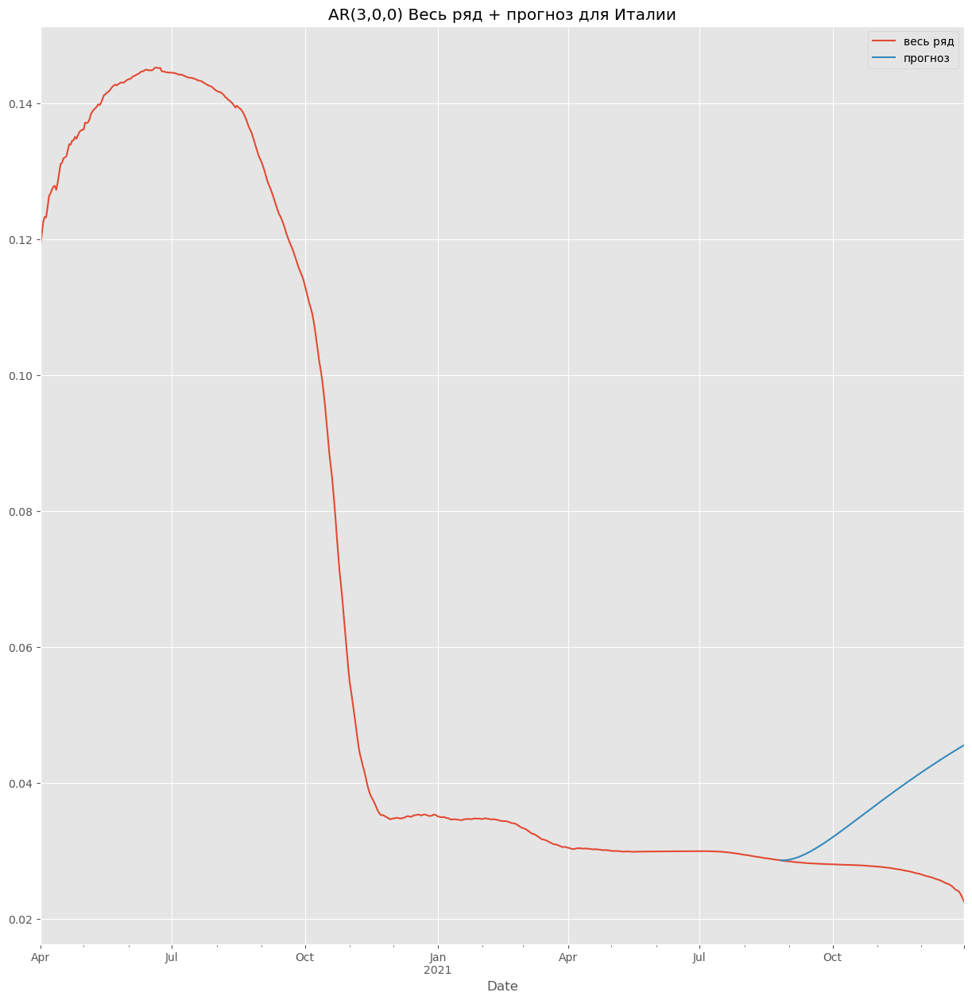

Italy AR p=3 RMSE = 0.01133


In [128]:
for p in [1, 2, 3]:
    model = ARIMA(train['Italy'], order=(p, 0, 0)).fit()
    forecast = pd.Series(model.get_forecast(len(test['Italy'])).predicted_mean.values, index=test['Italy'].index)

    train['Italy'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'AR({p},0,0) Трейн + прогноз для Италии')
    plt.show()

    cfr['Italy'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'AR({p},0,0) Весь ряд + прогноз для Италии')
    plt.show()

    rmse = RMSE(forecast, test['Italy'])
    results.loc[f'AR({p},0,0)', 'Italy'] = rmse
    print(f'Italy AR p={p} RMSE = {round(rmse, 5)}')

По результатам модель с авторегрессией лучше себя показала, чем модель с скользящим средним и просто средним, но вот изменение гиперпараметра не дало прироста в качестве, для России оптимальное p оказалось 2, а для США и Италии 1, то есть в основном выгодно смотреть на завтра как на сегодня.

#### 3.5. ARMA (5 баллов)

Постройте предсказание, скомбинировав модели AR и MA. Обязательно поэкспериментируйте с гиперпараметрами модели (и опишите, что вы делаете)

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


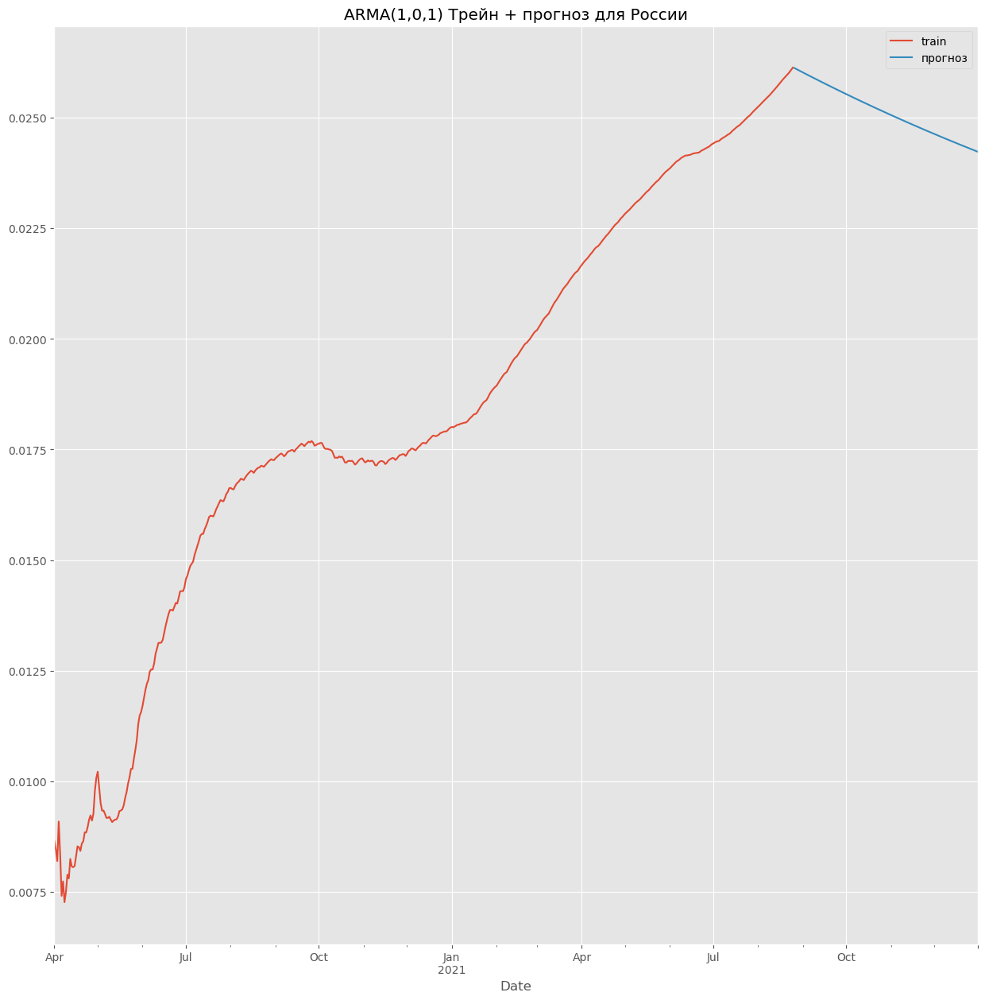

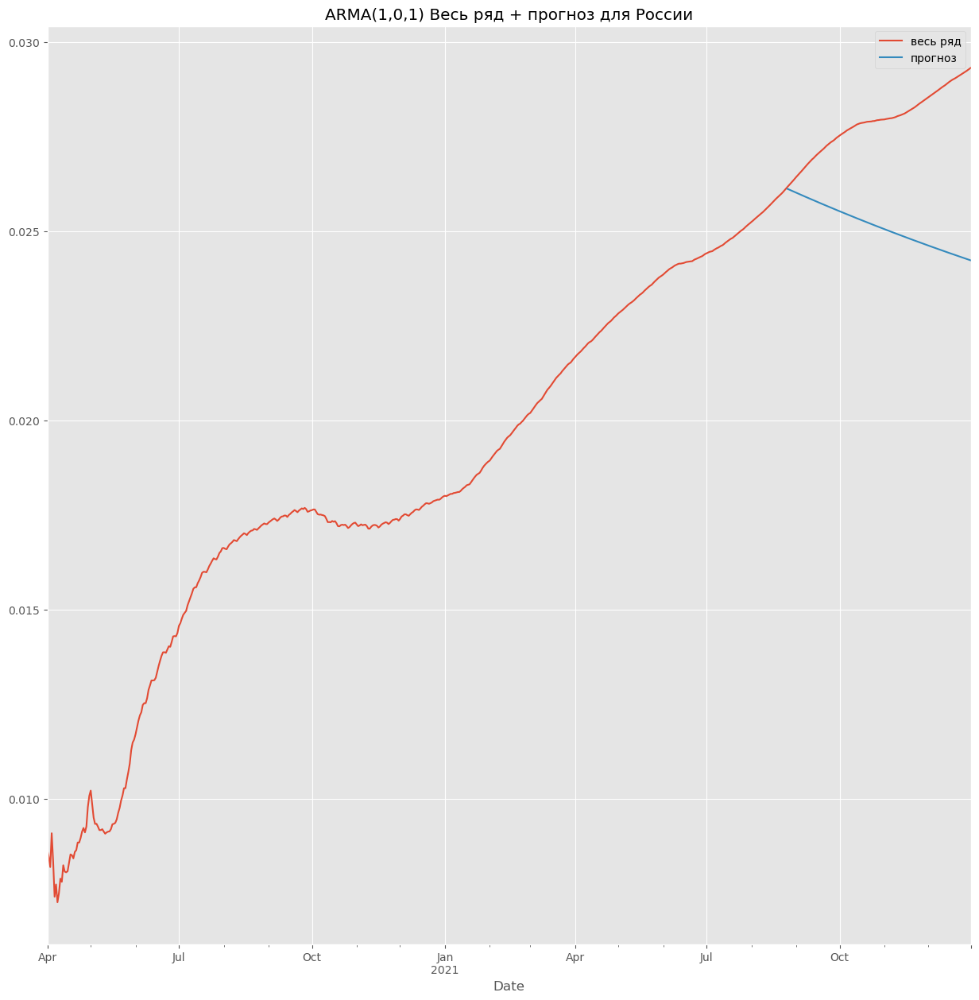

Russia ARMA(p=1,q=1) RMSE = 0.00308


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


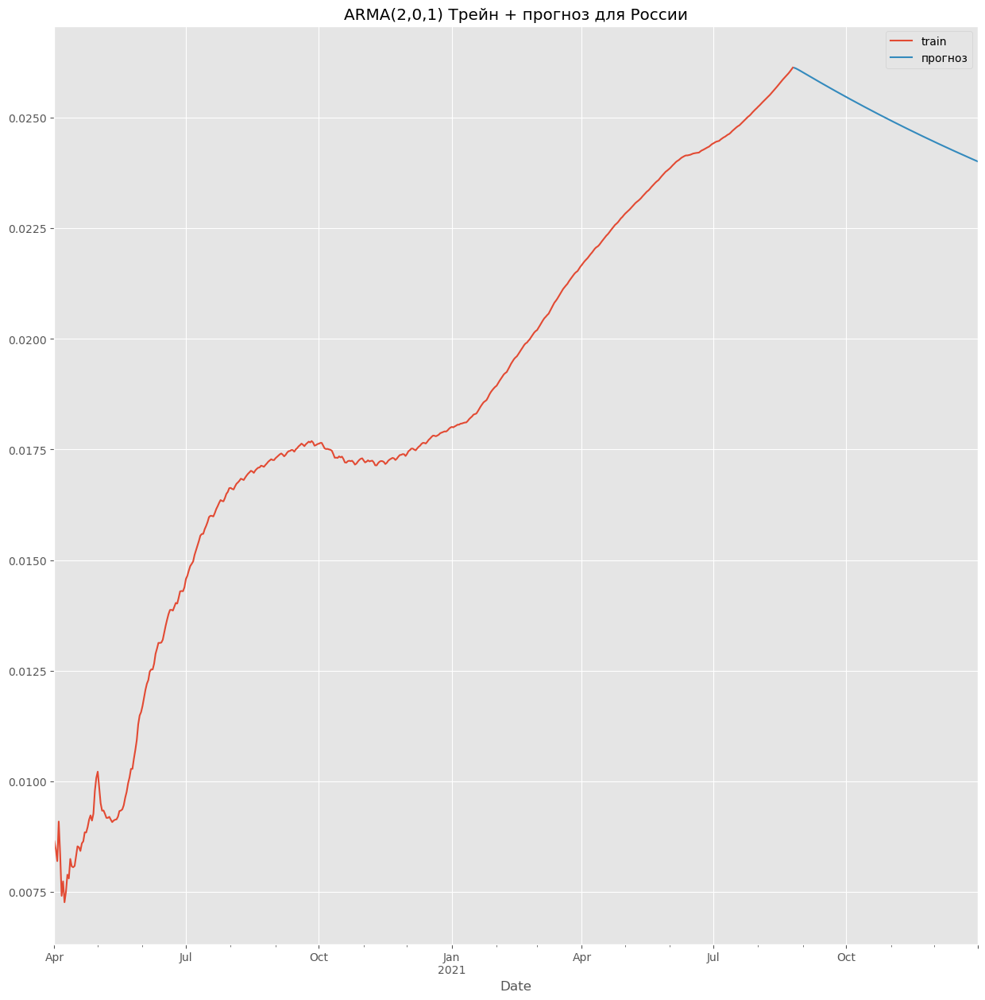

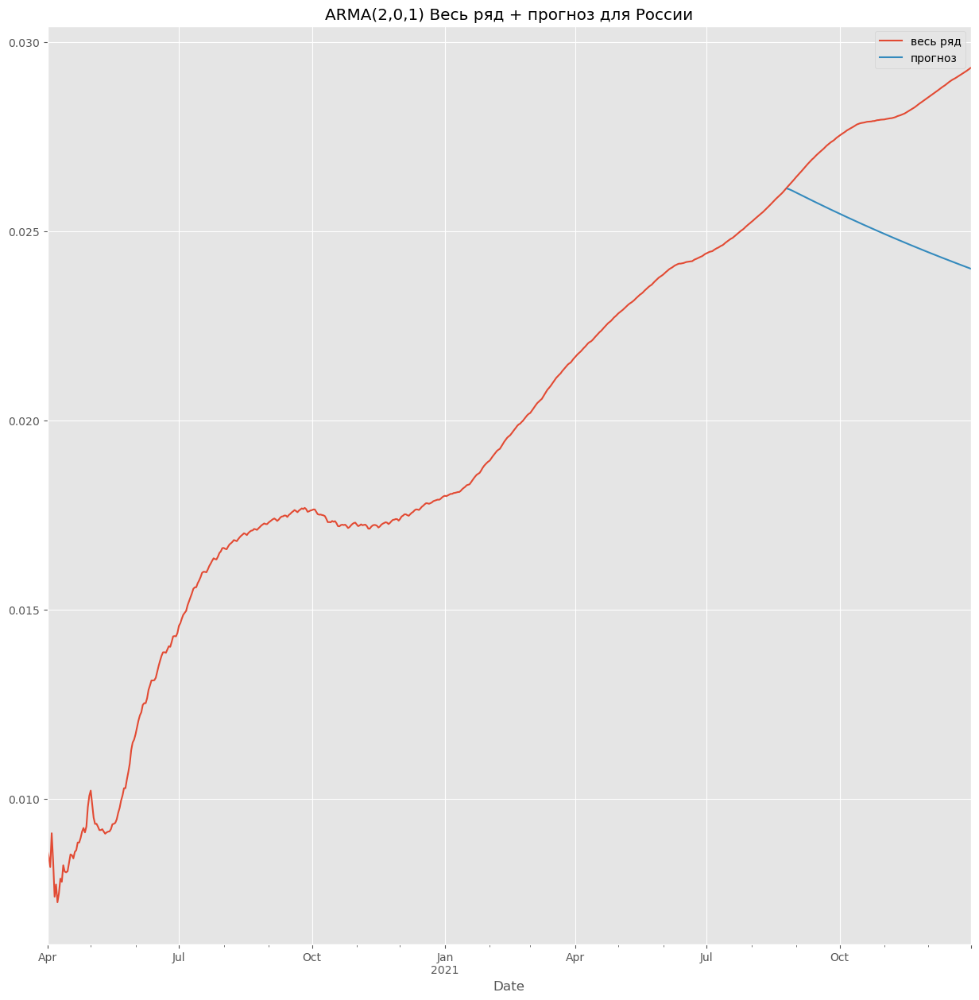

Russia ARMA(p=2,q=1) RMSE = 0.00322


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


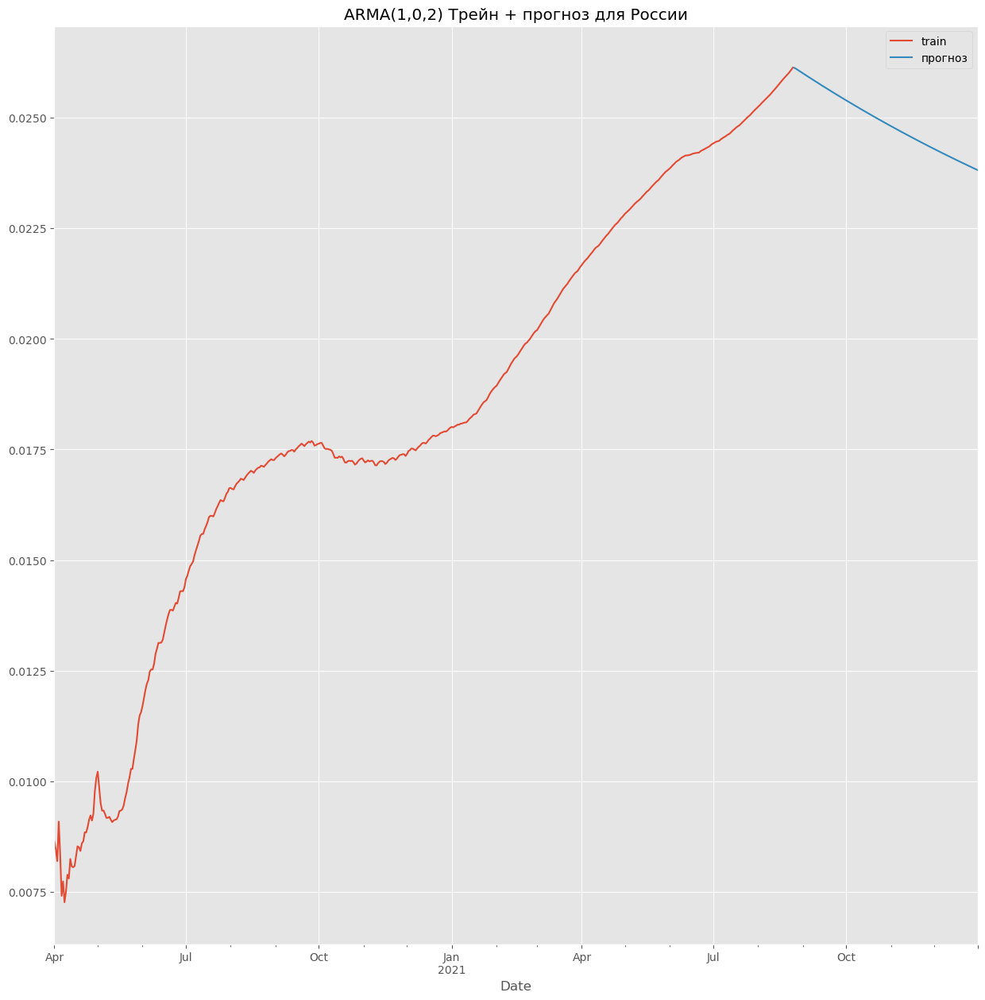

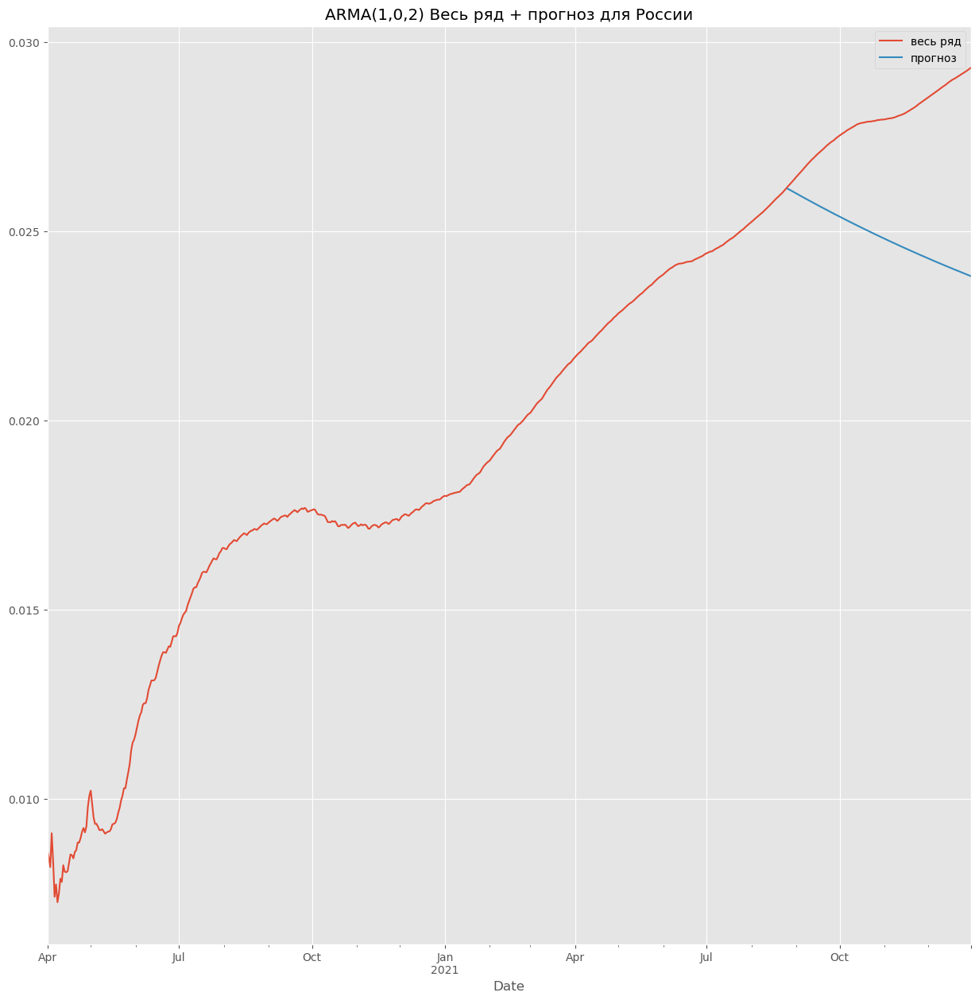

Russia ARMA(p=1,q=2) RMSE = 0.00334


In [129]:
for p, q in [(1, 1), (2, 1), (1, 2)]:
    model = ARIMA(train['Russia'], order=(p, 0, q)).fit()
    forecast = pd.Series(model.get_forecast(len(test['Russia'])).predicted_mean.values, index=test['Russia'].index)

    train['Russia'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARMA({p},0,{q}) Трейн + прогноз для России')
    plt.show()

    cfr['Russia'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARMA({p},0,{q}) Весь ряд + прогноз для России')
    plt.show()

    rmse = RMSE(forecast, test['Russia'])
    results.loc[f'ARMA({p},0,{q})', 'Russia'] = rmse
    print(f'Russia ARMA(p={p},q={q}) RMSE = {round(rmse, 5)}')

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


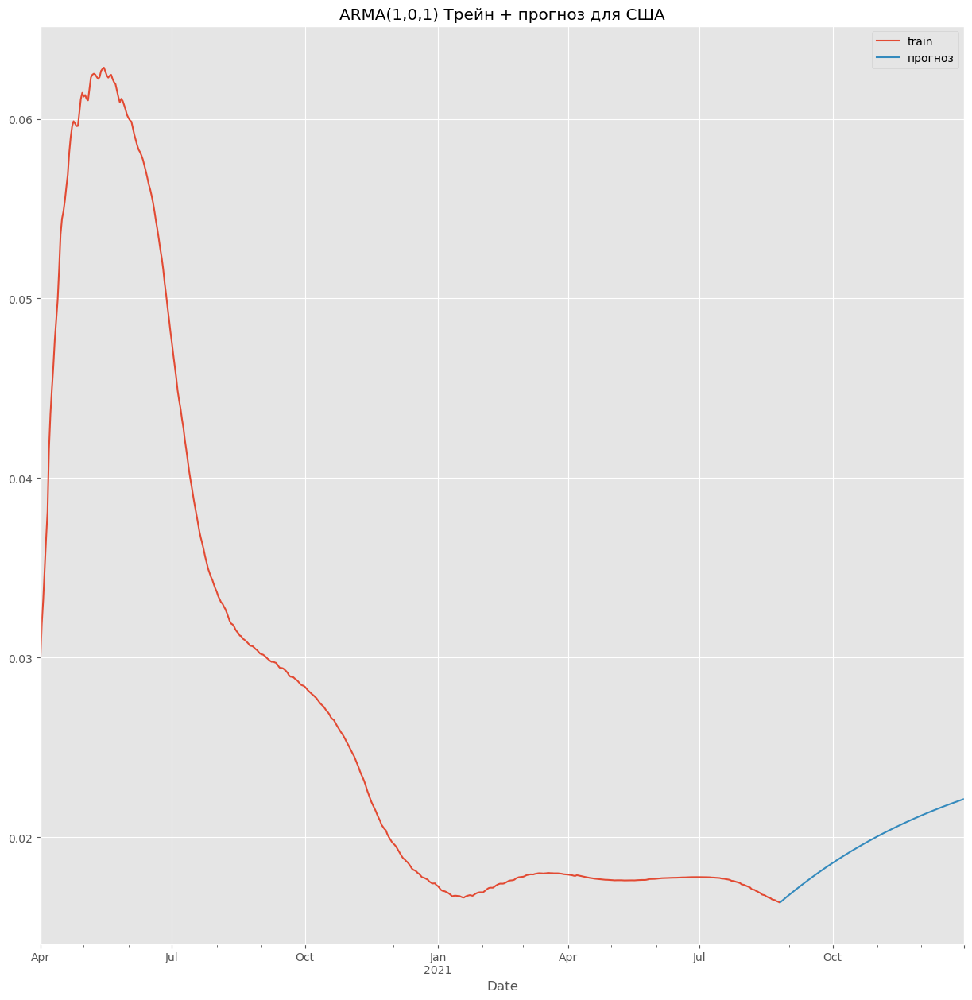

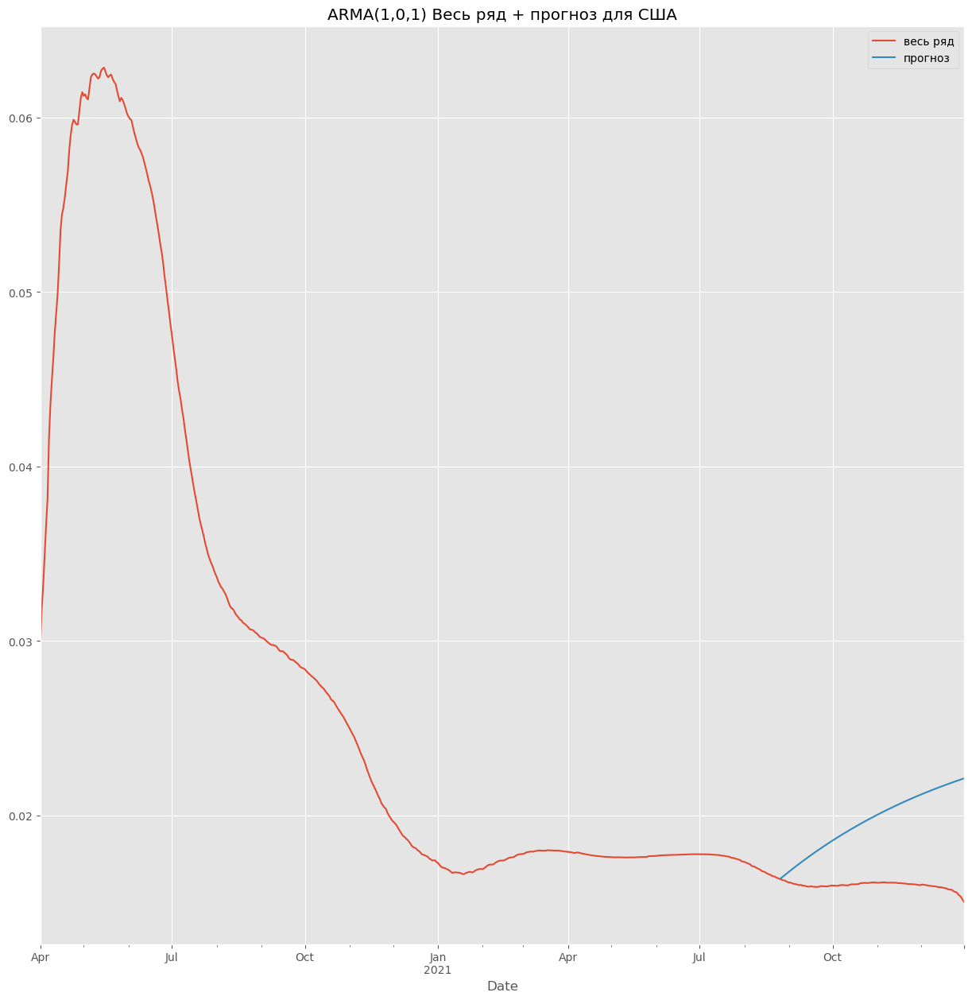

US ARMA(p=1,q=1) RMSE = 0.00408


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


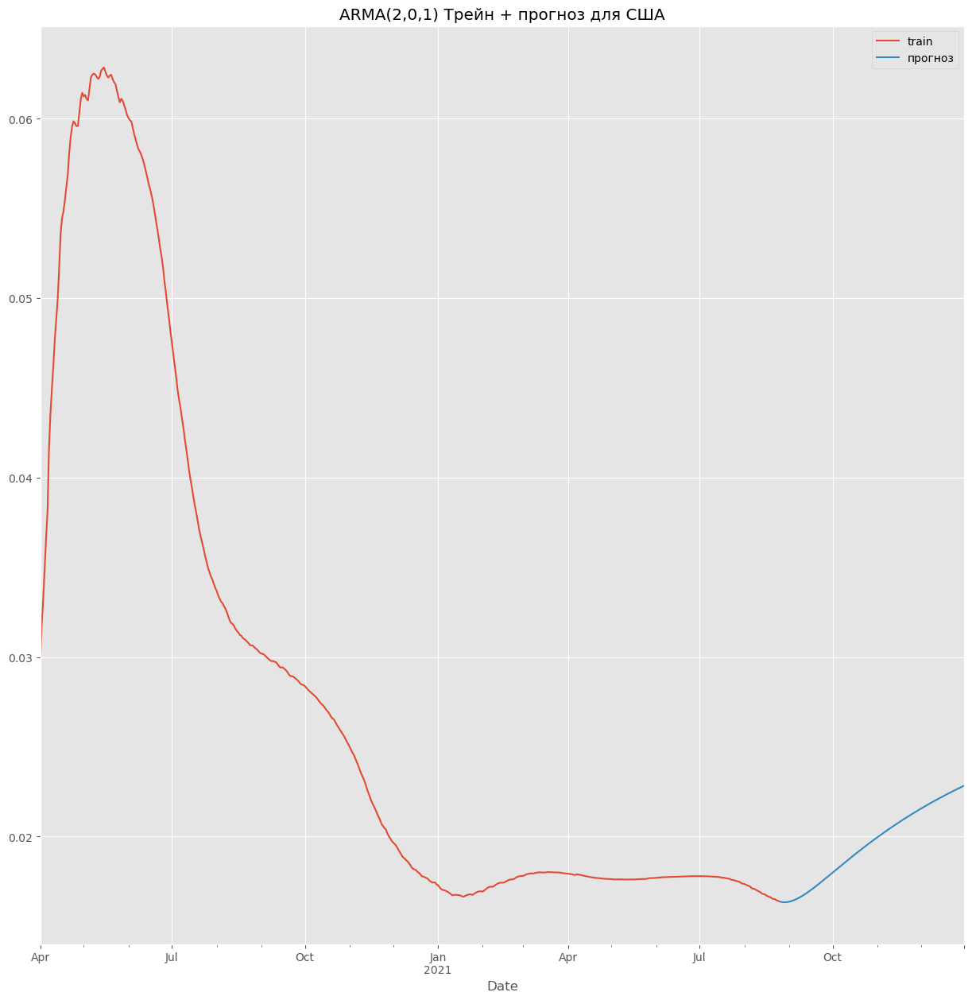

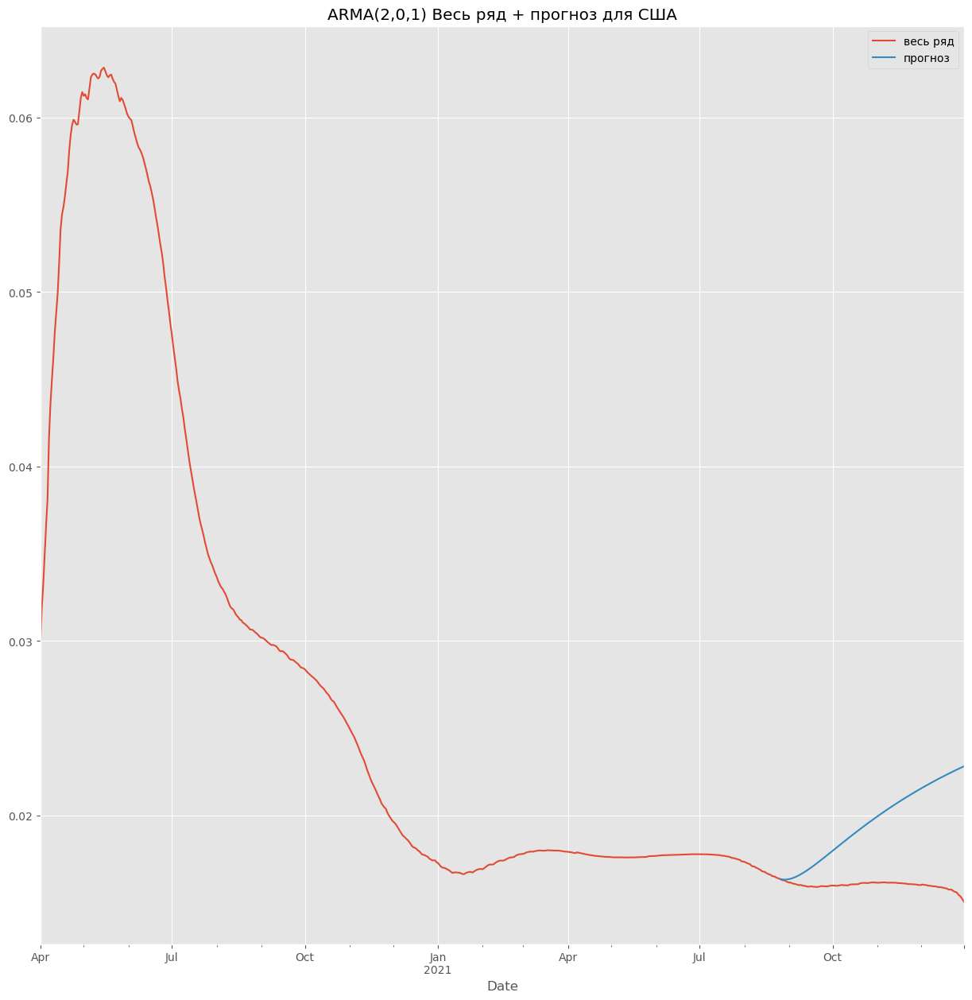

US ARMA(p=2,q=1) RMSE = 0.0042


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


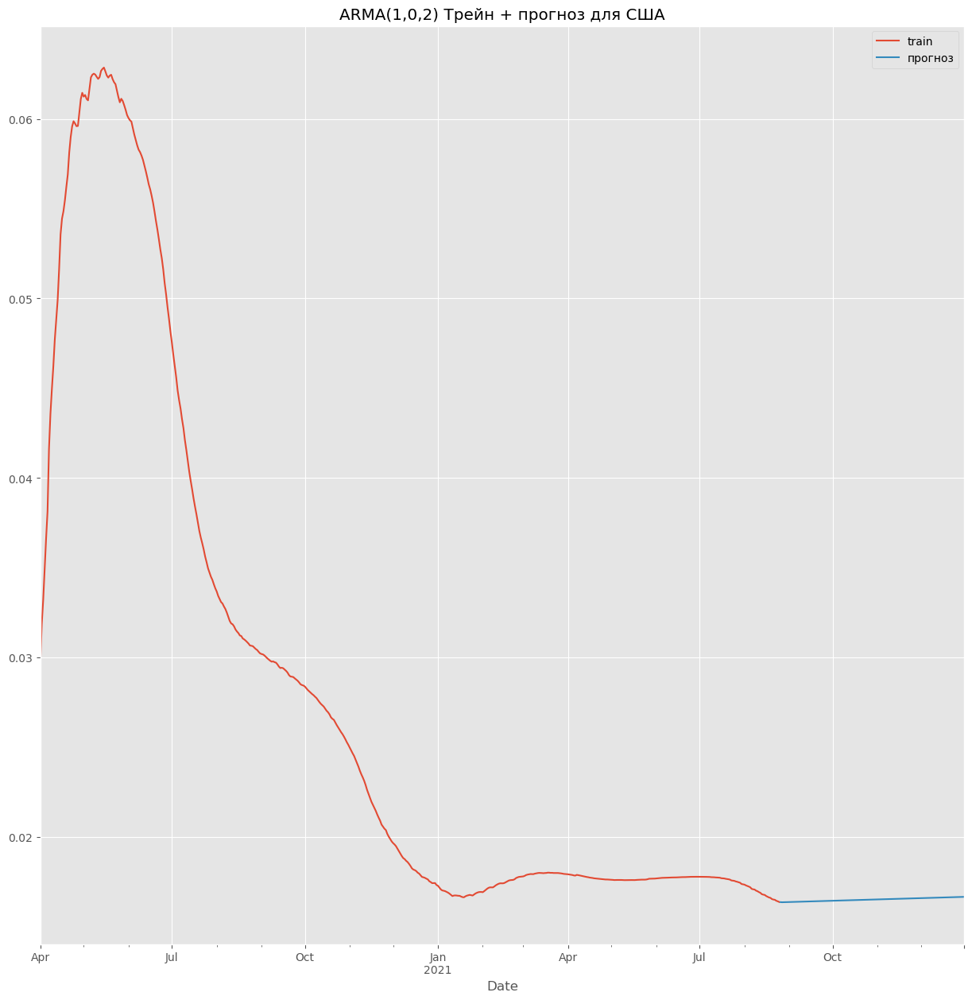

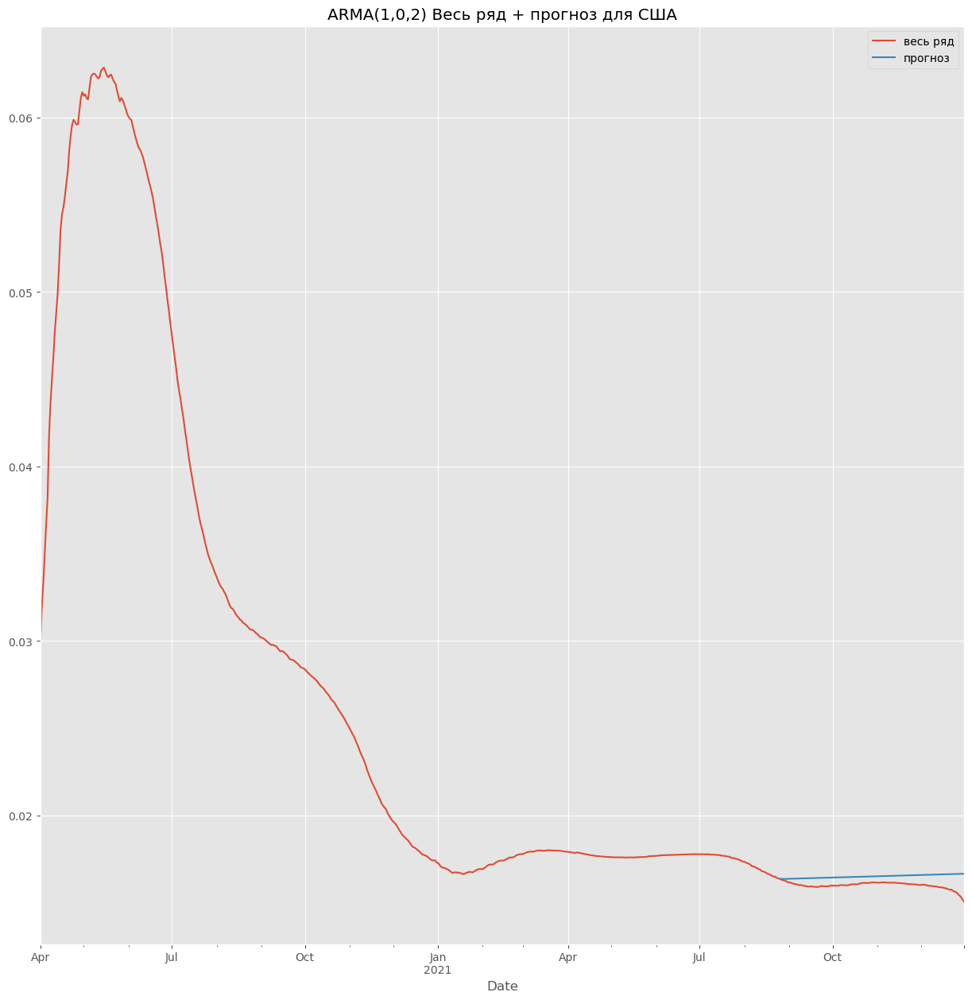

US ARMA(p=1,q=2) RMSE = 0.00057


In [130]:
for p, q in [(1, 1), (2, 1), (1, 2)]:
    model = ARIMA(train['US'], order=(p, 0, q)).fit()
    forecast = pd.Series(model.get_forecast(len(test['US'])).predicted_mean.values, index=test['US'].index)

    train['US'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARMA({p},0,{q}) Трейн + прогноз для США')
    plt.show()

    cfr['US'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARMA({p},0,{q}) Весь ряд + прогноз для США')
    plt.show()

    rmse = RMSE(forecast, test['US'])
    results.loc[f'ARMA({p},0,{q})', 'US'] = rmse
    print(f'US ARMA(p={p},q={q}) RMSE = {round(rmse, 5)}')

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


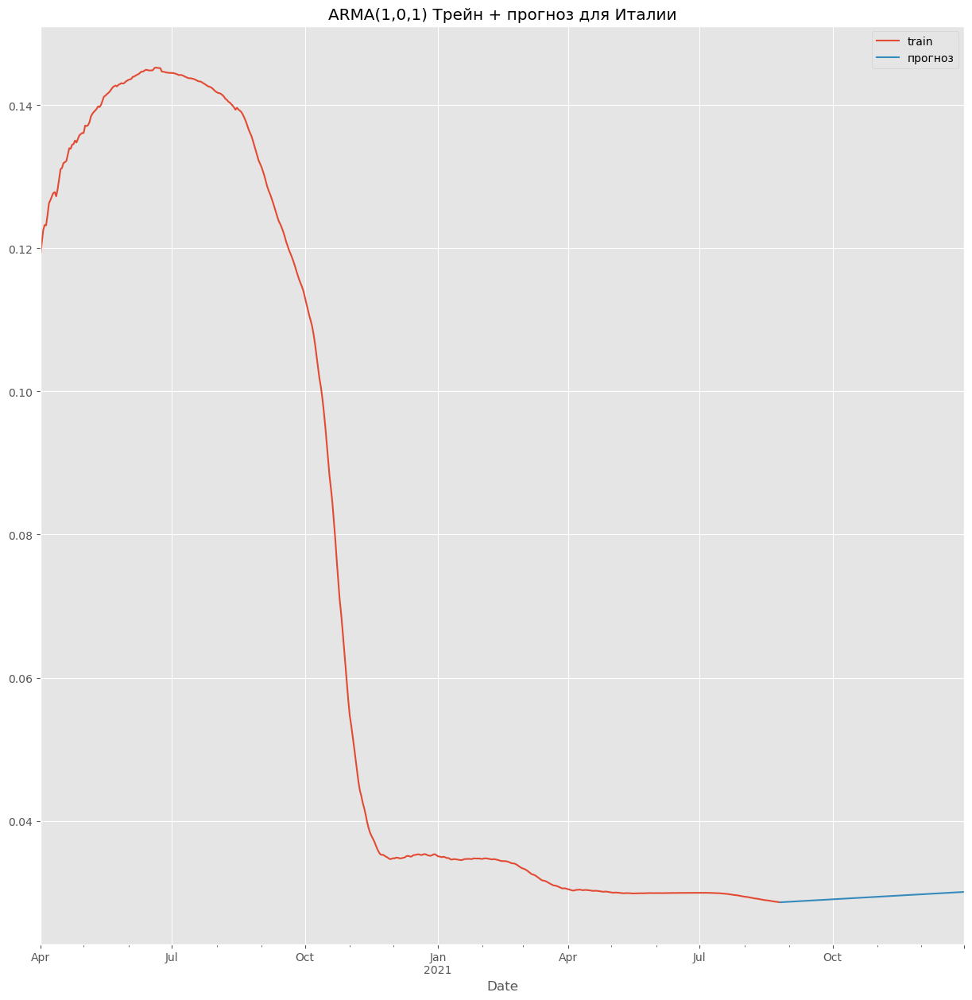

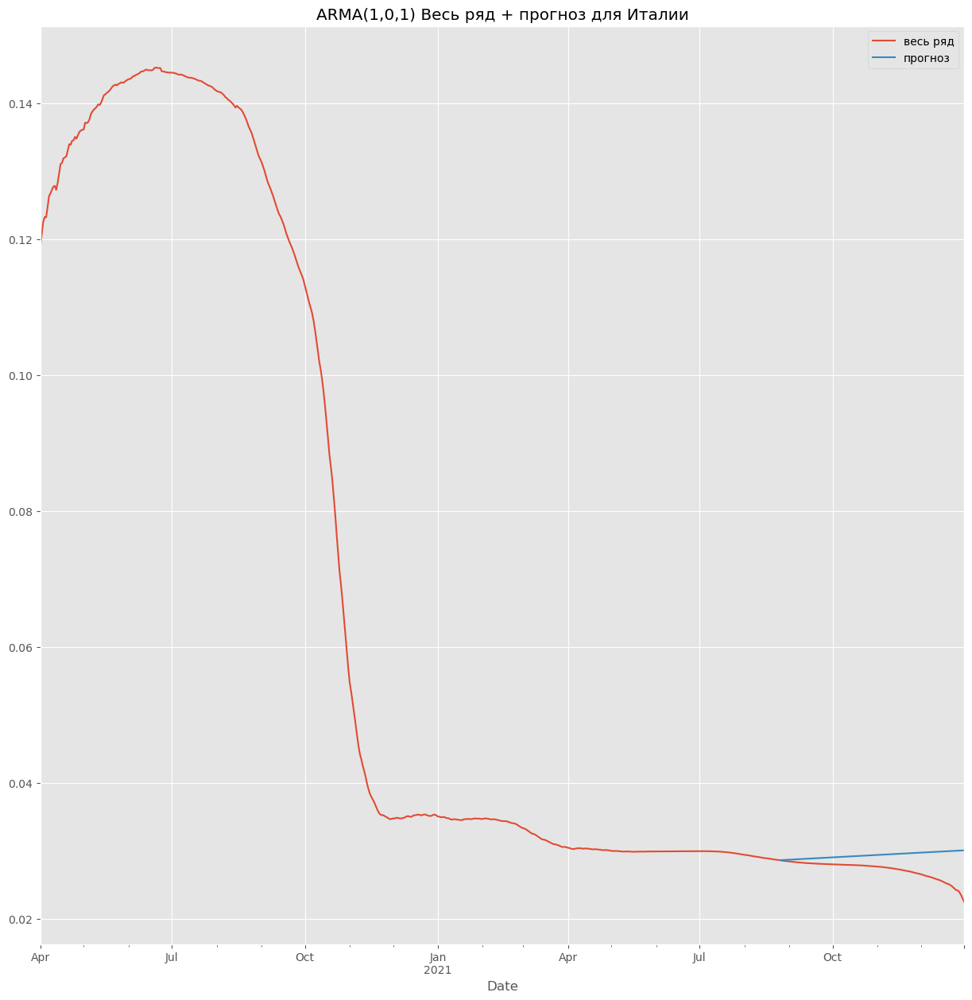

Italy ARMA(p=1,q=1) RMSE = 0.00274


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


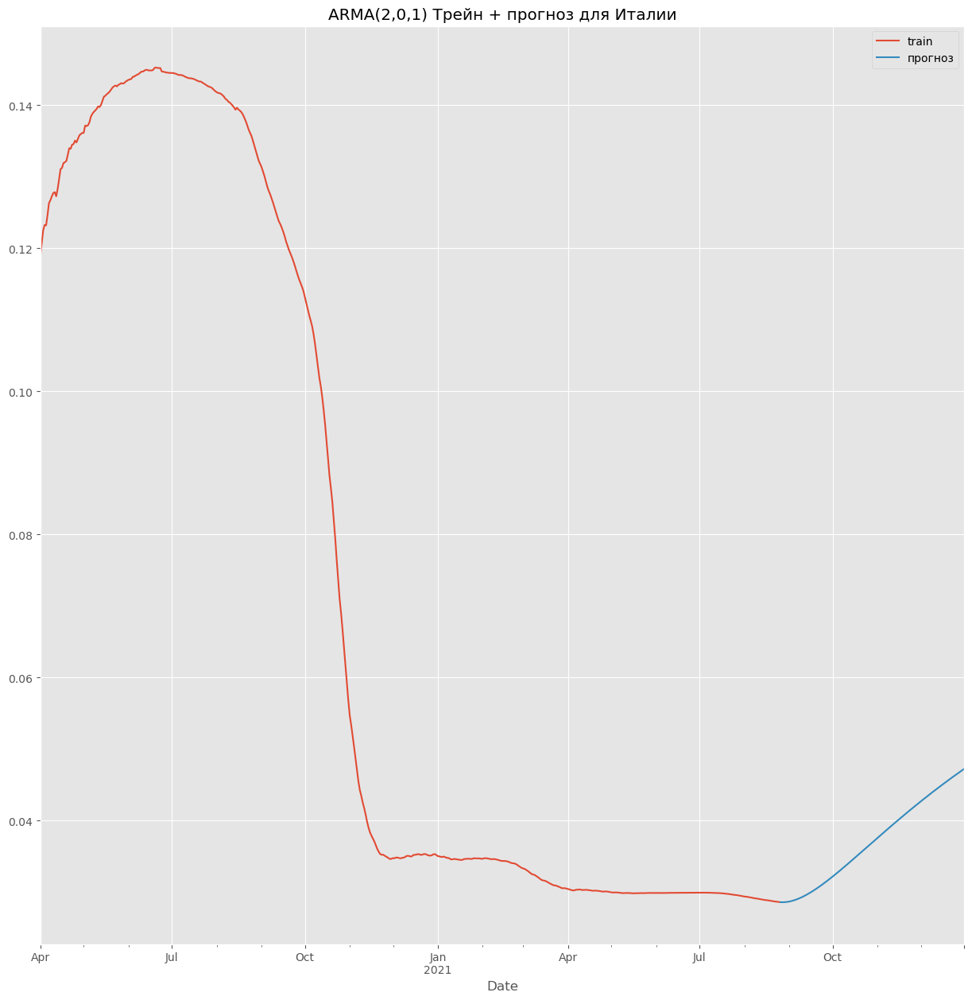

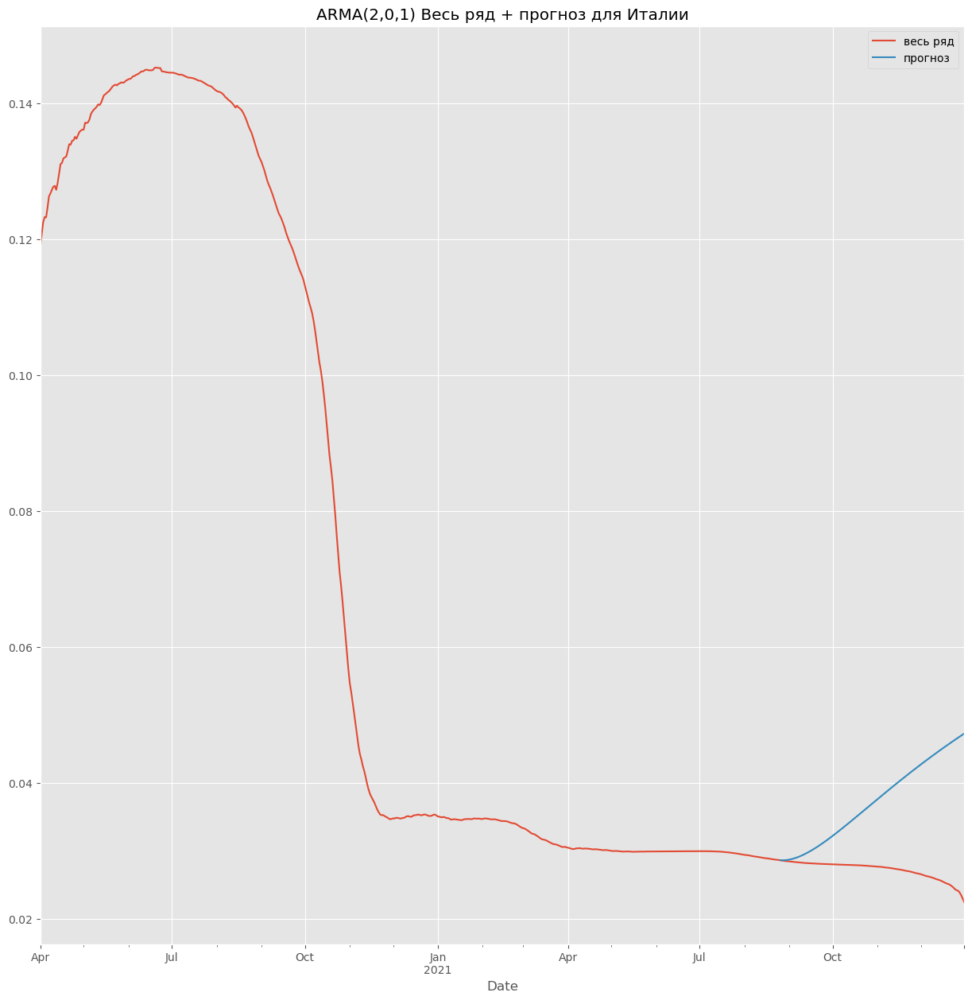

Italy ARMA(p=2,q=1) RMSE = 0.01222


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


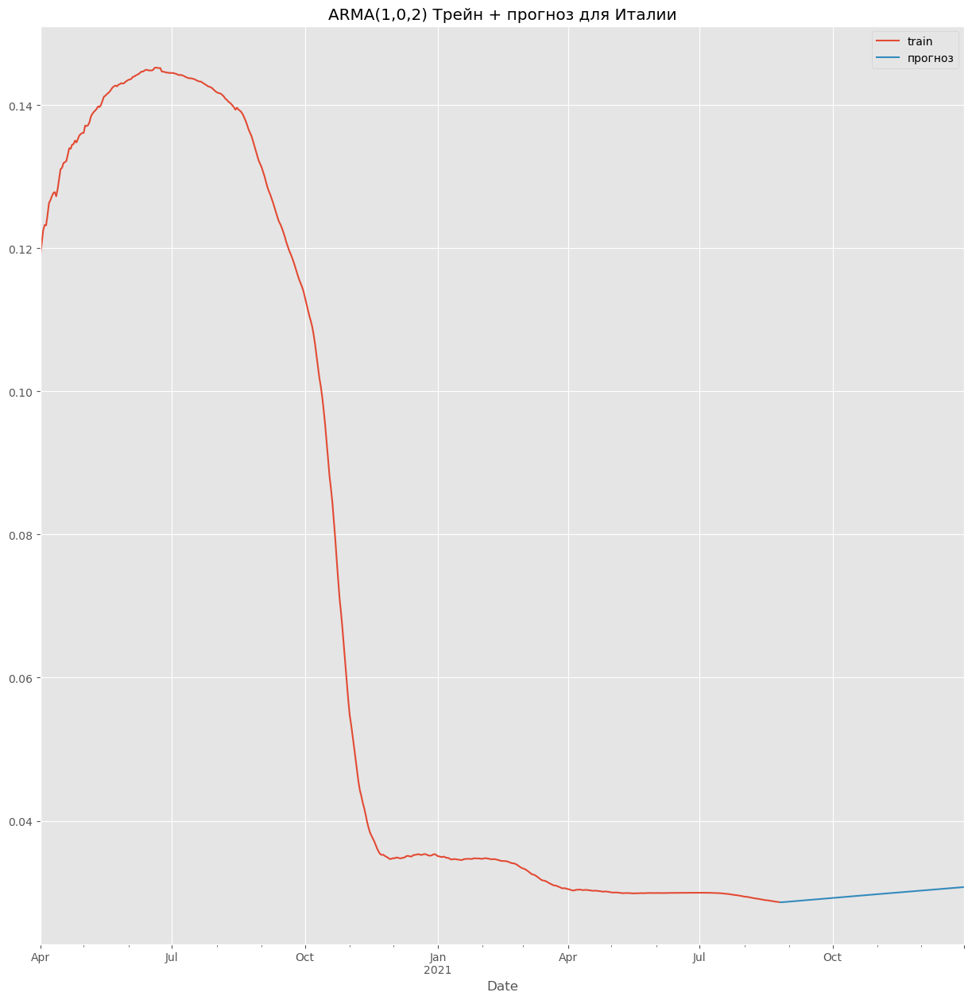

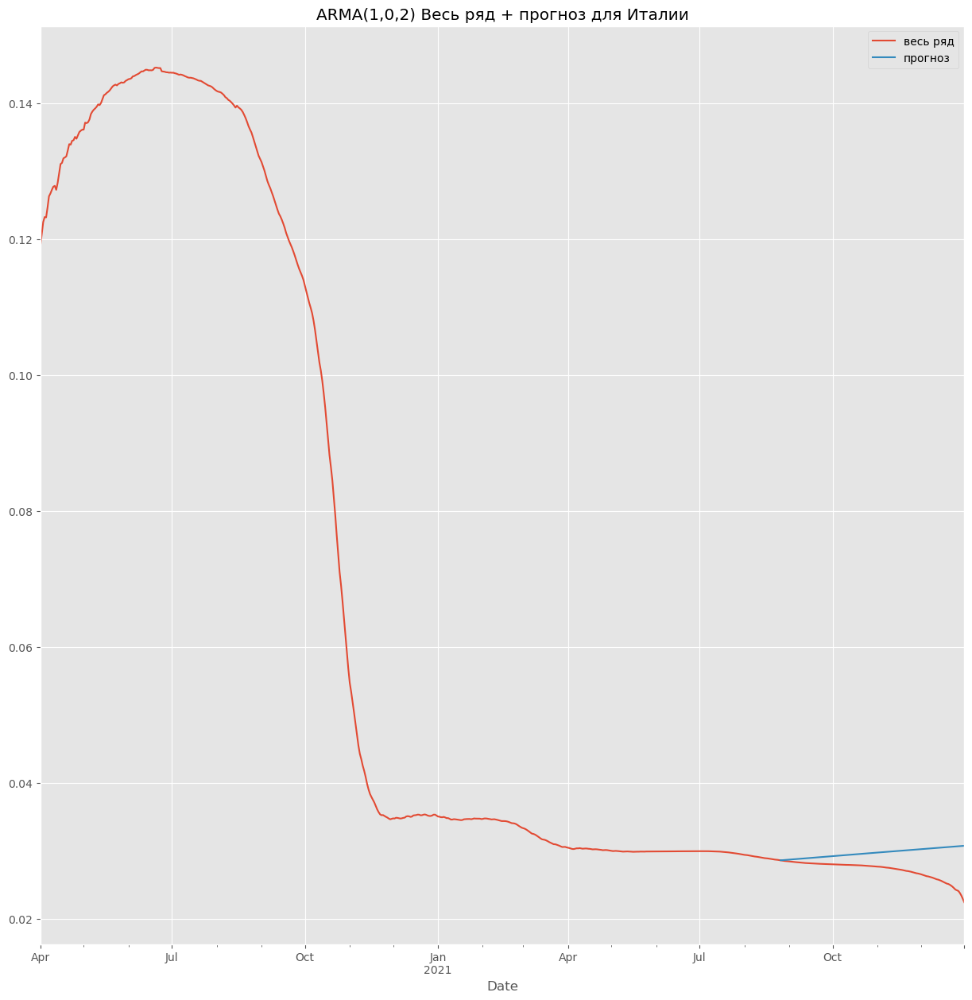

Italy ARMA(p=1,q=2) RMSE = 0.00311


In [131]:
for p, q in [(1, 1), (2, 1), (1, 2)]:
    model = ARIMA(train['Italy'], order=(p, 0, q)).fit()
    forecast = pd.Series(model.get_forecast(len(test['Italy'])).predicted_mean.values, index=test['Italy'].index)

    train['Italy'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARMA({p},0,{q}) Трейн + прогноз для Италии')
    plt.show()

    cfr['Italy'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARMA({p},0,{q}) Весь ряд + прогноз для Италии')
    plt.show()

    rmse = RMSE(forecast, test['Italy'])
    results.loc[f'ARMA({p},0,{q})', 'Italy'] = rmse
    print(f'Italy ARMA(p={p},q={q}) RMSE = {round(rmse, 5)}')

In [132]:
results

,Russia,US,Italy
Mean,0.01,0.01,0.05
Linear,0.00,0.02,0.05
"MA(0,0,1)",0.01,0.01,0.05
"MA(0,0,2)",0.01,0.01,0.05
"MA(0,0,3)",0.01,0.01,0.05
"AR(1,0,0)",0.00,0.00,0.00
"AR(2,0,0)",0.00,0.00,0.01
"AR(3,0,0)",0.00,0.00,0.01
"ARMA(1,0,1)",0.00,0.00,0.00
"ARMA(2,0,1)",0.00,0.00,0.01


Когда построил модель ARMA для 3 рядов, то лучшим оказалась комбинация ARMA(1,0,1) для всех 3 рядов, в целом это логично, потому что до этого когда смотрели отдельно по MA, AR там как раз такие значения и получались, но все равно прогноз довольно далек до идеального, но лучше, чем просто предсказание средним или через скользящее среднее, но все равно ряды у нас не стационарны, поэтому качество все-таки не очень

#### 3.6. Интегрированная модель авторегрессии — скользящего среднего (Auto Regressive Integrated Moving Average) — ARIMA (5 баллов)

Постройте предсказание, модернизировав модель ARMA и добавив интегрирующую компоненту. Обязательно поэкспериментируйте с гиперпараметрами модели (и опишите, что вы делаете)

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


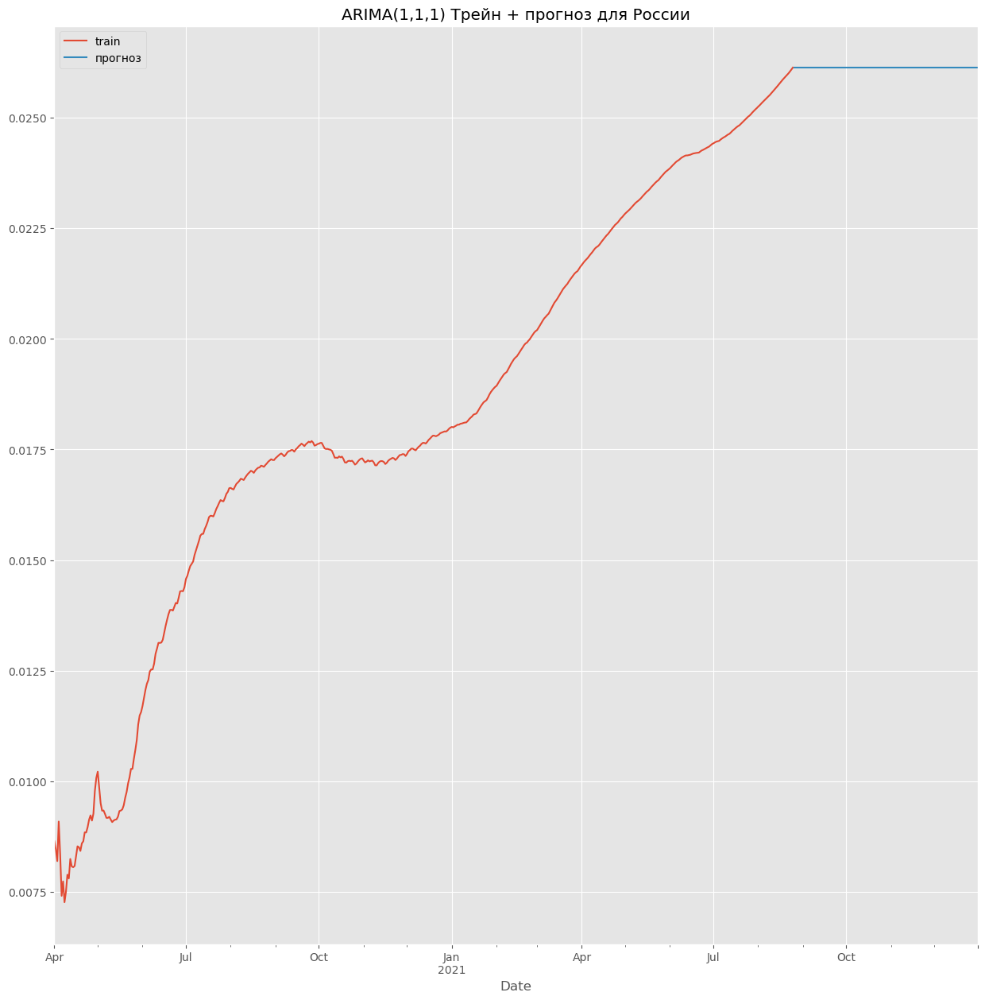

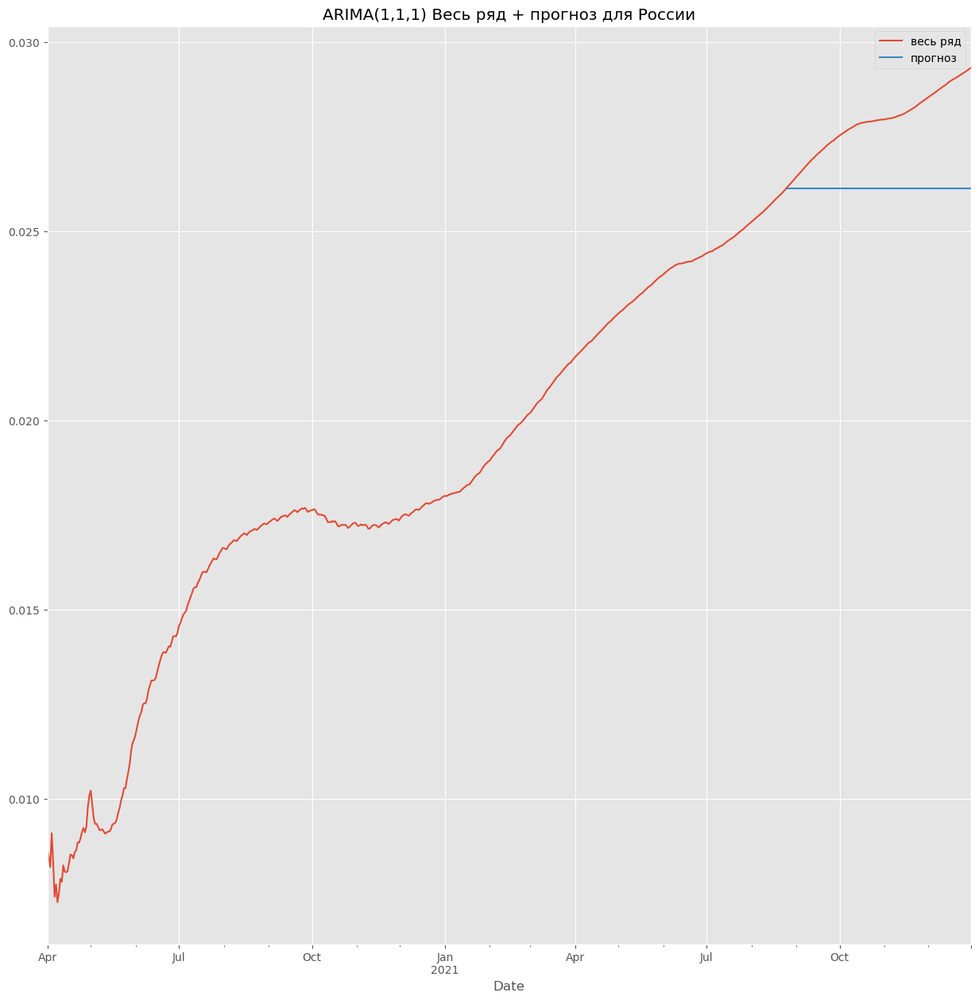

Russia ARIMA(1,1,1) RMSE = 0.00195


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


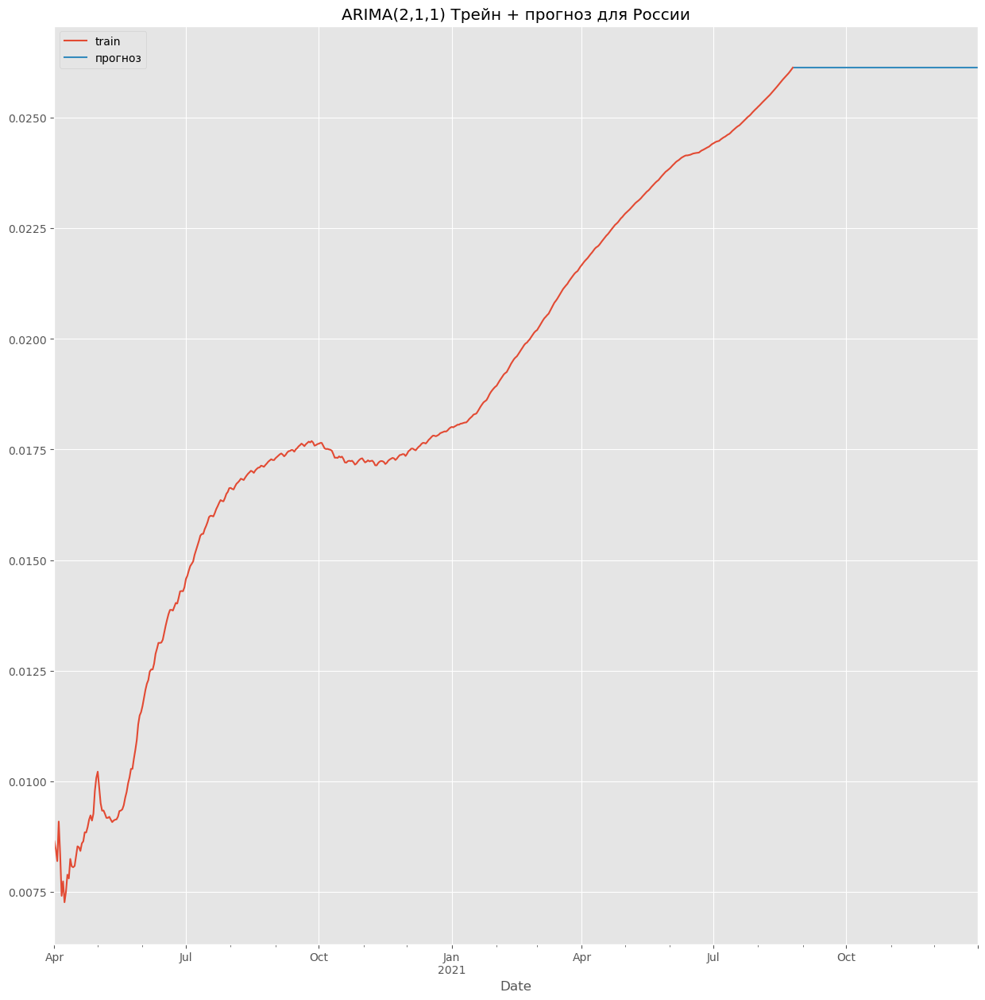

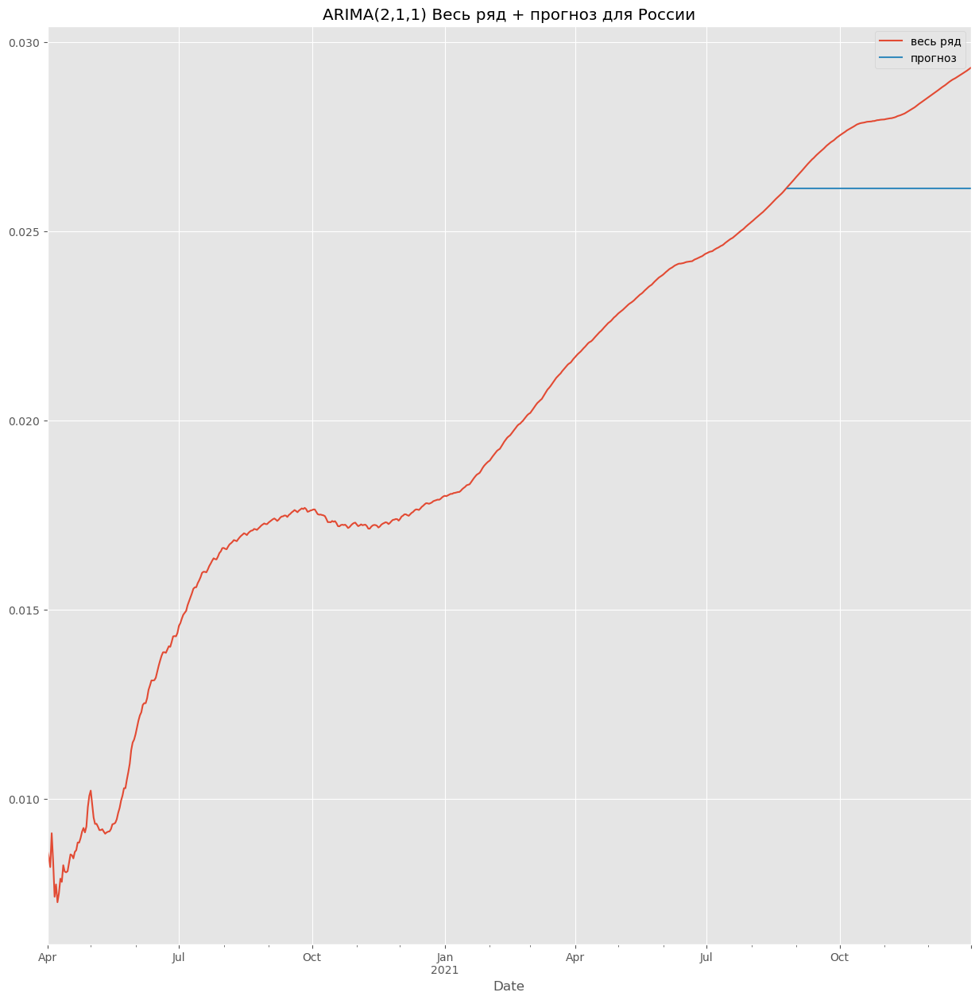

Russia ARIMA(2,1,1) RMSE = 0.00195


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


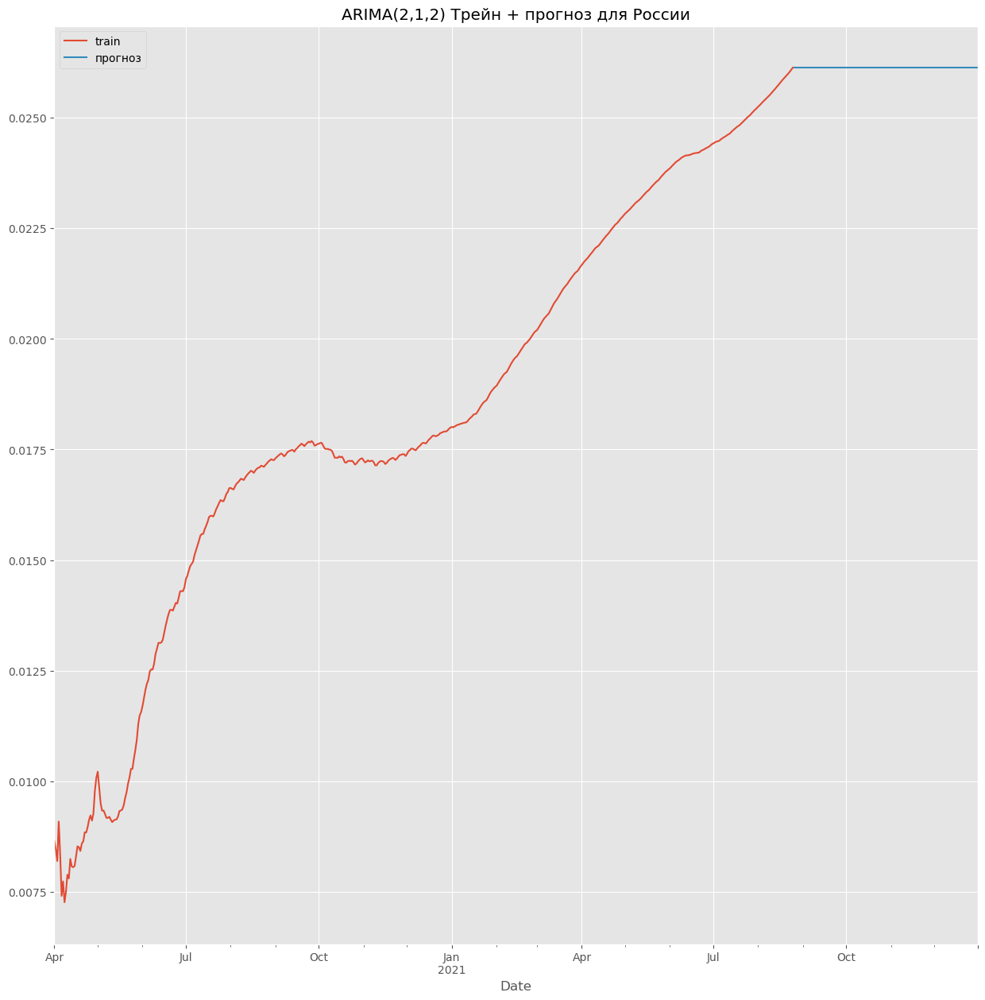

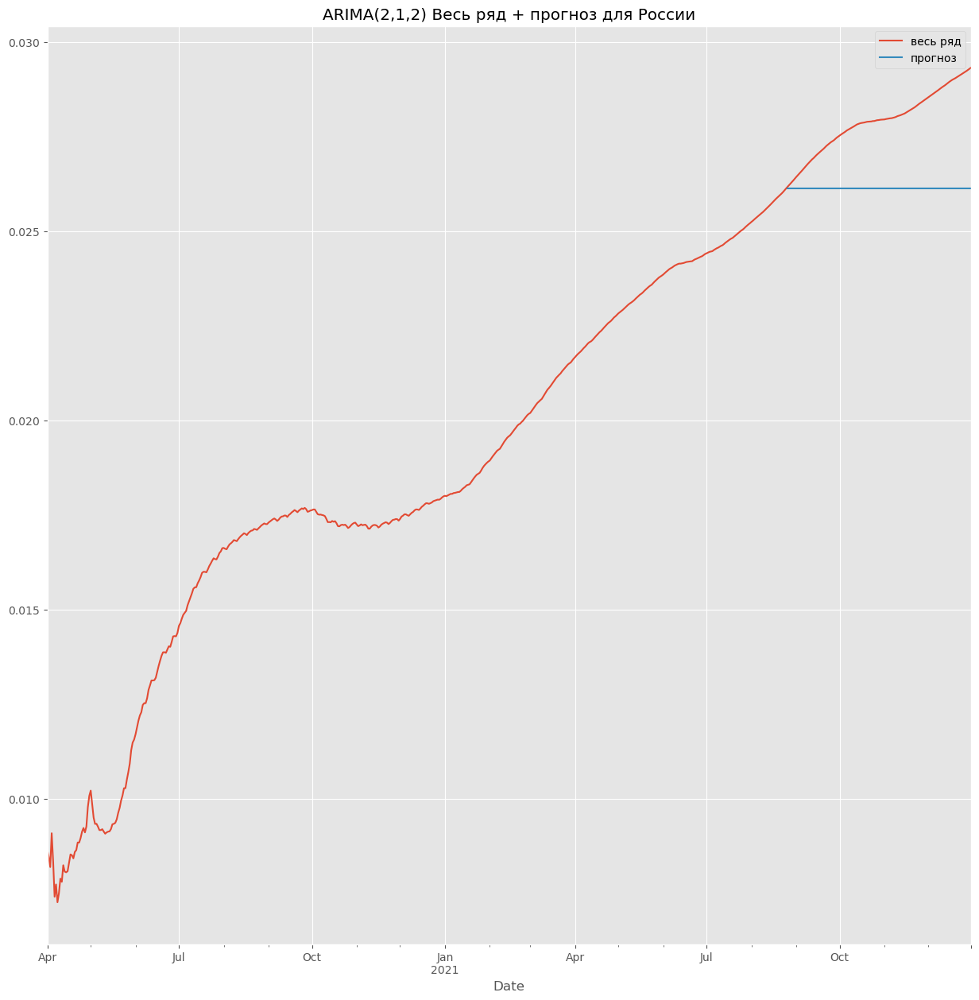

Russia ARIMA(2,1,2) RMSE = 0.00195


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


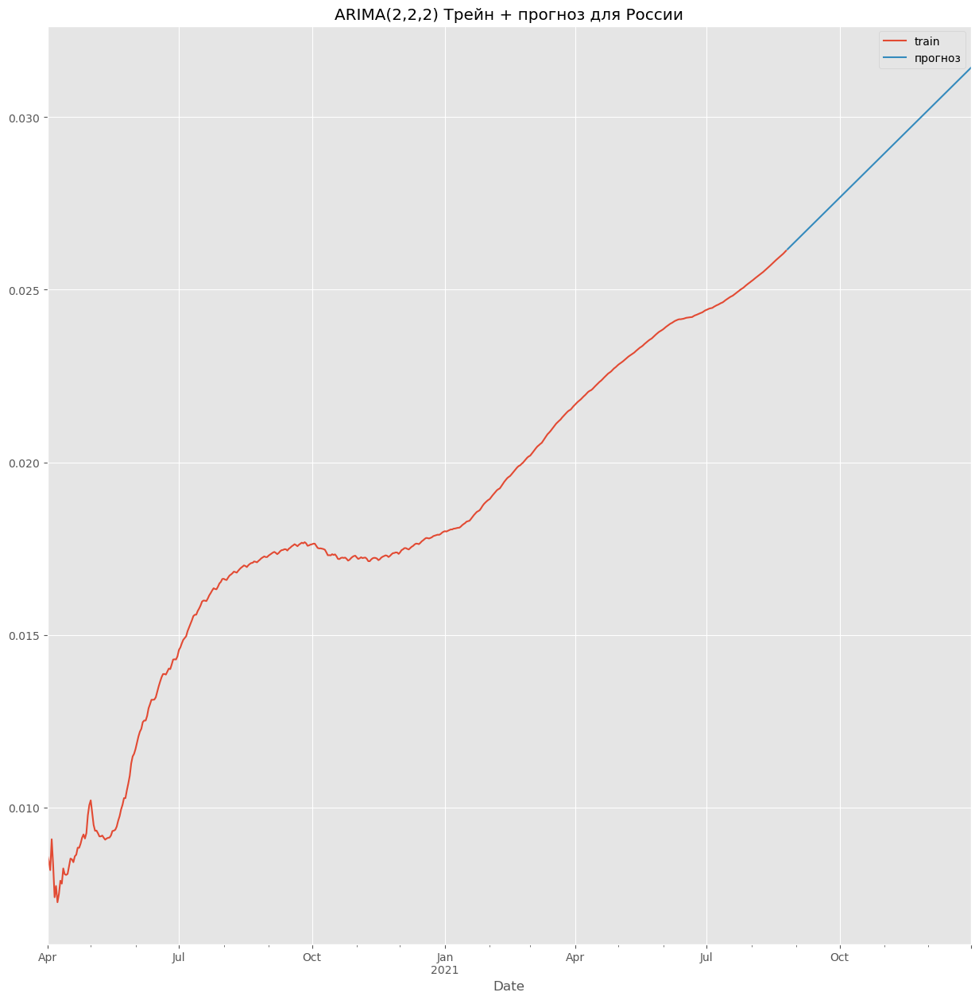

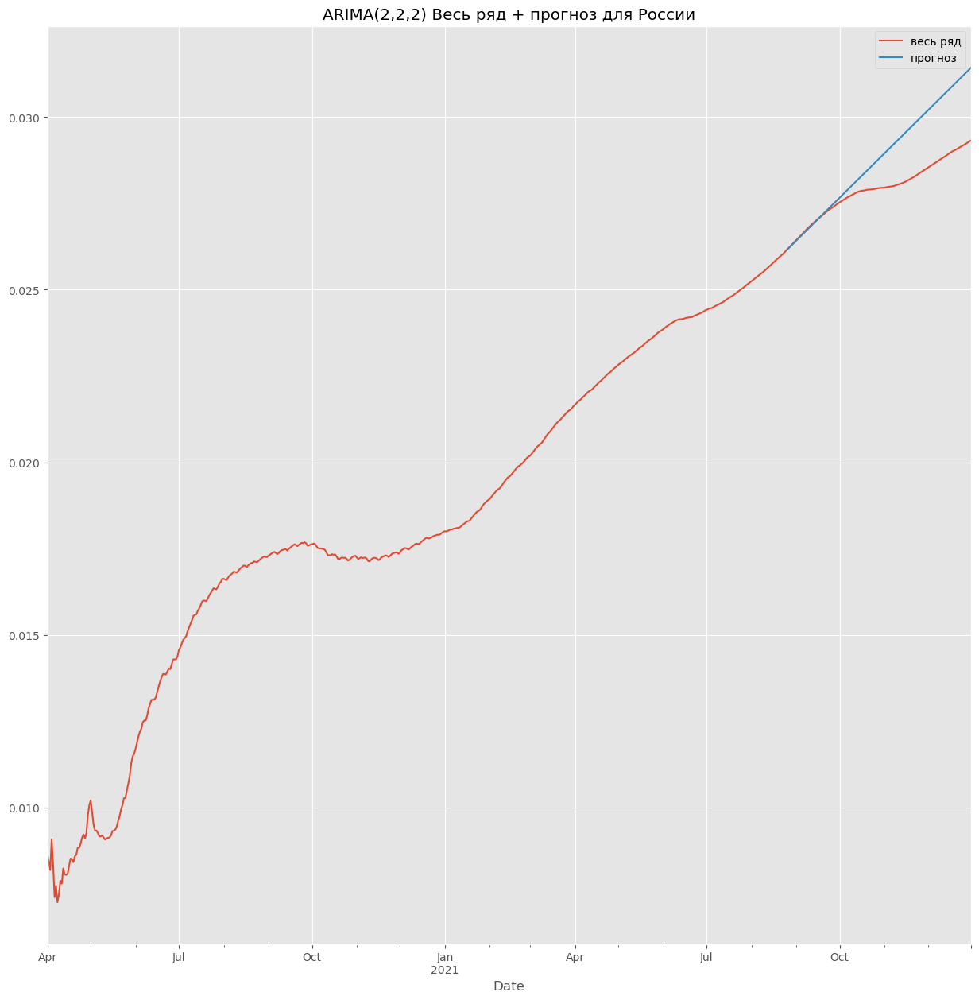

Russia ARIMA(2,2,2) RMSE = 0.00117


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


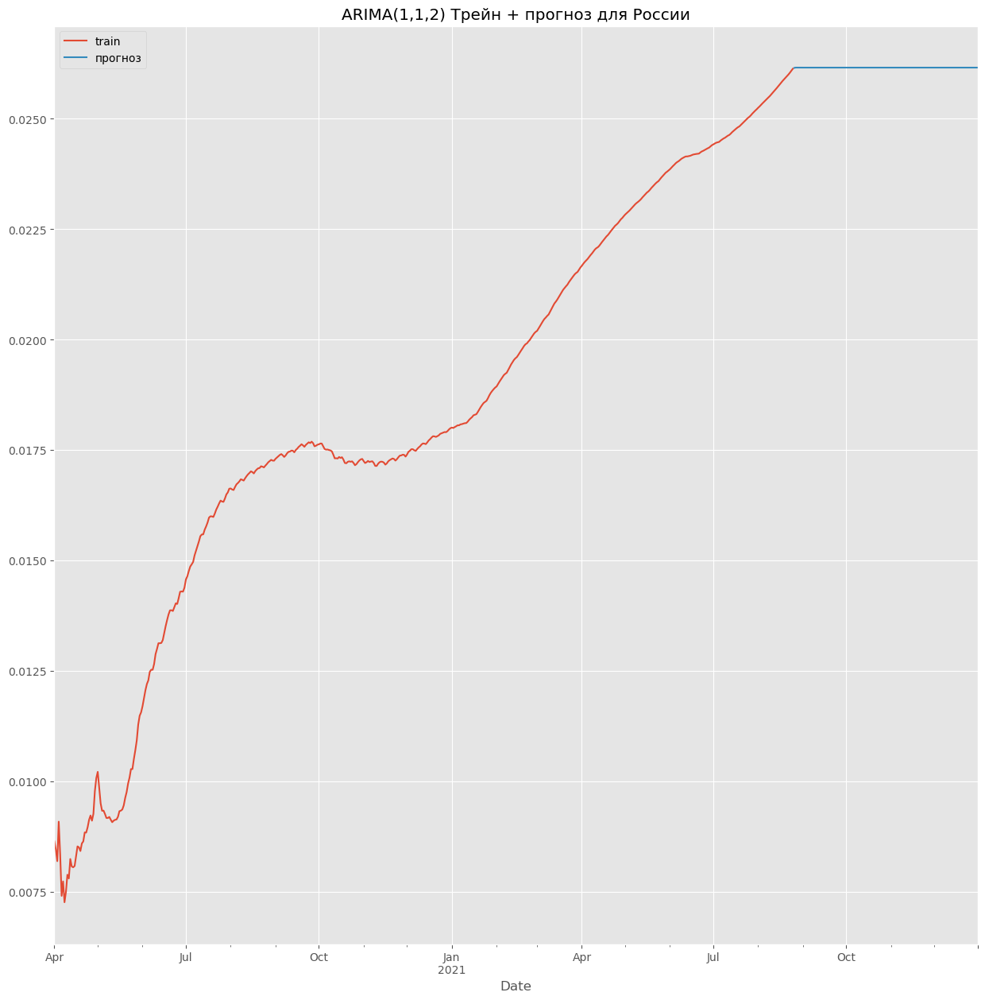

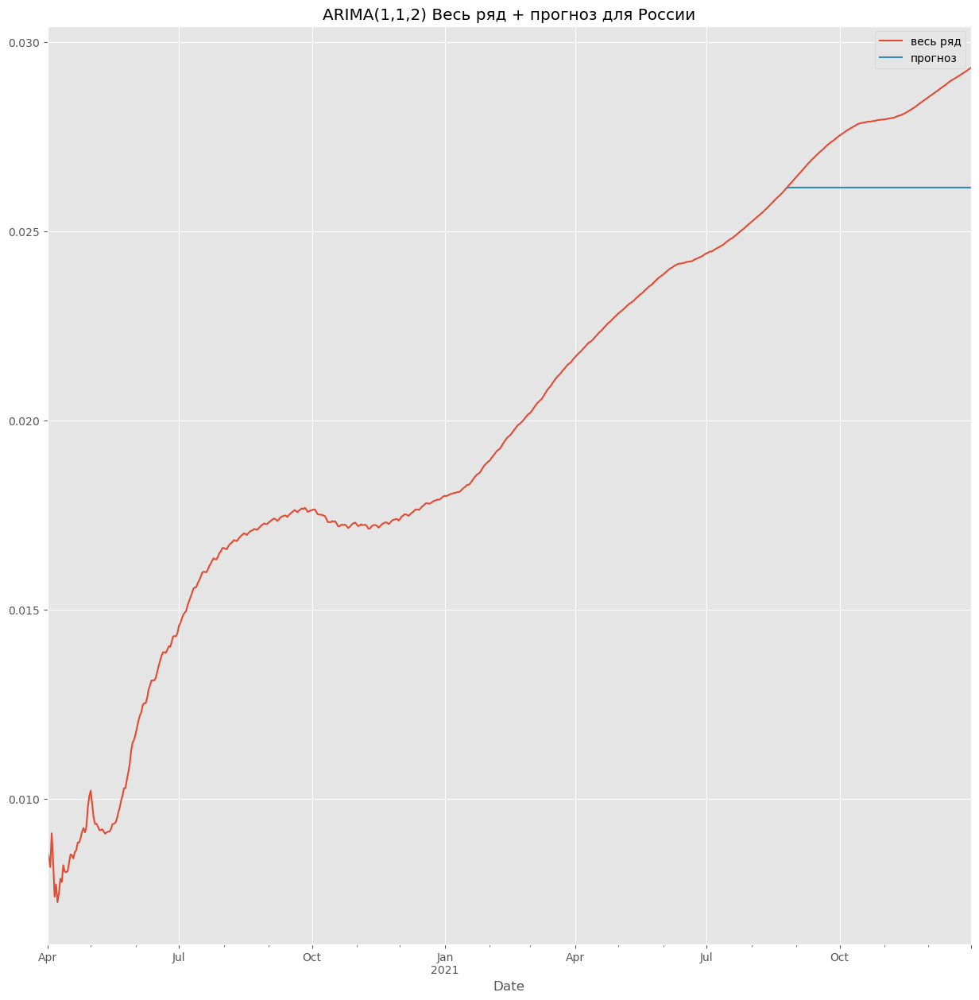

Russia ARIMA(1,1,2) RMSE = 0.00192


In [135]:
for p, d, q in [(1, 1, 1), (2, 1, 1), (2, 1, 2), (2, 2, 2), [1, 1, 2]]:
    model = ARIMA(train['Russia'], order=(p, d, q)).fit()
    forecast = pd.Series(model.get_forecast(len(test['Russia'])).predicted_mean.values, index=test['Russia'].index)

    train['Russia'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARIMA({p},{d},{q}) Трейн + прогноз для России')
    plt.show()

    cfr['Russia'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARIMA({p},{d},{q}) Весь ряд + прогноз для России')
    plt.show()

    rmse = RMSE(forecast, test['Russia'])
    results.loc[f'ARIMA({p},{d},{q})', 'Russia'] = rmse
    print(f'Russia ARIMA({p},{d},{q}) RMSE = {round(rmse, 5)}')

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


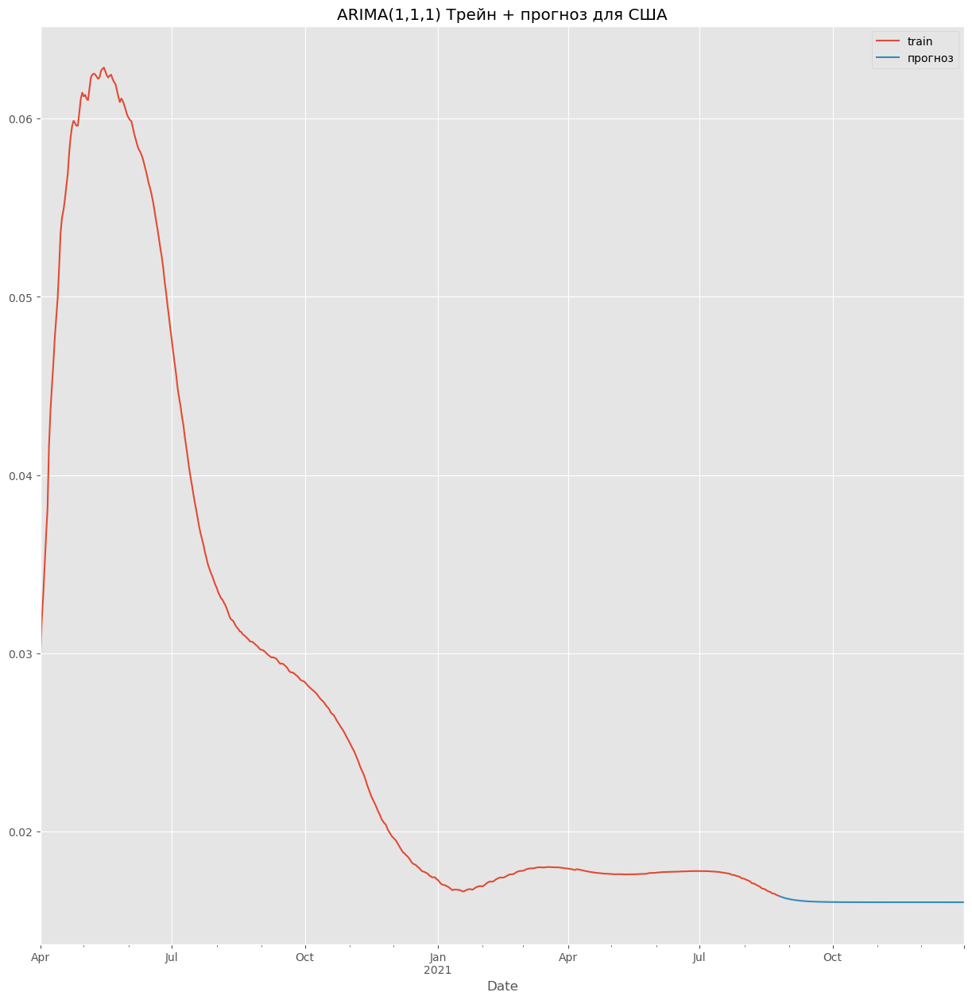

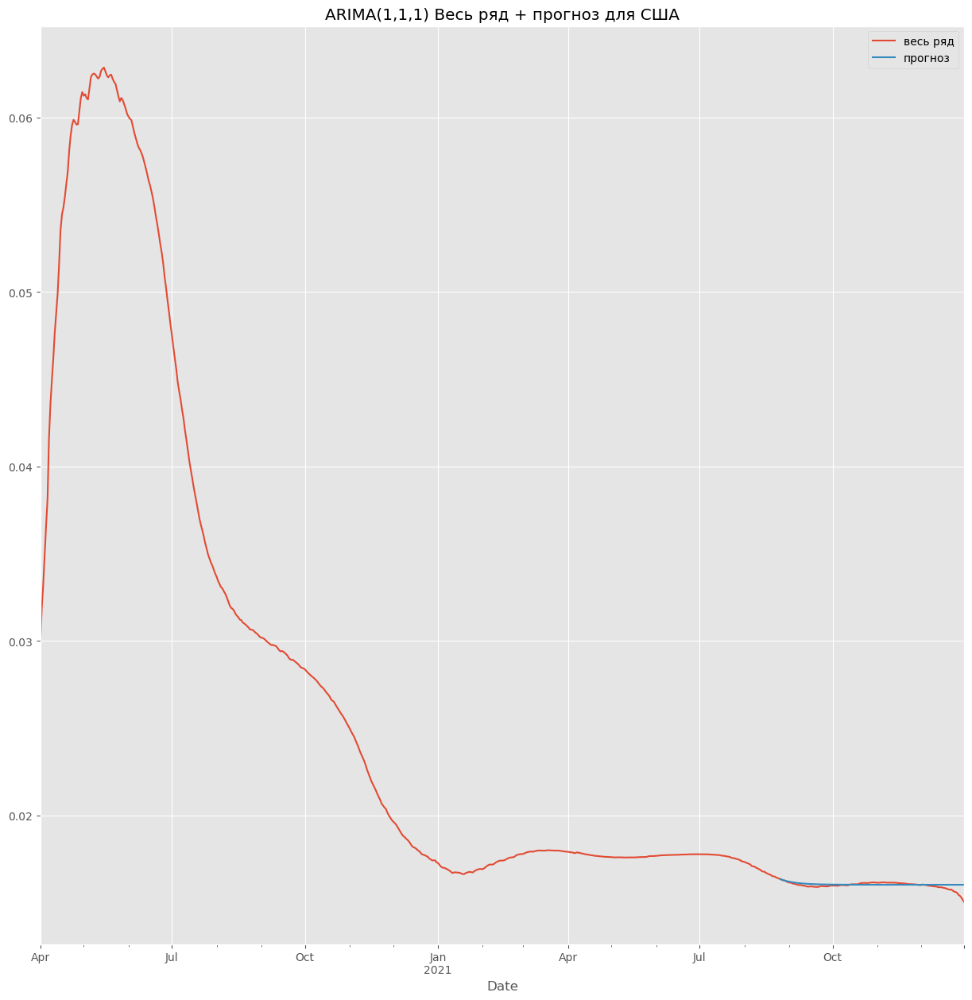

US ARIMA(1,1,1) RMSE = 0.0002


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


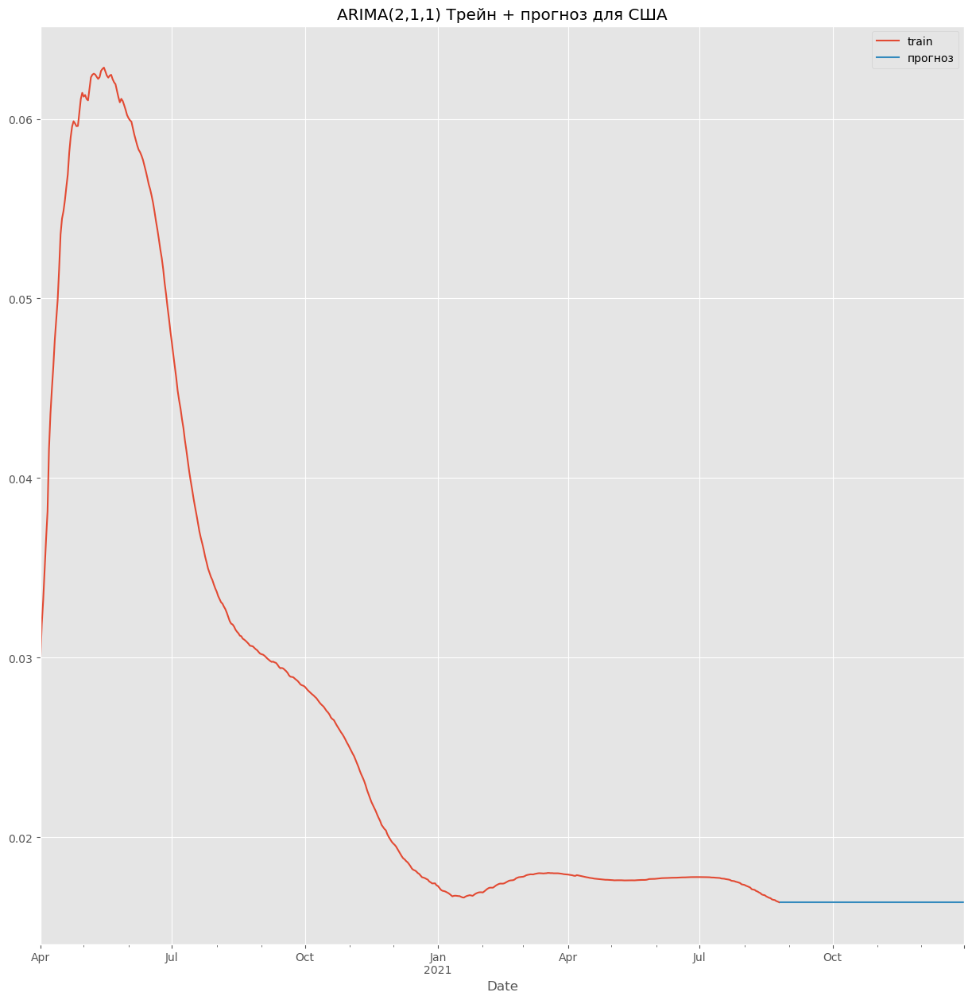

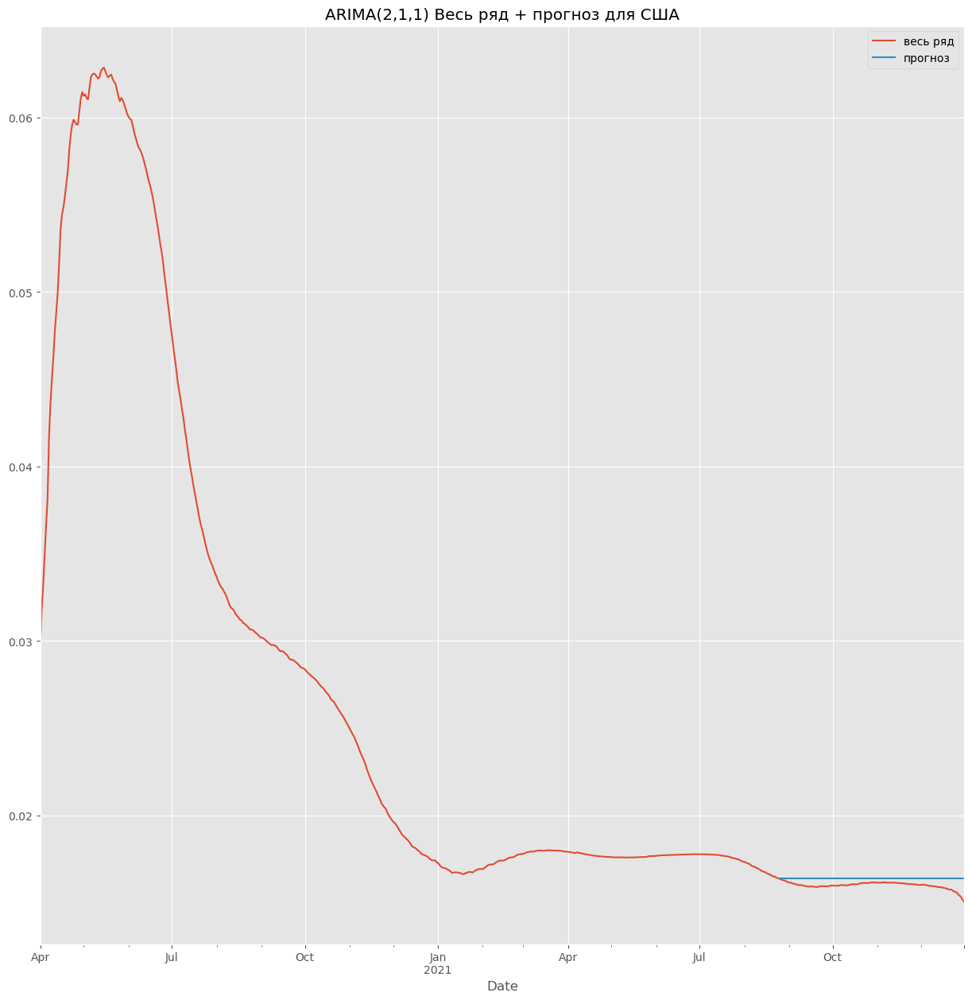

US ARIMA(2,1,1) RMSE = 0.00043


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


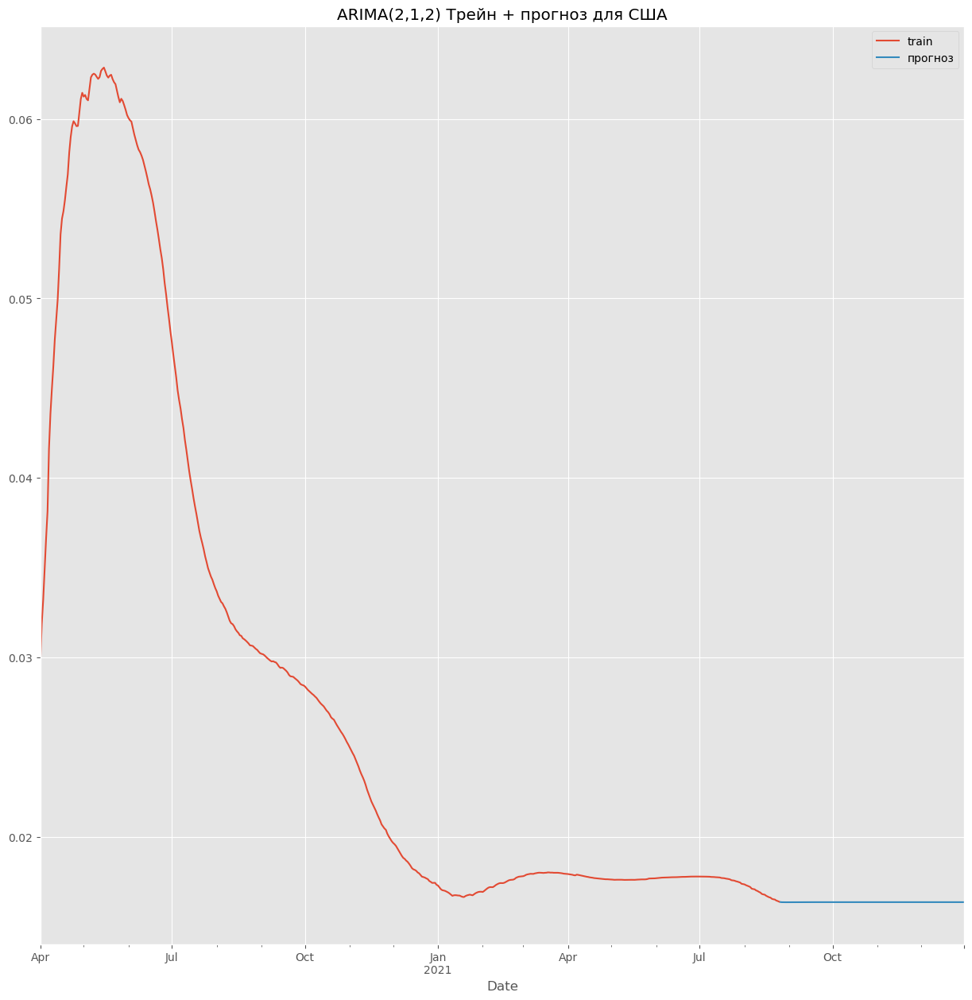

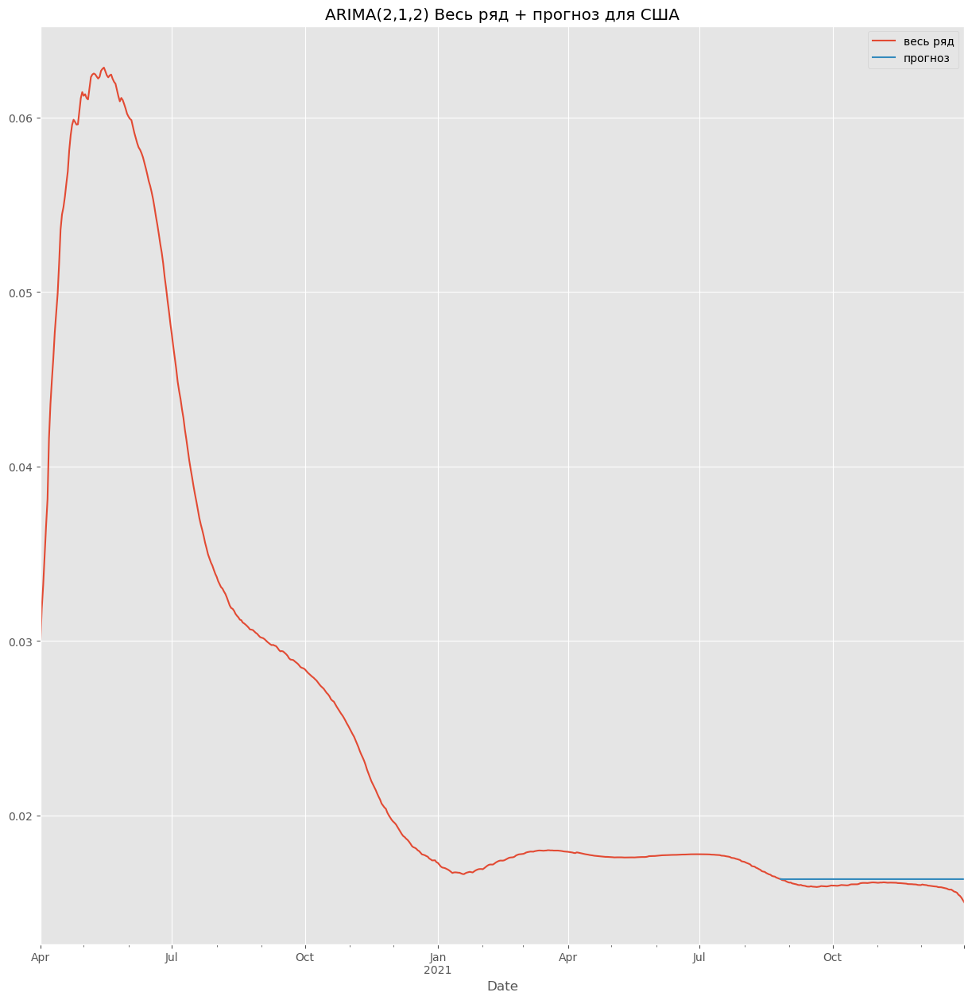

US ARIMA(2,1,2) RMSE = 0.00041


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


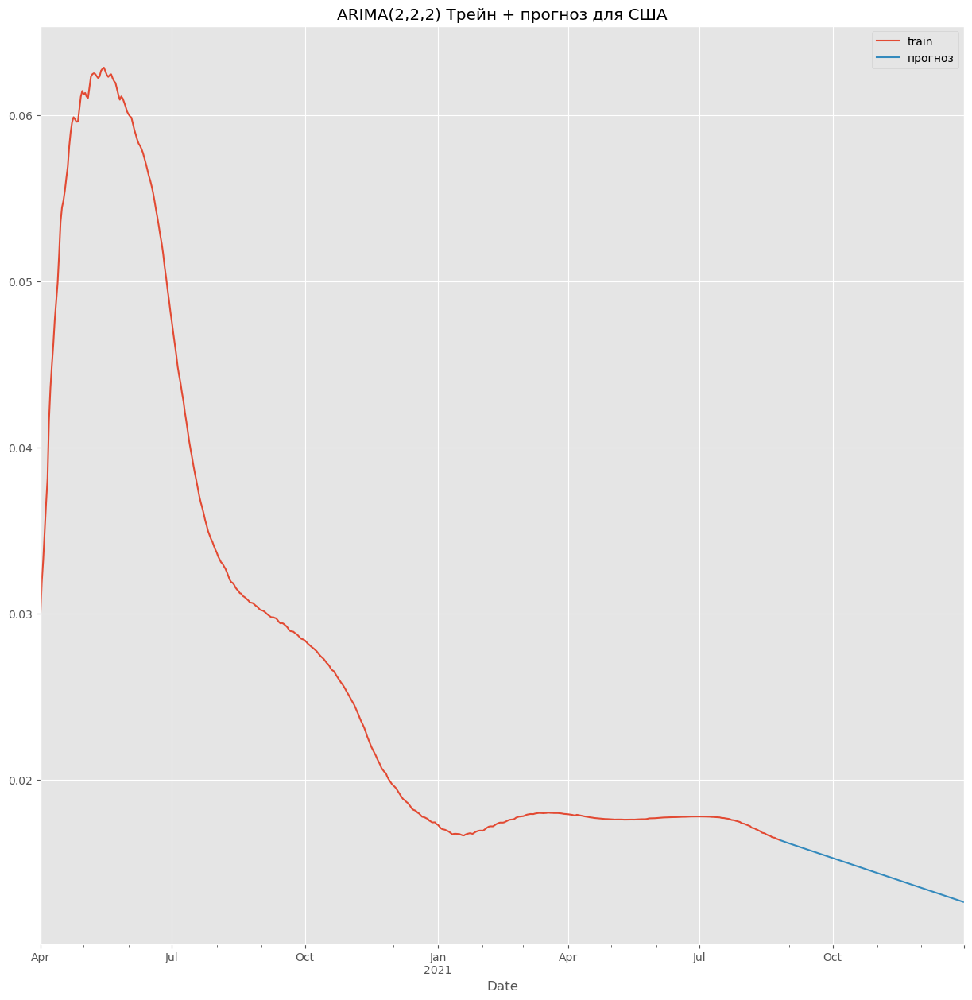

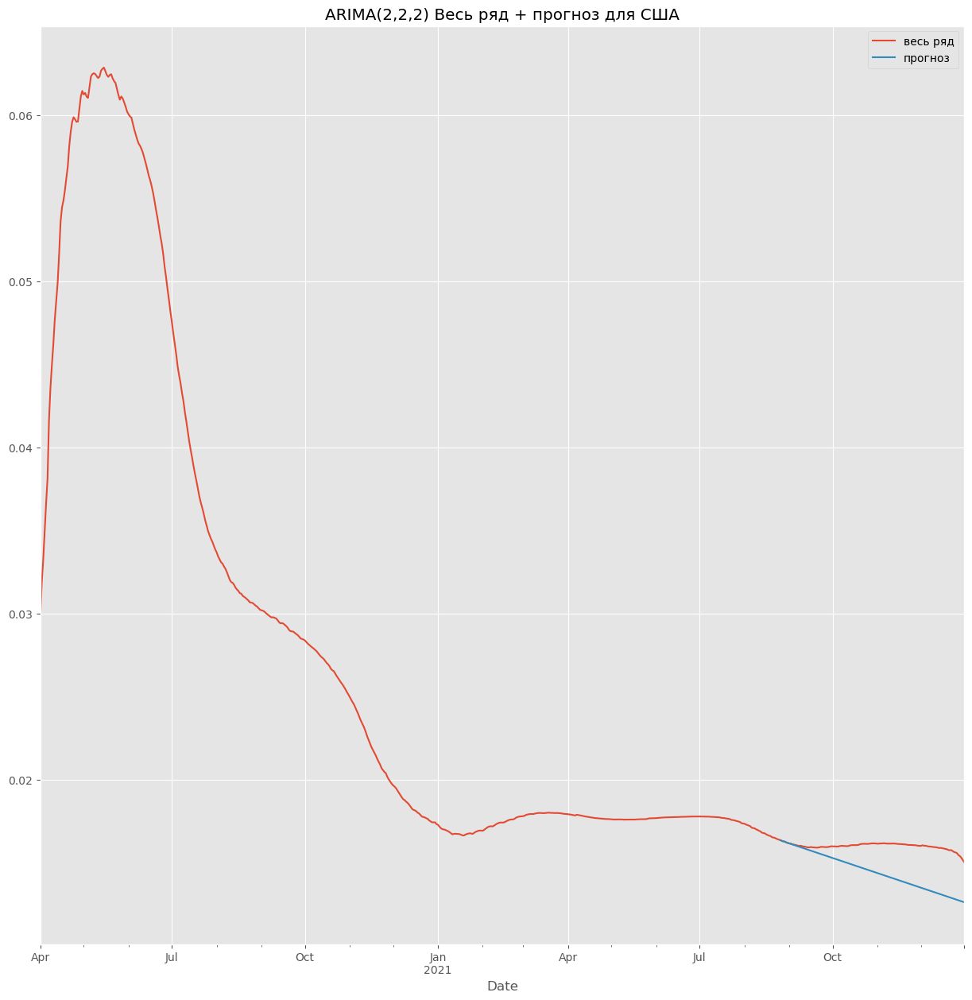

US ARIMA(2,2,2) RMSE = 0.00182


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


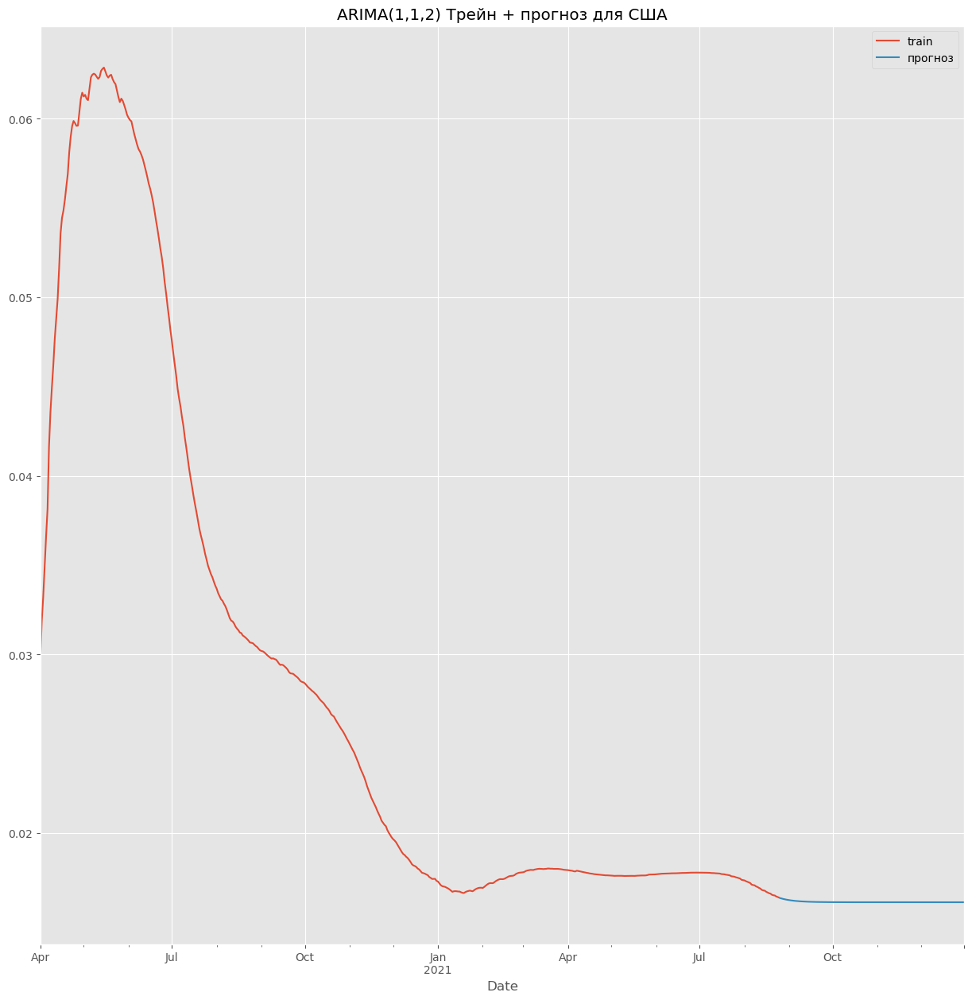

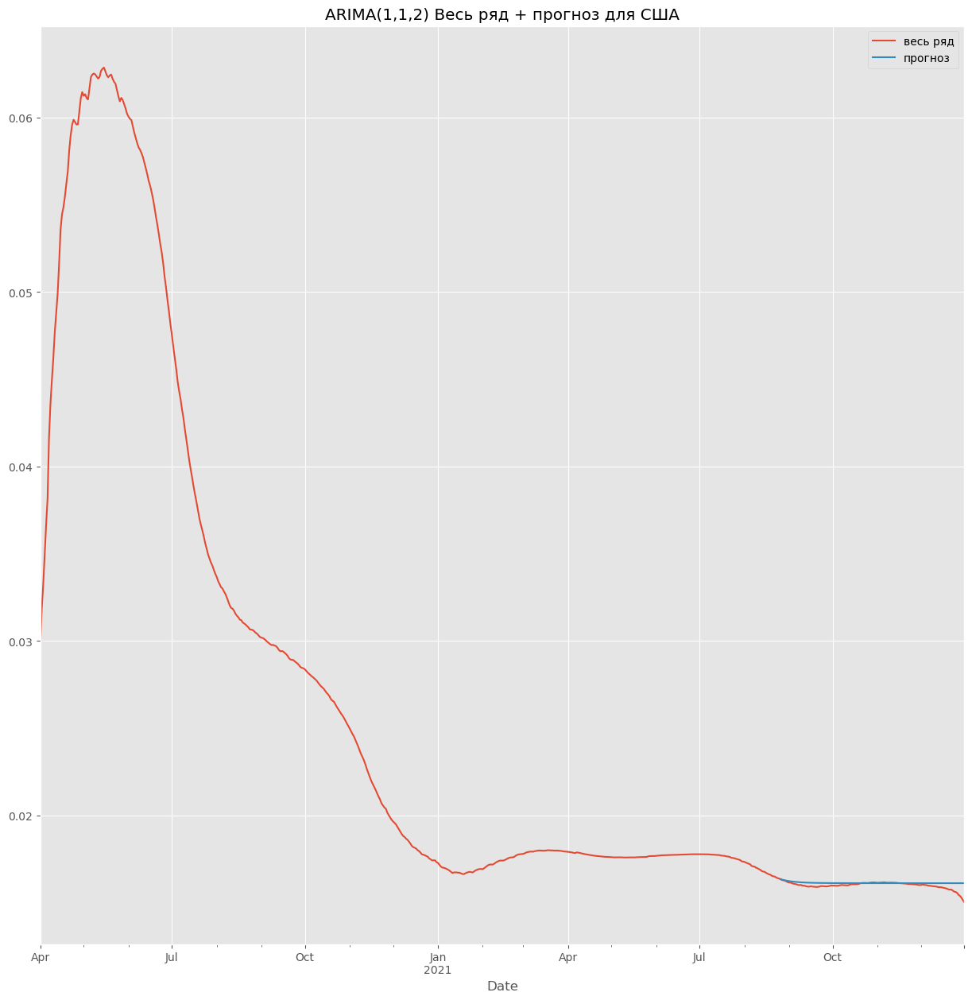

US ARIMA(1,1,2) RMSE = 0.00024


In [136]:
for p, d, q in [(1, 1, 1), (2, 1, 1), (2, 1, 2), (2, 2, 2), [1, 1, 2]]:
    model = ARIMA(train['US'], order=(p, d, q)).fit()
    forecast = pd.Series(model.get_forecast(len(test['US'])).predicted_mean.values, index=test['US'].index)

    train['US'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARIMA({p},{d},{q}) Трейн + прогноз для США')
    plt.show()

    cfr['US'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARIMA({p},{d},{q}) Весь ряд + прогноз для США')
    plt.show()

    rmse = RMSE(forecast, test['US'])
    results.loc[f'ARIMA({p},{d},{q})', 'US'] = rmse
    print(f'US ARIMA({p},{d},{q}) RMSE = {round(rmse, 5)}')

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


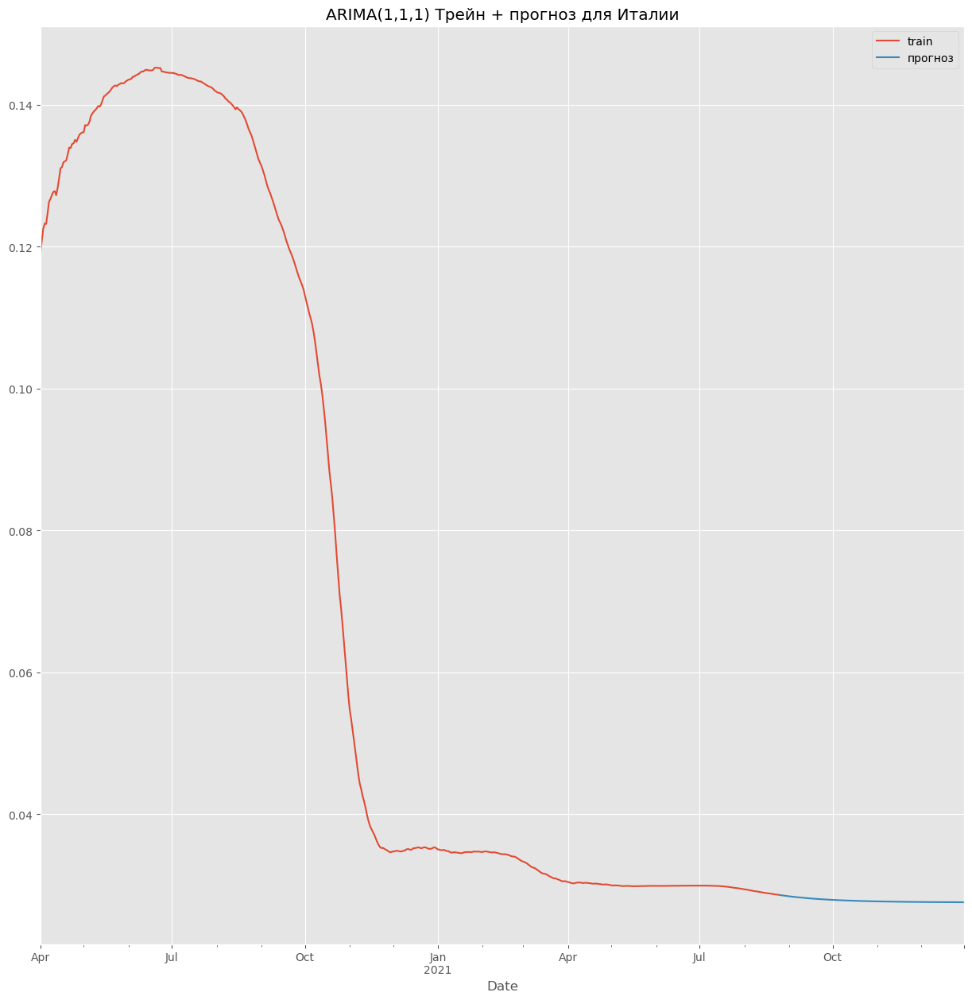

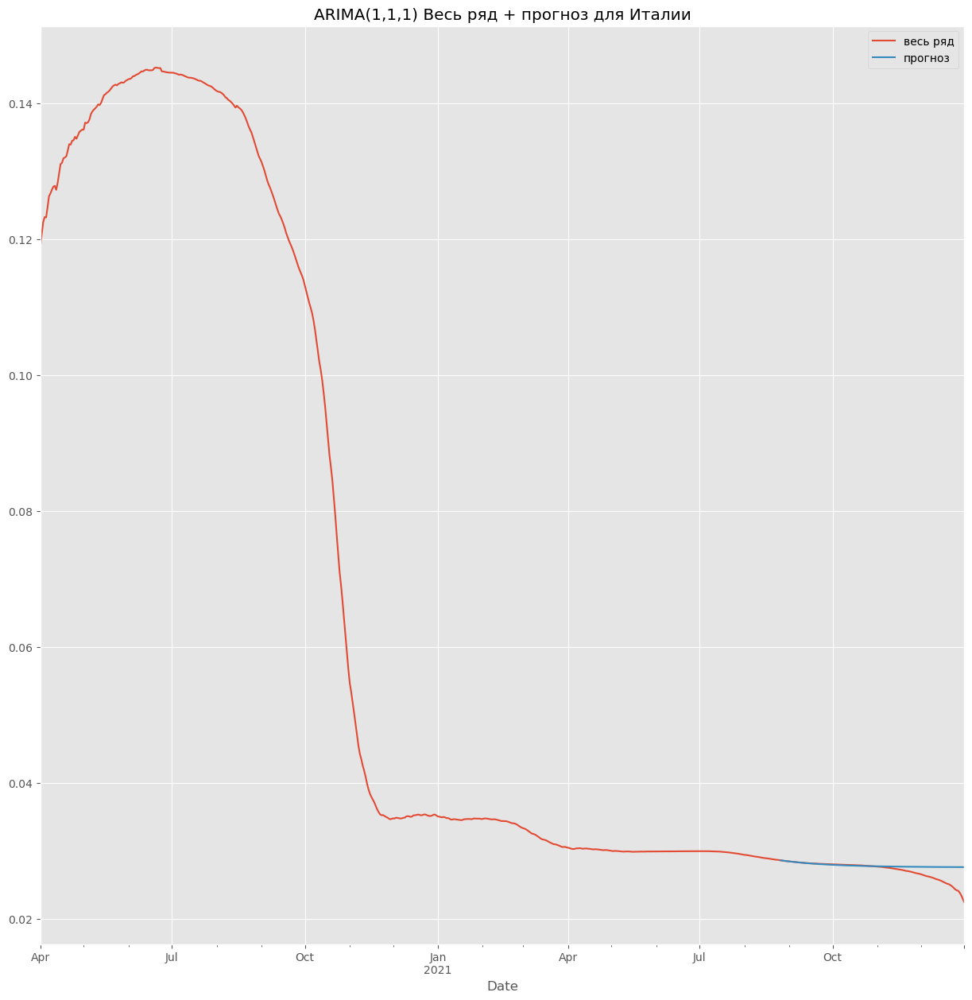

Italy ARIMA(1,1,1) RMSE = 0.00131


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


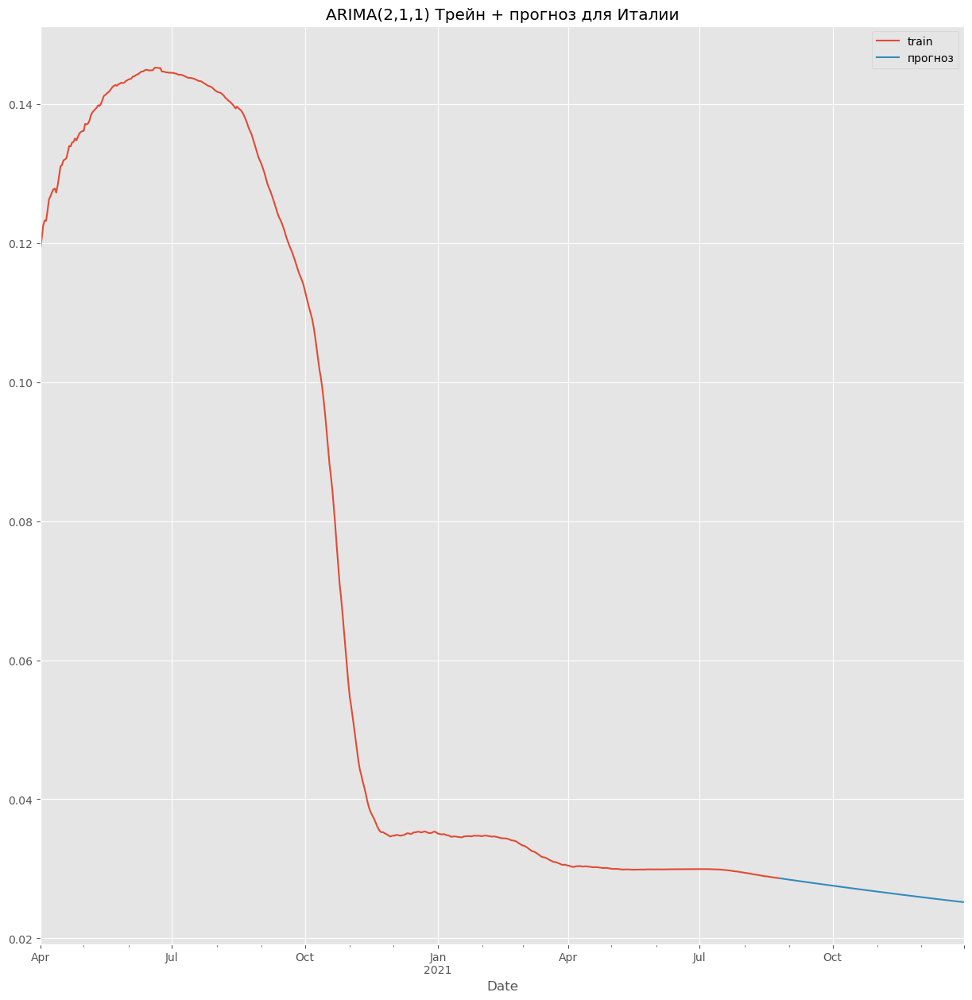

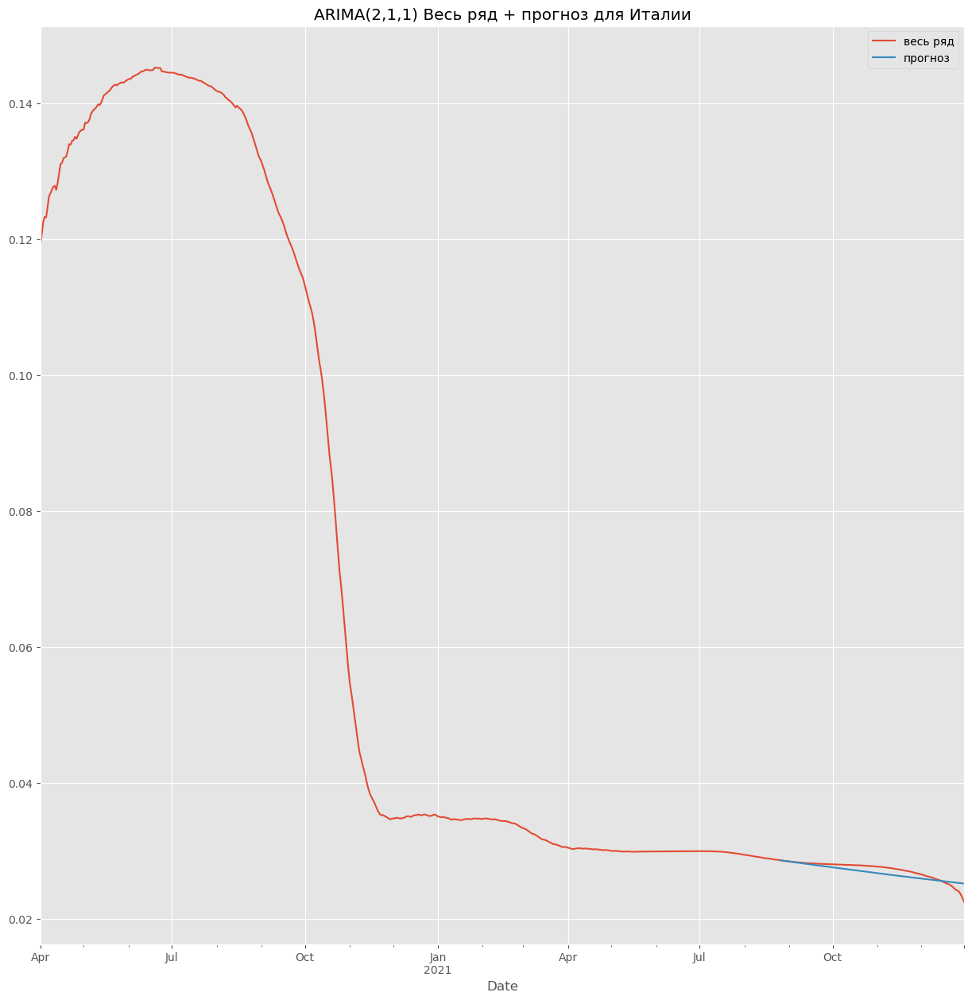

Italy ARIMA(2,1,1) RMSE = 0.00074


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


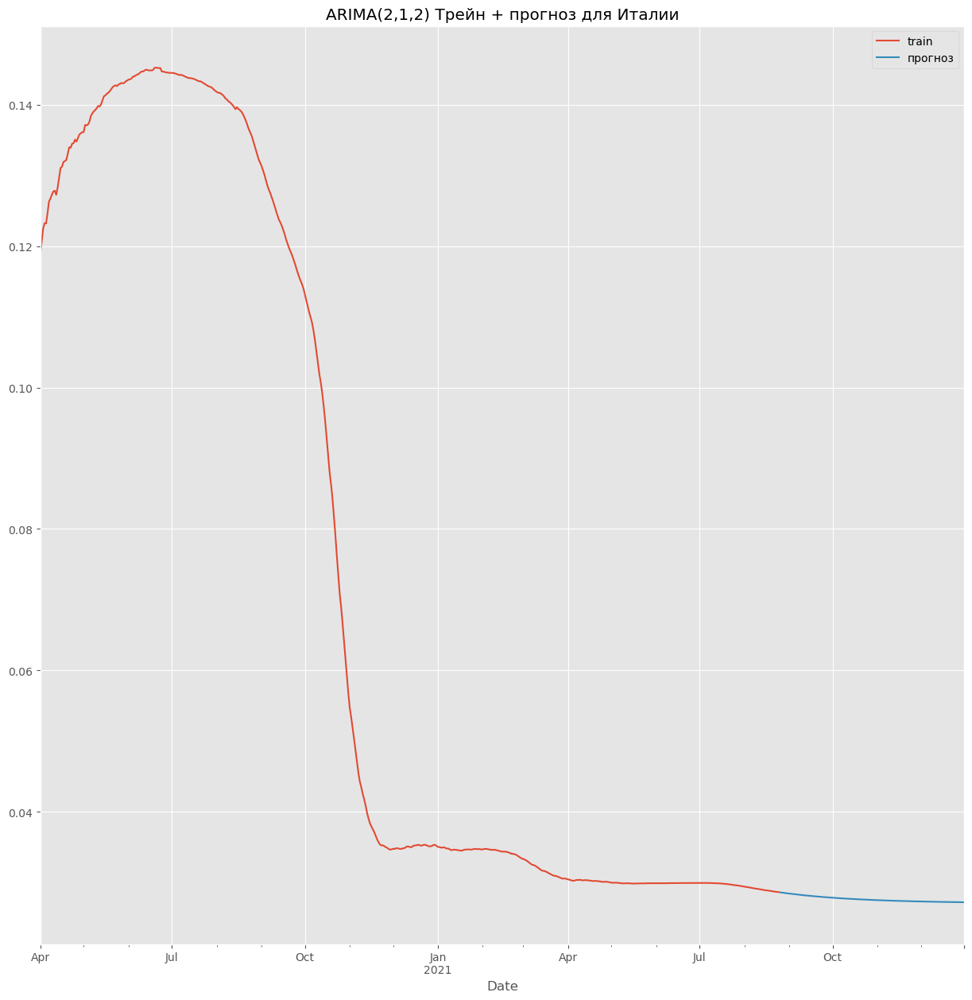

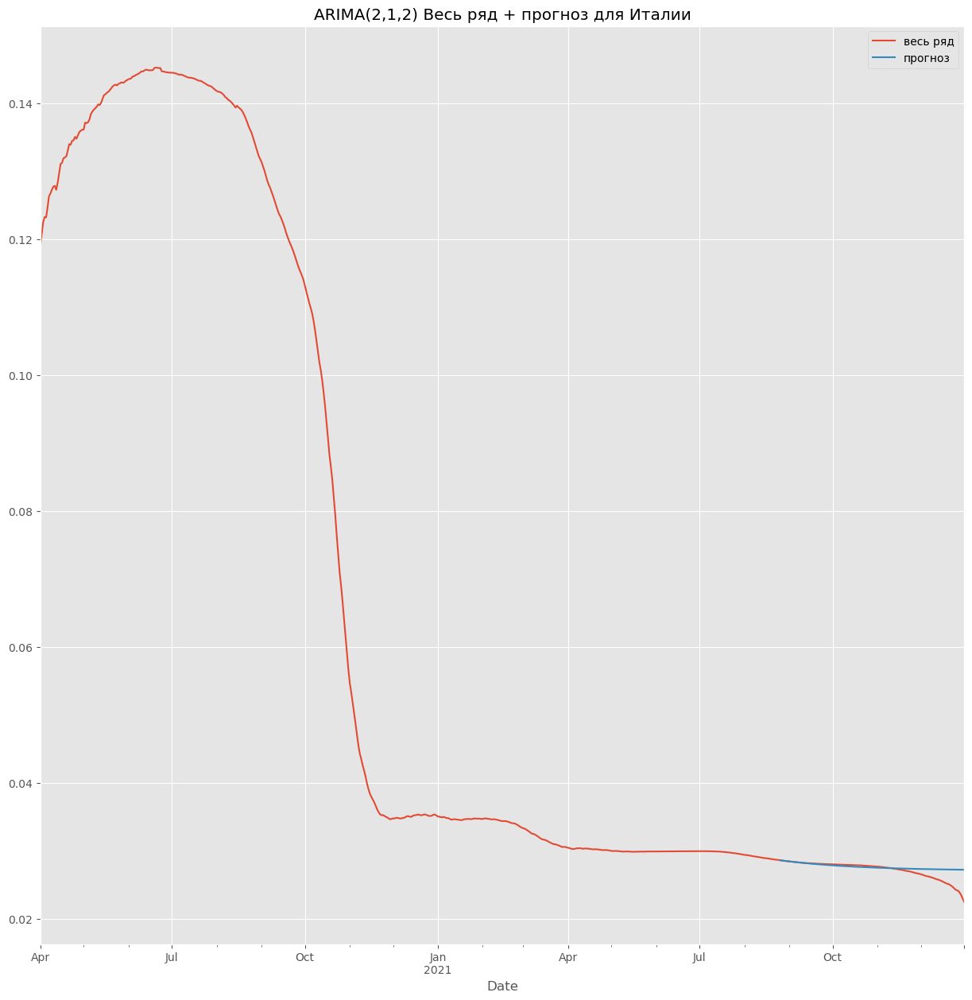

Italy ARIMA(2,1,2) RMSE = 0.00114


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


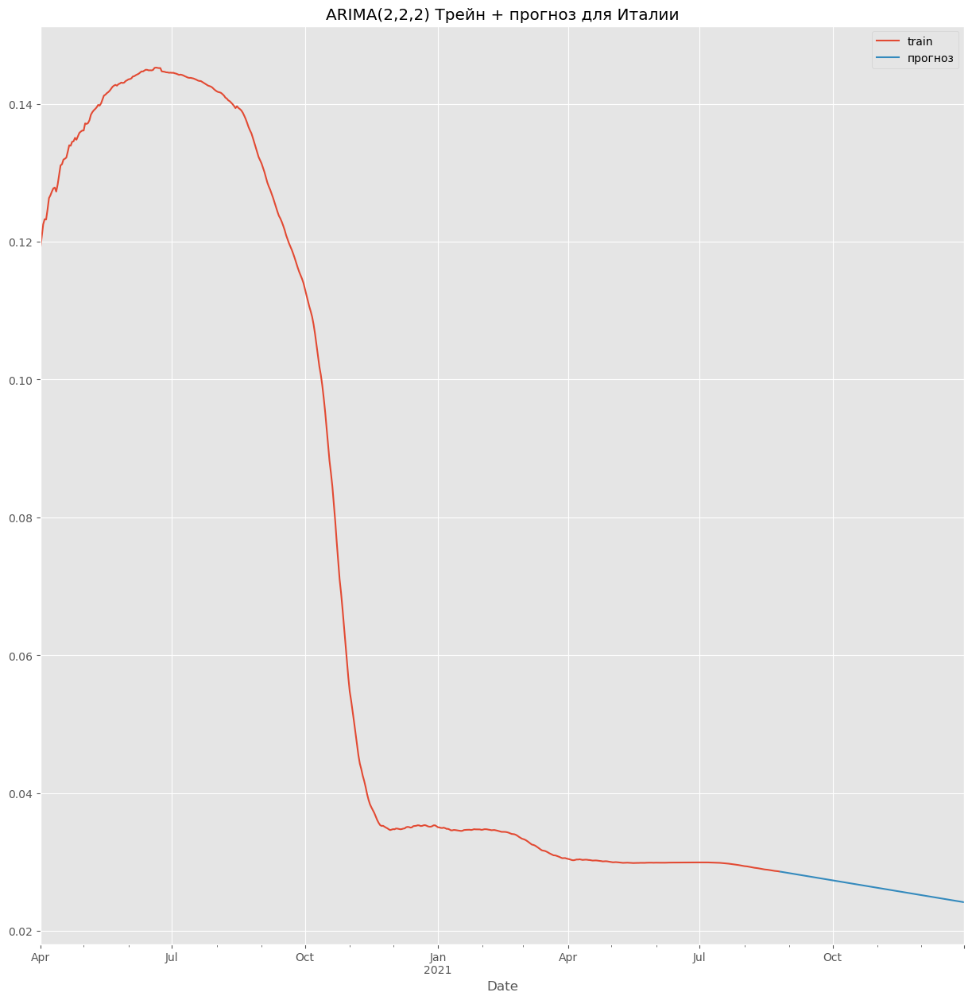

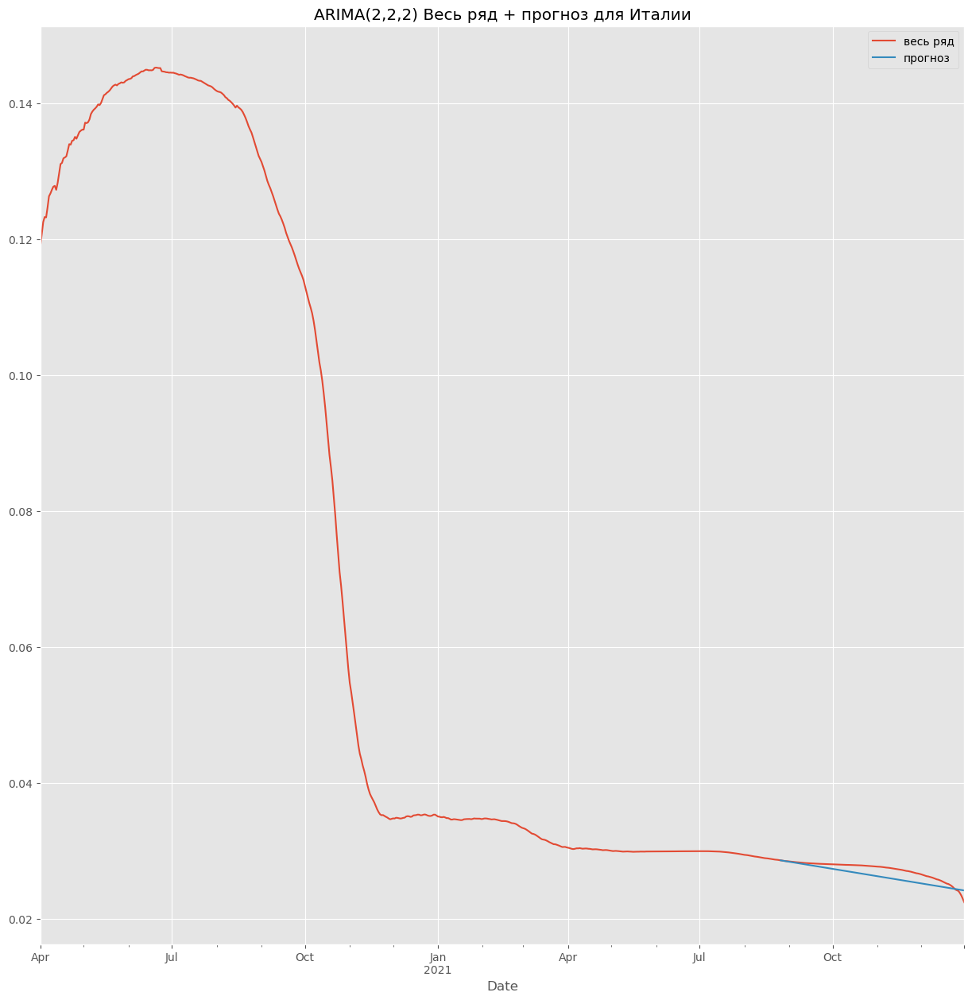

Italy ARIMA(2,2,2) RMSE = 0.00102


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


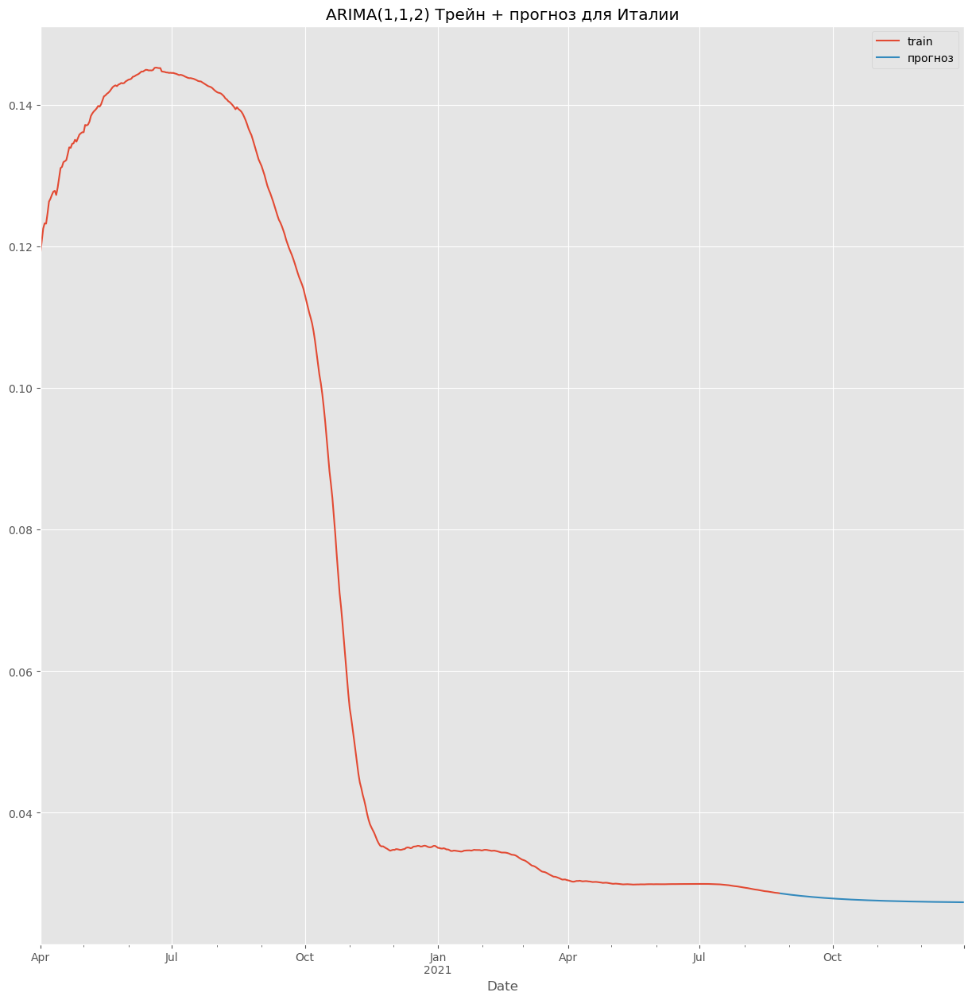

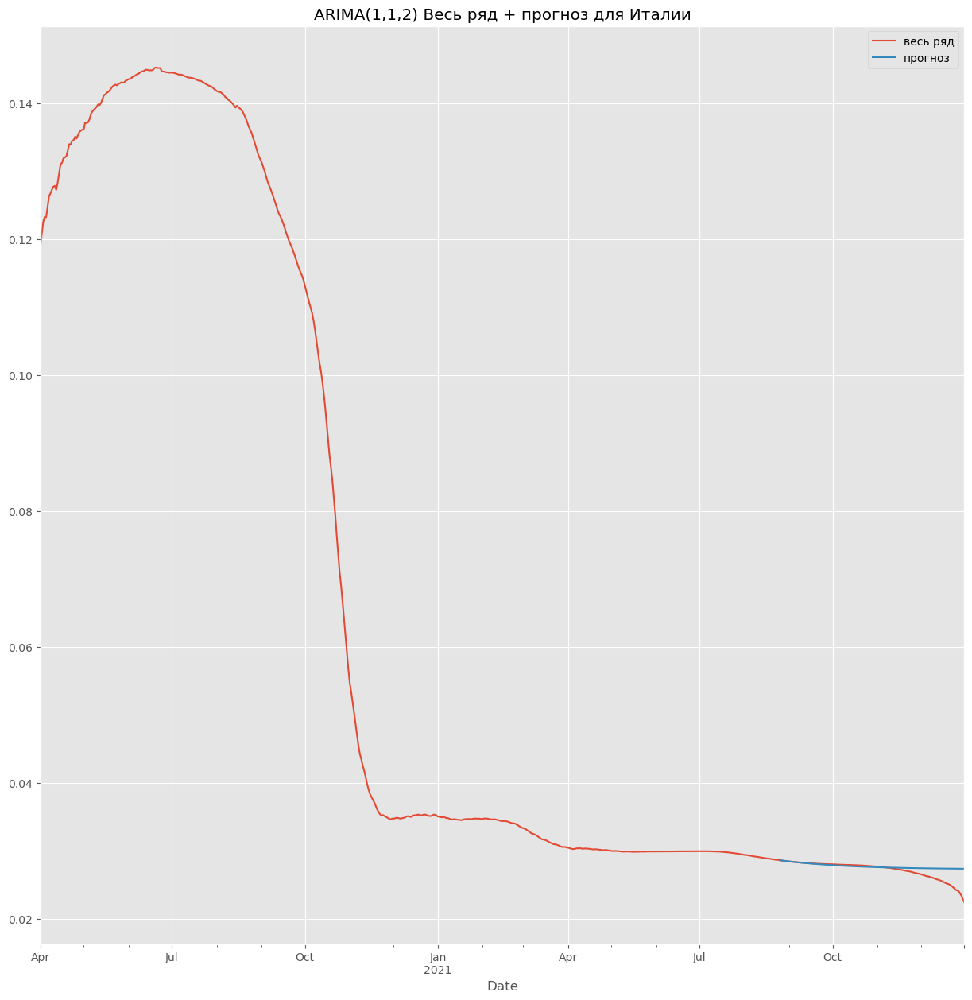

Italy ARIMA(1,1,2) RMSE = 0.0012


In [142]:
for p, d, q in [(1, 1, 1), (2, 1, 1), (2, 1, 2), (2, 2, 2), (1, 1, 2)]:
    model = ARIMA(train['Italy'], order=(p, d, q)).fit()
    forecast = pd.Series(model.get_forecast(len(test['Italy'])).predicted_mean.values, index=test['Italy'].index)

    train['Italy'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARIMA({p},{d},{q}) Трейн + прогноз для Италии')
    plt.show()

    cfr['Italy'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'ARIMA({p},{d},{q}) Весь ряд + прогноз для Италии')
    plt.show()
    
    rmse = RMSE(forecast, test['Italy'])
    results.loc[f'ARIMA({p},{d},{q})', 'Italy'] = rmse
    print(f'Italy ARIMA({p},{d},{q}) RMSE = {round(rmse, 5)}')

Вообще до этого в пункте 2.2 мы все посмотрели, что одной разности должно быть достаточно, но качество для ряда Россия получилось лучше для 2 разностей, а вот для Италии и США как раз при одной разности:

- Russia ARIMA(2,2,2) RMSE = 0.00117
- Italy ARIMA(2,1,1) RMSE = 0.00074
- US ARIMA(1,1,1) RMSE = 0.0002

Вообще насколько я знаю, две разности это крайняя необходимость вообще обычно 1 должно быть лучше и этого должно хватать и для 2/3 рядов как раз 1 было достаточно. Наверное, если говорить про универсальность то лучше брать 1, так как 2 разности могут усиливать шум и делать прогноз неустойчивым на длинном горизонте

#### 3.7. SARIMA (Seasonal Auto Regressive Integrated Moving Average) (5 баллов и 5 бонусных баллов)

Постройте предсказание, модернизировав модель ARIMA и добавив сезонную составляющую. Обязательно поэкспериментируйте с гиперпараметрами модели (и опишите, что вы делаете).

Бонусные баллы за это задание выставляются как совокупность за все задания по классам SARIMA (3.3 — 3.7), в случае если ваши модели получились хорошие, точные и вы верно настроили гиперпараметры, тщательно описав ваши действия.

*Примечание. Вы можете также почитать про Алгоритм Хиндмана-Хандакара для настройки SARIMA. Возможно, он сможет вам помочь и улучшить качество моделей*

Тут уже добавляется сезонность, а мы ее видели как раз для ряда США, когда строили ADF/PACF графики и там как раз виднелась сезонность на лагах 7,14 и 21. Здесь я взял 3 лучших случаев гиперпараметров для рядов, которые я получил для ARIMA и в основном пробовал перебирать сезонные гиперпараметры, то есть которые уже отвечаеют за сезонную компоненту, они в целом схожи с ARIMA, только тут надо обозначить лаг в 7 дней и уже P, D, Q для сезонного шага. То есть например P будет обозначать авторегрессию неделю назад.

In [143]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [145]:
all_orders = [((1, 1, 1), (1, 0, 1, 7)), ((2, 1, 1), (0, 1, 1, 7)),
              ((2, 2, 2),(0, 0, 1, 7)), ((2, 2, 2), (1, 0, 1, 7)), 
             ((2, 2, 2), (1, 1, 1, 7)), ((1, 1, 1), (1, 1, 1, 7))]

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


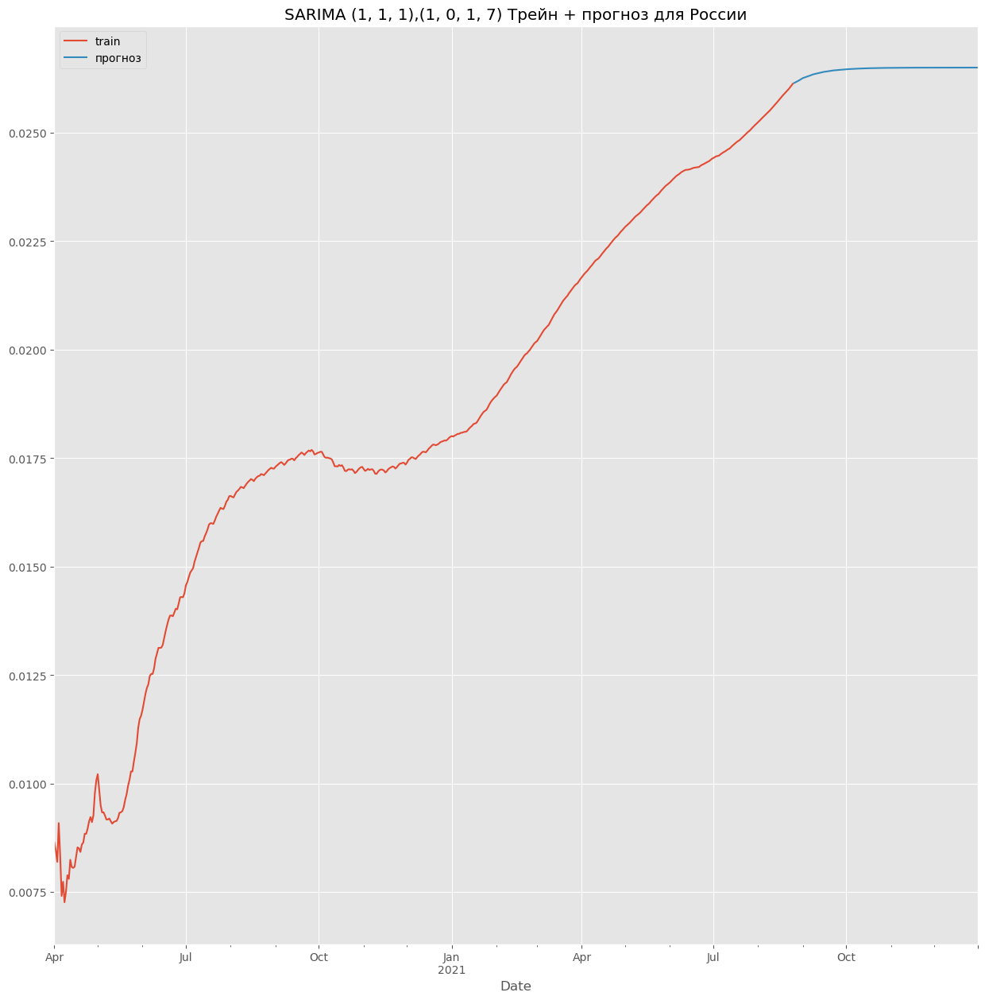

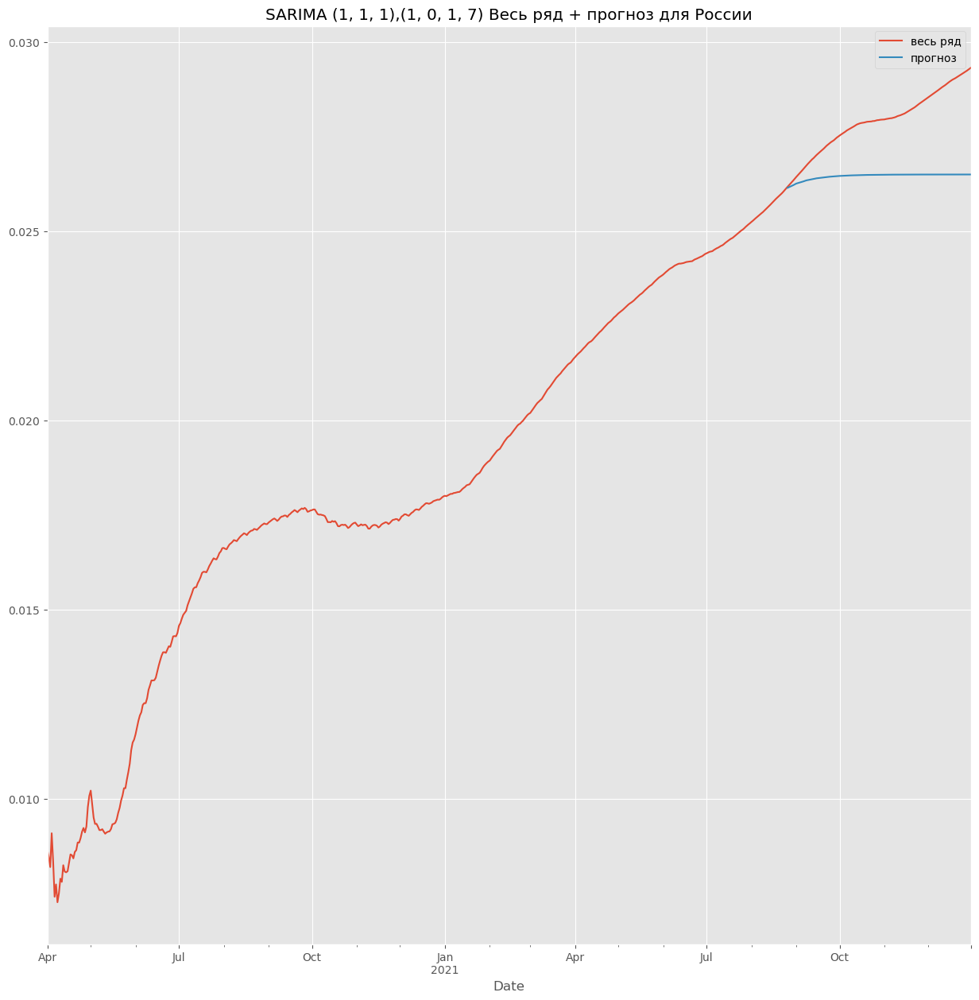

Russia SARIMA (1, 1, 1),(1, 0, 1, 7) RMSE = 0.00163


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


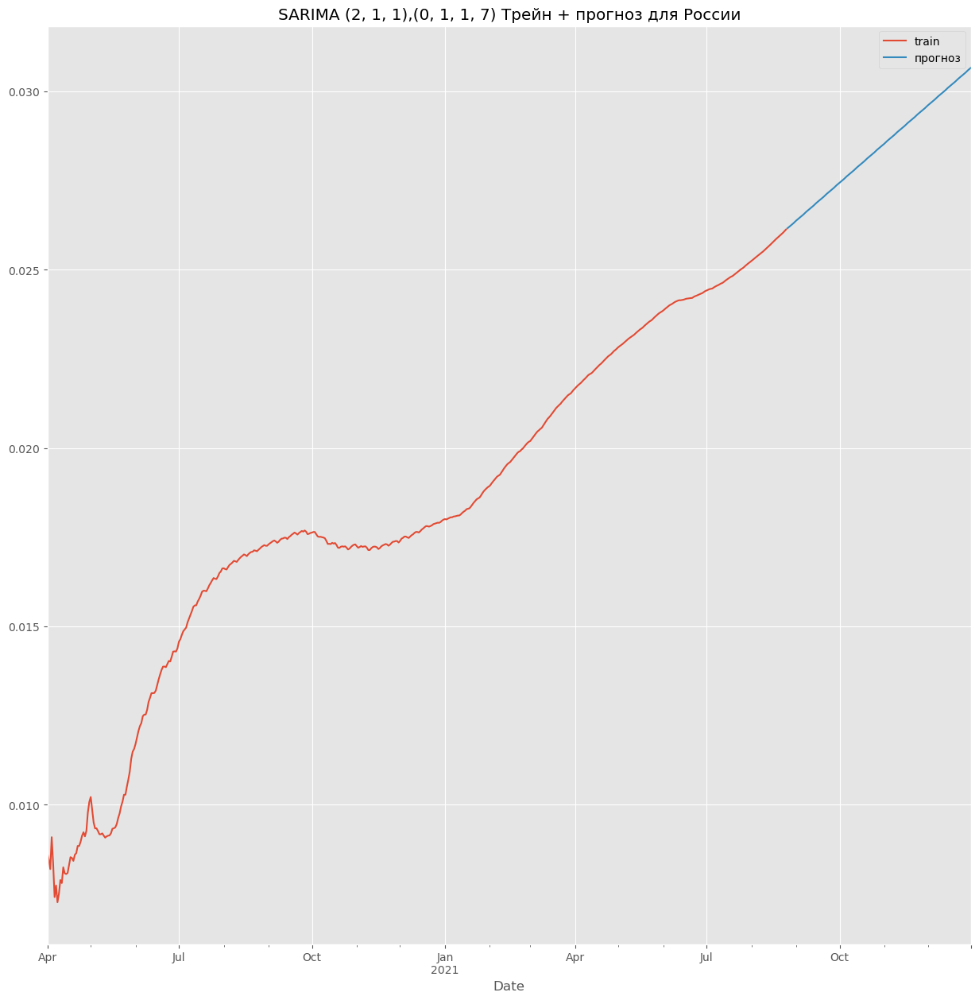

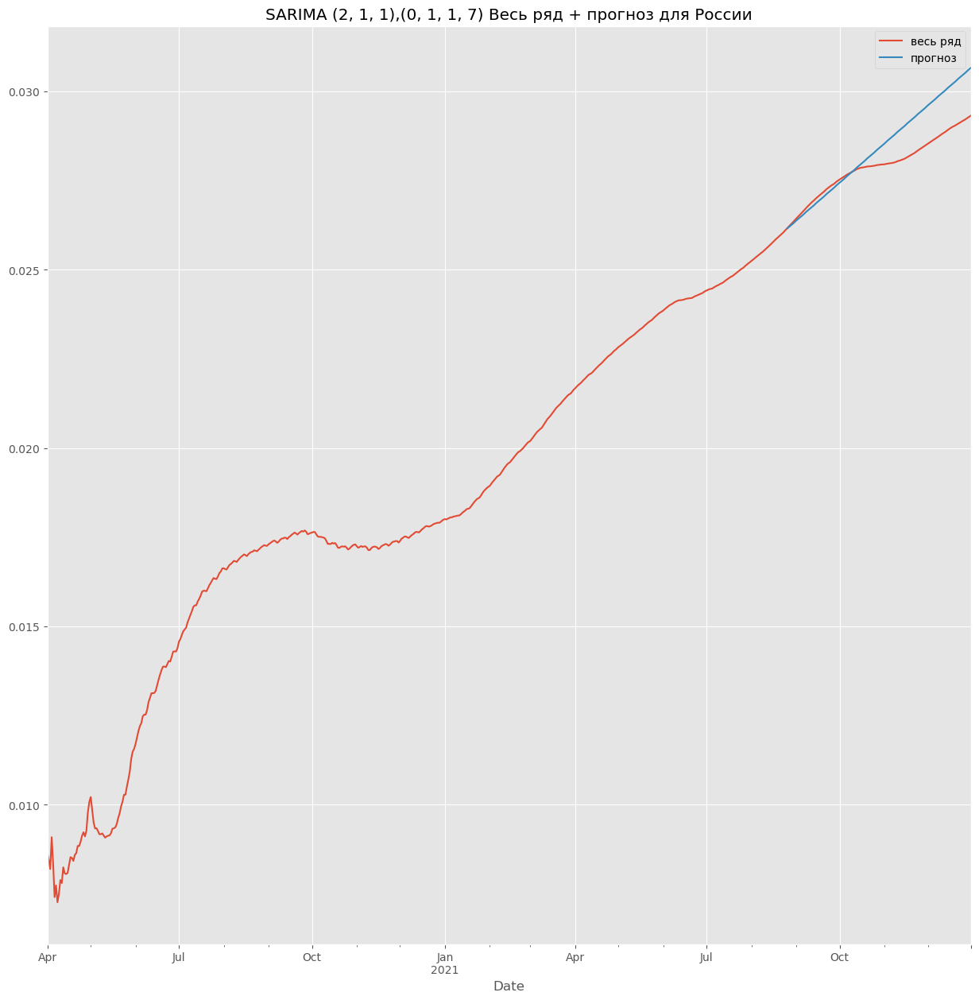

Russia SARIMA (2, 1, 1),(0, 1, 1, 7) RMSE = 0.00075


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


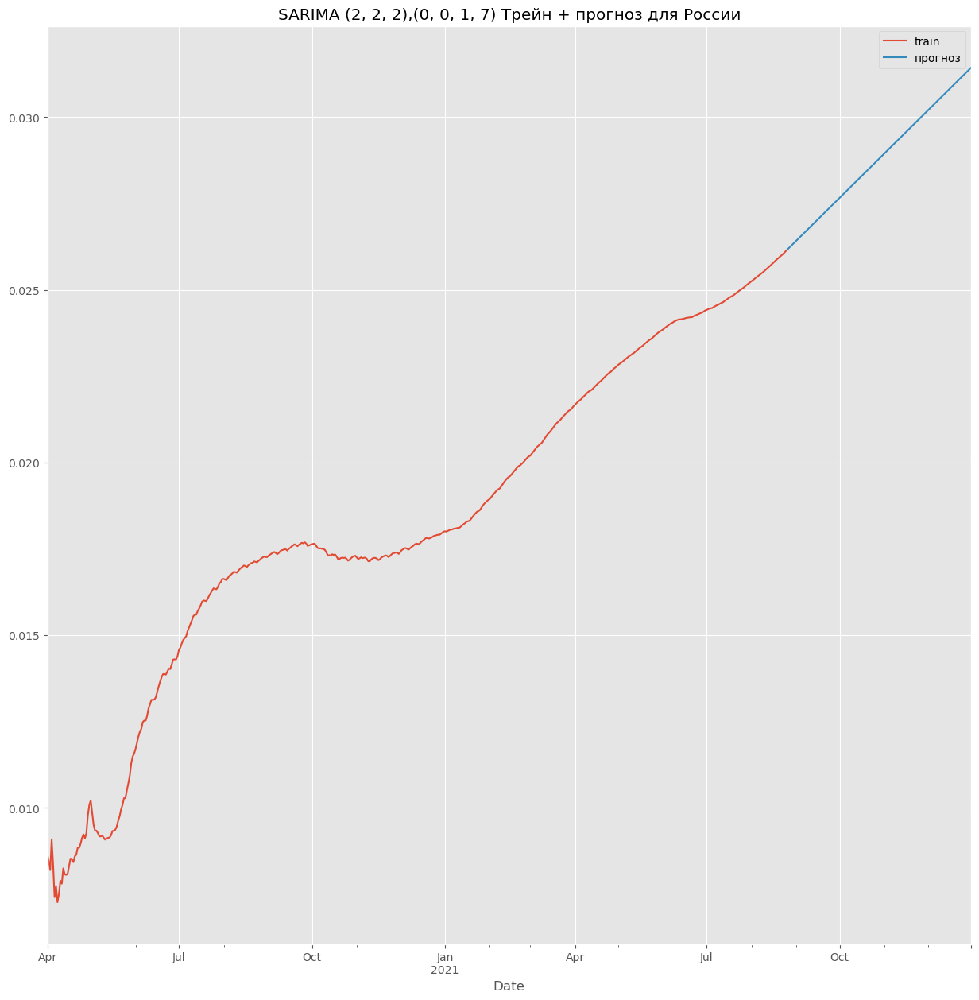

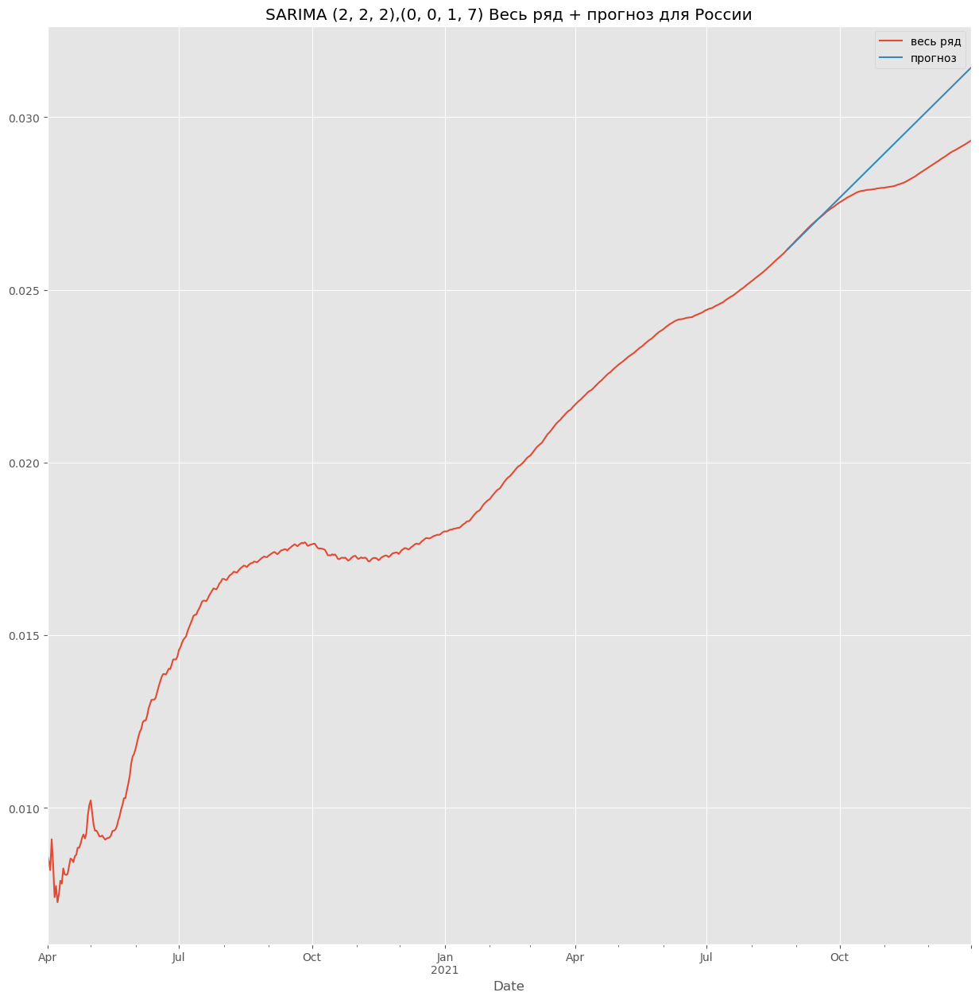

Russia SARIMA (2, 2, 2),(0, 0, 1, 7) RMSE = 0.00118


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


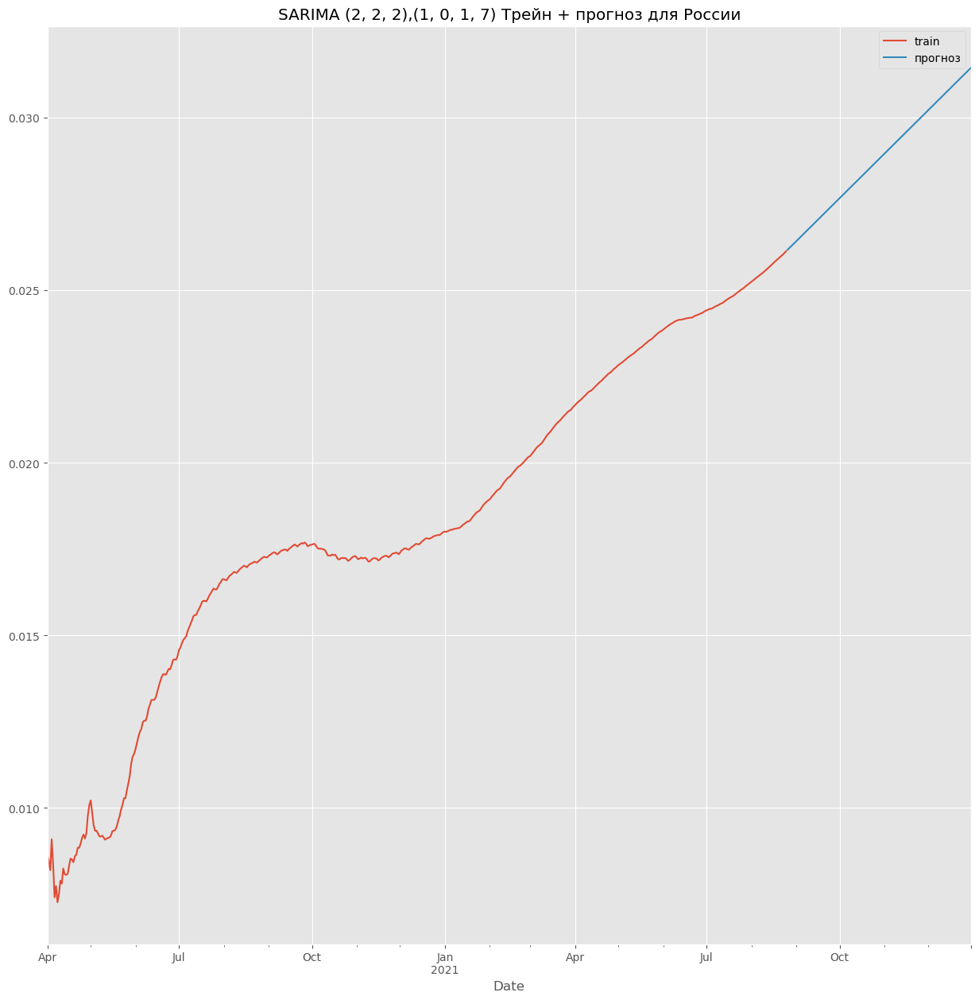

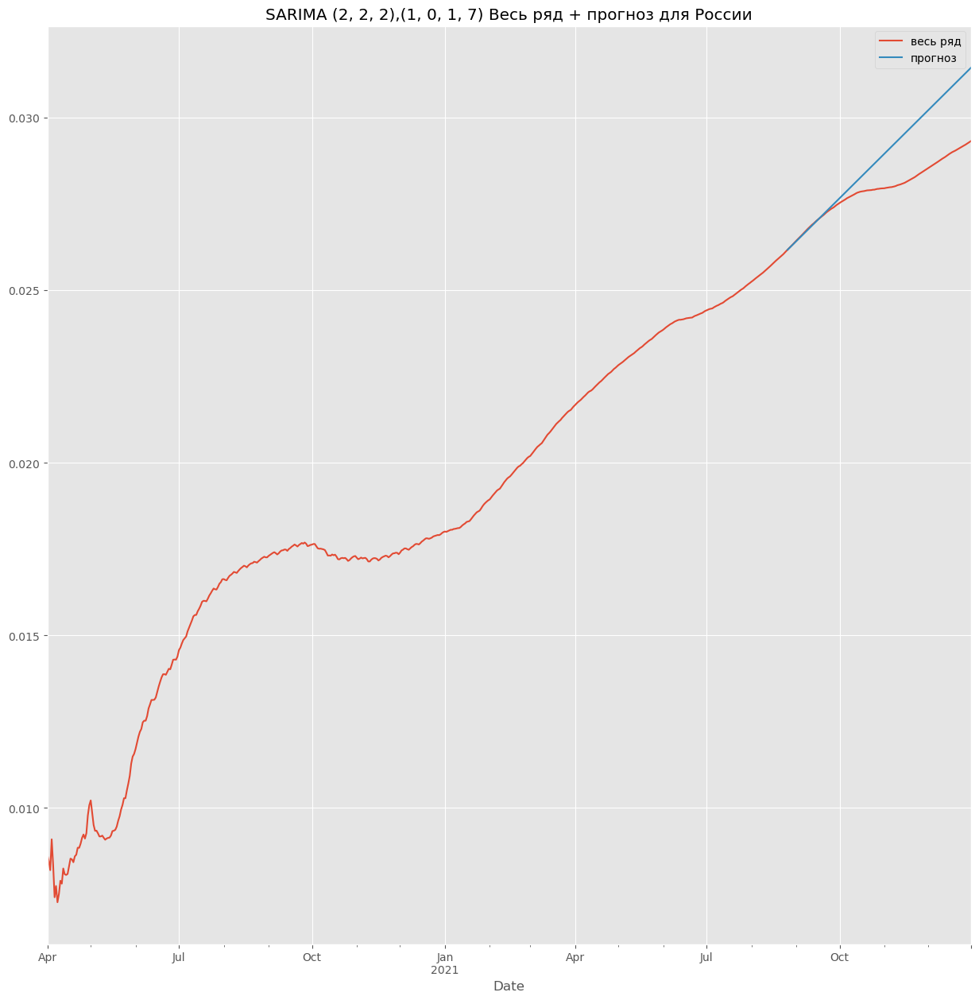

Russia SARIMA (2, 2, 2),(1, 0, 1, 7) RMSE = 0.00119


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


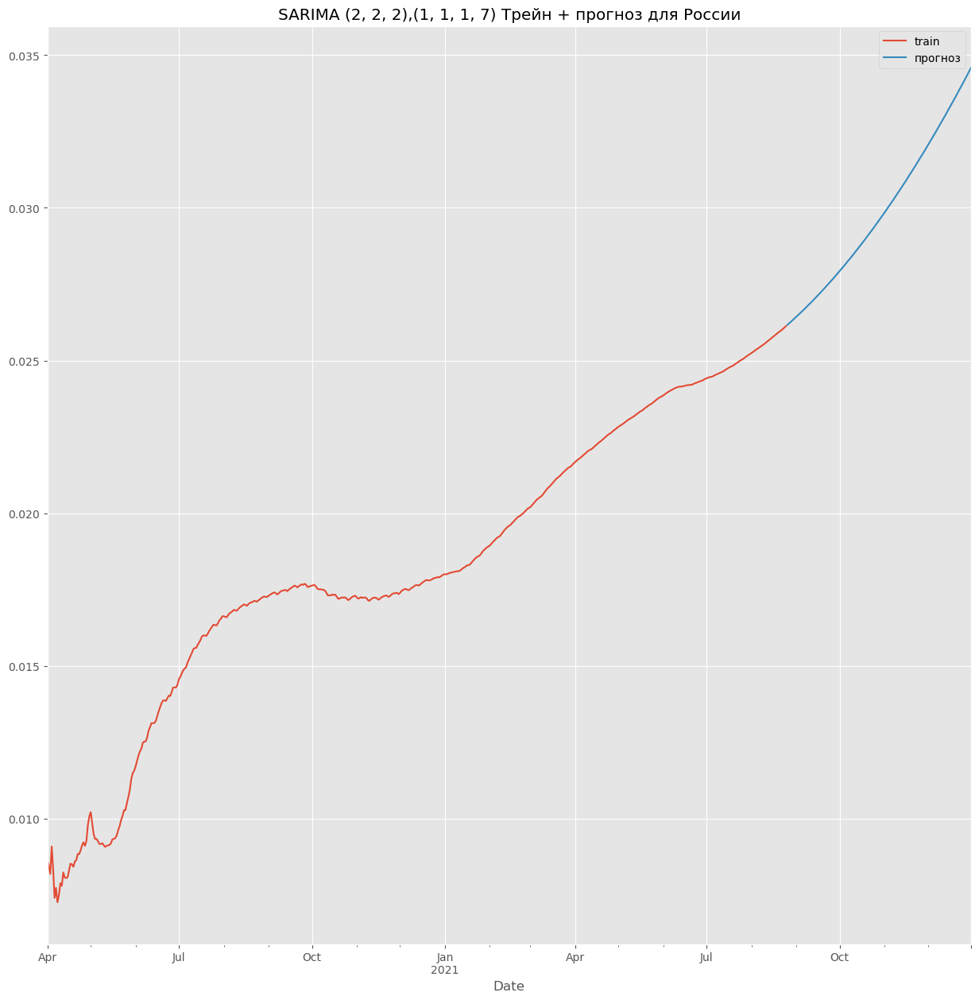

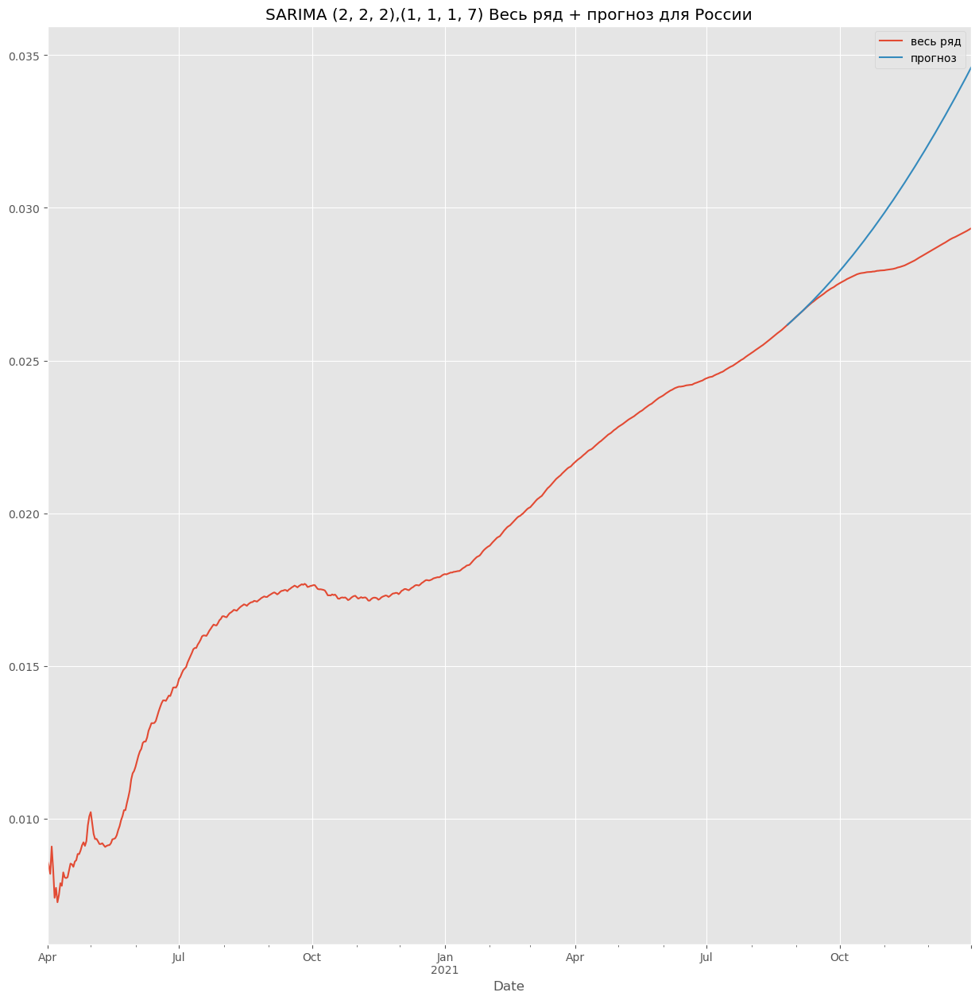

Russia SARIMA (2, 2, 2),(1, 1, 1, 7) RMSE = 0.00259


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


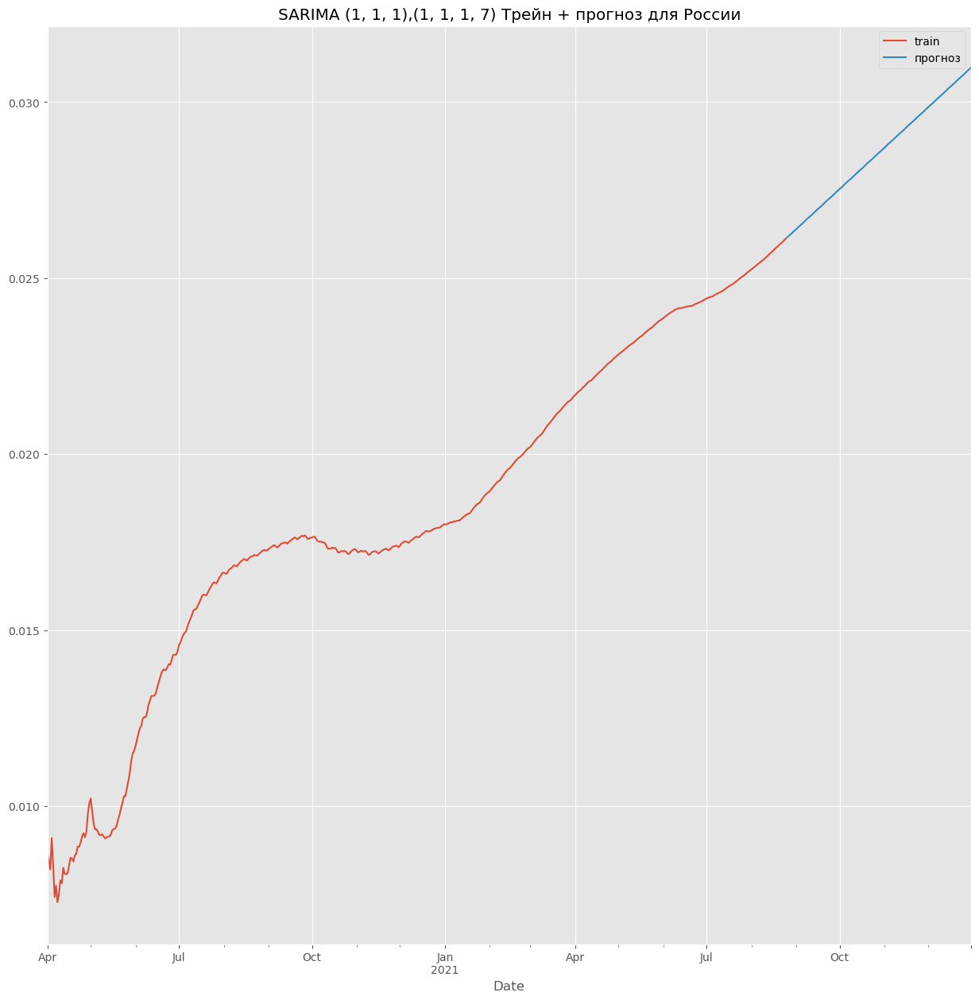

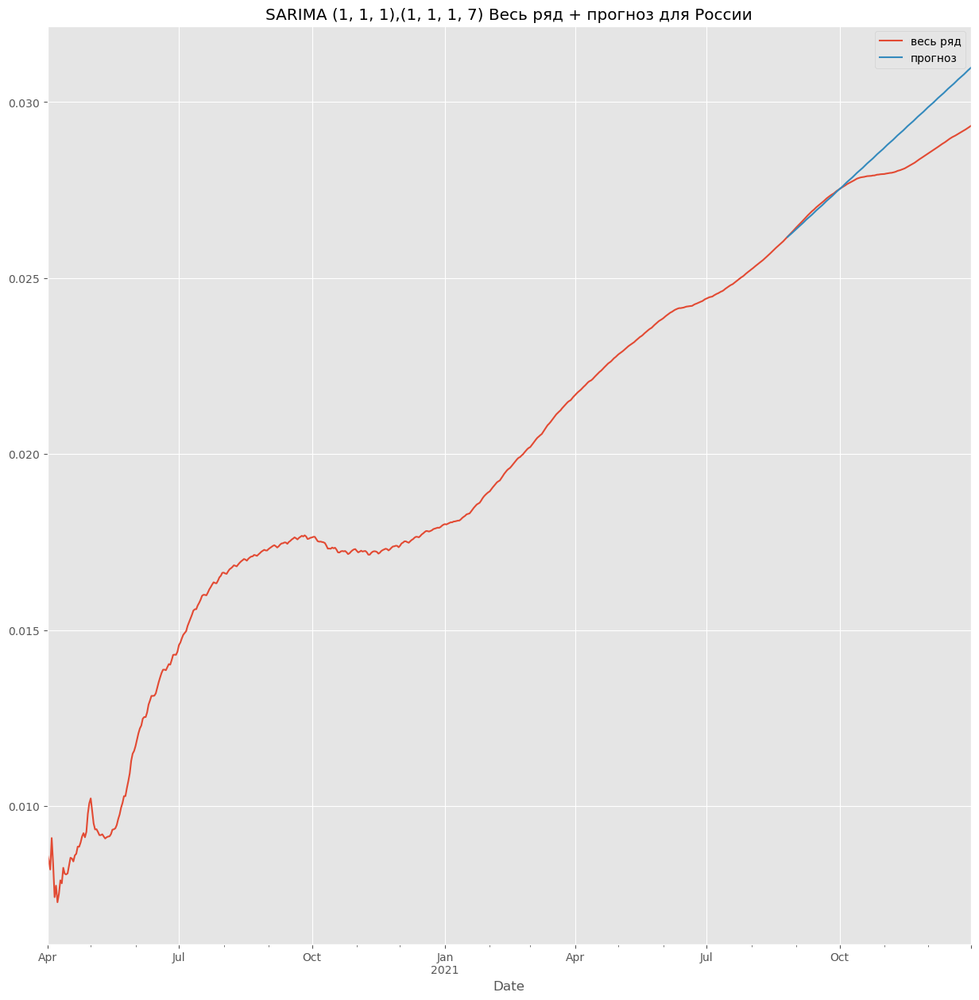

Russia SARIMA (1, 1, 1),(1, 1, 1, 7) RMSE = 0.00092


In [146]:
for order, season_order in all_orders:
    
    model = SARIMAX(train['Russia'], order=order, seasonal_order=season_order).fit()
    forecast = pd.Series(model.get_forecast(len(test['Russia'])).predicted_mean.values, index=test['Russia'].index)

    train['Russia'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'SARIMA {order},{season_order} Трейн + прогноз для России')
    plt.show()

    cfr['Russia'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'SARIMA {order},{season_order} Весь ряд + прогноз для России')
    plt.show()

    rmse = RMSE(forecast, test['Russia'])
    results.loc[f'SARIMA{order},{season_order}', 'Russia'] = rmse
    print(f'Russia SARIMA {order},{season_order} RMSE = {round(rmse, 5)}')

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


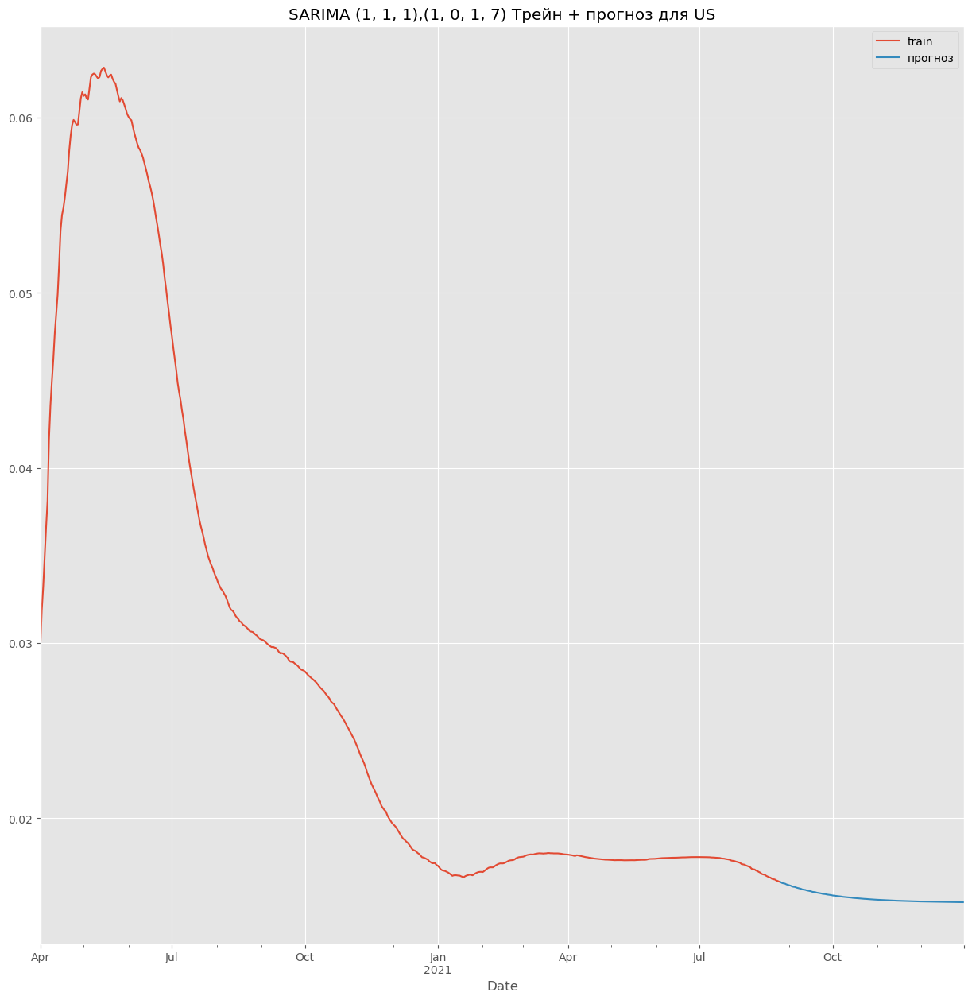

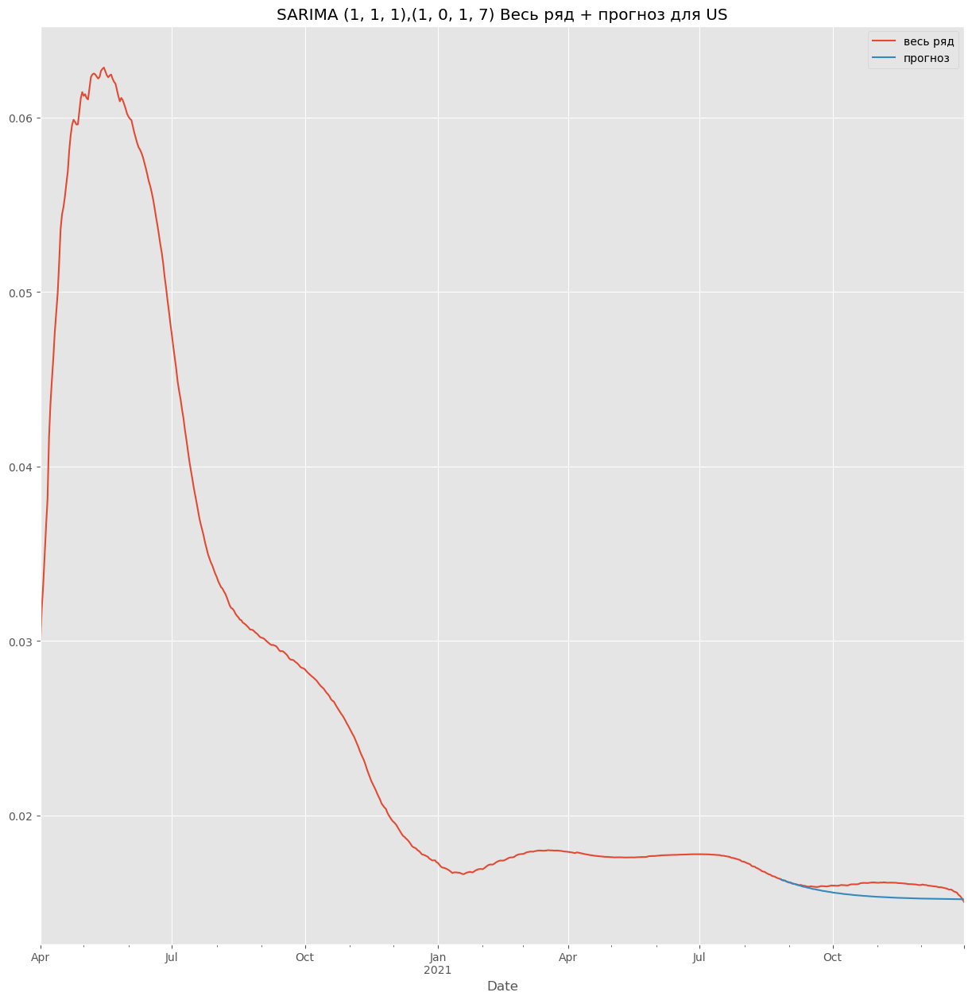

US SARIMA (1, 1, 1),(1, 0, 1, 7) RMSE = 0.0006


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


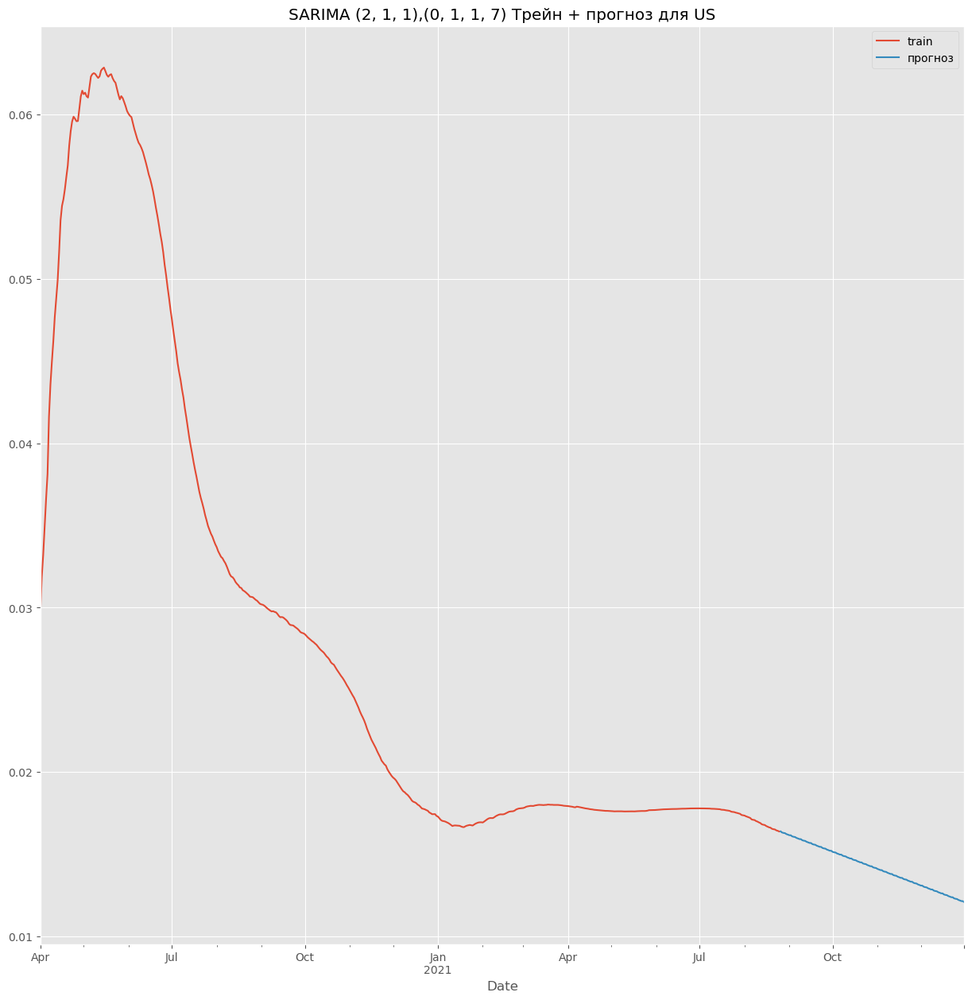

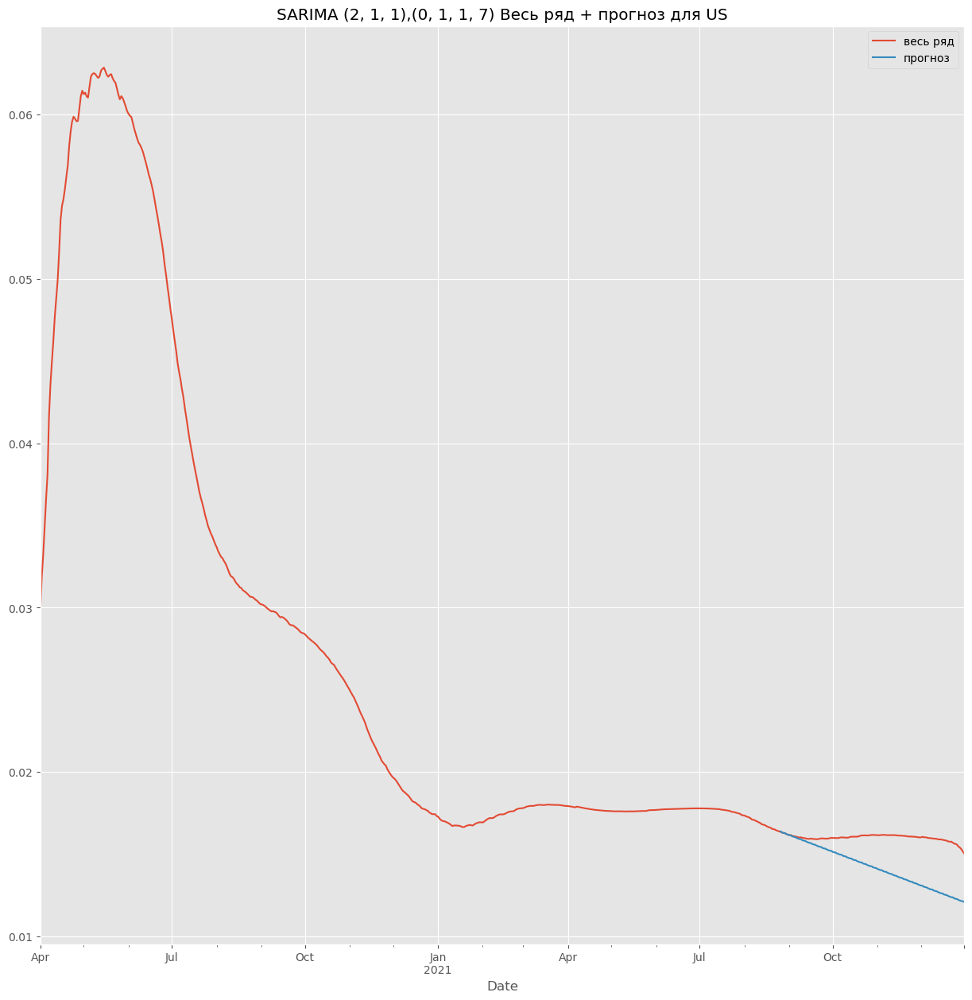

US SARIMA (2, 1, 1),(0, 1, 1, 7) RMSE = 0.00212


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


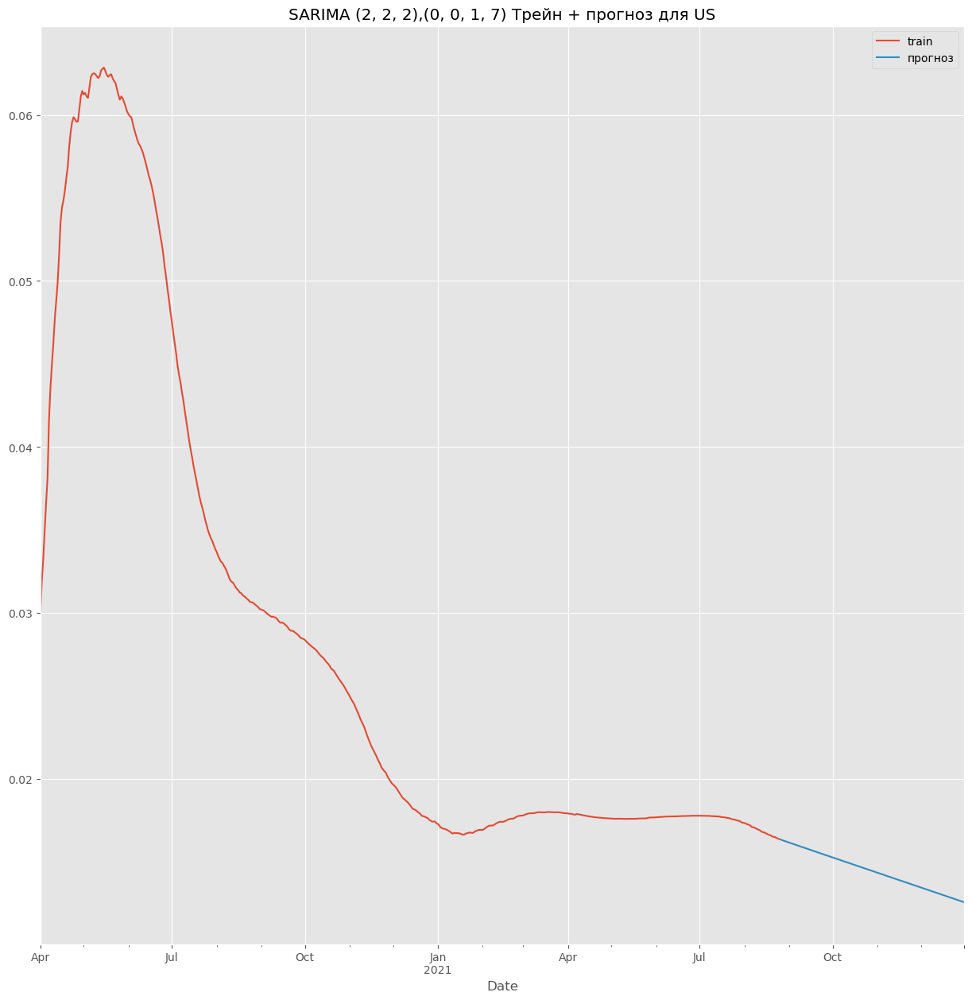

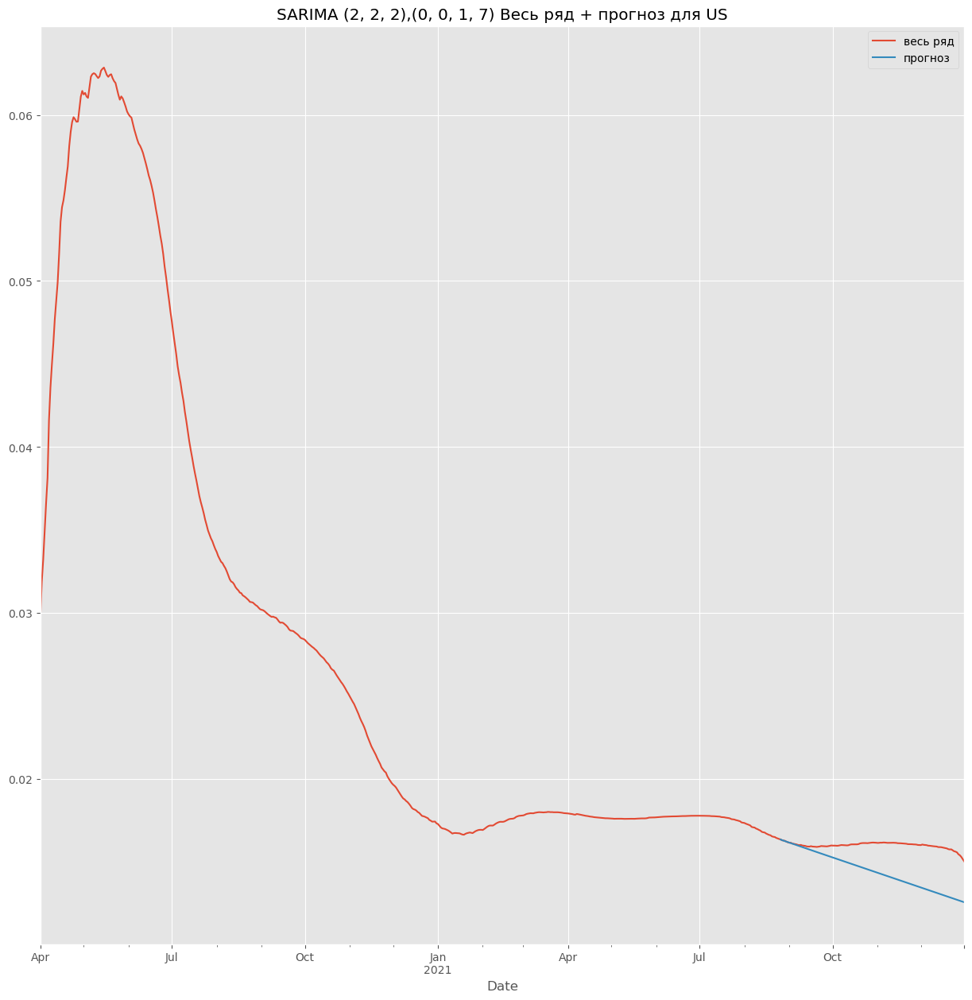

US SARIMA (2, 2, 2),(0, 0, 1, 7) RMSE = 0.00185


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


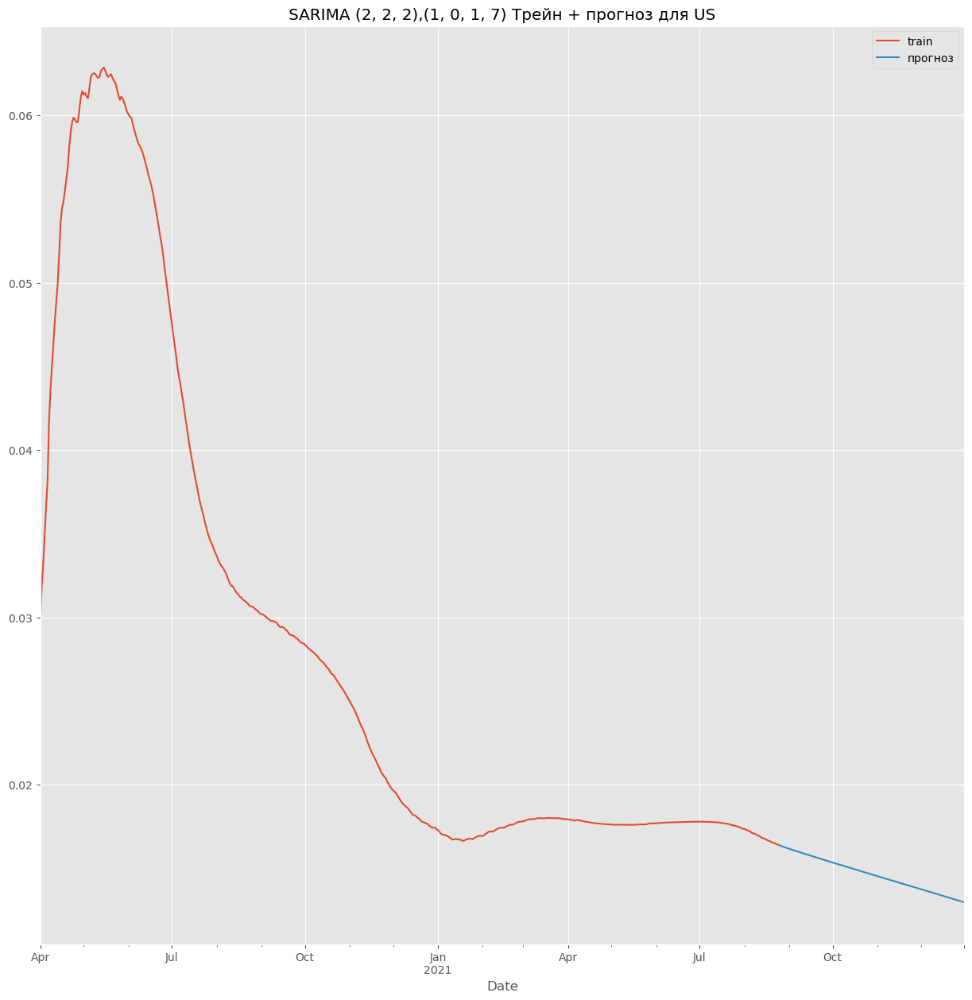

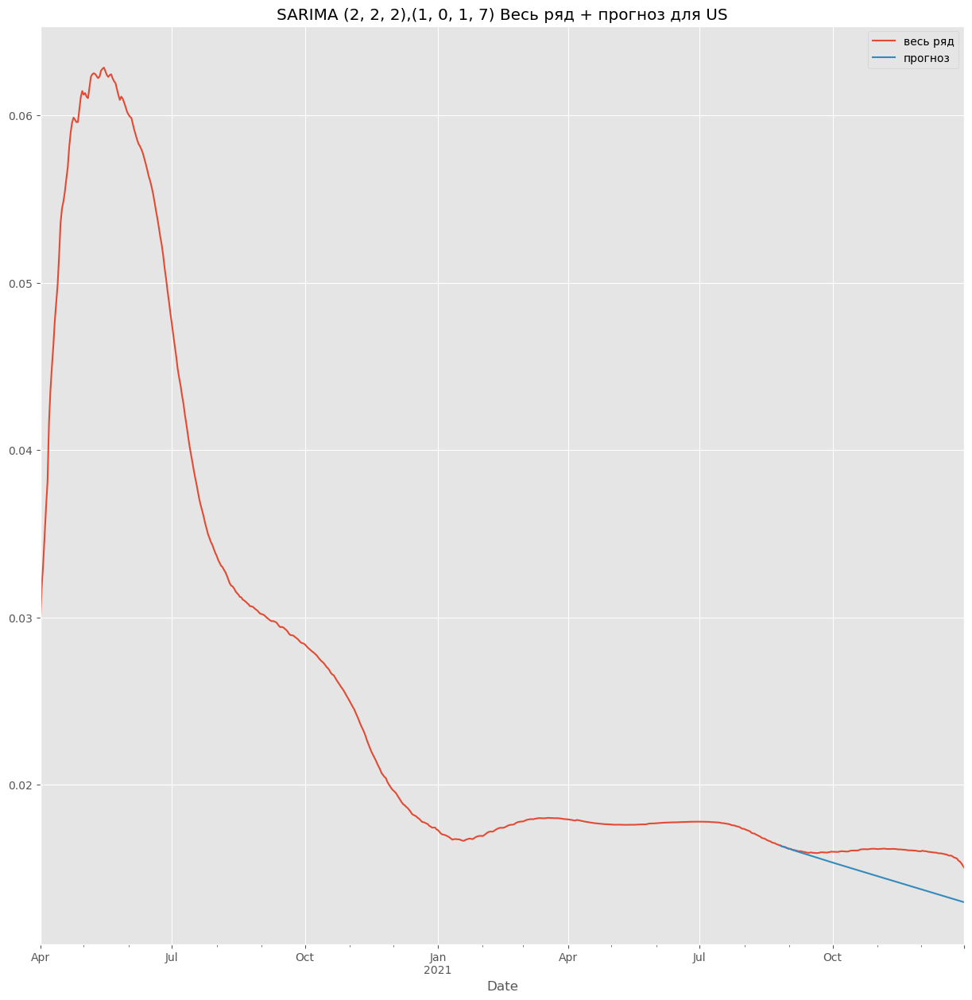

US SARIMA (2, 2, 2),(1, 0, 1, 7) RMSE = 0.00164


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


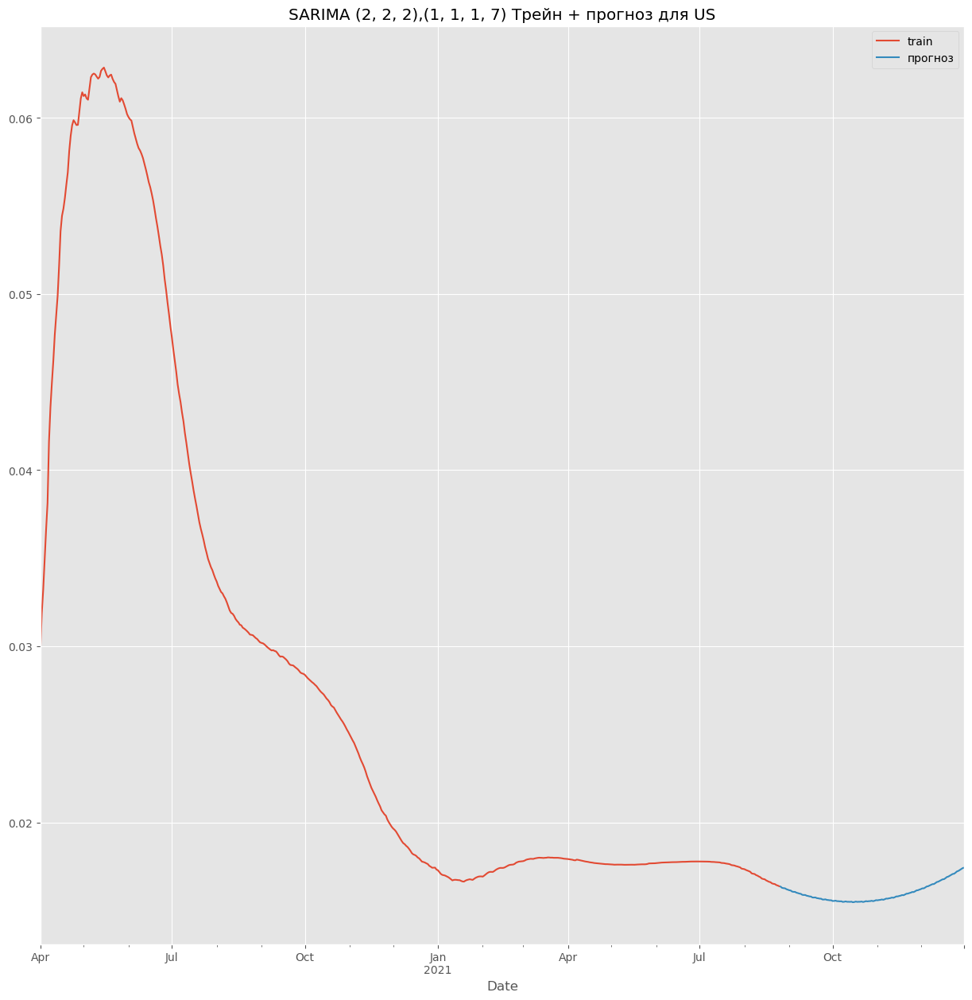

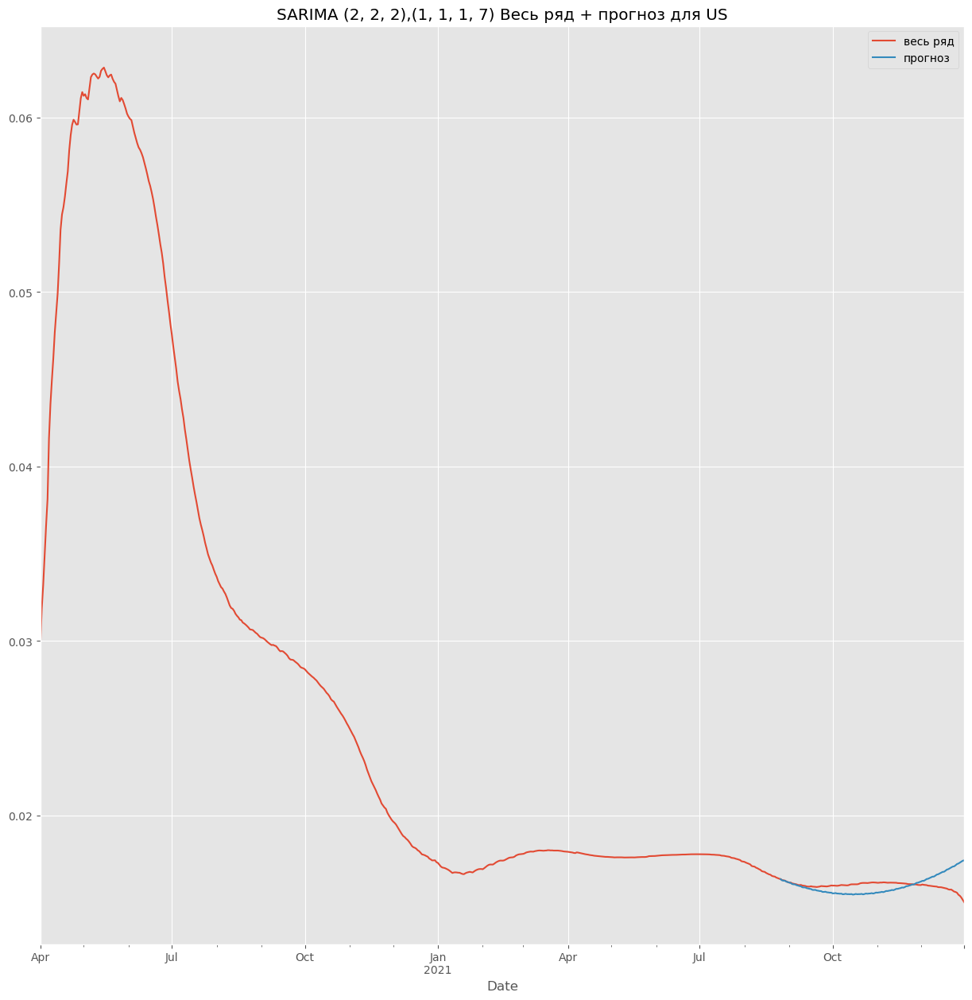

US SARIMA (2, 2, 2),(1, 1, 1, 7) RMSE = 0.00067


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


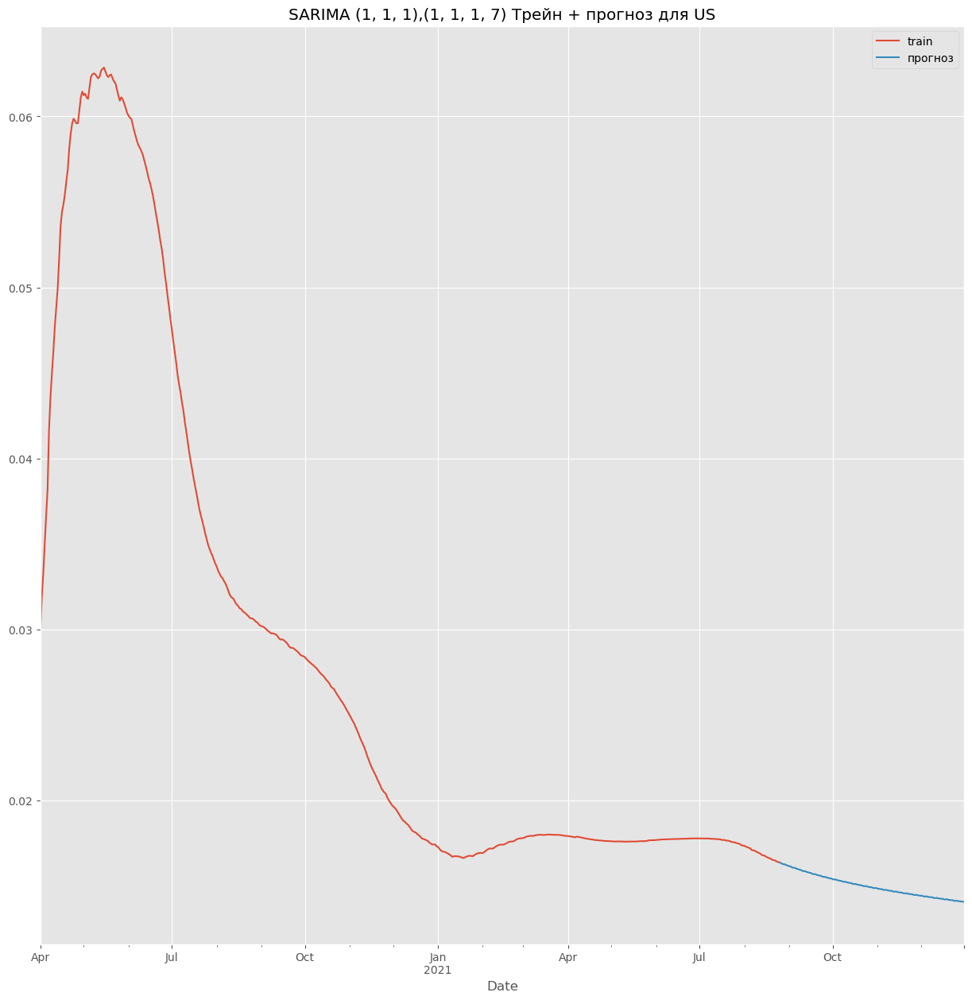

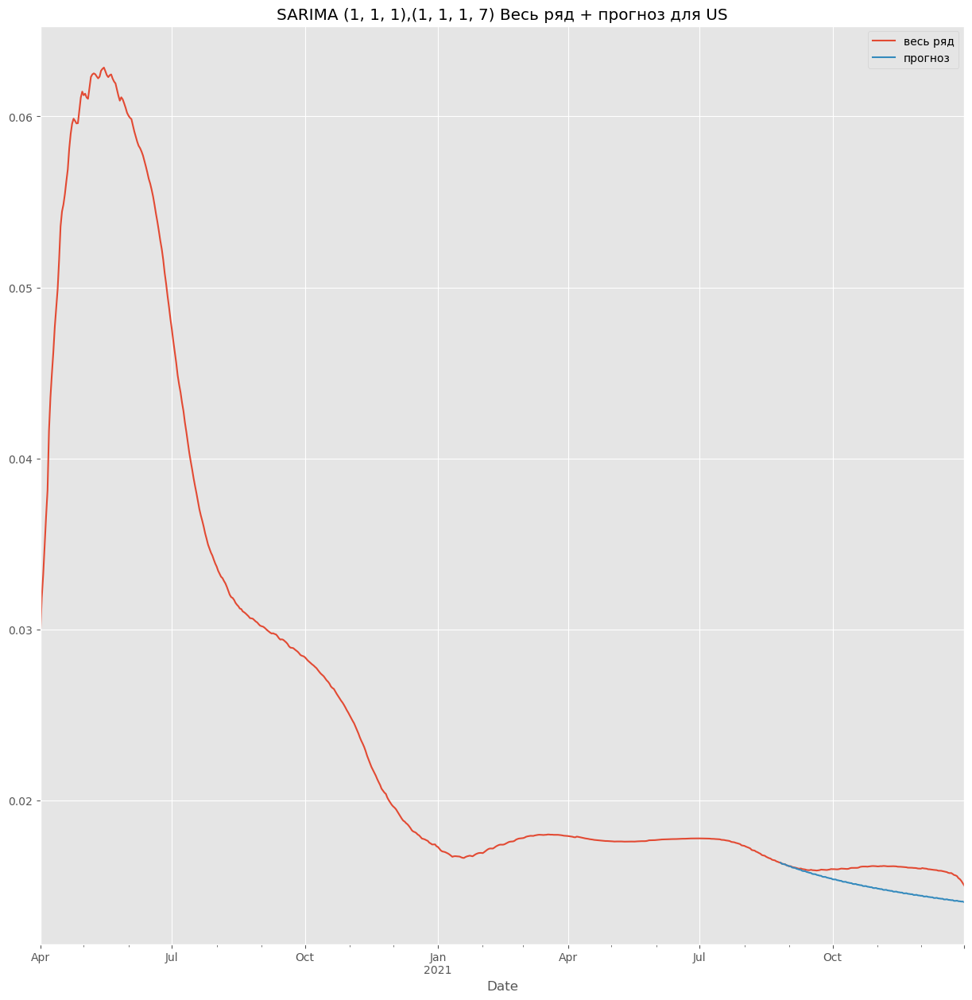

US SARIMA (1, 1, 1),(1, 1, 1, 7) RMSE = 0.00115


In [147]:
for order, season_order in all_orders:
    
    model = SARIMAX(train['US'], order=order, seasonal_order=season_order).fit()
    forecast = pd.Series(model.get_forecast(len(test['US'])).predicted_mean.values, index=test['US'].index)

    train['US'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'SARIMA {order},{season_order} Трейн + прогноз для US')
    plt.show()

    cfr['US'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'SARIMA {order},{season_order} Весь ряд + прогноз для US')
    plt.show()

    rmse = RMSE(forecast, test['US'])
    results.loc[f'SARIMA{order},{season_order}', 'US'] = rmse
    print(f'US SARIMA {order},{season_order} RMSE = {round(rmse, 5)}')

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


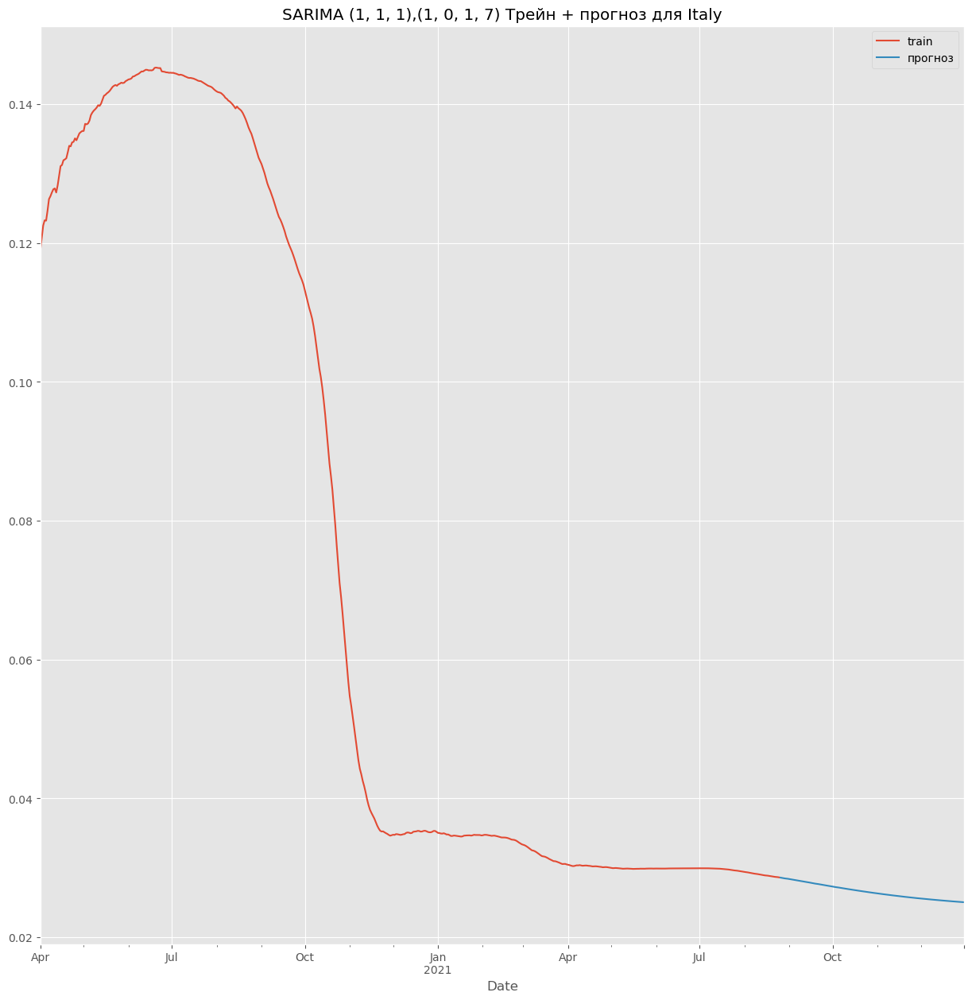

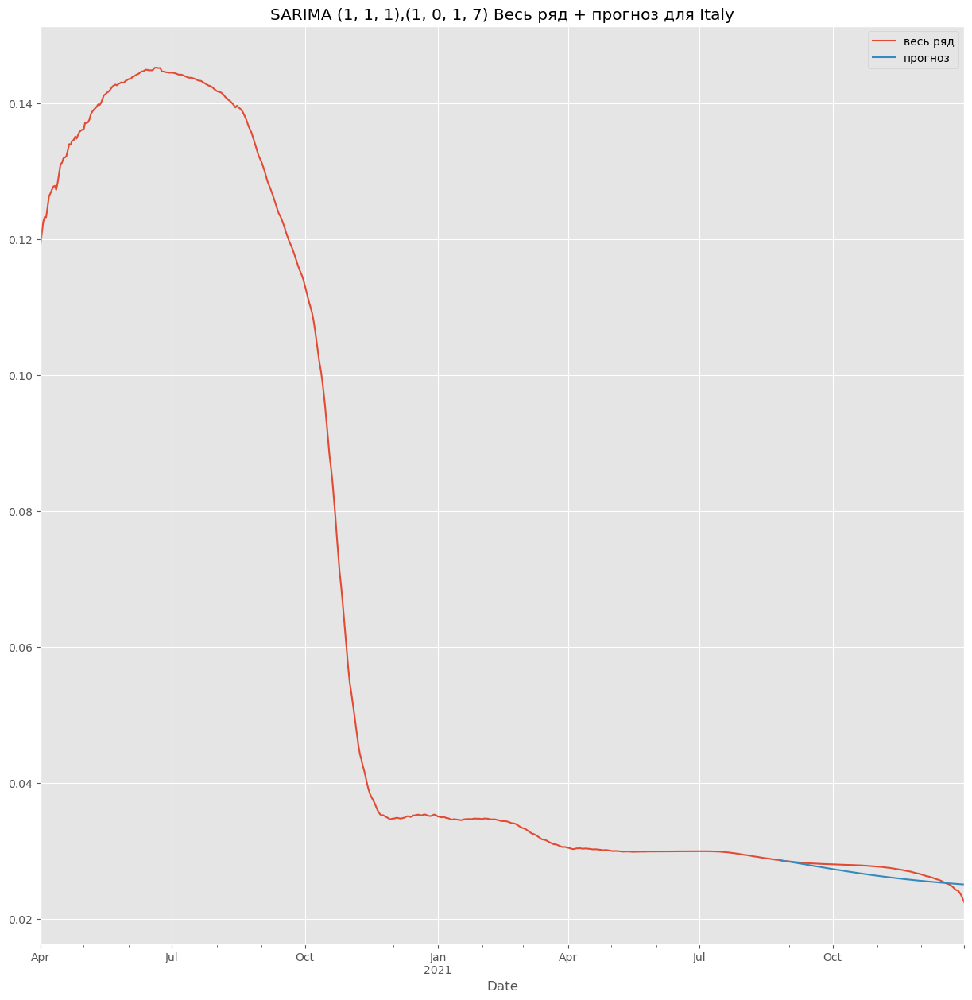

Italy SARIMA (1, 1, 1),(1, 0, 1, 7) RMSE = 0.00095


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


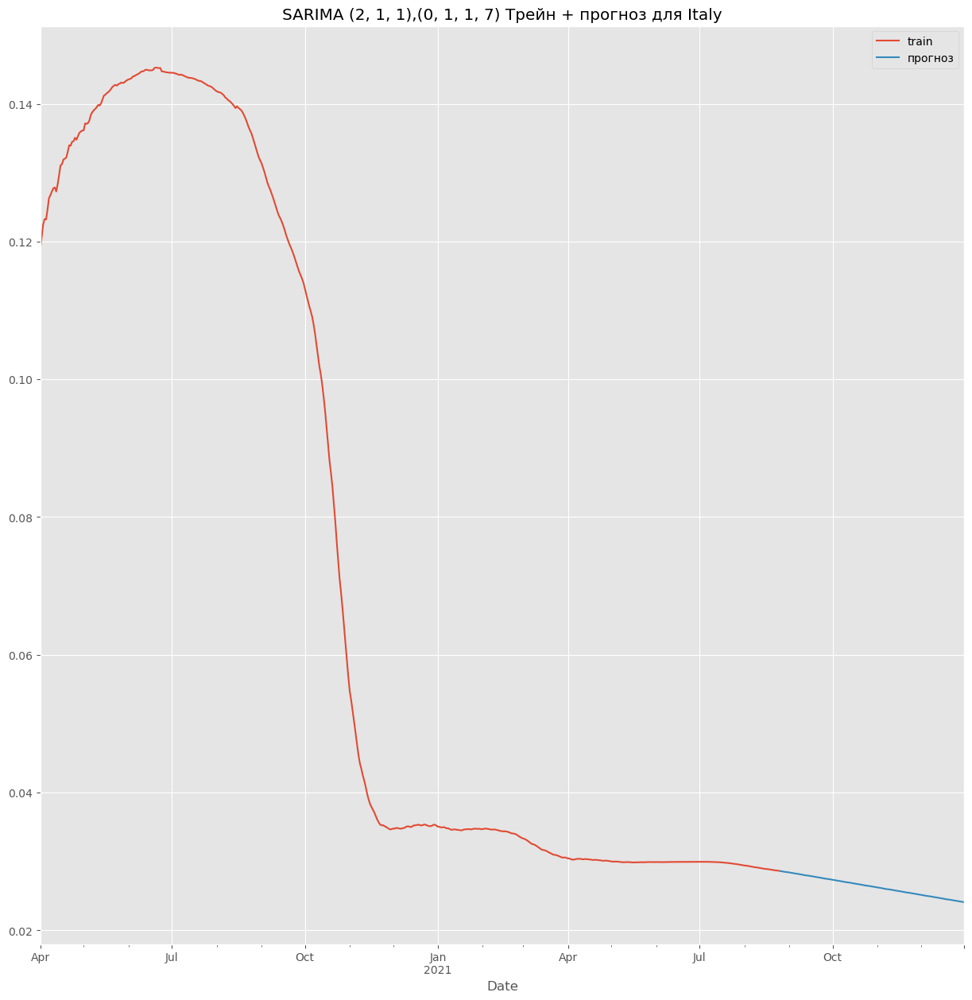

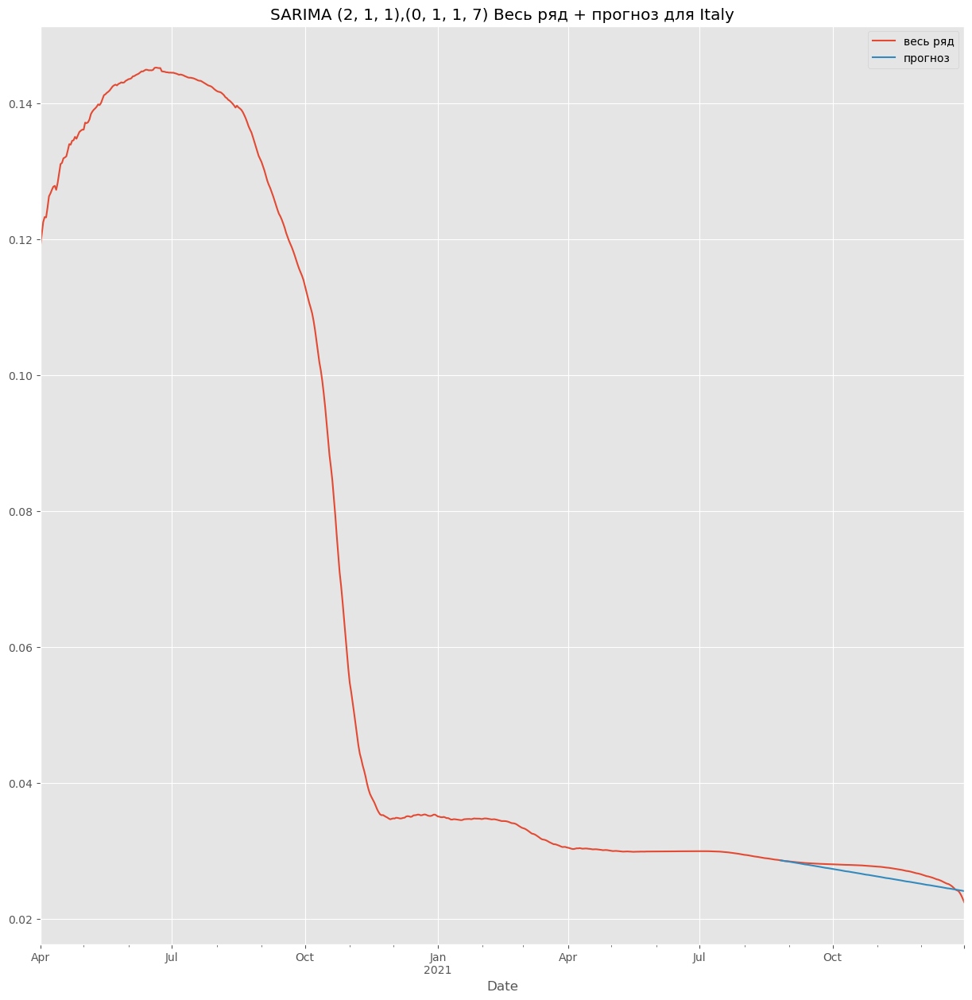

Italy SARIMA (2, 1, 1),(0, 1, 1, 7) RMSE = 0.00105


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


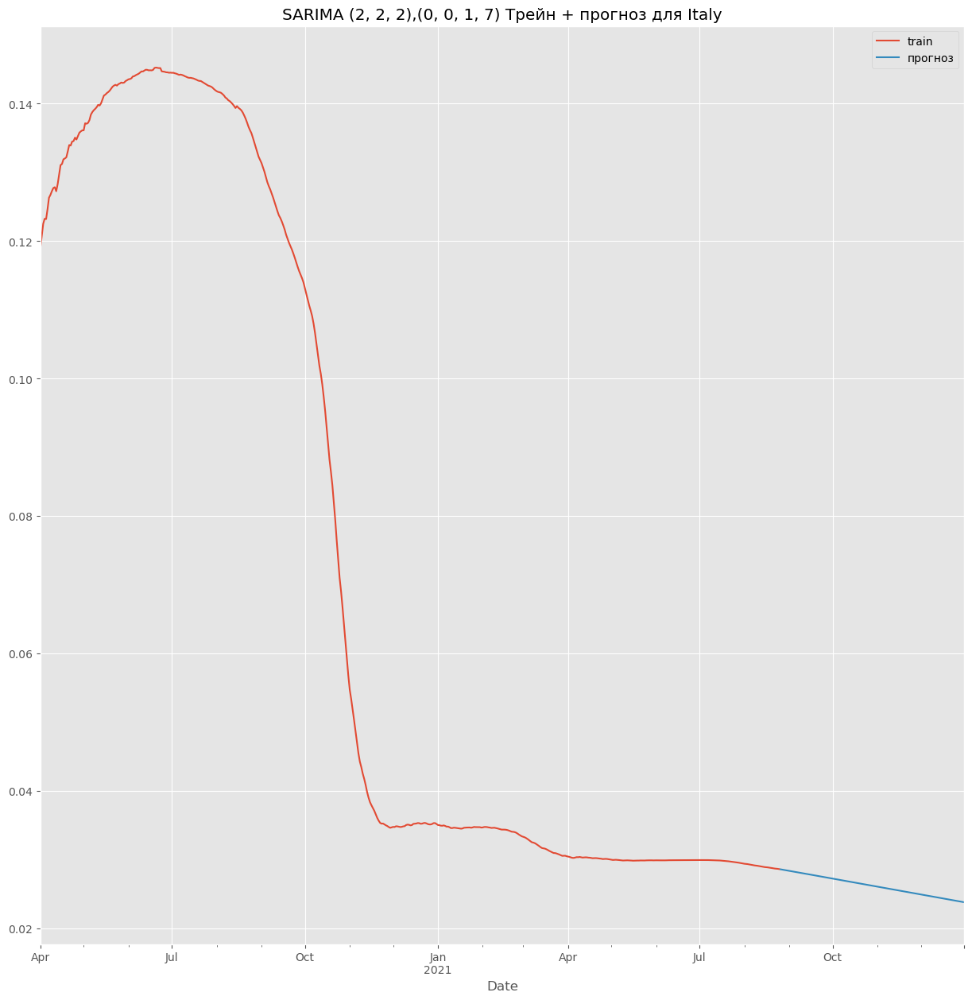

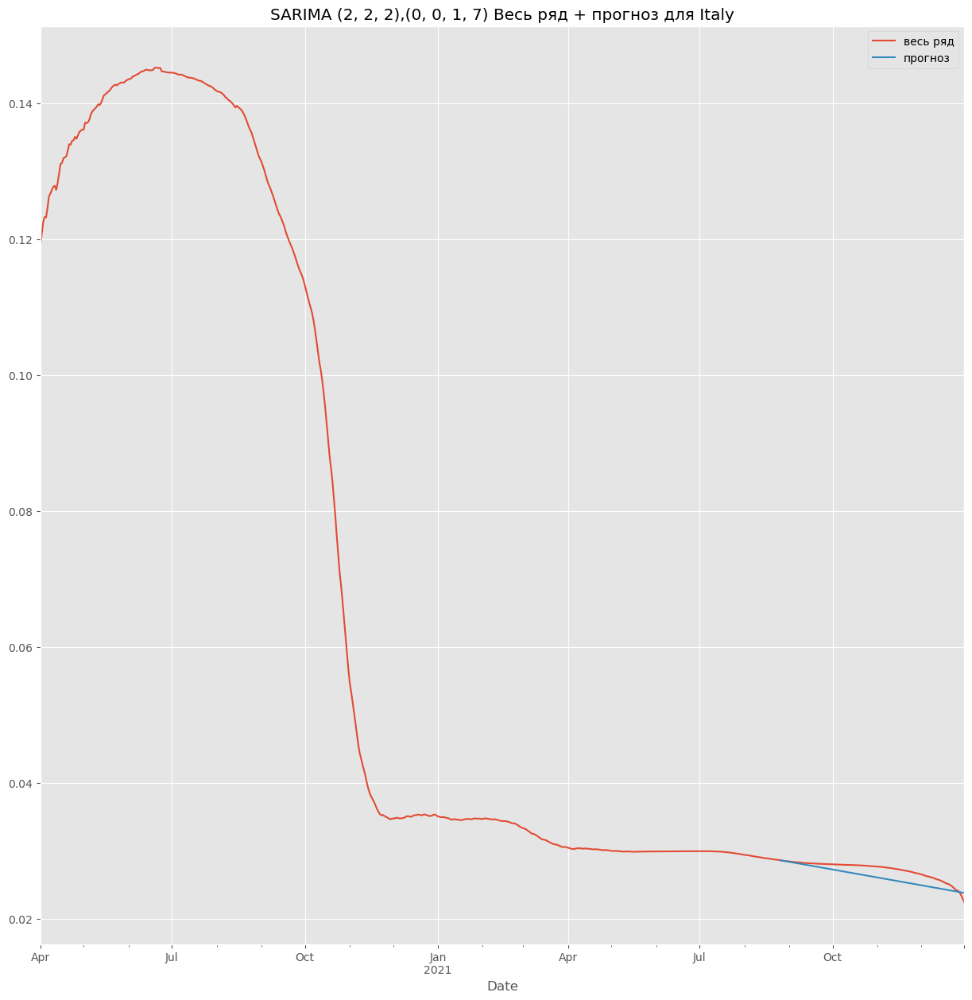

Italy SARIMA (2, 2, 2),(0, 0, 1, 7) RMSE = 0.00118


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


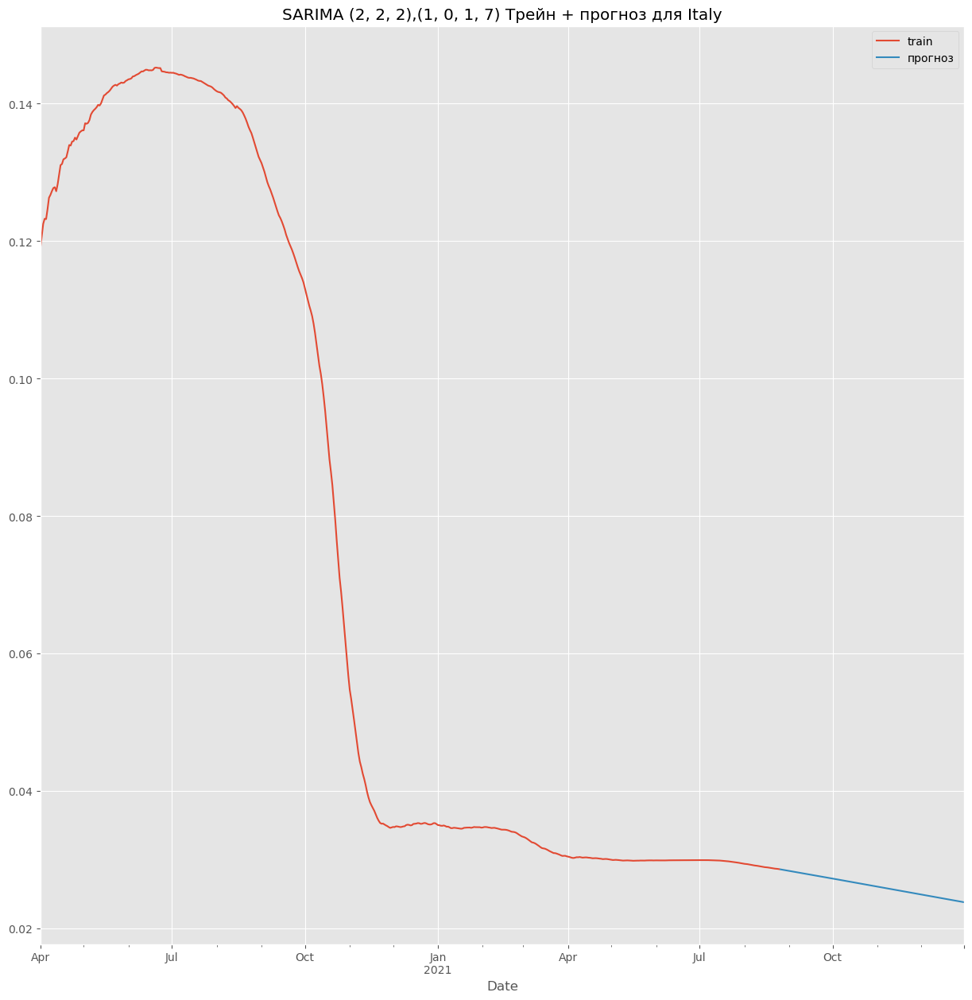

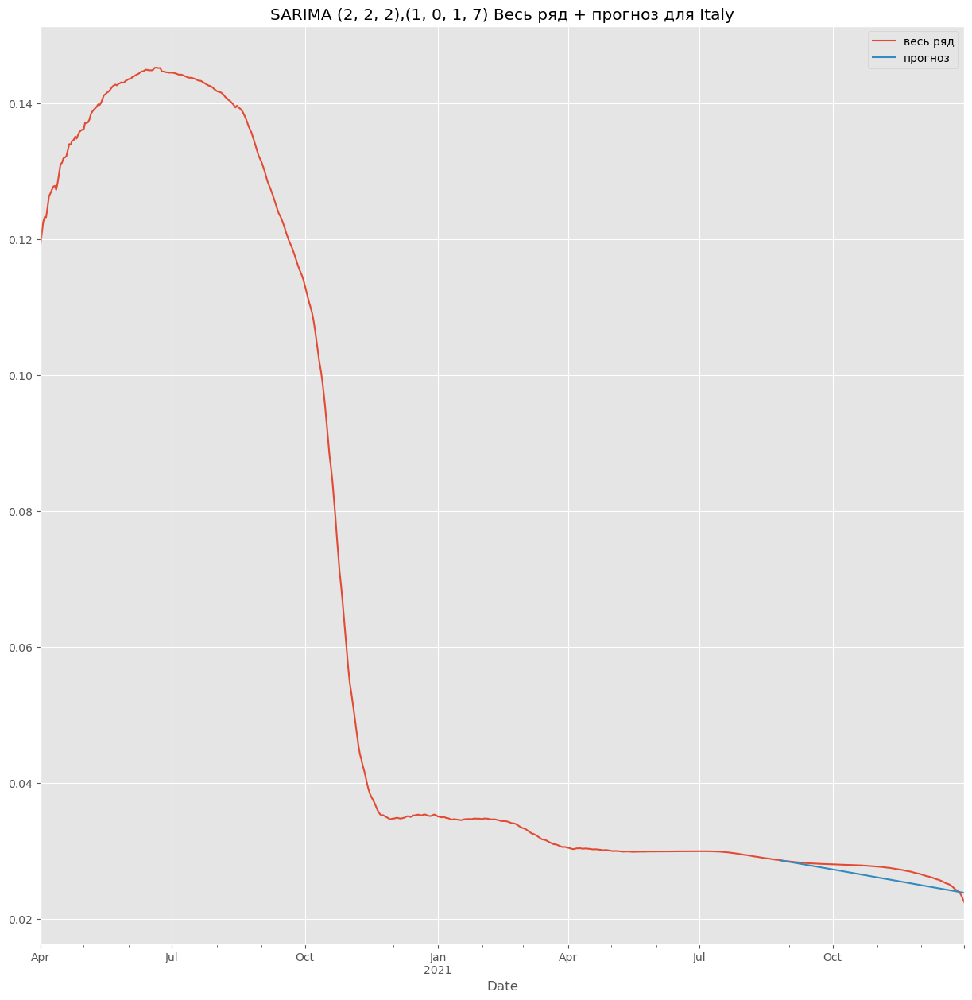

Italy SARIMA (2, 2, 2),(1, 0, 1, 7) RMSE = 0.00117


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


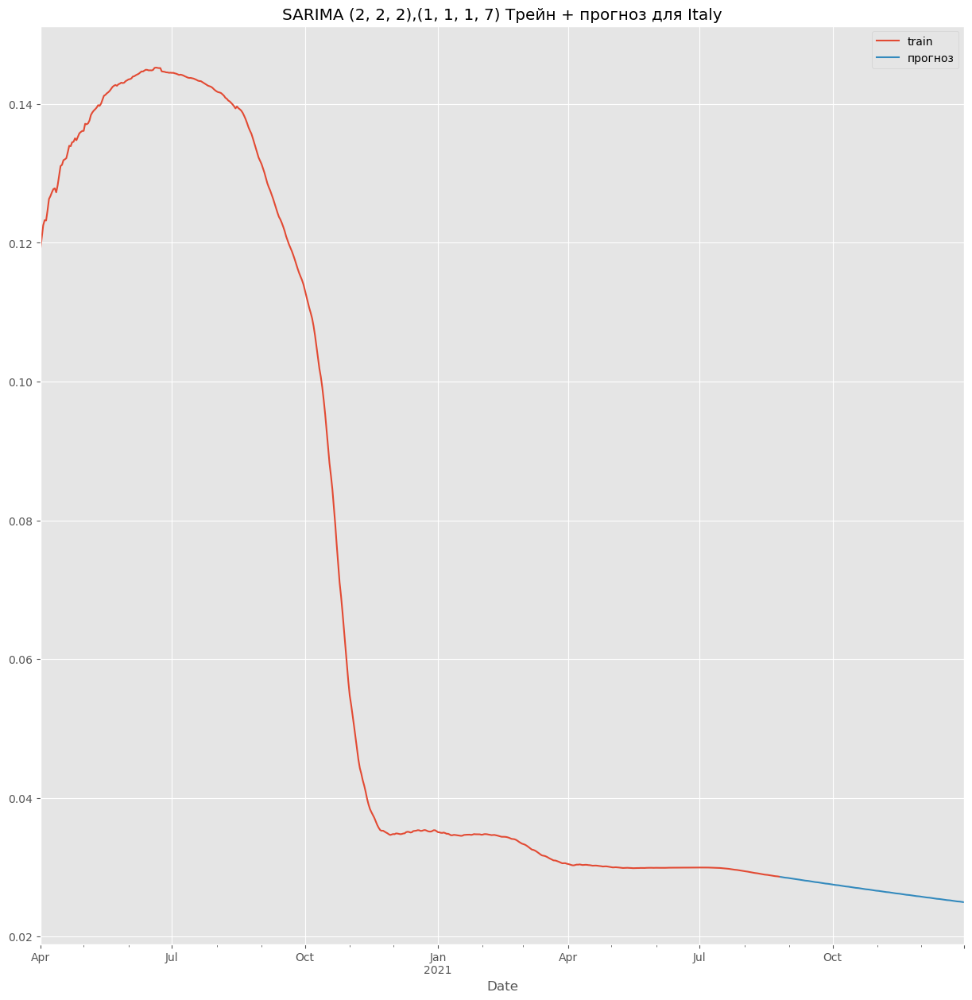

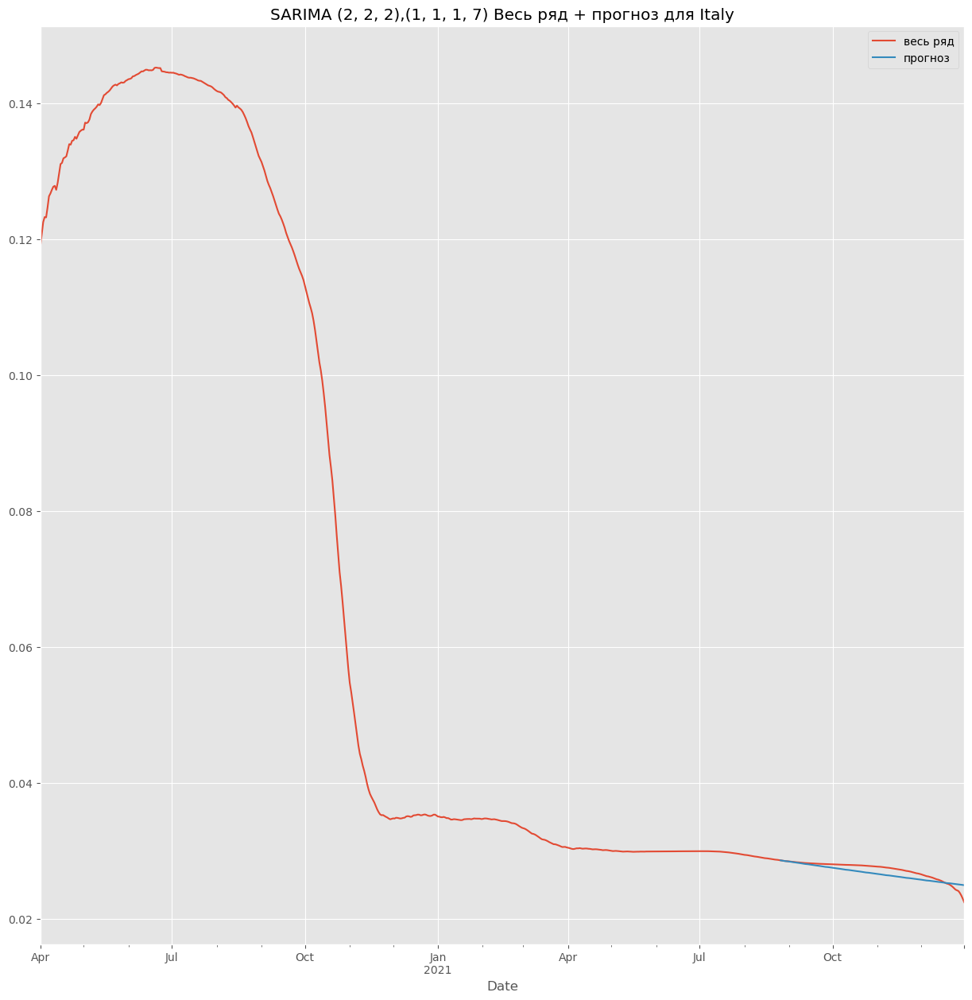

Italy SARIMA (2, 2, 2),(1, 1, 1, 7) RMSE = 0.00079


/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


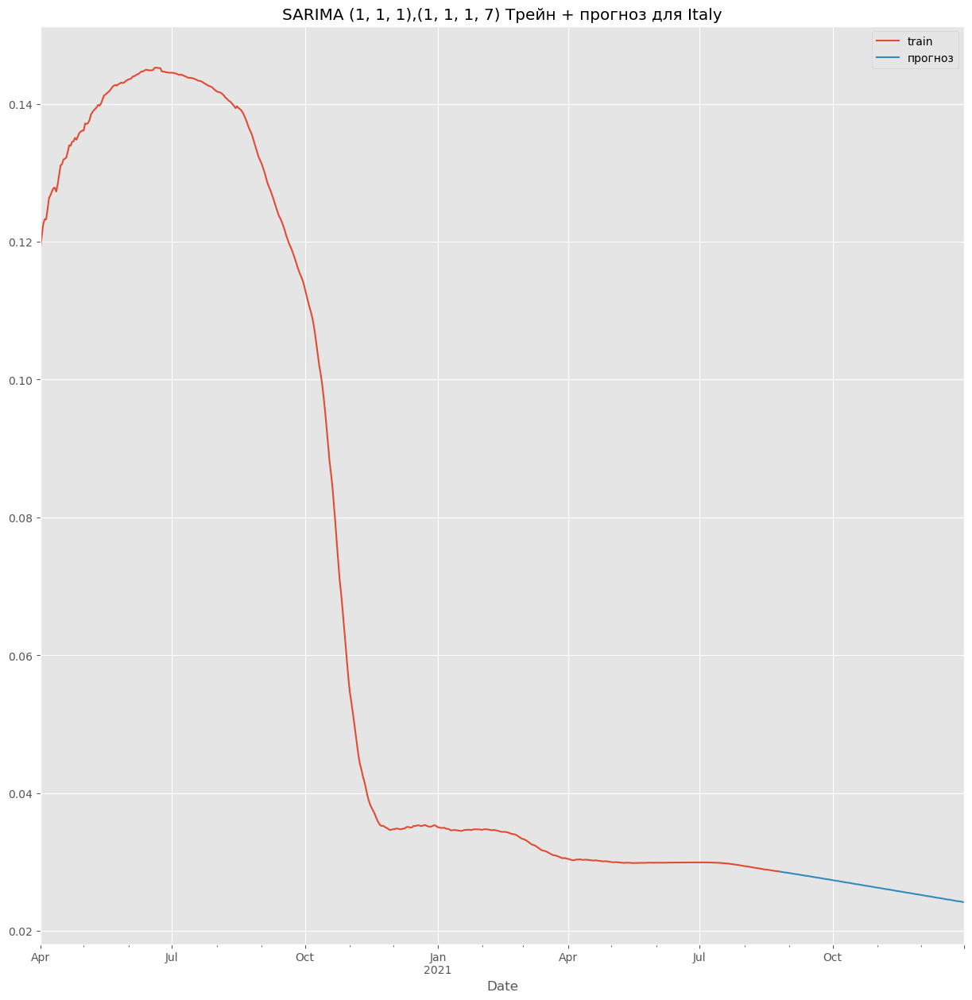

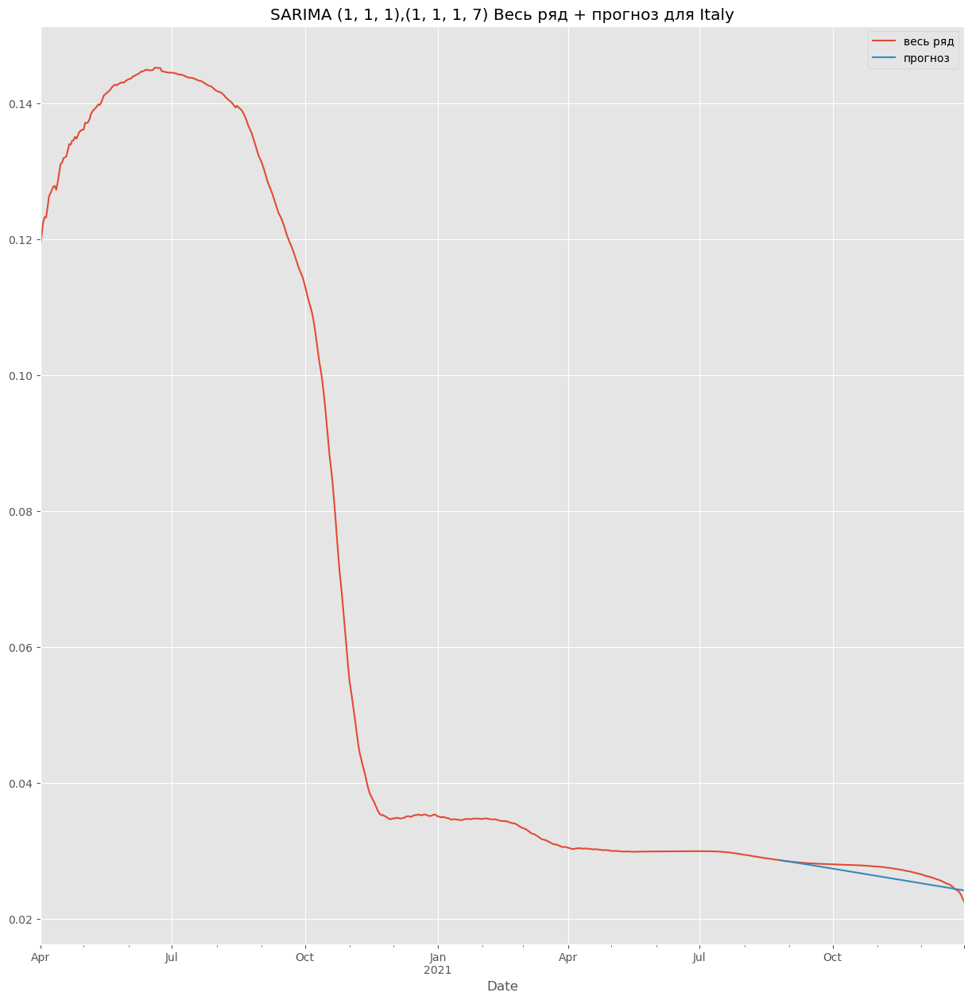

Italy SARIMA (1, 1, 1),(1, 1, 1, 7) RMSE = 0.001


In [148]:
for order, season_order in all_orders:
    
    model = SARIMAX(train['Italy'], order=order, seasonal_order=season_order).fit()
    forecast = pd.Series(model.get_forecast(len(test['Italy'])).predicted_mean.values, index=test['Italy'].index)

    train['Italy'].plot(label='train')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'SARIMA {order},{season_order} Трейн + прогноз для Italy')
    plt.show()

    cfr['Italy'].plot(label='весь ряд')
    forecast.plot(label='прогноз')
    plt.legend()
    plt.title(f'SARIMA {order},{season_order} Весь ряд + прогноз для Italy')
    plt.show()

    rmse = RMSE(forecast, test['Italy'])
    results.loc[f'SARIMA{order},{season_order}', 'Italy'] = rmse
    print(f'Italy SARIMA {order},{season_order} RMSE = {round(rmse, 5)}')

Визуально результаты выглядят намного лучше и ошибки между странами стали почти одинаковые около 0.0006 - 0.0008. И это уже очень хороший результат и предсказанный тест уже прям очень близок к реальным значениям в отличии от предыдущих моделей, вот лучшие результаты по метрике RMSE:

- Russia SARIMA (2, 1, 1),(0, 1, 1, 7) RMSE = 0.00075
- US SARIMA (1, 1, 1),(1, 0, 1, 7) RMSE = 0.0006
- Italy SARIMA (2, 2, 2),(1, 1, 1, 7) RMSE = 0.00079

Но в задании было написано про Алгоритм Хиндмана-Хандакара для настройки SARIMA, он помогает автоматически подобрать гиперпараметры для моделей, можно попробовать как раз посмотреть, какие гиперпараметры подберет он и получиться ли еще меньше ошибка

In [150]:
!pip install pmdarima

In [151]:
import pmdarima as pm

In [152]:
model = pm.auto_arima(train['Russia'], seasonal=True, m=7)
forecast = pd.Series(model.predict(n_periods=len(test['Russia'])).values, index=test['Russia'].index)
print('Russia гиперпараметры:', model.order, model.seasonal_order)

Russia гиперпараметры: (0, 1, 0) (1, 0, 0, 7)


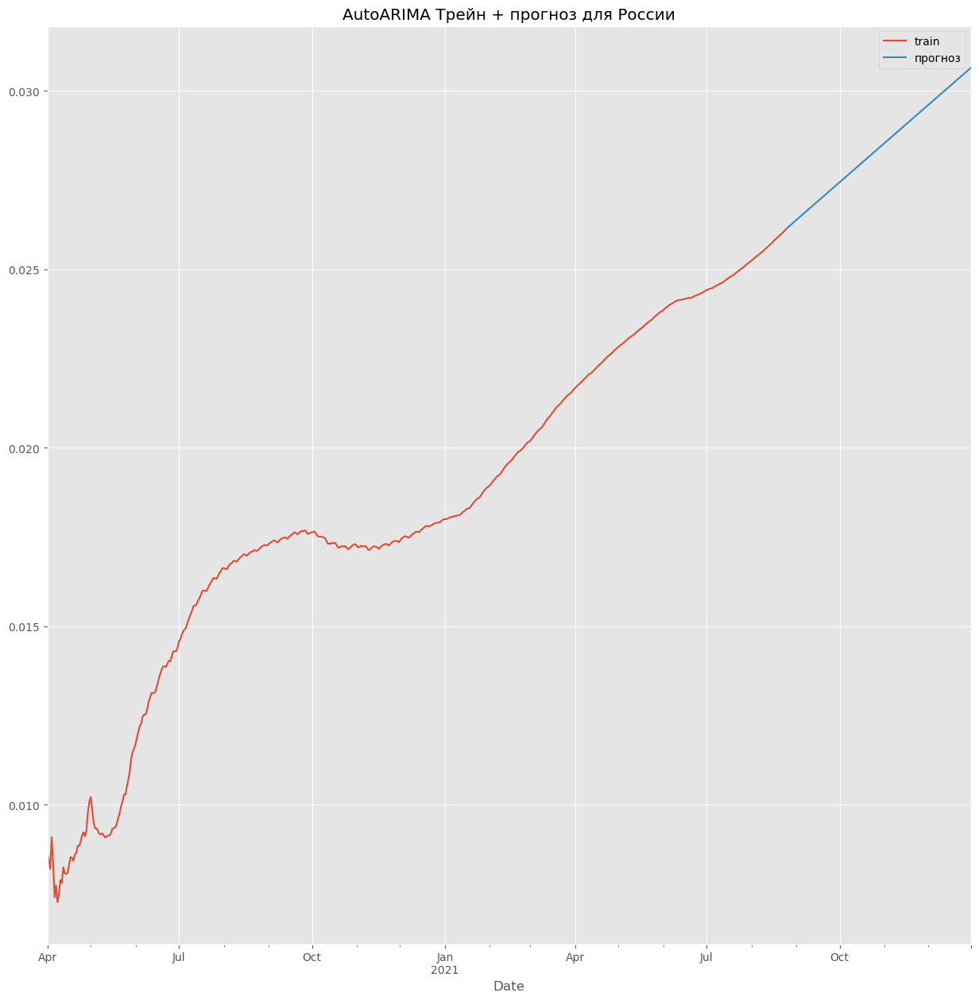

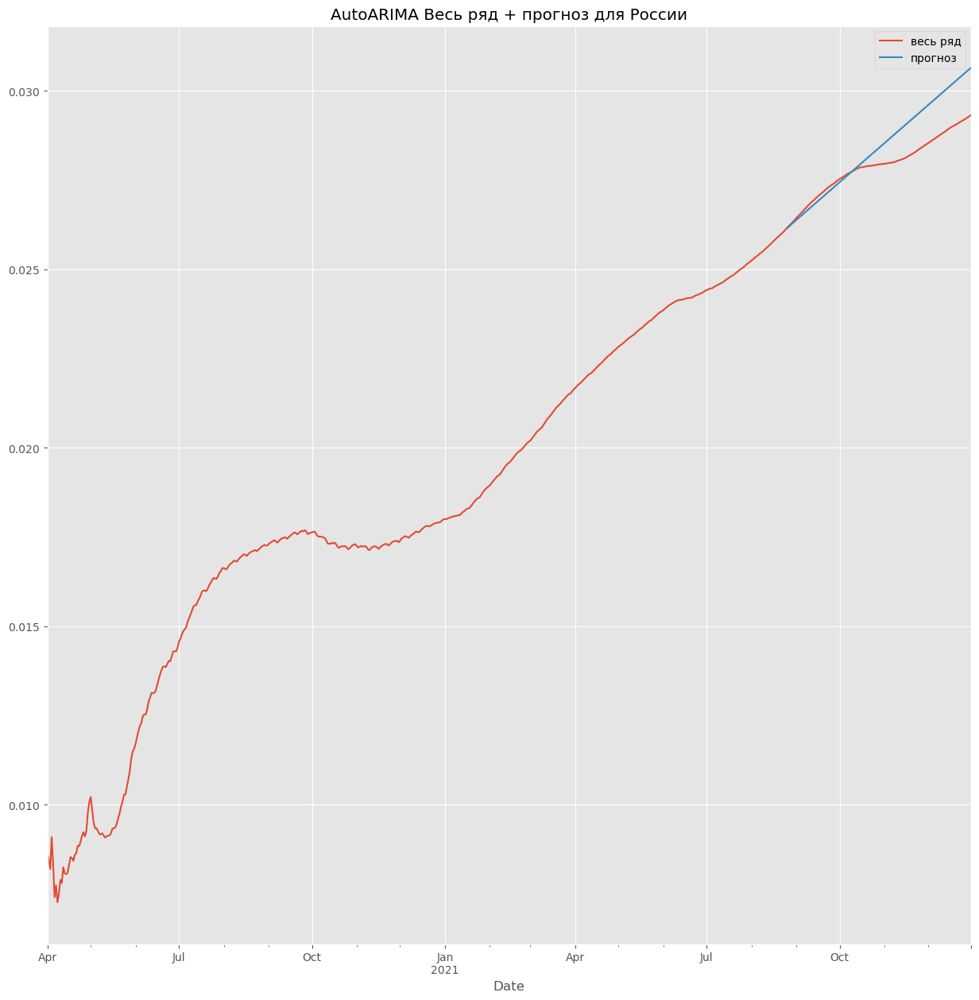

In [153]:
train['Russia'].plot(label='train')
forecast.plot(label='прогноз')
plt.legend()
plt.title('AutoARIMA Трейн + прогноз для России')
plt.show()

cfr['Russia'].plot(label='весь ряд')
forecast.plot(label='прогноз')
plt.legend()
plt.title('AutoARIMA Весь ряд + прогноз для России')
plt.show()

In [154]:
rmse = RMSE(forecast, test['Russia'])
results.loc['AutoARIMA', 'Russia'] = rmse
print('Russia RMSE =', round(rmse, 5))

Russia RMSE = 0.00074


In [159]:
model = pm.auto_arima(train['US'], seasonal=True, m=7)
forecast = pd.Series(model.predict(n_periods=len(test['US'])).values, index=test['US'].index)
print('US гиперпараметры:', model.order, model.seasonal_order)

US гиперпараметры: (5, 1, 0) (1, 0, 1, 7)


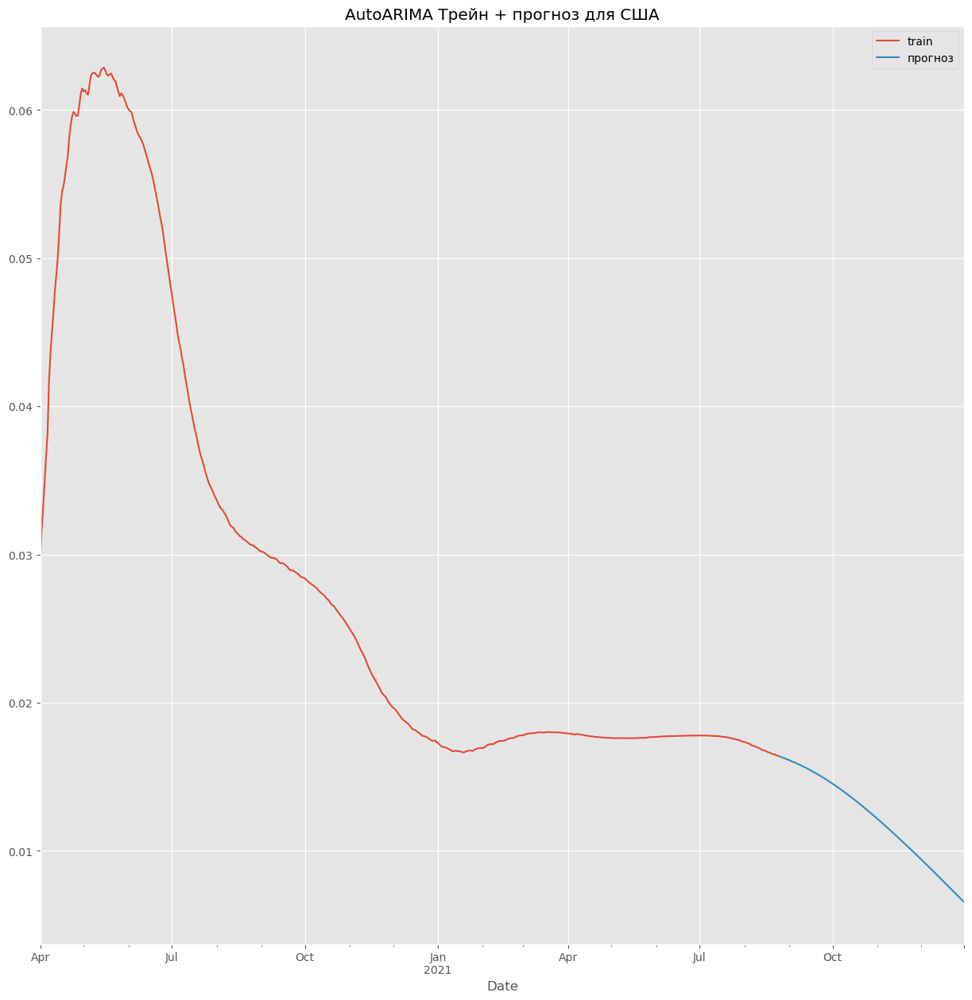

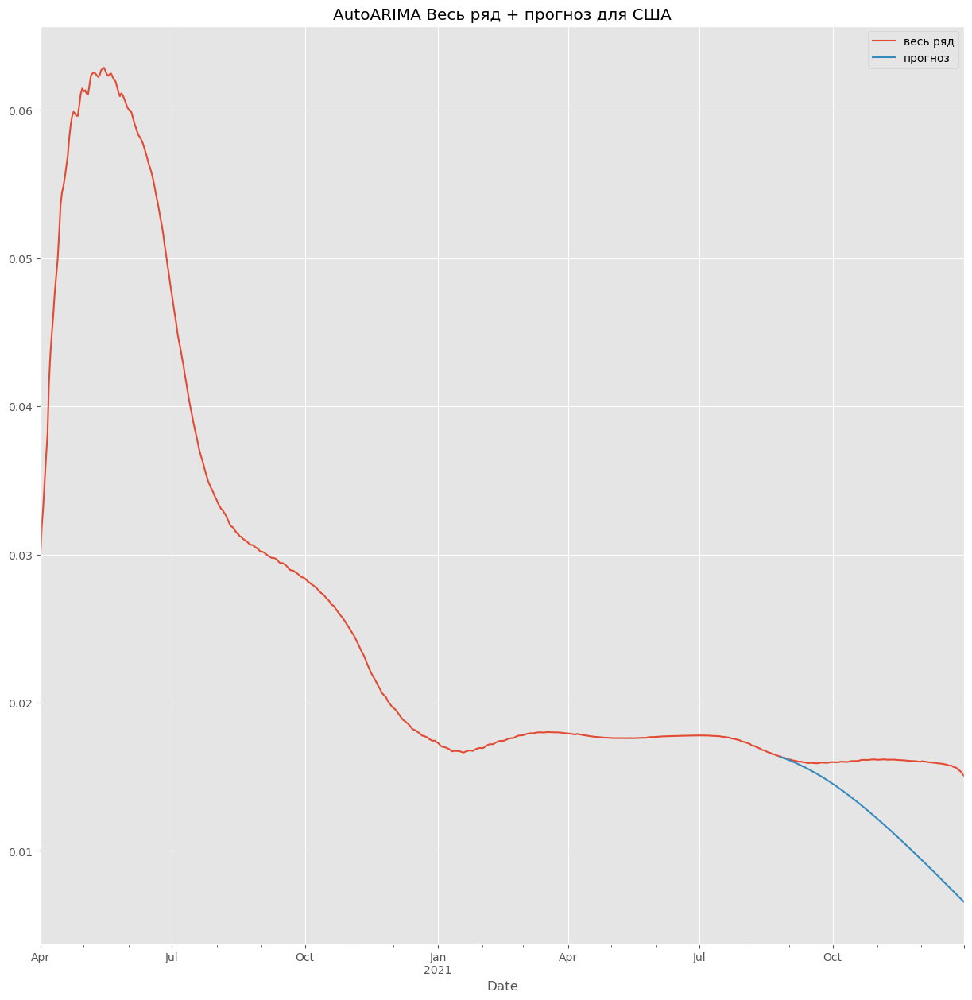

In [160]:
train['US'].plot(label='train')
forecast.plot(label='прогноз')
plt.legend()
plt.title('AutoARIMA Трейн + прогноз для США')
plt.show()

cfr['US'].plot(label='весь ряд')
forecast.plot(label='прогноз')
plt.legend()
plt.title('AutoARIMA Весь ряд + прогноз для США')
plt.show()

In [161]:
rmse = RMSE(forecast, test['US'])
results.loc['AutoARIMA', 'US'] = rmse
print('US RMSE =', round(rmse, 5))

US RMSE = 0.00483


In [162]:
model = pm.auto_arima(train['Italy'], seasonal=True, m=7)
forecast = pd.Series(model.predict(n_periods=len(test['Italy'])).values, index=test['Italy'].index)
print('Italy гиперпараметры:', model.order, model.seasonal_order)

Italy гиперпараметры: (0, 2, 1) (1, 0, 2, 7)


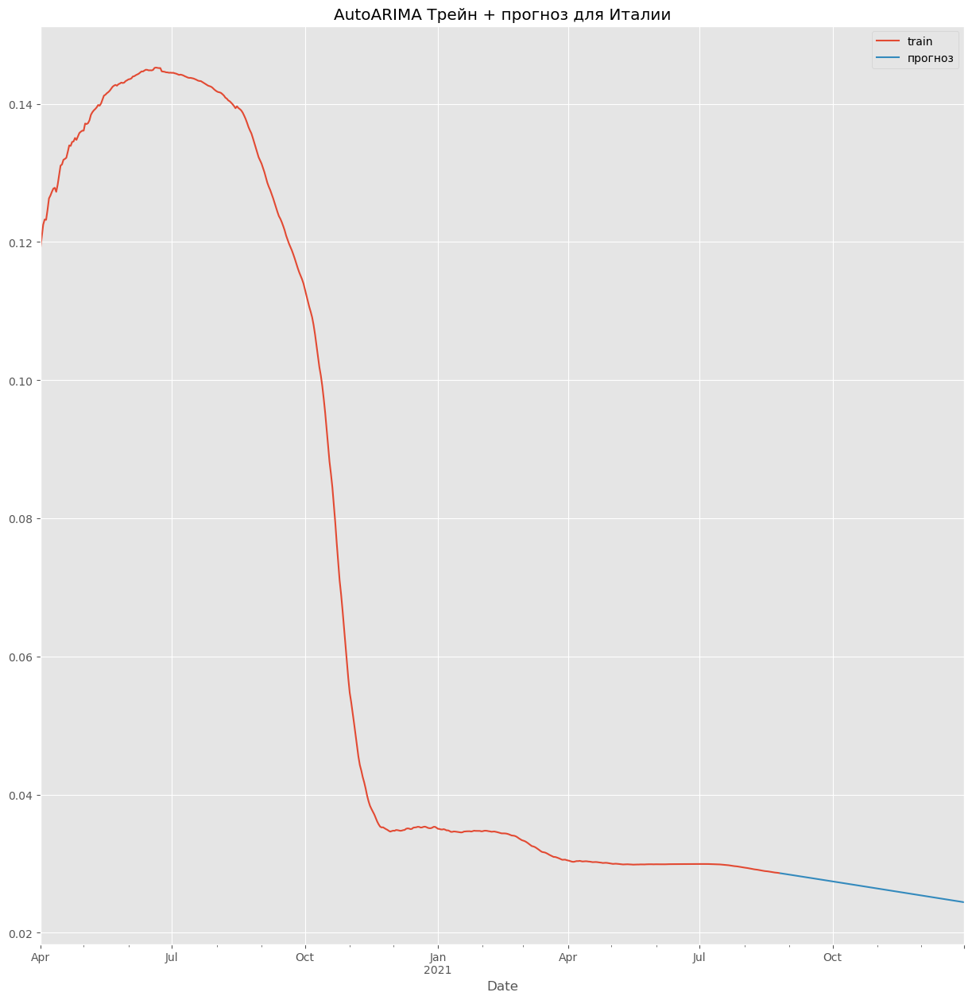

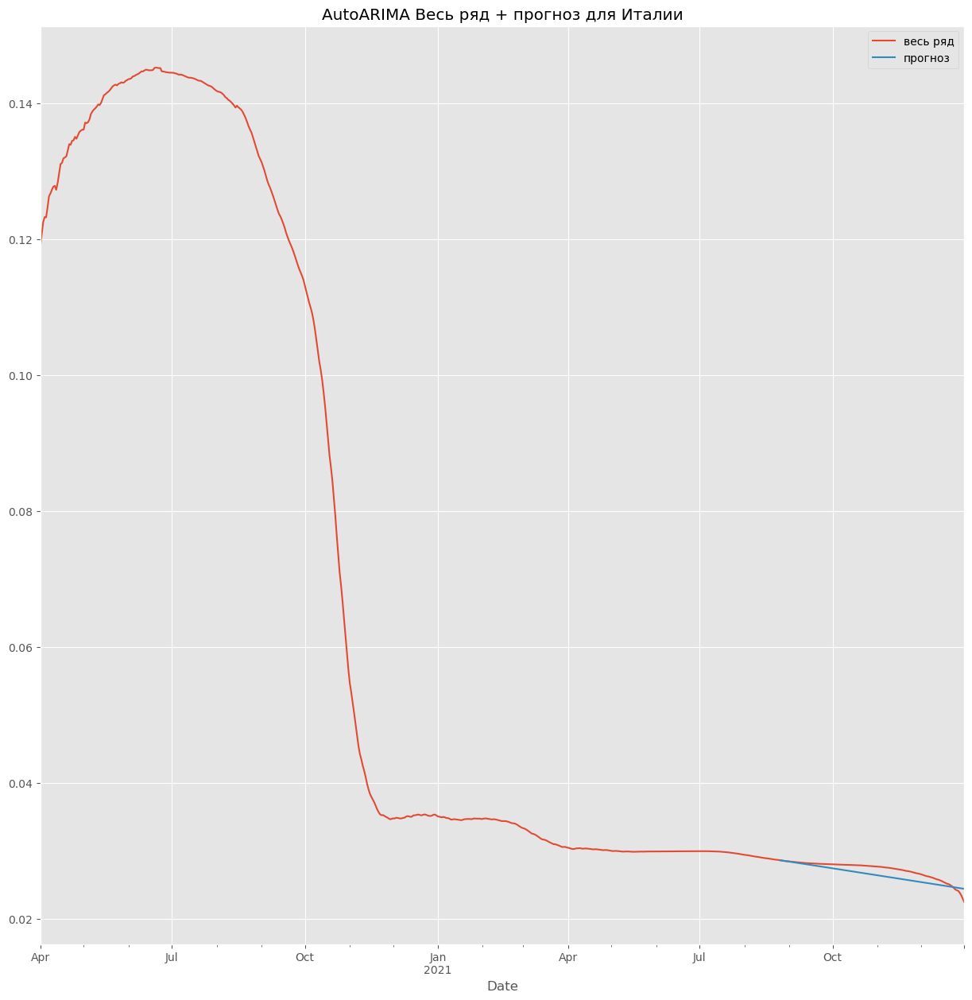

In [163]:
train['Italy'].plot(label='train')
forecast.plot(label='прогноз')
plt.legend()
plt.title('AutoARIMA Трейн + прогноз для Италии')
plt.show()

cfr['Italy'].plot(label='весь ряд')
forecast.plot(label='прогноз')
plt.legend()
plt.title('AutoARIMA Весь ряд + прогноз для Италии')
plt.show()

In [164]:
rmse = RMSE(forecast, test['Italy'])
results.loc['AutoARIMA', 'Italy'] = rmse
print('Italy RMSE =', round(rmse, 5))

Italy RMSE = 0.00091


По результатам автоподбор через Алгоритм Хиндмана-Хандакара для настройки SARIMA показал не плохие результаты, нокогда я руками перебирал для США и для Италии получались ниже метрики, то есть качество предсказания было выше:

Результаты AutoARIMA:
- Russia RMSE = 0.00074
- US RMSE = 0.00483
- Italy RMSE = 0.00091

Мои результаты: 
- Russia SARIMA (2, 1, 1),(0, 1, 1, 7) RMSE = 0.00075
- US SARIMA (1, 1, 1),(1, 0, 1, 7) RMSE = 0.0006
- Italy SARIMA (2, 2, 2),(1, 1, 1, 7) RMSE = 0.00079

Тоесть в итоге авто-подбор все-таки удобен в качестве быстрой отправной точки и проверки, но руками подбирать конечно точнее

#### 3.8. ETS — Экспоненциальное сглаживание (Exponential smoothing) (15 баллов и 15 бонусных баллов)

Задание на основные баллы:

- Поработайте с классом моделей ETS (Exponential smoothing), подробно рассматривавшемся на лекции. Примените ETS(ANN), ETS(AAA) и еще минимум 3 любые (на ваш выбор) модели ETS. Осуществите настройку гиперпараметров во всех моделях. Сравните результаты между ними. Попробуйте объяснить, почему модели показывают такие результаты и такую разницу в результатах. Сделайте выводы.

Задания на бонусные баллы:

- Попробуйте теперь обучить ETS с автоматическим выбором по AIC (`AutoETS` в `sktime`). Что делает этот алгоритм? Что такое AIC? Какие результаты получаются? Сделайте выводы.

- Попробуйте также применить Double exponential smoothing и Triple exponential smoothing. Что это за модели? Какие результаты показывают они? Почему? Сделайте выводы.

- Нарисуйте для наилучшей модели предсказания с доверительным интервалом (если модель выдает его) и наложите их на истинные значения. В `sktime` `ETS` модель не выдает доверительные интервалы сразу, но при желании до них можно дотянуться!

In [ ]:
from sktime.forecasting.exp_smoothing import ExponentialSmoothing
from sktime.forecasting.ets import AutoETS

In [ ]:
# Ваш код здесь

#### 3.9. KTR из orbit (8 бонусных баллов).

Попробуйте использовать модель `KTR` из библиотеки `orbit` для предсказания временных рядов.



In [ ]:
from orbit.models.ktrlite import KTRLite

In [ ]:
# Ваш код здесь

#### 3.10. Библиотека Prophet (10 бонусных баллов)
Попробуйте использовать библиотеку `Prophet` для предсказания временных рядов. [Документация](https://facebook.github.io/prophet/docs/quick_start.html).

Нарисуйте для наилучшей модели предсказания с доверительным интервалом (если модель выдает его) и наложите их на истинные значения.


In [ ]:
from prophet import Prophet

In [ ]:
# Ваш код здесь

#### 3.11. Линейная модель с регрессией (Linear Regression Model) (5 баллов и 10 бонусных баллов)

Примените линейную модель с регрессией для предсказания временных рядов.
Какие признаки оказались наиболее значимыми? Почему? Как вы это интерпретируете? Какие выводы можно сделать?

*Примечание. Это задание идет в тесной связке с заданием 1.8.*



In [ ]:
# Ваш код здесь

#### 3.12. Дополнительная модель (10 бонусных баллов)

Используйте еще одну какую-нибудь любую другую известную вам модель для предсказания временных рядов и заработайте дополнительные бонусные баллы!

In [ ]:
# Ваш код здесь

#### 3.13. Выводы (5 баллов)

Выведите все построенные вами модели на одних осях. Выведите общую сравнительную табличку по всем моделям, которые вы оценивали. Какие выводы вы можете сделать? Какая модель показала себя лучше всего? Как вы думаете почему? Одинаковые ли результаты эффективности получились у моделей на разных временных рядах? Какие итоги вы можете подвести по сравнению моделей друг с другом?


In [165]:
c = 'Russia'
preds = {}

preds['Mean'] = pd.Series(train[c].mean(), index=test[c].index)
start = cfr[c].index.min()
tr = pd.DataFrame({'cfr': train[c].values, 'd': (train[c].index - start).days})
m = smf.ols('cfr ~ d', data=tr).fit()
preds['Linear'] = pd.Series(m.predict(pd.DataFrame({'d': (test[c].index - start).days})).values, index=test[c].index)

for name, order in [('MA(0,0,2)', (0, 0, 2)), ('AR(1,0,0)', (1, 0, 0)),
                    ('ARMA(1,0,1)', (1, 0, 1)), ('ARIMA(2,2,2)', (2, 2, 2))]:
    mm = ARIMA(train[c], order=order).fit()
    preds[name] = pd.Series(mm.get_forecast(len(test[c])).predicted_mean.values, index=test[c].index)

sm = SARIMAX(train[c], order=(0, 1, 0), seasonal_order=(1, 0, 0, 7)).fit(disp=False)
preds['SARIMA'] = pd.Series(sm.get_forecast(len(test[c])).predicted_mean.values, index=test[c].index)

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency i

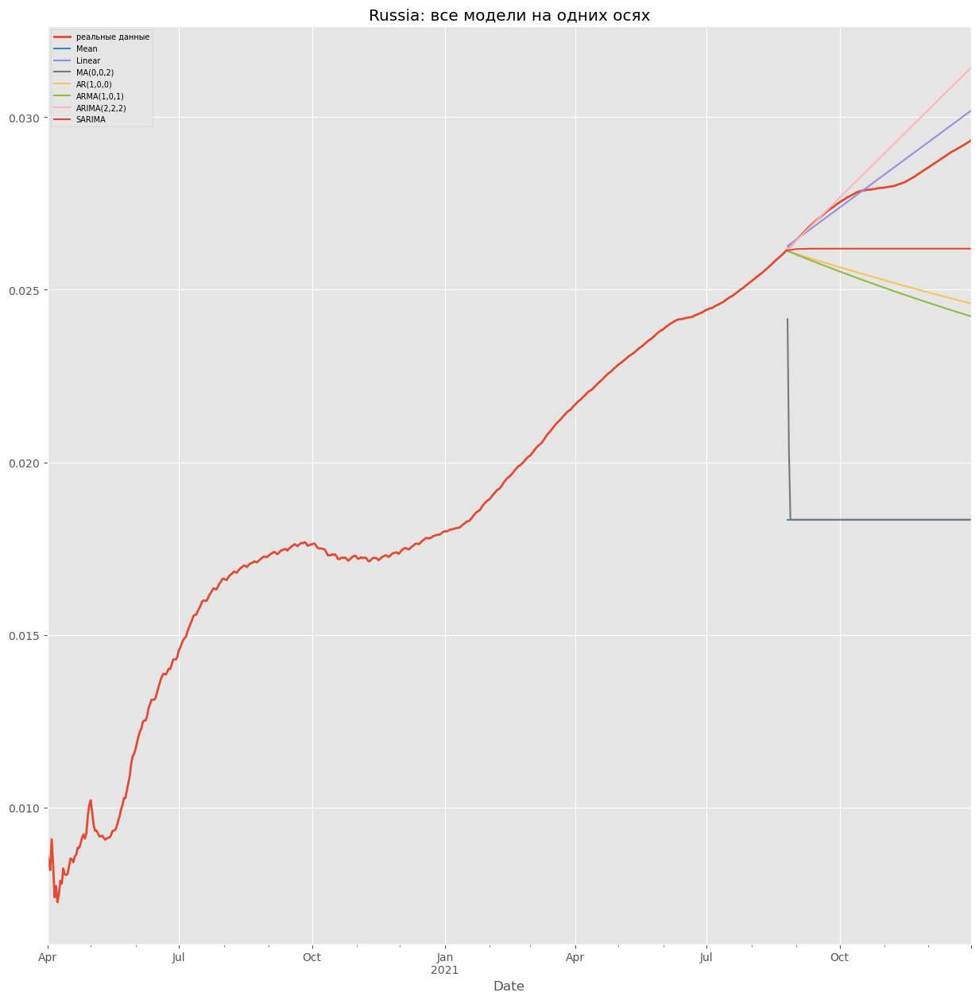

In [166]:
plt.figure()
cfr[c].plot(label='реальные данные', linewidth=2)
for name, fc in preds.items():
    fc.plot(label=name)
plt.legend(fontsize=7)
plt.title('Russia: все модели на одних осях')
plt.show()

In [167]:
c = 'US'
preds = {}

preds['Mean'] = pd.Series(train[c].mean(), index=test[c].index)
start = cfr[c].index.min()
tr = pd.DataFrame({'cfr': train[c].values, 'd': (train[c].index - start).days})
m = smf.ols('cfr ~ d', data=tr).fit()
preds['Linear'] = pd.Series(m.predict(pd.DataFrame({'d': (test[c].index - start).days})).values, index=test[c].index)

for name, order in [('MA(0,0,2)', (0, 0, 2)), ('AR(1,0,0)', (1, 0, 0)),
                    ('ARMA(1,0,2)', (1, 0, 2)), ('ARIMA(1,1,1)', (1, 1, 1))]:
    mm = ARIMA(train[c], order=order).fit()
    preds[name] = pd.Series(mm.get_forecast(len(test[c])).predicted_mean.values, index=test[c].index)

sm = SARIMAX(train[c], order=(1, 1, 1), seasonal_order=(1, 0, 1, 7)).fit(disp=False)
preds['SARIMA'] = pd.Series(sm.get_forecast(len(test[c])).predicted_mean.values, index=test[c].index)

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency i

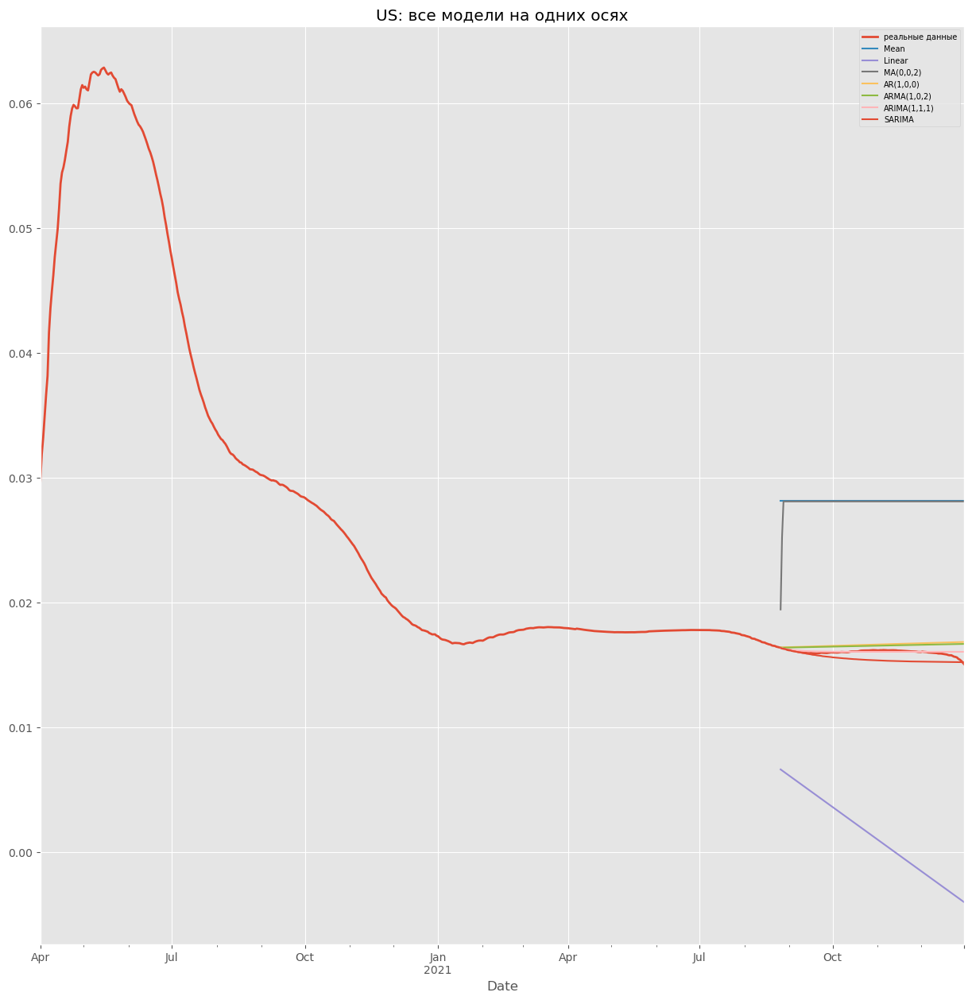

In [168]:
plt.figure()
cfr[c].plot(label='реальные данные', linewidth=2)
for name, fc in preds.items():
    fc.plot(label=name)
plt.legend(fontsize=7)
plt.title('US: все модели на одних осях')
plt.show()

In [169]:
c = 'Italy'
preds = {}

preds['Mean'] = pd.Series(train[c].mean(), index=test[c].index)
start = cfr[c].index.min()
tr = pd.DataFrame({'cfr': train[c].values, 'd': (train[c].index - start).days})
m = smf.ols('cfr ~ d', data=tr).fit()
preds['Linear'] = pd.Series(m.predict(pd.DataFrame({'d': (test[c].index - start).days})).values, index=test[c].index)

for name, order in [('MA(0,0,1)', (0, 0, 1)), ('AR(1,0,0)', (1, 0, 0)),
                    ('ARMA(1,0,1)', (1, 0, 1)), ('ARIMA(2,1,1)', (2, 1, 1))]:
    mm = ARIMA(train[c], order=order).fit()
    preds[name] = pd.Series(mm.get_forecast(len(test[c])).predicted_mean.values, index=test[c].index)

sm = SARIMAX(train[c], order=(2, 2, 2), seasonal_order=(1, 1, 1, 7)).fit(disp=False)
preds['SARIMA'] = pd.Series(sm.get_forecast(len(test[c])).predicted_mean.values, index=test[c].index)

/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/home/ml/miniforge3/envs/ml/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency i

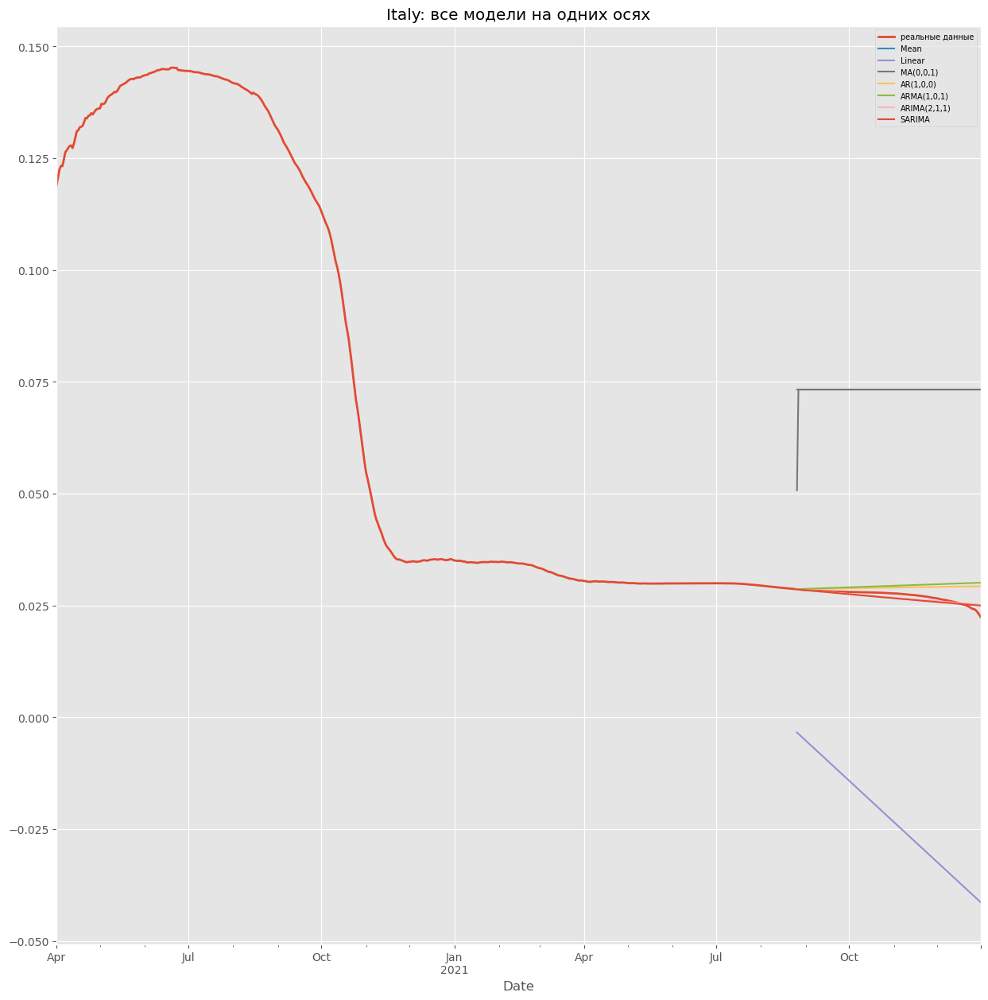

In [170]:
plt.figure()
cfr[c].plot(label='реальные данные', linewidth=2)
for name, fc in preds.items():
    fc.plot(label=name)
plt.legend(fontsize=7)
plt.title('Italy: все модели на одних осях')
plt.show()

Простые модели среднего и среднего скользящего рисуют почти плоскую линию и часто не на той высоте и сам тренд они не ловят и поэтому работают хуже всех.
Линейная угадала только у России, так как там летальность продолжала расти, а у США и Италии укатилась вниз, аж в минус, потому что там ряд вышел на плато, ну вообщем пока тренд не меняется линейная неплохо себя показывает.
ARIMA, SARIMA и автоподбор держатся ближе всего к реальным данным на всех странах и у них самый маленький RMSE.

В любом случае результаты на разных рядах разные, например, Россия довольно лёгкий ряд, так как там даже линейная модель справилась, а Италия — сложный, так как там простые модели вообще не попадают в ряд. 

## Выводы по работе (5 баллов)

Напишите итоговые выводы по всему проделанному исследованию. С какими данными (временными рядами) вам понравилось работать, а с какими нет? Какие модели показались вам простыми и удобными, а какие менее понравились? Выявили ли вы какие-то закономерности в применимости моделей? Если в ходе работы, вы пробовали где-то разные варианты, разные подходы, и это не попало в описание предыдущих действий, опишите их тут. Что можно сказать в целом о том, как мы решили задачу, изначально поставленную перед нами? Подведите окончательные итоги.

Основной итог по работе такой: ряды все были разные и динамика у них довольно сильно отличалась, как по мне приятнее всего было работать с Россией, а вот Италия довольно сложная сама по себе, так как там летальность резко падала и потом вставала на плато, и на этом многие модели спотыкались и не давали хороший результат. Меньше всего понравились данные о выздоровевших, потому что они в какой-то момент просто перестали обновляться, и мы на них особо не могли опереться, да и в целом было очень интересно посмотреть на процент выздоровления и очень обидно, что это не получилось посмотреть между странами и сравнить.

По моделям картина получилась в целом наверное ожидаемая, так как Mean и линейная являются самыми простыми и понятными, но и самые слабые, потому что среднее рисует плоскую линию, а прямая нормально работает, только пока тренд не меняется (на США и Италии она вообще уехала в минус). Чистые MA и AR тоже не показали вау результат, а вот ARIMA и SARIMA понравились больше всего, но их подольше настраивать, но именно они дали лучший результат, потому что они умеют продолжать тренд, учитывать сезонность и т.д. Ещё удобным оказался автоподбор параметров, хотя руками местами выходило даже точнее.

Выявили ли вы какие-то закономерности в применимости моделей? Да, например, то, что модель надо подбирать под характер ряда если есть тренд, нужна интегрирующая часть d, а вот, например, сезонность на гладком ряде почти ничего не дала, так как явных пиков было не видно. 

В целом хоть и сложно было работать с временным рядом и там много разных зависимостей и правил, вообщем не так просто как с обычными данными, но в целом довольно интересно получилось, особенно на данных о пандемии